## Evaluation & Exploration

In [153]:
import pandas as pd
import torch
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
from sentence_transformers import SentenceTransformer, LoggingHandler, losses, models, util
from sentence_transformers.readers import InputExample
from sentence_transformers.evaluation import EmbeddingSimilarityEvaluator

### Explore data

In [23]:
# prepare corpus
dataset = pd.read_csv('./data/raw_data.csv')
dataset.shape

(17055, 5)

In [174]:
# basic corpus analysis
corpus_label_counts = dataset.value_counts(['label'])
corpus_label_counts

label            
restaurant-search    3042
movie-search         2669
flight-search        2293
music-search         1527
pizza-order          1376
coffee-order         1260
movie-ticket         1213
auto-repair-appt     1098
food-order           1009
ride-book             997
restaurant-book       571
dtype: int64

In [243]:
# generate per-label data for cleaning
for label in corpus_label_counts.index.tolist():
    label = label[0]
    df = dataset[dataset['label'] == label]
    df.to_csv("data_" + label+".csv")

#### Issues reported for each label's data:

1. auto-repair-appt: difference between "my car has an issue" vs. "my car has an issue please help book an appointment for it". Some dialogues (e.g. "looks like my maintenance lights are on" need inference to know that user actually wants a car appointment. How does an ML model learn that?). 10% corruption rate

2. coffee-order: 6% corruption rate
3. food-order: to make similar queries more explicit, cleaned out things like "I wanna get some food" (could be both food-order, or restaurant reservation, or restaurant-search). Also eliminated things like "That sounds great, I'll order two." Since we only look at single query and not dialog context.

general other issues: 
- hypothetical dialogues are very flowery, real dialog assistant dialogues are much more curt

Potential ideas:
1. use QA/websearch model: what user asks is strongly correlated to world knowledge, e.g. JLo => music
2. use inference model: e.g. "I'm hungry => find restaurants"

### Data Split

In [267]:
clean_data_labels = ['auto-repair-appt', 'coffee-order', 'flight-search', 'food-order', 'hotel-search', 'movie-search', 'music-search', 'ride-book']

In [380]:
train_samples, dev_samples, test_samples = [], [], []
for f in clean_data_labels:
    filename = "./data/clean_csv/data_" + f + ".csv"
    df = pd.read_csv(filename)[:900]
    train_samples.append(df[:300])  
    dev_samples.append(df[300 : 350])
    test_samples.append(df[350:])
train_corpus = pd.concat(train_samples)
dev_corpus = pd.concat(dev_samples)
test_corpus = pd.concat(test_samples)
print("train corpus size: ", train_corpus.shape)
print("dev corpus size: ", dev_corpus.shape)
print("test corpus size: ", test_corpus.shape)

train corpus size:  (2400, 4)
dev corpus size:  (400, 4)
test corpus size:  (4400, 4)


In [296]:
# create training sentence pairs
train_pair_corpus = []
train_corpus = train_corpus.sample(frac=1) # randomize order first
# first, create similar pairs
for label in clean_data_labels:
    same_label_data = train_corpus[train_corpus['label'] == label].reset_index(drop=True)
    utterance_list = same_label_data['utterance']
    for i in range(len(utterance_list) - 1):
        for j in range(i + 1, len(utterance_list)):
            utter1, utter2 = utterance_list[i], utterance_list[j]
            if (utter1 != utter2):
                inp_example = InputExample(texts=[utter1, utter2], label=1.0)   # TODO: should we use baseline model score as similarity score?
                train_pair_corpus.append(inp_example)
    print(len(train_pair_corpus))
num_sim_pairs = len(train_pair_corpus)
print("Number of similar pairs in training data: ", num_sim_pairs)
# then, create dissimilar pairs
for idx in range(len(clean_data_labels) - 1):
    same_label_data = train_corpus[train_corpus['label'] == clean_data_labels[idx]].reset_index(drop=True)[:180]
    diff_label_data = train_corpus[train_corpus['label'].isin(clean_data_labels[idx + 1:])].reset_index(drop=True)[:180]
    for utter1 in same_label_data['utterance']:
        for utter2 in diff_label_data['utterance']:
            inp_example = InputExample(texts=[utter1, utter2], label=0.2)   # TODO: should we use baseline model score as similarity score?
            train_pair_corpus.append(inp_example)
train_pair_corpus = pd.Series(train_pair_corpus).sample(frac=1)
print("Number of dissimilar pairs in training data: ", len(train_pair_corpus) - num_sim_pairs)
print("total training data size: ", len(train_pair_corpus))

44850
89700
134550
179400
224250
269100
313950
358800
Number of similar pairs in training data:  358800
Number of similar pairs in training data:  226800
total training data size:  585600


In [297]:
# create dev sentence pairs
dev_pair_corpus = []
dev_corpus = dev_corpus.sample(frac=1) # randomize order first
# first, create similar pairs
for label in clean_data_labels:
    same_label_data = dev_corpus[dev_corpus['label'] == label].reset_index(drop=True)
    utterance_list = same_label_data['utterance']
    for i in range(len(utterance_list) - 1):
        for j in range(i + 1, len(utterance_list)):
            utter1, utter2 = utterance_list[i], utterance_list[j]
            if (utter1 != utter2):
                inp_example = InputExample(texts=[utter1, utter2], label=1.0)   # TODO: should we use baseline model score as similarity score?
                dev_pair_corpus.append(inp_example)
    print(len(dev_pair_corpus))
num_sim_dev_pairs = len(dev_pair_corpus)
print("Number of similar pairs in dev data: ", num_sim_dev_pairs)
# then, create dissimilar pairs
for idx in range(len(clean_data_labels) - 1):
    same_label_data = dev_corpus[dev_corpus['label'] == clean_data_labels[idx]].reset_index(drop=True)[:25]
    diff_label_data = dev_corpus[dev_corpus['label'].isin(clean_data_labels[idx + 1:])].reset_index(drop=True)[:25]
    for utter1 in same_label_data['utterance']:
        for utter2 in diff_label_data['utterance']:
            inp_example = InputExample(texts=[utter1, utter2], label=0.2)   # TODO: should we use baseline model score as similarity score?
            dev_pair_corpus.append(inp_example)
dev_pair_corpus = pd.Series(dev_pair_corpus).sample(frac=1)
print("Number of dissimilar pairs in dev data: ", len(dev_pair_corpus) - num_sim_dev_pairs)
print("total validation data size: ", len(dev_pair_corpus))

1225
2450
3675
4900
6125
7350
8575
9800
Number of similar pairs in dev data:  9800
Number of similar pairs in dev data:  4375
total validation data size:  14175


In [298]:
print(train_pair_corpus[100])

<InputExample> label: 1.0, texts: Hey can you schedule an appointment for my car?; Hi, please book me an appointment with Intelligent Auto Solutions to get my oil change and tires rotated.


In [381]:
test_corpus = test_corpus.reset_index(drop=True)
print(test_corpus.shape)
test_corpus.head(5)

(4400, 4)


,instruction_id,conversation_id,utterance,label
0,auto-repair-appt-1,dlg-58095eee-6729-4135-a762-17e89af2c8a9,I need a car appointment.,auto-repair-appt
1,auto-repair-appt-1,dlg-58bed34b-8598-4a8a-bbaf-f15e3c186c5f,"Hi, I need you to book me an appointment at In...",auto-repair-appt
2,auto-repair-appt-1,dlg-5931b427-2a17-452a-b193-b122f86aa5c0,"Assistant, please schedule car maintence with ...",auto-repair-appt
3,auto-repair-appt-1,dlg-59356fc3-b351-4881-ad72-9cbb21c43004,I need to make an appointment to have my car f...,auto-repair-appt
4,auto-repair-appt-1,dlg-59b3eb21-a59c-4af5-a644-b2198cf59676,I need to make a car repair appointment with I...,auto-repair-appt


In [382]:
# special test - pizza order corpus
test_pizza_corpus = pd.read_csv("./data/clean_csv/data_pizza-order.csv")[:550]
test_pizza_corpus = test_pizza_corpus.reset_index(drop=True)
test_pizza_corpus.head(5)

,instruction_id,conversation_id,utterance,label
0,pizza-ordering-2,dlg-0013673c-31c6-4565-8fac-810e173a5c53,I want to order a pizza from Bertuccis in Chel...,pizza-order
1,pizza-ordering-2,dlg-001d8bb1-6f25-4ecd-986a-b7eeb5fa4e19,Hi I'd like to order two large pizzas.,pizza-order
2,pizza-ordering-2,dlg-0034fae9-a3bc-4a0b-b0c7-127f16e5dcb1,I would like to order something from Bosses Pi...,pizza-order
3,pizza-ordering-2,dlg-003a10c4-9fdd-47da-bd56-1439c6acb37c,I want to order a pizza.,pizza-order
4,pizza-ordering-2,dlg-0053c980-6339-4df1-86ce-e2442205d970,Hey I'd like to order some pizza from papa johns.,pizza-order


In [383]:
test_corpus = pd.concat([test_corpus, test_pizza_corpus]).reset_index(drop=True)
test_corpus.shape

(4950, 4)

### Knowledge Testing

Premise: does having world knowledge on entities help improve performance of model? 

In [429]:
import spacy
spacy_model = spacy.load("en_core_web_sm")

In [446]:
masking_map = {
 'EVENT': 'entity0',
 'FAC': 'entity1',
 'GPE': 'entity2',
 'LOC': 'entity3',
 'NORP': 'entity4',
 'ORG': 'entity5',
 'PERSON': 'entity6',
 'PRODUCT': 'entity7',
 'WORK_OF_ART': 'entity8'}

In [456]:
def mask_entity(u):
    doc = spacy_model(u)
    idxs = [0]
    masks = []
    ret = ""
    for ent in doc.ents:
        if ent.label_ in masking_map:
            idxs.append(ent.start_char)
            idxs.append(ent.end_char)
            masks.append(masking_map[ent.label_])
    if (len(idxs) > 1 and len(masks) > 0):
        for i in range(0, len(idxs) - 1, 2):
            ret = ret + u[idxs[i] : idxs[i + 1]] + masks[int(i / 2)]
        ret += u[idxs[-1] :]
        return ret
    else :
        return u

In [459]:
train_corpus['utterance'] = train_corpus['utterance'].apply(mask_entity)
test_corpus['utterance'] = test_corpus['utterance'].apply(mask_entity)

### Model Evaluation

In [417]:
# load baseline model
baseline_model = SentenceTransformer('paraphrase-distilroberta-base-v1')
test_corpus_embeddings = baseline_model.encode(test_corpus['utterance'].tolist(), convert_to_tensor=True)
test_corpus_embeddings.shape

In [225]:
# or, use custom model
# crude_model = SentenceTransformer('./models/crude')
# test_corpus_embeddings = crude_model.encode(test_corpus['utterance'].tolist(), convert_to_tensor=True)

In [391]:
# or, use custom model
finetune_model = SentenceTransformer('./models/finetune')
test_corpus_embeddings = finetune_model.encode(test_corpus['utterance'].tolist(), convert_to_tensor=True)
test_corpus_embeddings.shape

torch.Size([4950, 768])

In [384]:
# # or, use custom model
# finetune_model = SentenceTransformer('./models/qa')
# test_corpus_embeddings = finetune_model.encode(test_corpus['utterance'].tolist(), convert_to_tensor=True)
# test_corpus_embeddings.shape

torch.Size([4950, 768])

In [419]:
test_corpus_dist = test_corpus['label'].value_counts()
test_corpus_dist

coffee-order        550
ride-book           550
movie-search        550
pizza-order         550
flight-search       550
hotel-search        550
music-search        550
food-order          550
auto-repair-appt    550
Name: label, dtype: int64

In [420]:
# Find the closest k sentences of the corpus for each query sentence based on cosine similarity
top_k = 550 # is this something we should tune for? Currently try to capture all possible results
# top_k = min(5, len(corpus))
results = []
for i in range(len(test_corpus)):
#     query_embedding = baseline_model.encode(query, convert_to_tensor=True)
    query_embedding = test_corpus_embeddings[i]
    query = test_corpus['utterance'][i]

    # We use cosine-similarity and torch.topk to find the highest 5 scores
    cos_scores = util.pytorch_cos_sim(query_embedding, test_corpus_embeddings)[0]
    top_results = torch.topk(cos_scores, k=top_k, sorted=True) # top one query is input itself
    print(cos_scores.shape)
    print(top_results[0].shape)
    results.append(top_results)

    print("\n\n======================\n\n")
    print("Query:", query)
    
    print("\nTop 5 most similar sentences in corpus:")
    for score, idx in zip(top_results[0][:5], top_results[1][:5]):
        print(score, idx.item())
        print(test_corpus['utterance'][idx.item()], "(Score: {:.4f})".format(score))
    
    print("\nTop 5 least similar sentences in corpus:")
    for score, idx in zip(top_results[0][-4:], top_results[1][-4:]):
        print(test_corpus['utterance'][idx.item()], "(Score: {:.4f})".format(score))

print(len(results))

torch.Size([4950])
torch.Size([550])




Query: I need a car appointment.

Top 5 most similar sentences in corpus:
tensor(1.0000) 0
I need a car appointment. (Score: 1.0000)
tensor(0.9266) 226
I need an appointment for my car. (Score: 0.9266)
tensor(0.9073) 277
I need a appointment for my car asap. (Score: 0.9073)
tensor(0.8798) 16
Hello, I need to make a car appointment. (Score: 0.8798)
tensor(0.8749) 510
Hi I want a car appointment (Score: 0.8749)

Top 5 least similar sentences in corpus:
Hey. My car is messed up, can I bring it in sometime soon? (Score: 0.4478)
Hi, I'd like you to schedule an appointment for me at Intelligent Auto Solutions (Score: 0.4475)
My name is Jasmine Lee and my phone number is 717-495-1111. I am calling to book a car for tonight to pick me up at a restaurant at 7pm and take me and my guest to see a movie. (Score: 0.4474)
Please go to the Intelligent Auto Solutions website and book an appointment for me. (Score: 0.4473)
torch.Size([4950])
torch.Size([550])




tensor(0.9624) 286
Hello, I need to make a car appointment please. (Score: 0.9624)
tensor(0.9105) 127
Hi I need to make an appointment for my car. (Score: 0.9105)
tensor(0.9084) 99
Hi, I need to make an appointment for my car please. (Score: 0.9084)
tensor(0.9002) 261
Hello, I need to set up an appointment for my car. (Score: 0.9002)

Top 5 least similar sentences in corpus:
Hello Assistant, I need you to order a ride for me please (Score: 0.4589)
Hey, I need to book an Uber ride (Score: 0.4588)
Hi, I need to place some order for take out. (Score: 0.4587)
Hi. I need to schedule a flight from New York City. (Score: 0.4586)
torch.Size([4950])
torch.Size([550])




Query: I want you to make me an appointment at my regular auto repair shop. 

Top 5 most similar sentences in corpus:
tensor(1.) 17
I want you to make me an appointment at my regular auto repair shop.  (Score: 1.0000)
tensor(0.8557) 122
Hi there, I need to make an appointment with an auto repair shop. (Score: 0.8557)
tensor(0.8

torch.Size([4950])
torch.Size([550])




Query: HI I need to book an appointment with Intelligent Auto Solutions

Top 5 most similar sentences in corpus:
tensor(1.0000) 27
HI I need to book an appointment with Intelligent Auto Solutions (Score: 1.0000)
tensor(0.9273) 214
I need to book an appointment with Intelligent Auto Solutions. (Score: 0.9273)
tensor(0.9268) 477
Hi I need to make an appointment with Intelligent Auto Solutions (Score: 0.9268)
tensor(0.9264) 395
I need to book an appointment at Intelligent Auto Solutions. (Score: 0.9264)
tensor(0.9058) 221
I need you to book an appointment with Intelligent Auto Solutions. (Score: 0.9058)

Top 5 least similar sentences in corpus:
i want an Uber ride (Score: 0.3339)
I want to order a ride. (Score: 0.3332)
I would like for you to order me an Uber.  (Score: 0.3332)
I want to order a pizza for pickup at Papa Johns (Score: 0.3332)
torch.Size([4950])
torch.Size([550])




Query: My car is squealing when I come to stop at a stoplight. I nee

torch.Size([4950])
torch.Size([550])




Query: Hey assistant I need to schedule an appointment at the auto shop.

Top 5 most similar sentences in corpus:
tensor(1.0000) 38
Hey assistant I need to schedule an appointment at the auto shop. (Score: 1.0000)
tensor(0.7805) 282
Hi, I need to schedule an appointment with an auto mechanic. (Score: 0.7805)
tensor(0.7663) 532
Good Morning I need an appointment at a auto mechanic shop. (Score: 0.7663)
tensor(0.7639) 122
Hi there, I need to make an appointment with an auto repair shop. (Score: 0.7639)
tensor(0.7614) 309
Hey, Assistant, could you schedule an auto shop appointment for me? (Score: 0.7614)

Top 5 least similar sentences in corpus:
Hi. I would like to have a ride to get to a coffee shop. (Score: 0.3973)
Hey. Will you go to the website for Intelligent Auto Solutions and make an appointment for me? (Score: 0.3968)
Hi Assistant, I'd like to order a drink from Starbucks. (Score: 0.3968)
Hey, can you make an appointment for me at Intellige

torch.Size([4950])
torch.Size([550])




Query: Hey! Could you go online and make an appointment for me to take my car to Intelligent Auto Solutions?

Top 5 most similar sentences in corpus:
tensor(1.0000) 50
Hey! Could you go online and make an appointment for me to take my car to Intelligent Auto Solutions? (Score: 1.0000)
tensor(0.8869) 129
Hey can you make an appointment with Intelligent Auto Solutions for my car? (Score: 0.8869)
tensor(0.8798) 75
Hello, Could I get an appointment for my car at Intelligent Auto Solutions? (Score: 0.8798)
tensor(0.8725) 382
Hey. Will you go to the website for Intelligent Auto Solutions and make an appointment for me? (Score: 0.8725)
tensor(0.8629) 51
Hey! Can you call Intelligent Auto Solutions and make an appointment for me? (Score: 0.8629)

Top 5 least similar sentences in corpus:
pick me up in a car (Score: 0.4037)
Hey there. I need to get my car in to the shop to get it looked at. (Score: 0.4032)
Hi I'd like to book an appointment at my local me

torch.Size([4950])
torch.Size([550])




Query: Haley, the Lexus is not letting me close all doors with the autolock. Can you please get me an appointment at Intelligent Auto Solutions.

Top 5 most similar sentences in corpus:
tensor(1.0000) 69
Haley, the Lexus is not letting me close all doors with the autolock. Can you please get me an appointment at Intelligent Auto Solutions. (Score: 1.0000)
tensor(0.5720) 489
Haley, our Honda Civic is making a noise. Can you please get me an appointment at Intelligent Auto Solutions. (Score: 0.5720)
tensor(0.5607) 167
Hey, assistant. I need car to be serviced. Could you book an appointment at Intelligent Auto Solutions for me? (Score: 0.5607)
tensor(0.5594) 284
Can you book me an appointment at Intelligent Auto Solutions. (Score: 0.5594)
tensor(0.5467) 79
Hi. Will you make me an appointment with Intelligent Auto Solutions? (Score: 0.5467)

Top 5 least similar sentences in corpus:
I need to make an appointment to have my car looked at. (Score: 0.32

tensor(0.9698) 497
Hey, can you book an appointment for me at Intelligent Auto Solutions? (Score: 0.9698)
tensor(0.9588) 158
Hello, can you book an appointment for me at Intelligent Auto Solutions? (Score: 0.9588)
tensor(0.9570) 92
Hi can you book me an appointment with Intelligent Auto Solutions? (Score: 0.9570)
tensor(0.9387) 284
Can you book me an appointment at Intelligent Auto Solutions. (Score: 0.9387)

Top 5 least similar sentences in corpus:
Could you get my car into the shop please? It needs some attention. (Score: 0.3778)
Hi, Can you order me some Starbucks for pickup? (Score: 0.3777)
Hey, Can you help me find a hotel in Salem? (Score: 0.3777)
I need to book an appointment to get my car looked at. (Score: 0.3775)
torch.Size([4950])
torch.Size([550])




Query: Hey Donna, I'm driving right now can you make me a car appointment?

Top 5 most similar sentences in corpus:
tensor(1.0000) 85
Hey Donna, I'm driving right now can you make me a car appointment? (Score: 1.0000)
tensor(0

tensor(0.7888) 283
I want to book an appointment for my car (Score: 0.7888)
tensor(0.7862) 178
Assistant, can you book me an appointment for the car? (Score: 0.7862)

Top 5 least similar sentences in corpus:
Hi, Greg. I need to make an auto repair appointment. (Score: 0.4195)
Hello, I'm in need of auto repair service, and would like to make an appointment. (Score: 0.4194)
Hi, are you able to request an Uber for me? (Score: 0.4194)
I need an appointment with Intelligent Auto Solution (Score: 0.4191)
torch.Size([4950])
torch.Size([550])




Query: Hi, I need to make an appointment for my car please.

Top 5 most similar sentences in corpus:
tensor(1.) 99
Hi, I need to make an appointment for my car please. (Score: 1.0000)
tensor(0.9441) 127
Hi I need to make an appointment for my car. (Score: 0.9441)
tensor(0.9344) 529
Hi, I need you to make an appointment for my car. (Score: 0.9344)
tensor(0.9337) 286
Hello, I need to make a car appointment please. (Score: 0.9337)
tensor(0.9084) 16
Hello

torch.Size([4950])
torch.Size([550])




Query: Hi. I'm having a problem with my car. Can you schedule an appointment with a mechanic for me, please?

Top 5 most similar sentences in corpus:
tensor(1.0000) 110
Hi. I'm having a problem with my car. Can you schedule an appointment with a mechanic for me, please? (Score: 1.0000)
tensor(0.9033) 5
Hey, I'm having some problems with my car on my way to work right now. Can you call and make an appointment with the mechanic for me? (Score: 0.9033)
tensor(0.8657) 89
Hello, can you please make me an appointment with the mechanic for my car? (Score: 0.8657)
tensor(0.8596) 97
Hey, can you arrange an appointment with a car mechanic for me? (Score: 0.8596)
tensor(0.8339) 120
Can you schedule a mechanic appointment for my car? (Score: 0.8339)

Top 5 least similar sentences in corpus:
Hello assistant. Please schedule a ride pick-up for me. (Score: 0.4144)
Hey Marco, could you order a Lyft ride for me? (Score: 0.4143)
Hey do you mind calling me an Uber

torch.Size([4950])
torch.Size([550])




Query: Hi there, I need to make an appointment with an auto repair shop.

Top 5 most similar sentences in corpus:
tensor(1.0000) 122
Hi there, I need to make an appointment with an auto repair shop. (Score: 1.0000)
tensor(0.9140) 531
I need an appointment at an auto repair shop, please. (Score: 0.9140)
tensor(0.8557) 17
I want you to make me an appointment at my regular auto repair shop.  (Score: 0.8557)
tensor(0.8283) 467
Hello I wanto to book an appointment to an auto repair shop (Score: 0.8283)
tensor(0.8223) 338
Hello, I need an auto repair appointment. (Score: 0.8223)

Top 5 least similar sentences in corpus:
I would like to schedule an appointment with Intelligent Auto Solutions (Score: 0.4031)
Hello. I'm needing to order a takeout for one person. I need to open some gyros. (Score: 0.4021)
Hello, I need a ride can you order me a car? (Score: 0.4016)
Hey, I need you to order me an Uber. (Score: 0.4014)
torch.Size([4950])
torch.Size([550])



torch.Size([4950])
torch.Size([550])




Query: Please schedule me an appointment to get my car fixed. 

Top 5 most similar sentences in corpus:
tensor(1.0000) 133
Please schedule me an appointment to get my car fixed.  (Score: 1.0000)
tensor(0.8959) 443
I need you to schedule an appointment to get my car fixed please (Score: 0.8959)
tensor(0.8758) 379
Hey, I need you to schedule an appointment for my car to be fixed. (Score: 0.8758)
tensor(0.8620) 465
Hey I need to make an appointment to get my car fixed (Score: 0.8620)
tensor(0.8575) 154
I need to schedule an appointment to get my car repaired. (Score: 0.8575)

Top 5 least similar sentences in corpus:
Hey Could you make me an appointment at Intelligent Auto Solutions? (Score: 0.3948)
hey assistant can you book a taxi for my trip (Score: 0.3943)
Can you make me an appointment at Intelligent Auto Solutions? (Score: 0.3940)
Hey my steering wheel is suddenly shaking. Can you please call a mechanic and see if I can bring it in? (Score: 0.

tensor(0.8633) 186
Hi I need to get my car into the repair shop (Score: 0.8633)
tensor(0.8589) 170
Sally, I need to get my car in the shop. (Score: 0.8589)
tensor(0.8398) 357
Hey, I need to get my car into the shop relatively soon. (Score: 0.8398)

Top 5 least similar sentences in corpus:
Hi, I would like to order a ride please. Are there any cars available? (Score: 0.3922)
Hello, I need a flight. (Score: 0.3920)
I need an Uber (Score: 0.3918)
Hey Joe, I need to get my Civic looked at. (Score: 0.3915)
torch.Size([4950])
torch.Size([550])




Query: Hi, I need to make an appointmen at an auto repair shop "intelligent Auto Solutions"

Top 5 most similar sentences in corpus:
tensor(1.0000) 147
Hi, I need to make an appointmen at an auto repair shop "intelligent Auto Solutions" (Score: 1.0000)
tensor(0.7696) 25
I need to make an auto repair appointment at Intelligent Auto Solutions. (Score: 0.7696)
tensor(0.7298) 4
I need to make a car repair appointment with Intelligent Auto Solutions (Sc

torch.Size([4950])
torch.Size([550])




Query: Hello, can you book an appointment for me at Intelligent Auto Solutions?

Top 5 most similar sentences in corpus:
tensor(1.) 158
Hello, can you book an appointment for me at Intelligent Auto Solutions? (Score: 1.0000)
tensor(0.9854) 497
Hey, can you book an appointment for me at Intelligent Auto Solutions? (Score: 0.9854)
tensor(0.9588) 84
Hey! Can you book me an appointment at Intelligent Auto Solutions? (Score: 0.9588)
tensor(0.9495) 444
Hey, can you make an appointment for me at Intelligent Auto Solutions? (Score: 0.9495)
tensor(0.9477) 92
Hi can you book me an appointment with Intelligent Auto Solutions? (Score: 0.9477)

Top 5 least similar sentences in corpus:
I'd like to schedule an appointment for my car. (Score: 0.3827)
Hey, I need you to make an appointment to get my car looked at (Score: 0.3825)
Hey, could you place a coffee order for me for pick-up? (Score: 0.3825)
I need to make an auto repair appointment. (Score: 0.3819)
torc

torch.Size([4950])
torch.Size([550])




Query: Sally, I need to get my car in the shop.

Top 5 most similar sentences in corpus:
tensor(1.0000) 170
Sally, I need to get my car in the shop. (Score: 1.0000)
tensor(0.8896) 524
I need to bring the car into the shop. (Score: 0.8896)
tensor(0.8589) 146
Hi I need to bring my car in to the shop (Score: 0.8589)
tensor(0.8277) 445
Hey there. I need to get my car in to the shop to get it looked at. (Score: 0.8277)
tensor(0.8273) 357
Hey, I need to get my car into the shop relatively soon. (Score: 0.8273)

Top 5 least similar sentences in corpus:
I need an Uber from 533 E. Center St. Milwaukee, WI 53212 to North Downer Ave. (Score: 0.3766)
Hi, I'm going to need to place a pick up order for Starbucks. (Score: 0.3762)
I need you to order a drink for me at one of the nearby coffee shops. (Score: 0.3759)
Hi there Personal Assistant, it's Liana. I need you to help me set up an appointment for my car at Intelligent Auto Solutions. (Score: 0.3759)
torch

torch.Size([4950])
torch.Size([550])




Query: Hi, I need to make an appointment to have my car looked at

Top 5 most similar sentences in corpus:
tensor(1.0000) 185
Hi, I need to make an appointment to have my car looked at (Score: 1.0000)
tensor(0.9558) 412
I need to make an appointment to have my car looked at (Score: 0.9558)
tensor(0.9526) 219
Hello, I need to make an appointment for my car to be looked at  (Score: 0.9526)
tensor(0.9497) 378
I need to make an appointment to have my car looked at. (Score: 0.9497)
tensor(0.9288) 428
Hi, I need to book an appointment to get my car looked at. (Score: 0.9288)

Top 5 least similar sentences in corpus:
Hi, I need to get a ride please. (Score: 0.4067)
I need to order a ride pick up. (Score: 0.4067)
Hey, I need to book an Uber ride (Score: 0.4065)
Hey, Tim. Can you schedule me an appointment at Intelligent Auto Solutions? (Score: 0.4063)
torch.Size([4950])
torch.Size([550])




Query: Hi I need to get my car into the repair shop

Top 5 mos

torch.Size([4950])
torch.Size([550])




Query: Hi assistant. My car was damaged when I drove over a pothole. The steering wheel is turning weird. I need to have it repaired.

Top 5 most similar sentences in corpus:
tensor(1.0000) 198
Hi assistant. My car was damaged when I drove over a pothole. The steering wheel is turning weird. I need to have it repaired. (Score: 1.0000)
tensor(0.7209) 118
Hello, I need to take my car to get it repaired. (Score: 0.7209)
tensor(0.7177) 506
Hi, I need to get my car repaired. (Score: 0.7177)
tensor(0.7101) 393
I need to get my car repaired. (Score: 0.7101)
tensor(0.6935) 392
Hey, Assistant. I need to get my car fixed. (Score: 0.6935)

Top 5 least similar sentences in corpus:
I need to get a taxi. (Score: 0.2943)
I need a lyft please. (Score: 0.2932)
Hey there, I need a favor please. (Score: 0.2932)
Hi! I need a car for this afternoon. Can you order it? (Score: 0.2932)
torch.Size([4950])
torch.Size([550])




Query: Hey Susie, my car's been acting weir

torch.Size([4950])
torch.Size([550])




Query: I need my flat tire fixed at Intelligent Auto Solutions.

Top 5 most similar sentences in corpus:
tensor(1.0000) 211
I need my flat tire fixed at Intelligent Auto Solutions. (Score: 1.0000)
tensor(0.6809) 463
I need to make an appointment to get my car fixed at Intelligent Auto Solutions (Score: 0.6809)
tensor(0.6652) 25
I need to make an auto repair appointment at Intelligent Auto Solutions. (Score: 0.6652)
tensor(0.6378) 4
I need to make a car repair appointment with Intelligent Auto Solutions (Score: 0.6378)
tensor(0.6184) 239
I'd like to schedule a car repair at Intelligent Auto Solutions. (Score: 0.6184)

Top 5 least similar sentences in corpus:
I need to order a lyft asap! (Score: 0.3056)
Hello, I need a ride to run some errands. (Score: 0.3053)
I need to order a lyft or uber asap (Score: 0.3053)
Hello. I need help finding a hotel. I'm staying in Palm Springs, California. (Score: 0.3051)
torch.Size([4950])
torch.Size([550])




Quer

tensor(0.7650) 148
Please book an appointment for me at Intelligent Auto Solutions. (Score: 0.7650)

Top 5 least similar sentences in corpus:
Hi, looking to book a hotel in Palm Springs, California, please. (Score: 0.2929)
Hi, I want to place an order from Pizza Pro's in Vernon, NJ. (Score: 0.2928)
Hello, Assistant. I need help finding a hotel in Palm Springs, California. I'm going to be staying December 4th through December 7th for two people. (Score: 0.2927)
Hello. I'd like to go to a movie tonight. (Score: 0.2925)
torch.Size([4950])
torch.Size([550])




Query: Hi, I need to book an appointment to get my car windshield replaced.

Top 5 most similar sentences in corpus:
tensor(1.0000) 223
Hi, I need to book an appointment to get my car windshield replaced. (Score: 1.0000)
tensor(0.8373) 229
Hi I need to book an appointment for my car to get repaired. (Score: 0.8373)
tensor(0.8348) 76
Hi, I need to book an appointment for repairing my car. (Score: 0.8348)
tensor(0.8055) 515
Hello, I n

Yo man I need to get my car in (Score: 0.3885)
Hello, can you book an appointment for me at Intelligent Auto Solutions? (Score: 0.3880)
Can you make me an appointment with Intelligent Auto Solutions (Score: 0.3878)
Hello, I need a pickup. (Score: 0.3875)
torch.Size([4950])
torch.Size([550])




Query: HI, JANE CAN YOU KINDLY MAKE AN APPOINTMENT FOR MY CAR? 

Top 5 most similar sentences in corpus:
tensor(1.0000) 234
HI, JANE CAN YOU KINDLY MAKE AN APPOINTMENT FOR MY CAR?  (Score: 1.0000)
tensor(0.5396) 546
I NEED TO BRING MY CAR IN FOR SERVICE. (Score: 0.5396)
tensor(0.5355) 3977
Can you please request a car for me? (Score: 0.5355)
tensor(0.5209) 4337
Hello. Can you order a car for me? (Score: 0.5209)
tensor(0.5162) 4001
Will you order me a car? (Score: 0.5162)

Top 5 least similar sentences in corpus:
I need you to make an appointment for me please. (Score: 0.2797)
Hi, I really need some coffee - can you order me some? (Score: 0.2795)
Hey there. Would you please order me a Caramel Clo

torch.Size([4950])
torch.Size([550])




Query: Hi, I am looking to have my 2010 Jeep Liberty checking for an oil leak at Intelligent Auto Solutions tomorrow at 9:00 AM.

Top 5 most similar sentences in corpus:
tensor(1.0000) 244
Hi, I am looking to have my 2010 Jeep Liberty checking for an oil leak at Intelligent Auto Solutions tomorrow at 9:00 AM. (Score: 1.0000)
tensor(0.4562) 422
Oh dear! I think my car is leaking oil. I need to make an appointment with Intelligent Auto Solutions ASAP I guess. (Score: 0.4562)
tensor(0.4254) 95
Hello, I have an oil leak and need assistance. (Score: 0.4254)
tensor(0.3906) 452
I need to make an appointment to have my Jeep looked at. (Score: 0.3906)
tensor(0.3906) 512
Hey Carrie, I need you to check the availability at Intelligent Auto Solutions for me; there is something not right with my car. (Score: 0.3906)

Top 5 least similar sentences in corpus:
Hey, I'd like to order a pizza from pizza hut (Score: 0.2657)
Yeah, I'm looking for a hotel in Palm Sp

tensor(0.8491) 324
I need to schedule an appointment for my car (Score: 0.8491)

Top 5 least similar sentences in corpus:
Hey, Assistant, could you schedule an auto shop appointment for me? (Score: 0.4004)
hey assistant can you book a taxi for my trip (Score: 0.4001)
Hi. I need to book a hotel room in Palm Springs. (Score: 0.4001)
I need a hotel in Chico, California. (Score: 0.4000)
torch.Size([4950])
torch.Size([550])




Query: Hey, Cheryl, my taillight is out. I need a mechanic.

Top 5 most similar sentences in corpus:
tensor(1.0000) 257
Hey, Cheryl, my taillight is out. I need a mechanic. (Score: 1.0000)
tensor(0.6000) 123
Hey! I need to take my car into a mechanic ASAP. (Score: 0.6000)
tensor(0.5990) 4087
Hey, Assistant. I need a Lyft. (Score: 0.5990)
tensor(0.5916) 517
Hey! I think I need to go to the auto shop. The check engine light keeps coming on and I hear a sputter. Can you help me out? I'm currently driving. (Score: 0.5916)
tensor(0.5884) 279
Hello, I need to take my car t

torch.Size([4950])
torch.Size([550])




Query: Good morning, can you make an appointment for me to get my oil changed?

Top 5 most similar sentences in corpus:
tensor(1.0000) 268
Good morning, can you make an appointment for me to get my oil changed? (Score: 1.0000)
tensor(0.8224) 83
Hello, I would like to schedule an appointment to get an oil change? (Score: 0.8224)
tensor(0.8087) 542
Hi, I'm wondering if I can schedule an appointment for an oil change and tune up? (Score: 0.8087)
tensor(0.6934) 484
Hi, I would like to schedule an appointment for an oil change. (Score: 0.6934)
tensor(0.6592) 536
Hi, I would like to schedule an appointment for my car for an oil change. (Score: 0.6592)

Top 5 least similar sentences in corpus:
Hello, I'd like to have you book an appointment at Intelligent Auto Solutions. (Score: 0.3468)
Hey hun, could you order me a pizza from please? (Score: 0.3464)
Hello. I'd like to see about booking a room in New Orleans. (Score: 0.3463)
Hi I need to schedule an ap

tensor(1.) 282
Hi, I need to schedule an appointment with an auto mechanic. (Score: 1.0000)
tensor(0.8897) 254
I need to schedule an appointment with a car mechanic. (Score: 0.8897)
tensor(0.8675) 26
I need to schedule an appointment with a mechanic. (Score: 0.8675)
tensor(0.8590) 416
I need to schedule a mechanic appointment. (Score: 0.8590)
tensor(0.8251) 367
I need to schedule an appointment for auto repairs. (Score: 0.8251)

Top 5 least similar sentences in corpus:
Good morning, can you make an appointment for me to get my oil changed? (Score: 0.4129)
I need to request a ride. (Score: 0.4128)
Hey, can you book an appointment for me at Intelligent Auto Solutions? (Score: 0.4125)
Hello, we need a ride right now. (Score: 0.4123)
torch.Size([4950])
torch.Size([550])




Query: I want to book an appointment for my car

Top 5 most similar sentences in corpus:
tensor(1.0000) 283
I want to book an appointment for my car (Score: 1.0000)
tensor(0.9140) 202
Hey I need to book an appointment f

tensor(0.6662) 343
Hey I need to get my car into the garage. The undercarriage is making a really bad noise. (Score: 0.6662)
tensor(0.6298) 470
Hello, I need to bring my car in for some work. (Score: 0.6298)
tensor(0.6213) 279
Hello, I need to take my car to a mechanic. (Score: 0.6213)
tensor(0.6147) 4343
Hey, my car is in the shop and I need a ride. (Score: 0.6147)

Top 5 least similar sentences in corpus:
Hi, I need an appointment scheduled at Intelligent Auto Solutions. (Score: 0.3238)
Hi, I'm looking for a movie to rent at home tonight. (Score: 0.3236)
Hi. I need help finding a movie to go and watch tonight. (Score: 0.3236)
Hey assistant, I'm having a party and need 2 pizzas. (Score: 0.3235)
torch.Size([4950])
torch.Size([550])




Query: Hi, I would like to set an appointment for my car with "Intelligent Auto Solutions".

Top 5 most similar sentences in corpus:
tensor(1.0000) 293
Hi, I would like to set an appointment for my car with "Intelligent Auto Solutions". (Score: 1.0000)
t

tensor(0.7500) 43
Hi, can you schedule an appointment for me at the auto repair shop. (Score: 0.7500)
tensor(0.7249) 346
Hi Sheila, can you book me an appointment at the auto repair shop Intelligent Auto Solutions? (Score: 0.7249)
tensor(0.7155) 263
hello can you please make me an appointment for auto repair? (Score: 0.7155)

Top 5 least similar sentences in corpus:
Hey, my car is in the shop and I need a ride. (Score: 0.3425)
Sandy! I know I just called but I forgot to ask if you could schedule me a tune up for as early as possible today. I want it done at Intelligent Auto Solutions. (Score: 0.3423)
I would like to schedule a car service at Intelligent Auto Solutions (Score: 0.3422)
Hi! I need a car for this afternoon. Can you order it? (Score: 0.3418)
torch.Size([4950])
torch.Size([550])




Query: I need you to call Intelligent Auto Solutions and see when I can get them to look at my car.

Top 5 most similar sentences in corpus:
tensor(1.0000) 306
I need you to call Intelligent Auto

torch.Size([4950])
torch.Size([550])




Query: I would like to schedule an appointment with a car mechanic at Intelligent Auto Solutions.

Top 5 most similar sentences in corpus:
tensor(1.0000) 318
I would like to schedule an appointment with a car mechanic at Intelligent Auto Solutions. (Score: 1.0000)
tensor(0.8760) 433
I would like to schedule an appointment at Intelligent Auto Solutions. (Score: 0.8760)
tensor(0.8625) 329
Hi, I would like to schedule an appointment with Intelligent Auto Solutions. (Score: 0.8625)
tensor(0.8552) 494
I would like to schedule an appointment with Intelligent Auto Solutions. (Score: 0.8552)
tensor(0.8519) 42
I would like to schedule an appointment with Intelligent Auto Solutions (Score: 0.8519)

Top 5 least similar sentences in corpus:
Hi, I need to bring my car in for repair. (Score: 0.4045)
I would like to find a hotel room. (Score: 0.4042)
I am calling to book a car for tonight to pick me up at a restaurant and take me home. (Score: 0.4035)
Hi, I'd 

tensor(0.7594) 423
Hey! I need you to schedule an appointment for me to have my car looked at.  (Score: 0.7594)
tensor(0.7594) 428
Hi, I need to book an appointment to get my car looked at. (Score: 0.7594)
tensor(0.7554) 407
Hi, I was wondering if you could help me set up appointment to get my car looked at. (Score: 0.7554)

Top 5 least similar sentences in corpus:
Hello, I need to find a movie. (Score: 0.3979)
Hello, I need an Uber. (Score: 0.3977)
I need to schedule an appointment at Intelligent Auto Solutions (Score: 0.3975)
Mark, I need to schedule an appointment to find out why the check engine light is on in the Fiesta. (Score: 0.3973)
torch.Size([4950])
torch.Size([550])




Query: i need to take my car into the shop, its being kinda weird

Top 5 most similar sentences in corpus:
tensor(1.0000) 331
i need to take my car into the shop, its being kinda weird (Score: 1.0000)
tensor(0.8383) 524
I need to bring the car into the shop. (Score: 0.8383)
tensor(0.8197) 170
Sally, I need t

tensor(0.7785) 301
Hey, can you make an appointment for my vehicle? (Score: 0.7785)
tensor(0.7221) 165
Hello I would like to schedule an appointment for my vehicle.  (Score: 0.7221)
tensor(0.7030) 354
Hello, will you schedule an appointment for my car to be looked at?  (Score: 0.7030)
tensor(0.6933) 101
I need to schedule an appointment for my vehicle (Score: 0.6933)

Top 5 least similar sentences in corpus:
Hello I need a ride (Score: 0.4320)
Hi, I need an Uber (Score: 0.4319)
Mark, I need to schedule an appointment to find out why the check engine light is on in the Fiesta. (Score: 0.4317)
Hi, I want to get an Uber please. (Score: 0.4313)
torch.Size([4950])
torch.Size([550])




Query: Hi Sheila, can you book me an appointment at the auto repair shop Intelligent Auto Solutions?

Top 5 most similar sentences in corpus:
tensor(1.0000) 346
Hi Sheila, can you book me an appointment at the auto repair shop Intelligent Auto Solutions? (Score: 1.0000)
tensor(0.8678) 242
Hey Robert, can you 

tensor(0.9131) 549
Hey I need to get my car fixed (Score: 0.9131)
tensor(0.8995) 393
I need to get my car repaired. (Score: 0.8995)
tensor(0.8778) 506
Hi, I need to get my car repaired. (Score: 0.8778)
tensor(0.8644) 71
I need to get my car fix please. (Score: 0.8644)

Top 5 least similar sentences in corpus:
My clutch is sticking. I need to take it in to the shop. (Score: 0.3147)
Hi, I need help finding a flight to Miami. (Score: 0.3146)
Hi, I need help finding a movie to rent, please. (Score: 0.3128)
Hello, i need an Uber. (Score: 0.3127)
torch.Size([4950])
torch.Size([550])




Query: Hey I think my transmission is starting to go out. Will you get on Intelligent Auto Solutions website and see if you can make me an appointment immediately?

Top 5 most similar sentences in corpus:
tensor(1.0000) 360
Hey I think my transmission is starting to go out. Will you get on Intelligent Auto Solutions website and see if you can make me an appointment immediately? (Score: 1.0000)
tensor(0.6248) 

tensor(0.6989) 153
Hey, can you set up an appointment for me to have my car looked at this week? (Score: 0.6989)
tensor(0.6911) 238
Hi, can I schedule an appointment for my car to get fixed? (Score: 0.6911)

Top 5 least similar sentences in corpus:
Can you order me a ride from work? (Score: 0.3222)
Hi! I need you to take care of ordering a pizza for me from Pizzeria Place. (Score: 0.3216)
Hey, I was wondering if you can get me an Uber? (Score: 0.3216)
Hello assistant. Please schedule a ride pick-up for me. (Score: 0.3213)
torch.Size([4950])
torch.Size([550])




Query: Hi, I need to get my car into the shop ASAP! It is backfiring all of the sudden.

Top 5 most similar sentences in corpus:
tensor(1.) 373
Hi, I need to get my car into the shop ASAP! It is backfiring all of the sudden. (Score: 1.0000)
tensor(0.7842) 357
Hey, I need to get my car into the shop relatively soon. (Score: 0.7842)
tensor(0.7291) 365
Hi there. I need you to help me get my car into the shop ASAP. (Score: 0.7291)


tensor(0.8376) 24
Hi, I have some problem with my car. Can you schedule an appointment at Intelligent Auto Solutions for my car? (Score: 0.8376)
tensor(0.8355) 107
Hi, my car is having a problem. Can you schedule an appointment for my car with Intelligent Auto Solutions? (Score: 0.8355)

Top 5 least similar sentences in corpus:
Hello, can you book an Uber for me? (Score: 0.3943)
Hi, it’s me. Can you book me an Uber please? (Score: 0.3941)
Hello assistant. I need help finding a hotel in Palm Springs, California. Can you help me? (Score: 0.3935)
Hi, I need to order an Uber please. (Score: 0.3935)
torch.Size([4950])
torch.Size([550])




Query: I need to take my car to the car repair shop.

Top 5 most similar sentences in corpus:
tensor(1.0000) 388
I need to take my car to the car repair shop. (Score: 1.0000)
tensor(0.8866) 186
Hi I need to get my car into the repair shop (Score: 0.8866)
tensor(0.8616) 544
I need to take my car to the mechanic. (Score: 0.8616)
tensor(0.8132) 64
My car is 

tensor(0.9065) 405
I need to get my car looked at. (Score: 0.9065)
tensor(0.7587) 413
I need to book an appointment to get my car looked at. (Score: 0.7587)
tensor(0.7575) 378
I need to make an appointment to have my car looked at. (Score: 0.7575)
tensor(0.7486) 428
Hi, I need to book an appointment to get my car looked at. (Score: 0.7486)

Top 5 least similar sentences in corpus:
I need a lyft ride for today. (Score: 0.3222)
Hi. I want to look for a hotel. (Score: 0.3221)
Hey Johnny I need an UberX. (Score: 0.3221)
Hello. I need help finding a movie to see with my spouse. (Score: 0.3220)
torch.Size([4950])
torch.Size([550])




Query: Hello Carmen, How are you? Can you call Intelligent Auto Solutions and try to get my car in the shop tomorrow afternoon? My 2014 Honda Pilot is making crazy noises when it is in park?

Top 5 most similar sentences in corpus:
tensor(1.) 404
Hello Carmen, How are you? Can you call Intelligent Auto Solutions and try to get my car in the shop tomorrow aftern

torch.Size([4950])
torch.Size([550])




Query: I need an appointment with Intelligent Auto Solutions for my car.

Top 5 most similar sentences in corpus:
tensor(1.0000) 418
I need an appointment with Intelligent Auto Solutions for my car. (Score: 1.0000)
tensor(0.9185) 490
I need to make an appointment for my car at Intelligent Auto Solutions (Score: 0.9185)
tensor(0.9101) 73
I need to make an appointment for my car at Intelligent Auto Solutions. (Score: 0.9101)
tensor(0.9088) 322
Hey, I need to book an appointment with Intelligent Auto Solutions for my car. (Score: 0.9088)
tensor(0.8813) 513
I need to make a car service appointment with Intelligent Auto Solutions. (Score: 0.8813)

Top 5 least similar sentences in corpus:
Hey I need an appointment please. (Score: 0.3877)
I need to hire an Uber. (Score: 0.3876)
I'm leaving my company party early. Can you order a car for me? (Score: 0.3873)
Hi There, there is some noise under the hood of my car. I need to get it in the shop. Can you hel

tensor(0.6477) 164
Hello Google! I need for you to book me an appointment with Intelligent Auto Solutions quickly! My car is overheating. (Score: 0.6477)
tensor(0.6473) 317
Hi, I'm calling for a car appointment at "Intelligent Auto Solutions". (Score: 0.6473)
tensor(0.6378) 290
Hello, I'm calling to make a car appointment at "Intelligent Auto Solutions". (Score: 0.6378)

Top 5 least similar sentences in corpus:
Hi, can you order a car ride for me? (Score: 0.3422)
Hi Assistant, I'd like to hear some music by Cyndi Lauper. (Score: 0.3417)
Hi assistant, I want to go to the movies. (Score: 0.3415)
Hey can you schedule an appointment for my car check (Score: 0.3413)
torch.Size([4950])
torch.Size([550])




Query: I would like to schedule an appointment at Intelligent Auto Solutions.

Top 5 most similar sentences in corpus:
tensor(1.0000) 433
I would like to schedule an appointment at Intelligent Auto Solutions. (Score: 1.0000)
tensor(0.9887) 494
I would like to schedule an appointment with 

torch.Size([4950])
torch.Size([550])




Query: Hey, my car is acting up and I need you to contact the shop to see if they can get it in.

Top 5 most similar sentences in corpus:
tensor(1.0000) 447
Hey, my car is acting up and I need you to contact the shop to see if they can get it in. (Score: 1.0000)
tensor(0.7258) 365
Hi there. I need you to help me get my car into the shop ASAP. (Score: 0.7258)
tensor(0.7256) 445
Hey there. I need to get my car in to the shop to get it looked at. (Score: 0.7256)
tensor(0.7229) 468
My car isn't acting right. I need you to call a mechanic. (Score: 0.7229)
tensor(0.7020) 197
Could you get my car into the shop please? It needs some attention. (Score: 0.7020)

Top 5 least similar sentences in corpus:
Hey, can you order me a Lyft? (Score: 0.3621)
Hey there, could you order me a Lyft? (Score: 0.3621)
I need to book a Lyft to pick me up from the airport. (Score: 0.3618)
Hey, can you help me book a Lyft? (Score: 0.3614)
torch.Size([4950])
torch.Size([550])


tensor(0.7261) 289
Hi, my car is having car troubles, can you schedule an appointment at Intelligent Auto Solutions? (Score: 0.7261)
tensor(0.7235) 262
Hi, I have a problem with my car. Can you make an appointment for fixing my car with Intelligent Auto Solutions? (Score: 0.7235)
tensor(0.7215) 45
I need to take my car to get it fixed. Can you get me an appointment? (Score: 0.7215)
tensor(0.7213) 107
Hi, my car is having a problem. Can you schedule an appointment for my car with Intelligent Auto Solutions? (Score: 0.7213)

Top 5 least similar sentences in corpus:
Hi, I need a taxi service. (Score: 0.3679)
Hey, can you get a car to pick me up from the Mayfaire movie theater in Wilmington NC? (Score: 0.3658)
I would like a car in Atlanta. (Score: 0.3642)
Hi Katie, please have a car ready for me downstairs as soon as possible. (Score: 0.3642)
torch.Size([4950])
torch.Size([550])




Query: Hello, Chelsea? I'm driving right now but could you make an appointment for my car?

Top 5 most simi

tensor(0.7901) 548
Can you make an auto repair appointment (Score: 0.7901)
tensor(0.7790) 349
Hi, can you please schedule an auto appointment for my car? (Score: 0.7790)

Top 5 least similar sentences in corpus:
I need you to make an appointment for me please. (Score: 0.3786)
Hey, can you send a Lyft to come pick me up? (Score: 0.3780)
I need to schedule an appointment for my car to perform its brakes. (Score: 0.3779)
Hey, can you put in an order for me at Starbucks? (Score: 0.3777)
torch.Size([4950])
torch.Size([550])




Query: I have alot of warning lights on including my check engine light. I need to take it in for service

Top 5 most similar sentences in corpus:
tensor(1.0000) 476
I have alot of warning lights on including my check engine light. I need to take it in for service (Score: 1.0000)
tensor(0.6299) 41
Mark, I need to schedule an appointment to find out why the check engine light is on in the Fiesta. (Score: 0.6299)
tensor(0.6211) 517
Hey! I think I need to go to the auto

tensor(1.0000) 489
Haley, our Honda Civic is making a noise. Can you please get me an appointment at Intelligent Auto Solutions. (Score: 1.0000)
tensor(0.6177) 383
Haley, I was driving the company's Chevy Traverse and the check engine light started flashing. It's a new car. Can you make an appointment at the Intelligent Auto Solutions? (Score: 0.6177)
tensor(0.6020) 404
Hello Carmen, How are you? Can you call Intelligent Auto Solutions and try to get my car in the shop tomorrow afternoon? My 2014 Honda Pilot is making crazy noises when it is in park? (Score: 0.6020)
tensor(0.5854) 157
Hi, sorry if I don't sound the clearest, I'm driving. I've been noticing a jerking sensation from my car when braking; I think it may be the transmission. Can you please make an appointment to see the mechanic for me? (Score: 0.5854)
tensor(0.5751) 483
hi I'm driving and my car is making a weird noise can you make a repair appointment for me (Score: 0.5751)

Top 5 least similar sentences in corpus:
Hey As

Hey, I need to schedule an appointment at Intelligent Auto Solutions (Score: 0.9464)
tensor(0.9354) 460
Hello, I need to schedule an appointment at Intelligent Auto Solutions (Score: 0.9354)
tensor(0.8961) 477
Hi I need to make an appointment with Intelligent Auto Solutions (Score: 0.8961)

Top 5 least similar sentences in corpus:
Assistant, I'd like to order a car to go grocery shopping. (Score: 0.3317)
HI i want to order a pizza from pizza hut (Score: 0.3314)
Hey, I need to order pizza. (Score: 0.3312)
I'd like to order an Uber ride. (Score: 0.3310)
torch.Size([4950])
torch.Size([550])




Query: I need you to schedule an appointment at the repair shop for me.

Top 5 most similar sentences in corpus:
tensor(1.0000) 502
I need you to schedule an appointment at the repair shop for me. (Score: 1.0000)
tensor(0.9485) 479
hey i need you to schedule me an appointment at a repair shop (Score: 0.9485)
tensor(0.8392) 17
I want you to make me an appointment at my regular auto repair shop.  (Sc

torch.Size([4950])
torch.Size([550])




Query: I need to make a car service appointment with Intelligent Auto Solutions.

Top 5 most similar sentences in corpus:
tensor(1.) 513
I need to make a car service appointment with Intelligent Auto Solutions. (Score: 1.0000)
tensor(0.9014) 4
I need to make a car repair appointment with Intelligent Auto Solutions (Score: 0.9014)
tensor(0.8953) 25
I need to make an auto repair appointment at Intelligent Auto Solutions. (Score: 0.8953)
tensor(0.8835) 241
I need to make an appointment with Intelligent Auto Solutions asap. (Score: 0.8835)
tensor(0.8813) 418
I need an appointment with Intelligent Auto Solutions for my car. (Score: 0.8813)

Top 5 least similar sentences in corpus:
My car was driving a bit weird this morning. Can you set up an appointment for me? (Score: 0.3853)
Hey my car is having a stutter call the mechanic for me. (Score: 0.3853)
I want to order an Uber ride (Score: 0.3852)
Hey cindy I need to order a pizza (Score: 0.3842)
torch.S

tensor(0.9191) 181
Hi, I need to make an appointment with Intelligent Auto Solutions. (Score: 0.9191)

Top 5 least similar sentences in corpus:
I would like to place an order from Empire (Score: 0.3316)
I would like help finding a hotel in New Orleans. (Score: 0.3314)
Hey, can you make an appointment for my car? (Score: 0.3311)
I need to set up an appointment to get my brakes looked at (Score: 0.3310)
torch.Size([4950])
torch.Size([550])




Query: Hi, I need you to make an appointment for my car.

Top 5 most similar sentences in corpus:
tensor(1.) 529
Hi, I need you to make an appointment for my car. (Score: 1.0000)
tensor(0.9399) 137
Hello.I need you to make me an appointment for for car. (Score: 0.9399)
tensor(0.9344) 99
Hi, I need to make an appointment for my car please. (Score: 0.9344)
tensor(0.9343) 127
Hi I need to make an appointment for my car. (Score: 0.9343)
tensor(0.9166) 116
Hey, I need you to make an appointment to get my car looked at (Score: 0.9166)

Top 5 least simila

torch.Size([4950])
torch.Size([550])




Query: Hello. I need to bring my car in for service.

Top 5 most similar sentences in corpus:
tensor(1.0000) 545
Hello. I need to bring my car in for service. (Score: 1.0000)
tensor(0.9121) 470
Hello, I need to bring my car in for some work. (Score: 0.9121)
tensor(0.8321) 11
Hi, I need to bring my car in for repair. (Score: 0.8321)
tensor(0.8227) 279
Hello, I need to take my car to a mechanic. (Score: 0.8227)
tensor(0.7915) 3918
Hello, I need to request a car please. (Score: 0.7915)

Top 5 least similar sentences in corpus:
Hey I need an appointment please. (Score: 0.4395)
Hey Donna, can you order a car for me? (Score: 0.4395)
Hi I need a lyft. (Score: 0.4393)
Hello. I need to order breakfast burritos. (Score: 0.4393)
torch.Size([4950])
torch.Size([550])




Query: I NEED TO BRING MY CAR IN FOR SERVICE.

Top 5 most similar sentences in corpus:
tensor(1.0000) 546
I NEED TO BRING MY CAR IN FOR SERVICE. (Score: 1.0000)
tensor(0.7630) 545
Hello. I n

torch.Size([4950])
torch.Size([550])




Query: Can you help me order a drink at Starbucks?

Top 5 most similar sentences in corpus:
tensor(1.0000) 557
Can you help me order a drink at Starbucks? (Score: 1.0000)
tensor(0.9309) 633
Can you order me a drink from Starbucks? (Score: 0.9309)
tensor(0.9056) 982
Will you order me a drink from Starbucks? (Score: 0.9056)
tensor(0.8960) 886
Can you order a coffee drink from Starbucks for me? (Score: 0.8960)
tensor(0.8910) 1083
Hey, can you order a drink from Starbucks for me? (Score: 0.8910)

Top 5 least similar sentences in corpus:
Hi there, will you order a ride for me please? (Score: 0.4346)
hey can you help me order a cab (Score: 0.4344)
Hi, could you help me with my take out order what I can get for me and my friends? (Score: 0.4335)
Hey, I need to get an Uber. Are you able to get one for me? (Score: 0.4332)
torch.Size([4950])
torch.Size([550])




Query: I would like to place an order at Pete's.

Top 5 most similar sentences in corpus:
ten

tensor(1.0000) 570
I need to get some Starbucks. (Score: 1.0000)
tensor(0.9075) 785
I need to get some coffee from Starbucks. (Score: 0.9075)
tensor(0.8659) 1085
I want to order some Starbucks. (Score: 0.8659)
tensor(0.8333) 872
I want to get a drink from Starbucks. (Score: 0.8333)
tensor(0.8238) 670
I need Starbucks coffee. (Score: 0.8238)

Top 5 least similar sentences in corpus:
Hey, I need you to order an Uber for me. (Score: 0.4354)
Hey there, I need a favor please. (Score: 0.4352)
I Need you to order me a Pizza. (Score: 0.4352)
I need to book a flight from JFK to Seattle. (Score: 0.4351)
torch.Size([4950])
torch.Size([550])




Query: Hi there, can you order me a coffee from Starbucks??

Top 5 most similar sentences in corpus:
tensor(1.0000) 571
Hi there, can you order me a coffee from Starbucks?? (Score: 1.0000)
tensor(0.9430) 927
Hey can you order me a coffee from Starbucks, please? (Score: 0.9430)
tensor(0.9370) 917
Hello! Could you order me a coffee drink from Starbucks? (Sco

torch.Size([4950])
torch.Size([550])




Query: Hi Rita! I'm going to be rushing to my next meeting and won't have time to wait for my coffee, could you order my coffee order for me from Starbucks, please?

Top 5 most similar sentences in corpus:
tensor(1.0000) 584
Hi Rita! I'm going to be rushing to my next meeting and won't have time to wait for my coffee, could you order my coffee order for me from Starbucks, please? (Score: 1.0000)
tensor(0.6900) 660
Hey, I am going to be on my way to the office soon. Could you order my coffee? (Score: 0.6900)
tensor(0.6886) 1091
Hey there. I'm thinking a coffee sounds appropriate right about now. Can i get you to put in an order for me at Starbucks please? (Score: 0.6886)
tensor(0.6866) 829
Hey, Lia. Could you do me a huge favor? I'm running really late for my meeting, and I just cannot function without coffee. Could you please order me a drink from Starbucks? (Score: 0.6866)
tensor(0.6835) 947
Good morning. Can you order a coffee from Starbucks f

torch.Size([4950])
torch.Size([550])




Query: I would like to order a coffee drink from Starbucks

Top 5 most similar sentences in corpus:
tensor(1.0000) 600
I would like to order a coffee drink from Starbucks (Score: 1.0000)
tensor(0.9542) 565
I would like to order a drink from Starbucks. (Score: 0.9542)
tensor(0.9512) 820
I'd like to order some coffee from Starbucks (Score: 0.9512)
tensor(0.9448) 1086
I would like to order a drink from Starbucks  (Score: 0.9448)
tensor(0.9410) 961
Hello, I'd like to order a coffee drink from Starbucks. (Score: 0.9410)

Top 5 least similar sentences in corpus:
Hi, I'd like to re-order from the same place I had last weekend. (Score: 0.4866)
I would like to request a ride from Lyft. (Score: 0.4864)
I'd like to get a ride in Sacramento with Lyft. (Score: 0.4856)
hi i would like to order a pizza  (Score: 0.4854)
torch.Size([4950])
torch.Size([550])




Query: Hey Google, order me some coffee from Starbucks.

Top 5 most similar sentences in corpus:
tenso

tensor(0.8864) 685
hi i want to order coffee from starbucks  (Score: 0.8864)
tensor(0.8728) 1041
I need to order some coffee from a starbucks (Score: 0.8728)

Top 5 least similar sentences in corpus:
Hi, I'd like to order a pizza from Pizza Hut, please. (Score: 0.4035)
Hello, I want to order from Russo's. (Score: 0.4035)
I want to order a pizza from pizza hut. (Score: 0.4033)
Hello. I want to order a Pizza Hut pizza. (Score: 0.4033)
torch.Size([4950])
torch.Size([550])




Query: Hello, I NEED coffee asap!

Top 5 most similar sentences in corpus:
tensor(1.0000) 617
Hello, I NEED coffee asap! (Score: 1.0000)
tensor(0.8633) 975
I need a coffee, please. (Score: 0.8633)
tensor(0.8525) 728
Good morning! I need some coffee! (Score: 0.8525)
tensor(0.8103) 589
Cynthia, I need coffee!!!! (Score: 0.8103)
tensor(0.7990) 901
I want a coffee (Score: 0.7990)

Top 5 least similar sentences in corpus:
Hello, I need a flight to London, please. (Score: 0.4081)
Hey man, I need a Lyft (Score: 0.4080)
ok i

tensor(1.) 632
I'd like to order a coffee. (Score: 1.0000)
tensor(0.9780) 746
I would like to order a coffee.  (Score: 0.9780)
tensor(0.9752) 893
I'd like to order some coffee (Score: 0.9752)
tensor(0.9728) 889
I would like to order coffee. (Score: 0.9728)
tensor(0.9225) 1088
I would like a coffee. (Score: 0.9225)

Top 5 least similar sentences in corpus:
Hi, I'd like to order a pizza from Bertuccis. (Score: 0.5461)
Hi Assistant, I'd like to order food for take out for one person. I just want breakfast burritos. (Score: 0.5460)
Hello, I'd like to order a large Veggie Supreme pizza please. (Score: 0.5460)
I'd like to order a lamb gyro for one person. (Score: 0.5451)
torch.Size([4950])
torch.Size([550])




Query: Can you order me a drink from Starbucks?

Top 5 most similar sentences in corpus:
tensor(1.0000) 633
Can you order me a drink from Starbucks? (Score: 1.0000)
tensor(0.9732) 982
Will you order me a drink from Starbucks? (Score: 0.9732)
tensor(0.9362) 709
Could you order me a cof

tensor(0.7422) 602
I'm really in the mood for some Starbucks. Can you order me a drink?  (Score: 0.7422)
tensor(0.7158) 909
Hello! I'd like to get a coffee from Starbucks. (Score: 0.7158)
tensor(0.7005) 866
Hi, I'd like to order a drink from Starbucks! (Score: 0.7005)

Top 5 least similar sentences in corpus:
I would like to order a Iced White Chocolate Mocha from s (Score: 0.4351)
Hey Google, order me a coffee drink from peets (Score: 0.4350)
Hi, can you please order me a coffee for pick up? (Score: 0.4347)
Hi can you order a coffee for me please (Score: 0.4342)
torch.Size([4950])
torch.Size([550])




Query: Hi I would like to order a Cappuccino from the Starbucks located at 148 NJ-73, Voorhees Township, NJ 08043

Top 5 most similar sentences in corpus:
tensor(1.0000) 648
Hi I would like to order a Cappuccino from the Starbucks located at 148 NJ-73, Voorhees Township, NJ 08043 (Score: 1.0000)
tensor(0.7537) 781
Hello, I would like to order a Caffè Latte from Starbucks. (Score: 0.7537

torch.Size([4950])
torch.Size([550])




Query: Hi, Can you order me some Starbucks for pickup?

Top 5 most similar sentences in corpus:
tensor(1.0000) 663
Hi, Can you order me some Starbucks for pickup? (Score: 1.0000)
tensor(0.9228) 626
Hey, can you order me a Starbucks, please? (Score: 0.9228)
tensor(0.9053) 1025
Hey, would you mind ordering me some Starbucks for pickup? (Score: 0.9053)
tensor(0.9009) 957
Good morning. Can you order me a drink from Starbucks for pickup? (Score: 0.9009)
tensor(0.8963) 1038
Hi can you order a drink for me from Starbucks to pickup? (Score: 0.8963)

Top 5 least similar sentences in corpus:
Hi, I was wondering if you could help me to place an order for hot dogs for take out. (Score: 0.5245)
Can you order me a car? (Score: 0.5242)
Hey Pete, what's good man, any chance you could call Starbucks and order me an Iced Vanilla bean coconutmilk Latte (Score: 0.5234)
Can you order me a pizza from Red Rock Pizza tonight? (Score: 0.5232)
torch.Size([4950])
torch.Si

torch.Size([4950])
torch.Size([550])




Query: Hey there! How're you this morning? Listen, I've decided I definitely need a great cup of coffee to get my day started!

Top 5 most similar sentences in corpus:
tensor(1.0000) 679
Hey there! How're you this morning? Listen, I've decided I definitely need a great cup of coffee to get my day started! (Score: 1.0000)
tensor(0.8012) 728
Good morning! I need some coffee! (Score: 0.8012)
tensor(0.7772) 712
Hi, I am going to need you to order my coffee for pick up this morning! (Score: 0.7772)
tensor(0.7698) 835
Hi, Its been a long morning and I need you to order me a coffee from Starbucks. (Score: 0.7698)
tensor(0.7437) 899
Good Morning. I need to order a coffee drink from Starbucks to kick off my day. (Score: 0.7437)

Top 5 least similar sentences in corpus:
Hey can I order a drink for there please? (Score: 0.3767)
Hi there, I want to order a drink from Peets on 7th Street in Los Angeles. (Score: 0.3766)
Play some coffee house music for me. (S

torch.Size([4950])
torch.Size([550])




Query: Hi there, I'd like to place a coffee order from Starbucks that I can pick up.

Top 5 most similar sentences in corpus:
tensor(1.0000) 696
Hi there, I'd like to place a coffee order from Starbucks that I can pick up. (Score: 1.0000)
tensor(0.9146) 1046
Hi, I'd like to order a coffee from Starbucks (Score: 0.9146)
tensor(0.9091) 1039
Hi. I'd like to order a coffee drink from Starbucks. (Score: 0.9091)
tensor(0.9078) 1052
Hello, I'd like to order a coffee from Starbucks. (Score: 0.9078)
tensor(0.9026) 928
I'd like to place an order for a coffee drink from Starbucks. (Score: 0.9026)

Top 5 least similar sentences in corpus:
Hello, I would like to order a pizza. (Score: 0.5433)
Hi, I'd like to order 3 burritos. (Score: 0.5430)
Hello Assistant, I would like to place an order for pizza. I'm keen to order something that I have ordered before. Can you help me? (Score: 0.5427)
Hi. I'd like to order a pizza from Marco's. (Score: 0.5420)
torch.Size([

tensor(0.8246) 575
i am looking to order some coffee today (Score: 0.8246)
tensor(0.8193) 793
Hi, I'm calling to order a coffee. (Score: 0.8193)

Top 5 least similar sentences in corpus:
Hi there, I want to a order take out for one. (Score: 0.4684)
Hi. I'm wanting to order a Lyft to pick me up. (Score: 0.4681)
Hey I want to order a pizza from Papa Johns (Score: 0.4680)
Hi, I need an Uber car for this afternoon. (Score: 0.4679)
torch.Size([4950])
torch.Size([550])




Query: Hey would you mind going online to Peets and getting me a coffee.

Top 5 most similar sentences in corpus:
tensor(1.0000) 713
Hey would you mind going online to Peets and getting me a coffee. (Score: 1.0000)
tensor(0.7490) 918
Hey I'd like to pickup a coffee from peets. (Score: 0.7490)
tensor(0.7273) 1017
Hey, I'd like to order a coffee from Peet's Coffee. (Score: 0.7273)
tensor(0.7223) 733
I'd like to order a coffee to pick up at Peets. (Score: 0.7223)
tensor(0.7117) 841
Hi, I want to order some coffee from Peets. 

torch.Size([4950])
torch.Size([550])




Query: Hi could you tell me how much a large coffee is at Starbucks

Top 5 most similar sentences in corpus:
tensor(1.) 729
Hi could you tell me how much a large coffee is at Starbucks (Score: 1.0000)
tensor(0.6941) 904
Hi, can you grab me a coffee from Starbucks? (Score: 0.6941)
tensor(0.6853) 1005
Hey I'm craving coffee, can you do a Starbucks order for me? (Score: 0.6853)
tensor(0.6832) 1021
Hi, can you please order me a Starbucks coffee drink?  (Score: 0.6832)
tensor(0.6793) 792
Hi, can you order a coffee for me at Starbucks. (Score: 0.6793)

Top 5 least similar sentences in corpus:
I would like to order a caffe mocka (Score: 0.3009)
Hello, I want to find out if Napolis in Winter Springs has Pizza? (Score: 0.2997)
I would like to order the Iced Caramel Cloud Macchiato from starbucks. (Score: 0.2983)
I want to order a drink from Starbuck's  (Score: 0.2980)
torch.Size([4950])
torch.Size([550])




Query: I'd like to order a tall caffe mocha pl

torch.Size([4950])
torch.Size([550])




Query: I would like to order a coffee. 

Top 5 most similar sentences in corpus:
tensor(1.0000) 746
I would like to order a coffee.  (Score: 1.0000)
tensor(0.9780) 632
I'd like to order a coffee. (Score: 0.9780)
tensor(0.9694) 889
I would like to order coffee. (Score: 0.9694)
tensor(0.9579) 893
I'd like to order some coffee (Score: 0.9579)
tensor(0.9187) 1088
I would like a coffee. (Score: 0.9187)

Top 5 least similar sentences in corpus:
Hello. I'd like to order some soup for takeout. (Score: 0.5215)
 I know there is a lot on the schedule today but I really need a cup of Starbucks. (Score: 0.5213)
Hi, I'd like to order take out for two people. (Score: 0.5208)
Hello, I'd like to order a pizza for delivery. (Score: 0.5208)
torch.Size([4950])
torch.Size([550])




Query: Hello Samantha, I need you to order a coffee for me.

Top 5 most similar sentences in corpus:
tensor(1.0000) 747
Hello Samantha, I need you to order a coffee for me. (Score: 1.000

tensor(0.8609) 761
I want to order coffee from Starbuck's (Score: 0.8609)

Top 5 least similar sentences in corpus:
Please order a Cappuccino from Starbucks (Score: 0.4385)
Hey can you order me something at Starbucks? (Score: 0.4382)
Hey Stephanie, are you still downtown, could you pick me up some Starbucks? (Score: 0.4382)
Hi, I'd like to find a hotel in the Austin Texas area. (Score: 0.4380)
torch.Size([4950])
torch.Size([550])




Query: Hello, I would like to order a coffee for pickup from Starbucks.

Top 5 most similar sentences in corpus:
tensor(1.0000) 763
Hello, I would like to order a coffee for pickup from Starbucks. (Score: 1.0000)
tensor(0.9252) 1052
Hello, I'd like to order a coffee from Starbucks. (Score: 0.9252)
tensor(0.9213) 560
Hello I would like to order a coffee from Starbucks. (Score: 0.9213)
tensor(0.9070) 1046
Hi, I'd like to order a coffee from Starbucks (Score: 0.9070)
tensor(0.9028) 896
I want to order a Starbucks coffee for pickup. (Score: 0.9028)

Top 5 leas

tensor(1.0000) 779
Hi! Could you place an order for coffee for me? (Score: 1.0000)
tensor(0.9272) 701
Hi, can you please put in a coffee order for me? (Score: 0.9272)
tensor(0.9213) 794
Hey, could you order a coffee for me? (Score: 0.9213)
tensor(0.9173) 656
Hey, can you order a coffee for me? (Score: 0.9173)
tensor(0.9092) 716
Can you order a coffee for me? (Score: 0.9092)

Top 5 least similar sentences in corpus:
I would like to order a drink from Starbucks  (Score: 0.4915)
Hi. I was wondering if you could help me order some Thai food. (Score: 0.4911)
Hey, i am on my way out for a meeting, however i missed my morning coffee. (Score: 0.4906)
Hey Sarah. Would you be able to order me an Uber? (Score: 0.4905)
torch.Size([4950])
torch.Size([550])




Query: I'm thinking a Starbuck's Frappuccino sounds really good right now. What would you say to placing the order for me?

Top 5 most similar sentences in corpus:
tensor(1.0000) 780
I'm thinking a Starbuck's Frappuccino sounds really good ri

tensor(1.0000) 794
Hey, could you order a coffee for me? (Score: 1.0000)
tensor(0.9950) 656
Hey, can you order a coffee for me? (Score: 0.9950)
tensor(0.9623) 877
Hey, can you order me a coffee? (Score: 0.9623)
tensor(0.9418) 716
Can you order a coffee for me? (Score: 0.9418)
tensor(0.9360) 992
Hey could you order me some coffee? (Score: 0.9360)

Top 5 least similar sentences in corpus:
I would like to order a drink from Starbucks  (Score: 0.5180)
Hey, can you order me a pizza from Three Countries Pizza? (Score: 0.5178)
John, could you please order me enough pizza for 10 people? (Score: 0.5176)
Where is the closest Starbucks to me right now? (Score: 0.5173)
torch.Size([4950])
torch.Size([550])




Query: Hi, I need a coffee before that movie.

Top 5 most similar sentences in corpus:
tensor(1.0000) 795
Hi, I need a coffee before that movie. (Score: 1.0000)
tensor(0.7649) 975
I need a coffee, please. (Score: 0.7649)
tensor(0.7261) 728
Good morning! I need some coffee! (Score: 0.7261)
ten

tensor(0.9165) 945
I'd like to get a coffee from Starbucks. (Score: 0.9165)
tensor(0.9126) 963
I would like to order something from Starbucks. (Score: 0.9126)

Top 5 least similar sentences in corpus:
Hi, I'd like to order some pizza. (Score: 0.5384)
I would like to order a Pizza from Dominos. (Score: 0.5382)
Hi Nancy. Can you order a coffee drink for me? (Score: 0.5382)
I will like to order a Caffè Americano. (Score: 0.5381)
torch.Size([4950])
torch.Size([550])




Query: Order a coffee

Top 5 most similar sentences in corpus:
tensor(1.) 811
Order a coffee (Score: 1.0000)
tensor(0.8417) 821
Order a coffee from Starbucks (Score: 0.8417)
tensor(0.8016) 702
Can I order a coffee? (Score: 0.8016)
tensor(0.7744) 593
I need to order a coffee. (Score: 0.7744)
tensor(0.7740) 666
Please order a coffee from Starbucks for me. (Score: 0.7740)

Top 5 least similar sentences in corpus:
Hello I would like to order some starbucks in hickory (Score: 0.3636)
Hello I would like to start my order (Score: 

torch.Size([4950])
torch.Size([550])




Query: HI, I would like to order a coffee drink for pickup please

Top 5 most similar sentences in corpus:
tensor(1.0000) 827
HI, I would like to order a coffee drink for pickup please (Score: 1.0000)
tensor(0.8925) 984
Hi I'd like to order a coffee drink please (Score: 0.8925)
tensor(0.8610) 550
I'd like to place a coffee order for pickup. (Score: 0.8610)
tensor(0.8543) 610
Hello, I would like to order a coffee drink. (Score: 0.8543)
tensor(0.8503) 879
I would like to order a coffee drink (Score: 0.8503)

Top 5 least similar sentences in corpus:
I need you to place an order for me at Starbucks. (Score: 0.5212)
Can you go get me some Starbucks? (Score: 0.5212)
Hello, i would like to order a large cheese pizza (Score: 0.5204)
Hi, I'd like to order some pizza. (Score: 0.5203)
torch.Size([4950])
torch.Size([550])




Query: Hi, I need you to order a coffee for me at Starbucks.

Top 5 most similar sentences in corpus:
tensor(1.) 828
Hi, I need you t

tensor(0.7607) 886
Can you order a coffee drink from Starbucks for me? (Score: 0.7607)
tensor(0.7538) 709
Could you order me a coffee from Starbucks? (Score: 0.7538)

Top 5 least similar sentences in corpus:
hey would you order a pizza for me from the nearest Papa Jhons (Score: 0.4066)
I would like a coffee from Starbuck. (Score: 0.4065)
Will you please order me lunch? (Score: 0.4062)
I would like to order a Coffee from Peets in Folsom (Score: 0.4055)
torch.Size([4950])
torch.Size([550])




Query: Hi, I could use a desert coffee. Could you order me one?

Top 5 most similar sentences in corpus:
tensor(1.0000) 843
Hi, I could use a desert coffee. Could you order me one? (Score: 1.0000)
tensor(0.7821) 587
Hi, I really need some coffee - can you order me some? (Score: 0.7821)
tensor(0.7715) 992
Hey could you order me some coffee? (Score: 0.7715)
tensor(0.7701) 794
Hey, could you order a coffee for me? (Score: 0.7701)
tensor(0.7679) 877
Hey, can you order me a coffee? (Score: 0.7679)

Top 

torch.Size([4950])
torch.Size([550])




Query: Okay Google, order me a drink from Starbucks.

Top 5 most similar sentences in corpus:
tensor(1.0000) 858
Okay Google, order me a drink from Starbucks. (Score: 1.0000)
tensor(0.9025) 601
Hey Google, order me some coffee from Starbucks. (Score: 0.9025)
tensor(0.9003) 874
Hey, Google. Order me a coffee from Starbucks. (Score: 0.9003)
tensor(0.8400) 662
Order me a drink from Starbucks (Score: 0.8400)
tensor(0.8258) 590
OK Google order me a coffee from Starbucks (Score: 0.8258)

Top 5 least similar sentences in corpus:
Hey Donna, I need you to order an Uber for me. (Score: 0.4639)
I'd like to order some food. (Score: 0.4631)
I'd like you to order me a ride for lunch. (Score: 0.4616)
I'm looking to order take out for one person, please. (Score: 0.4615)
torch.Size([4950])
torch.Size([550])




Query: Please get me a Caffe mocha from Starbucks.

Top 5 most similar sentences in corpus:
tensor(1.0000) 859
Please get me a Caffe mocha from Starbucks

torch.Size([4950])
torch.Size([550])




Query: I want to get a drink from Starbucks.

Top 5 most similar sentences in corpus:
tensor(1.0000) 872
I want to get a drink from Starbucks. (Score: 1.0000)
tensor(0.9225) 635
I want to order something from Starbucks. (Score: 0.9225)
tensor(0.9205) 582
I want to order a Starbucks drink. (Score: 0.9205)
tensor(0.9180) 565
I would like to order a drink from Starbucks. (Score: 0.9180)
tensor(0.9134) 652
I want to order a coffee from Starbucks. (Score: 0.9134)

Top 5 least similar sentences in corpus:
Hello, can you order a coffee drink from Peets for me? (Score: 0.4550)
I am feeling a bit exotic today. I want some coffee that just screams I am a bad b!#$% but also says im sweet and warm inside. (Score: 0.4540)
I want to order some pizza from Dominos. (Score: 0.4535)
I would like to place an order at Pete's. (Score: 0.4534)
torch.Size([4950])
torch.Size([550])




Query: Hi I wanna make a drink order?

Top 5 most similar sentences in corpus:
tenso

torch.Size([4950])
torch.Size([550])




Query: I would like to order coffee.

Top 5 most similar sentences in corpus:
tensor(1.0000) 889
I would like to order coffee. (Score: 1.0000)
tensor(0.9728) 632
I'd like to order a coffee. (Score: 0.9728)
tensor(0.9694) 746
I would like to order a coffee.  (Score: 0.9694)
tensor(0.9599) 893
I'd like to order some coffee (Score: 0.9599)
tensor(0.9164) 879
I would like to order a coffee drink (Score: 0.9164)

Top 5 least similar sentences in corpus:
I'd like to order a grande mocha frapachino please. (Score: 0.5318)
I would like to order a pizza from Papa John's. (Score: 0.5317)
Hi, I'd like to reorder the same thing the same food I had last weekend. (Score: 0.5315)
Hello, I'd like to order some food for takeout for one person. I'd actually like to order some soup. (Score: 0.5313)
torch.Size([4950])
torch.Size([550])




Query: I want to order a drink.

Top 5 most similar sentences in corpus:
tensor(1.) 890
I want to order a drink. (Score: 1.0000

torch.Size([4950])
torch.Size([550])




Query: Google, can you order me a coffee drink

Top 5 most similar sentences in corpus:
tensor(1.0000) 902
Google, can you order me a coffee drink (Score: 1.0000)
tensor(0.8582) 552
Can you order me a coffee drink please? (Score: 0.8582)
tensor(0.8511) 658
Hi, can you order me a coffee drink please. (Score: 0.8511)
tensor(0.8356) 566
Hey Google, can you order me a coffee from Starbucks? (Score: 0.8356)
tensor(0.7955) 877
Hey, can you order me a coffee? (Score: 0.7955)

Top 5 least similar sentences in corpus:
Hello. Can you order a car for me? (Score: 0.4191)
Hey, could you take a minute stop at starbucks i'd like a Caffè Mocha (Score: 0.4188)
Hello [Assistant]. Could you place an order with The Pie To Go for me? (Score: 0.4175)
Hey, will you do me a favor an request me an Uber? (Score: 0.4172)
torch.Size([4950])
torch.Size([550])




Query: Hello, I want to order a coffee to pick up before work.

Top 5 most similar sentences in corpus:
tensor(1

torch.Size([4950])
torch.Size([550])




Query: Hello I wanted to place a coffee order today.

Top 5 most similar sentences in corpus:
tensor(1.0000) 916
Hello I wanted to place a coffee order today. (Score: 1.0000)
tensor(0.8349) 575
i am looking to order some coffee today (Score: 0.8349)
tensor(0.8016) 823
Hello, I'd like to order some coffee please.  (Score: 0.8016)
tensor(0.7967) 855
Hey, I want to order a coffee now. (Score: 0.7967)
tensor(0.7840) 793
Hi, I'm calling to order a coffee. (Score: 0.7840)

Top 5 least similar sentences in corpus:
I'd like to order some food. (Score: 0.4650)
Hello, I'm looking to order some food and I'm looking for some burgers to order. (Score: 0.4649)
I would like to order a drink from Starbucks that's in the Manhattan Mall in NYC. (Score: 0.4644)
Hi! I want to order a pizza from Hot Mama's. (Score: 0.4641)
torch.Size([4950])
torch.Size([550])




Query: Hello! Could you order me a coffee drink from Starbucks?

Top 5 most similar sentences in corpus:

tensor(0.6696) 4542
Do you think you could order me a pizza for pick up from Dominos? (Score: 0.6696)
tensor(0.6451) 4868
Hey, could you order me a pizza to pickup from Marinara's? (Score: 0.6451)
tensor(0.6443) 1020
Hey, can you please order an Iced Caramel Macchiato from Peet's? (Score: 0.6443)
tensor(0.6381) 4499
Hello, I would like to order some pizza for pick-up? (Score: 0.6381)

Top 5 least similar sentences in corpus:
Hey there, could you order me a Lyft? (Score: 0.4375)
Hey, Assistant. I want some pizza. (Score: 0.4375)
Hi there, can you order me a coffee from Starbucks?? (Score: 0.4375)
I'd like to order some food for one person. (Score: 0.4374)
torch.Size([4950])
torch.Size([550])




Query: Hello I would like to order some starbucks in hickory

Top 5 most similar sentences in corpus:
tensor(1.) 932
Hello I would like to order some starbucks in hickory (Score: 1.0000)
tensor(0.8016) 1014
Hi I'd like to order some starbucks (Score: 0.8016)
tensor(0.7227) 1072
hi i would like t

torch.Size([4950])
torch.Size([550])




Query: Hey can i get a gingerbread Latte?

Top 5 most similar sentences in corpus:
tensor(1.0000) 944
Hey can i get a gingerbread Latte? (Score: 1.0000)
tensor(0.7840) 606
Can I get a blond cinnamon shortbread latte? (Score: 0.7840)
tensor(0.6186) 861
Hi could I please get a latte? (Score: 0.6186)
tensor(0.6170) 579
Hi there, will you order me a Pumpkin Spice Latte from Starbucks please? (Score: 0.6170)
tensor(0.6123) 1009
Hey, can you get me a regular tall latte with skim milk no sugar? (Score: 0.6123)

Top 5 least similar sentences in corpus:
I'd like to get a coffee from starbucks today (Score: 0.3222)
I'm having a rough day. Can you order me a coffee from Starbucks? (Score: 0.3221)
Hello, will you place an order for me with Starbucks? (Score: 0.3219)
Can you put in an order at Starbucks for pick up, please? (Score: 0.3217)
torch.Size([4950])
torch.Size([550])




Query: I'd like to get a coffee from Starbucks.

Top 5 most similar sentences i

torch.Size([4950])
torch.Size([550])




Query: Hey, how you doing? Could you grab me an espresso from Starbucks?

Top 5 most similar sentences in corpus:
tensor(1.0000) 958
Hey, how you doing? Could you grab me an espresso from Starbucks? (Score: 1.0000)
tensor(0.8664) 904
Hi, can you grab me a coffee from Starbucks? (Score: 0.8664)
tensor(0.8461) 840
Hey, can you get me a coffee from Starbucks? (Score: 0.8461)
tensor(0.8437) 629
Hello sir. Can you get me some coffee from Starbucks? (Score: 0.8437)
tensor(0.8430) 786
Hey, can I have you order me a coffee from Starbucks. (Score: 0.8430)

Top 5 least similar sentences in corpus:
Hey! I'd like you to place a pizza order to pickup?  (Score: 0.4507)
Can you take an order for hot dogs? (Score: 0.4501)
Hey Jennifer, could you call in a pizza for me for lunch from Joe's? (Score: 0.4499)
Hi, I was wondering if you could help me to place an order for hot dogs for take out. (Score: 0.4498)
torch.Size([4950])
torch.Size([550])




Query: Morning,

tensor(0.7531) 1005
Hey I'm craving coffee, can you do a Starbucks order for me? (Score: 0.7531)
tensor(0.7529) 630
Hey, can you get me a drink from Starbucks? I need the caffeine. (Score: 0.7529)
tensor(0.7528) 706
Hey! I'm craving coffee, could you place a Starbucks order for me? (Score: 0.7528)

Top 5 least similar sentences in corpus:
Hello, we need a ride right now. (Score: 0.3855)
Hello, I would like to order a caramel macchiato. (Score: 0.3847)
Hello I need a ride (Score: 0.3844)
Can you order me a cappuccino? (Score: 0.3841)
torch.Size([4950])
torch.Size([550])




Query: Hi. Can you order me a drink from Peet's Coffee for me?

Top 5 most similar sentences in corpus:
tensor(1.0000) 968
Hi. Can you order me a drink from Peet's Coffee for me? (Score: 1.0000)
tensor(0.9099) 638
Hey can you order a coffee from Peet's for me? (Score: 0.9099)
tensor(0.8974) 993
Hi can you order me a drink from Petes Coffee? (Score: 0.8974)
tensor(0.8927) 869
Can you order me a drink from Pete's Coffe

tensor(1.0000) 979
Hello. I need to order a coffee drink from Peet’s. (Score: 1.0000)
tensor(0.8719) 724
Hi, I want to order a coffee from Peet's. (Score: 0.8719)
tensor(0.8331) 591
I need to place an order from Peet's Coffee. (Score: 0.8331)
tensor(0.8298) 642
I want to order an espresso drink from Peet's Coffee. (Score: 0.8298)
tensor(0.8168) 573
Hello, I would like to order coffee from Peet's (Score: 0.8168)

Top 5 least similar sentences in corpus:
Hey I'd like to order some pizza from papa johns. (Score: 0.4698)
Hello, I'd like to place an order. (Score: 0.4692)
Hello, I'd like to order for take-out, please. (Score: 0.4691)
i want to order a venti cappucino from starbucks (Score: 0.4688)
torch.Size([4950])
torch.Size([550])




Query: I would like to order a Coffee from Peets in Folsom

Top 5 most similar sentences in corpus:
tensor(1.0000) 980
I would like to order a Coffee from Peets in Folsom (Score: 1.0000)
tensor(0.7886) 867
I'd like to order a coffee drink from Peets (Score:

torch.Size([4950])
torch.Size([550])




Query: Hey Alicia, can you order me a coffee from Starbucks?

Top 5 most similar sentences in corpus:
tensor(1.0000) 995
Hey Alicia, can you order me a coffee from Starbucks? (Score: 1.0000)
tensor(0.8835) 571
Hi there, can you order me a coffee from Starbucks?? (Score: 0.8835)
tensor(0.8825) 566
Hey Google, can you order me a coffee from Starbucks? (Score: 0.8825)
tensor(0.8796) 927
Hey can you order me a coffee from Starbucks, please? (Score: 0.8796)
tensor(0.8707) 1082
Hi Blanca, could you order a coffee for me at Starbucks? (Score: 0.8707)

Top 5 least similar sentences in corpus:
Hello, can I order a pizza from Dion's please? (Score: 0.4904)
Hi, can you order a car ride for me from Uber? (Score: 0.4904)
I am about to leave the house and want to order a coffee for pickup at Starbucks in Nashville. (Score: 0.4903)
Hi. I would like to have a ride to get to a coffee shop. (Score: 0.4902)
torch.Size([4950])
torch.Size([550])




Query: Hello, Co

torch.Size([4950])
torch.Size([550])




Query: Can i order a iced can you order me a caramel macchiato grande with 2% milk

Top 5 most similar sentences in corpus:
tensor(1.0000) 1010
Can i order a iced can you order me a caramel macchiato grande with 2% milk (Score: 1.0000)
tensor(0.6884) 1020
Hey, can you please order an Iced Caramel Macchiato from Peet's? (Score: 0.6884)
tensor(0.6682) 782
Hello, I would like to order a caramel macchiato. (Score: 0.6682)
tensor(0.6650) 1050
Google can you order me an iced mocha? (Score: 0.6650)
tensor(0.6562) 4510
Jane, do you think you can order me a medium caramel frappe from Starbucks?  (Score: 0.6562)

Top 5 least similar sentences in corpus:
Hi, I was wondering if you could order a pizza for me. (Score: 0.3976)
Hi, I would like to order a pizza please (Score: 0.3974)
I’d like to order a pizza please. (Score: 0.3974)
I'd like a cafe mocha (Score: 0.3974)
torch.Size([4950])
torch.Size([550])




Query: Hello, would you be able to order me a coff

torch.Size([4950])
torch.Size([550])




Query: Hey, would you mind ordering me some Starbucks for pickup?

Top 5 most similar sentences in corpus:
tensor(1.0000) 1025
Hey, would you mind ordering me some Starbucks for pickup? (Score: 1.0000)
tensor(0.9053) 663
Hi, Can you order me some Starbucks for pickup? (Score: 0.9053)
tensor(0.8438) 957
Good morning. Can you order me a drink from Starbucks for pickup? (Score: 0.8438)
tensor(0.8435) 1075
Hey, will you order me a drink from Starbucks? (Score: 0.8435)
tensor(0.8339) 626
Hey, can you order me a Starbucks, please? (Score: 0.8339)

Top 5 least similar sentences in corpus:
Hi, can you order me a drink from Peets? (Score: 0.5177)
Hey! Can you order a couple pizzas from Martha's tonight? I'm having some friends over later. (Score: 0.5174)
Hey, can you order me a pizza? We're having a movie night here and want some food! (Score: 0.5166)
Hey, I'd like to order some pizza for lunch. Marco's sounds good. (Score: 0.5163)
torch.Size([4950])
tor

torch.Size([4950])
torch.Size([550])




Query: I need to order some coffee from a starbucks

Top 5 most similar sentences in corpus:
tensor(1.0000) 1041
I need to order some coffee from a starbucks (Score: 1.0000)
tensor(0.9088) 645
I want to order a coffee from starbucks (Score: 0.9088)
tensor(0.8728) 616
i want a coffee from starbucks (Score: 0.8728)
tensor(0.8566) 685
hi i want to order coffee from starbucks  (Score: 0.8566)
tensor(0.8489) 1061
I'd like to order a coffee from starbucks (Score: 0.8489)

Top 5 least similar sentences in corpus:
I'd like to order a pizza from Hungry Howies. (Score: 0.4291)
Hello. I want to order a Pizza Hut pizza. (Score: 0.4281)
Hi, I'd like to place a pickup order for Peets Coffee on 1154 Westwood Boulevard Los Angeles, CA. (Score: 0.4277)
Hey John, i need you to order a few pizzas for our meeting today. (Score: 0.4274)
torch.Size([4950])
torch.Size([550])




Query: Do you know if I can call an order into Starbucks? I'm craving some coffee.

Top 5 

tensor(0.7968) 736
I want to order a drink from the StarBucks (Score: 0.7968)

Top 5 least similar sentences in corpus:
I'd like to order two grande Vanilla lattes, please. (Score: 0.4512)
Hi, I was wanting to order some food from Casa Sanchez. (Score: 0.4506)
I'd like to order an uber please. (Score: 0.4505)
I would like for you to order me a pizza from papa johns. Thank you. (Score: 0.4504)
torch.Size([4950])
torch.Size([550])




Query: can you order me a Caffe Con Panna from peets on shattuck ave in berkley

Top 5 most similar sentences in corpus:
tensor(1.0000) 1055
can you order me a Caffe Con Panna from peets on shattuck ave in berkley (Score: 1.0000)
tensor(0.5821) 1003
Can you order me a Caffe Latte (Score: 0.5821)
tensor(0.5679) 1033
hi. can you please order me a venti blonde americano from Starbucks? (Score: 0.5679)
tensor(0.5668) 1035
Can you order me a coffee from Peets please (Score: 0.5668)
tensor(0.5594) 4510
Jane, do you think you can order me a medium caramel frappe f

torch.Size([4950])
torch.Size([550])




Query: Hi there. I'd like to order a COFFEE DRINK from Starbucks.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1069
Hi there. I'd like to order a COFFEE DRINK from Starbucks. (Score: 1.0000)
tensor(0.9112) 1000
I want to order a COFFEE DRINK from Starbucks. (Score: 0.9112)
tensor(0.8605) 1039
Hi. I'd like to order a coffee drink from Starbucks. (Score: 0.8605)
tensor(0.8446) 961
Hello, I'd like to order a coffee drink from Starbucks. (Score: 0.8446)
tensor(0.8235) 676
Hi, I'd like to order a drink from Starbucks. (Score: 0.8235)

Top 5 least similar sentences in corpus:
Hi, I would like to order a pizza (Score: 0.5090)
Hi, I want to order take out. (Score: 0.5086)
Hello I would like to order a pizza. (Score: 0.5086)
Hi, I'm looking to eat takeout, please. I'm looking for a burrito. (Score: 0.5084)
torch.Size([4950])
torch.Size([550])




Query: Good Morning, I am hoping you can order a coffee for me?

Top 5 most similar sentences in c

torch.Size([4950])
torch.Size([550])




Query: Hey, would you be able to order me a drink from Starbucks?

Top 5 most similar sentences in corpus:
tensor(1.0000) 1084
Hey, would you be able to order me a drink from Starbucks? (Score: 1.0000)
tensor(0.9588) 1075
Hey, will you order me a drink from Starbucks? (Score: 0.9588)
tensor(0.9374) 1083
Hey, can you order a drink from Starbucks for me? (Score: 0.9374)
tensor(0.9344) 982
Will you order me a drink from Starbucks? (Score: 0.9344)
tensor(0.9264) 633
Can you order me a drink from Starbucks? (Score: 0.9264)

Top 5 least similar sentences in corpus:
Hey, can you call an Uber for me? (Score: 0.4931)
Hey Sam, can you order me an extra large pizza for tonight? (Score: 0.4927)
Hi Sue, Could you please order me a couple of pizzas from Antico? (Score: 0.4926)
I'd like to order a tall caffe mocha please. (Score: 0.4923)
torch.Size([4950])
torch.Size([550])




Query: I want to order some Starbucks.

Top 5 most similar sentences in corpus:
ten

tensor(1.0000) 1100
I'd like help finding a round trip flight to Seattle, Washington. (Score: 1.0000)
tensor(0.9160) 1464
I would like help in finding a flight to Seattle, Washington. (Score: 0.9160)
tensor(0.8652) 1117
I'd like to find a flight to Seattle, Washington. (Score: 0.8652)
tensor(0.8570) 1324
I need help finding a flight to Seattle, Washington. (Score: 0.8570)
tensor(0.8193) 1367
Hello. I'd like help finding the cheapest round-trip airline flight from Sacramento to Seattle. (Score: 0.8193)

Top 5 least similar sentences in corpus:
Yeah, I like to I'd like help finding a hotel in New Orleans. (Score: 0.4546)
Hi, I need help in finding a hotel in Salem, Oregon. (Score: 0.4545)
I'd like help finding a movie to go and watch. (Score: 0.4542)
Hi. I need to schedule a flight from New York City. (Score: 0.4542)
torch.Size([4950])
torch.Size([550])




Query: Hi. I need a flight from San Sacramento to Salt Lake City.

Top 5 most similar sentences in corpus:
tensor(1.) 1101
Hi. I nee

tensor(1.0000) 1114
Hi. I'm looking to get a flight to Portland, Oregon. (Score: 1.0000)
tensor(0.9739) 1458
Hi. I'm looking to take a flight to Portland, Oregon. (Score: 0.9739)
tensor(0.8549) 1161
Hello. I'd like help getting a flight to Portland, Oregon. (Score: 0.8549)
tensor(0.8549) 1547
Hi, I'm looking to book a flight from New York City to Portland, Oregon. (Score: 0.8549)
tensor(0.7765) 1163
Hello. I need a flight for Portland, Maine. (Score: 0.7765)

Top 5 least similar sentences in corpus:
I need a flight from San Francisco to Salt Lake City. (Score: 0.4497)
Hello, I need a round-trip commercial airline flight. Can you help me with that? (Score: 0.4494)
Hi, I'd like help finding a hotel in San Francisco, California. (Score: 0.4494)
Hello, I'm looking for a hotel in New Orleans, Louisiana. (Score: 0.4491)
torch.Size([4950])
torch.Size([550])




Query: Hi. Yes, I need to get a flight from Seattle to Boston for February 28th to March 3rd.

Top 5 most similar sentences in corpus

tensor(0.8380) 1625
I would like your help in finding a round-trip commercial airline flight. I want it to depart from Houston and arrive at Paris, France. I would like it to depart on October 15th and I want it this Sunday coming up, and return in 5 days later on October 15th. I want the departure and return time of the day to be in the morning. (Score: 0.8380)
tensor(0.8181) 1280
Hi. I would like to find a round-trip commercial airline flight from Miami to London, flying out this Sunday, and returning 5 days later. (Score: 0.8181)
tensor(0.8181) 1484
Hi. I would like to book a round-trip commercial airline flight from Los Angeles, California to Denver, Colorado. And I would like it to depart today and return in 2 days. I would like the departure time for return. And depart to be as latest as possible. (Score: 0.8181)
tensor(0.8119) 1232
Hi, I wanted to find a round-trip commercial airline flight departing from San Francisco and arriving at Denver, Colorado. I want it to depart today 

torch.Size([4950])
torch.Size([550])




Query: Hi, I'm looking for a round-trip commercial airline flight. I'd like to depart from San Francisco and I'd like to arrive in Amsterdam on March 4th.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1144
Hi, I'm looking for a round-trip commercial airline flight. I'd like to depart from San Francisco and I'd like to arrive in Amsterdam on March 4th. (Score: 1.0000)
tensor(0.8079) 1128
Hi. I'd like to find a roundtrip commercial airline flight departing from San Francisco and arriving at Madrid, Spain. I would like to be this Sunday for departure and return 5 days later. (Score: 0.8079)
tensor(0.8046) 1374
Hi, I'm looking for a round-trip commercial flight from Houston to Amsterdam. I want to leave on Sunday and return in 5 days later. And I want to leave in the morning. (Score: 0.8046)
tensor(0.7679) 1189
Hello. I'd like help finding a flight to Amsterdam. (Score: 0.7679)
tensor(0.7651) 1273
Yes, I'd like to find a flight to Amsterda

torch.Size([4950])
torch.Size([550])




Query: Hi, I need help finding a flight to Helsinki, Finland.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1160
Hi, I need help finding a flight to Helsinki, Finland. (Score: 1.0000)
tensor(0.6882) 1364
Hello. I would like help in finding a flight to Oslo. (Score: 0.6882)
tensor(0.6758) 1394
I need help finding a flight, please. (Score: 0.6758)
tensor(0.6752) 1648
Hi, I need help booking a flight. (Score: 0.6752)
tensor(0.6722) 1220
Hi, I need help in searching flight. (Score: 0.6722)

Top 5 least similar sentences in corpus:
I'd like help finding a hotel in San Francisco, California, please. (Score: 0.4037)
Hi. I need help in finding a hotel in City Park, Utah. (Score: 0.4037)
I would like to book a flight from LA to Montreal. We're going this evening and returning after four days from now. (Score: 0.4036)
Hi. Today, I need your help in finding a movie to go and see in the theater. (Score: 0.4036)
torch.Size([4950])
torch.Size([550])

torch.Size([4950])
torch.Size([550])




Query: I need to book a round-trip flight from Seattle to Miami.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1177
I need to book a round-trip flight from Seattle to Miami. (Score: 1.0000)
tensor(0.9667) 1546
I need to book a round trip flight from Seattle to Miami. (Score: 0.9667)
tensor(0.8368) 1524
I'm looking for a round-trip commercial flight from Seattle to Miami, please. (Score: 0.8368)
tensor(0.8320) 1167
I need to book a round-trip flight from Seattle to New York. (Score: 0.8320)
tensor(0.8207) 1184
I need to book a flight from JFK to Seattle. (Score: 0.8207)

Top 5 least similar sentences in corpus:
Hello! I need to order a Uber ride. (Score: 0.4116)
I'd like to help to find a hotel for my summer vacation. (Score: 0.4116)
I would like help finding a flight to Italy. (Score: 0.4113)
Hi, I need help in finding a hotel in Phoenix, Arizona. (Score: 0.4107)
torch.Size([4950])
torch.Size([550])




Query: Hello. I'm having a busin

tensor(0.7323) 1443
I would like help in finding a round trip flights to Berlin. (Score: 0.7323)
tensor(0.7084) 1401
Hi, I would like to book a flight for a vacation to Berlin, Germany. (Score: 0.7084)

Top 5 least similar sentences in corpus:
Hello, I'd like to get an Uber. (Score: 0.4225)
Hellow, I need an XL Lyft from the airport to the convention center. (Score: 0.4225)
hi i need you to order me a ride please (Score: 0.4222)
Hey. I'm looking for a movie to go see in theaters. (Score: 0.4221)
torch.Size([4950])
torch.Size([550])




Query: Hi, I need help in booking a round-trip flight, please.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1192
Hi, I need help in booking a round-trip flight, please. (Score: 1.0000)
tensor(0.9652) 1502
I need help with booking a round-trip flight, please. (Score: 0.9652)
tensor(0.9548) 1199
Hi, I need help booking a round trip flight, Please. (Score: 0.9548)
tensor(0.8989) 1514
Hi, I need help booking a round trip commercial flight, Please.

torch.Size([4950])
torch.Size([550])




Query: Hi, I need help finding a flight to Glasgow, Scotland.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1206
Hi, I need help finding a flight to Glasgow, Scotland. (Score: 1.0000)
tensor(0.8359) 1382
I would like help finding a flight to Glasgow. (Score: 0.8359)
tensor(0.7079) 1412
I need help finding a flight to London. (Score: 0.7079)
tensor(0.6908) 1439
Hello, I need help booking a flight to Dublin, Ireland. (Score: 0.6908)
tensor(0.6760) 1648
Hi, I need help booking a flight. (Score: 0.6760)

Top 5 least similar sentences in corpus:
Hi, I need an Uber (Score: 0.3987)
Yeah, I need a hotel in St. Louis, Missouri. (Score: 0.3986)
Hello. I'd like to have some help finding a hotel in New Orleans in the downtown area. (Score: 0.3986)
I want to book a flight to Paris, non-stop. (Score: 0.3984)
torch.Size([4950])
torch.Size([550])




Query: Hi, I need help finding a flight to Hamburg, Germany, please.

Top 5 most similar sentences in 

torch.Size([4950])
torch.Size([550])




Query: Hi. I would like help finding a flight to London.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1222
Hi. I would like help finding a flight to London. (Score: 1.0000)
tensor(0.9702) 1424
Hello. I'd like help in finding a flight to London. (Score: 0.9702)
tensor(0.9317) 1371
I would like your help finding a flight to London. (Score: 0.9317)
tensor(0.9223) 1501
I would like you to help me finding a flight to London. (Score: 0.9223)
tensor(0.8888) 1510
Hi. I would like help finding a flight to Heathrow International Airport, London. (Score: 0.8888)

Top 5 least similar sentences in corpus:
Hi, I'd like help in finding a hotel in West Palm Beach, Florida. (Score: 0.4747)
Hi I would like to order a ride. (Score: 0.4745)
I need an airplane ticket to Paris, France. (Score: 0.4745)
Hi, I would like help finding a movie to go see in a movie theater. (Score: 0.4745)
torch.Size([4950])
torch.Size([550])




Query: I'm looking for a flight 

torch.Size([4950])
torch.Size([550])




Query: I'd like you to help me with my flight search from New York City to the Bahamas.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1238
I'd like you to help me with my flight search from New York City to the Bahamas. (Score: 1.0000)
tensor(0.8074) 1154
I need help finding a flight from New York City to The Bahamas. (Score: 0.8074)
tensor(0.7972) 1219
Hi, I need help finding a flight from New York City to the Bahamas. (Score: 0.7972)
tensor(0.7887) 1135
I'd like help finding a flight from San Francisco to the Bahamas. (Score: 0.7887)
tensor(0.7468) 1560
Hello. I would like you to help me finding a flight to New York. (Score: 0.7468)

Top 5 least similar sentences in corpus:
Hi, I need help finding a flight to Helsinki, Finland. (Score: 0.4584)
I´m trying to get a flight from Seattle to the West Coast. (Score: 0.4582)
Hello. I'm looking for a flight to Seattle. (Score: 0.4581)
I would like help finding a hotel in Nashville at the Natu

tensor(0.8163) 1357
Hi, I'm looking for a one-way flight to Seattle. (Score: 0.8163)
tensor(0.8125) 1416
I'm looking for a flight to Los Angeles Via LaGuardia. (Score: 0.8125)
tensor(0.8108) 1342
Hello. I'm looking for a Delta flight to Seattle. (Score: 0.8108)

Top 5 least similar sentences in corpus:
I'll be leaving from Sacramento, California and traveling to Houston, Texas. And I'm going to be leaving today and returning in 4 days. For both days I'd like the latest possible flight. (Score: 0.4405)
Yes. And I'd like to fly to Philadelphia, Pennsylvania. (Score: 0.4405)
Hello. I would like help inn finding a flight to Munich, Germany. (Score: 0.4403)
I need to get a ride from Lyft. (Score: 0.4397)
torch.Size([4950])
torch.Size([550])




Query: Hi, I need some help finding a flight to Los Angeles.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1254
Hi, I need some help finding a flight to Los Angeles. (Score: 1.0000)
tensor(0.8779) 1272
I'd like help finding a flight to Los 

tensor(1.0000) 1267
I'd like to take a round trip ticket to Miami and Madrid. (Score: 1.0000)
tensor(0.8622) 1164
I'd like to take a round-trip ticket to LA to Miami. (Score: 0.8622)
tensor(0.7851) 1490
Hi. I'd like to take a round trip from Seattle to Miami. (Score: 0.7851)
tensor(0.7096) 1512
I would like to book a flight to Miami, Florida. (Score: 0.7096)
tensor(0.7054) 1277
I'd like a round trip ticket from New York to Berlin. (Score: 0.7054)

Top 5 least similar sentences in corpus:
I'd like to order an Uber please. (Score: 0.4202)
Hello. I would like to go to the movies. (Score: 0.4196)
I would like help finding a flight to Oslo. (Score: 0.4193)
I'm flying out of Los Angeles. Need to go to Houston then to Orlando, and then from Orlando I need to come back home to Los Angeles. Can you help me find flights? (Score: 0.4193)
torch.Size([4950])
torch.Size([550])




Query: I am looking for a round trip flight from San Francisco to London. Latest time departure today possible and it ha

torch.Size([4950])
torch.Size([550])




Query: Hi, I'd like to have a round-trip ticket.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1283
Hi, I'd like to have a round-trip ticket. (Score: 1.0000)
tensor(0.7365) 1122
Hi. I would like to book a round-trip commercial airline flight. (Score: 0.7365)
tensor(0.7355) 1134
Hi. I'd like to take a round-trip ticket from San Francisco to LAX. (Score: 0.7355)
tensor(0.7260) 1301
Hi, I'd like some help booking a round trip flight, please. (Score: 0.7260)
tensor(0.7204) 1182
Hi, I'd like to get a round trip commercial airline flight. (Score: 0.7204)

Top 5 least similar sentences in corpus:
Hi. I'd like to order Barbecue for one. (Score: 0.4748)
Hi, I'd like help finding a movie to go see in a theater. (Score: 0.4747)
I would like you to place an order, at Starbucks, for pick-up. (Score: 0.4745)
Hi, I'd like to rent a comedy tonight. (Score: 0.4743)
torch.Size([4950])
torch.Size([550])




Query: Hi. I need to fly.

Top 5 most similar s

tensor(0.6538) 1213
I want to find a flight to London. (Score: 0.6538)
tensor(0.6512) 1412
I need help finding a flight to London. (Score: 0.6512)
tensor(0.6343) 1387
I'm trying to find a round trip flight to London. (Score: 0.6343)

Top 5 least similar sentences in corpus:
Hello. I need help finding a movie that lasts less than 2 hours, and is a box office hit. (Score: 0.3173)
Hi, I need to order a barbecue for one person. (Score: 0.3173)
Yes I need a nonstop flight to San Diego. (Score: 0.3172)
I was wanting to get a hotel. I was wanting to get a hotel on April 1st through April 3rd in Phoenix, Arizona. And there is going to be four people, Including me. (Score: 0.3170)
torch.Size([4950])
torch.Size([550])




Query: Can you help me find a flight to Orlando, Florida, please?

Top 5 most similar sentences in corpus:
tensor(1.0000) 1300
Can you help me find a flight to Orlando, Florida, please? (Score: 1.0000)
tensor(0.7300) 1310
I would like to find a flight to Orlando, Florida. (Scor

tensor(0.8010) 1560
Hello. I would like you to help me finding a flight to New York. (Score: 0.8010)

Top 5 least similar sentences in corpus:
Yeah, I'd like to place an order for takeout. (Score: 0.5079)
I'd like to find a hotel in Luguna Beach, California. (Score: 0.5078)
Hi, I would like to order some take-out. (Score: 0.5072)
Hello. I'd like help in finding a hotel in San Francisco. (Score: 0.5070)
torch.Size([4950])
torch.Size([550])




Query: Hi assistant.Yes, I'm going on vacation in Miami, and I need a flight from leaving on March 12th and returning on March 19th.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1313
Hi assistant.Yes, I'm going on vacation in Miami, and I need a flight from leaving on March 12th and returning on March 19th. (Score: 1.0000)
tensor(0.6661) 1381
Hi assistant. I need to find a flight to Orlando, Florida. (Score: 0.6661)
tensor(0.6642) 1494
I need a flight to Miami, Florida, please. (Score: 0.6642)
tensor(0.6575) 1570
Hello Assistant. I'm lo

torch.Size([4950])
torch.Size([550])




Query: Hi, I'm trying to book a flight to Boston.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1328
Hi, I'm trying to book a flight to Boston. (Score: 1.0000)
tensor(0.8758) 1289
Hi. I'm trying to make a business flight to Boston, Massachusetts. (Score: 0.8758)
tensor(0.8719) 1237
Hello. I'm looking for a flight to Boston. (Score: 0.8719)
tensor(0.8608) 1223
I'm looking for a flight to Boston. (Score: 0.8608)
tensor(0.8503) 1351
I'm looking to get a flight to Boston, Massachusetts. (Score: 0.8503)

Top 5 least similar sentences in corpus:
Can you help me find a flight to Orlando, Florida, please? (Score: 0.4630)
Hi, I need to get a ride please. (Score: 0.4624)
Hello Jane, I would like you to order me an uber. (Score: 0.4622)
I need a round trip flight. (Score: 0.4618)
torch.Size([4950])
torch.Size([550])




Query: Hi. I'd like to book a flight to Baltimore.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1329
Hi. I'd like to 

torch.Size([4950])
torch.Size([550])




Query: Well, I was trying to find a flight to get to Philly.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1343
Well, I was trying to find a flight to get to Philly. (Score: 1.0000)
tensor(0.7709) 1522
Hi. I would like to catch a flight to Philadelphia. (Score: 0.7709)
tensor(0.6936) 1265
Hi Assistant, I would like help finding a flight to Philadelphia. (Score: 0.6936)
tensor(0.6919) 1142
Yes. And I'd like to fly to Philadelphia, Pennsylvania. (Score: 0.6919)
tensor(0.6849) 1442
I really need to find a flight to Pittsburgh, Pennsylvania, please. (Score: 0.6849)

Top 5 least similar sentences in corpus:
Hello, I need a round-trip commercial airline flight. Can you help me with that? (Score: 0.4169)
I would like help finding a flight to Barcelona. (Score: 0.4165)
Hi. Today, I need help putting together a round-trip flight from Sacramento to Salt Lake City, Utah. (Score: 0.4163)
Good. Thank you so much. Looking to find a round-trip commer

tensor(0.7872) 1116
I would like help finding a flight from San Francisco to Chicago. (Score: 0.7872)

Top 5 least similar sentences in corpus:
I want to find a commercial air flight going to Rome, Europe on March 1st. (Score: 0.4927)
I want to book a flight to Paris, non-stop. (Score: 0.4919)
Hello, I'd like to get two tickets to Amsterdam, please. (Score: 0.4919)
Hi, find a hotel in St. Louis, Missouri, please. (Score: 0.4917)
torch.Size([4950])
torch.Size([550])




Query: Hi. Could you help me find a round-trip airline ticket from Los Angeles to Paris?

Top 5 most similar sentences in corpus:
tensor(1.0000) 1359
Hi. Could you help me find a round-trip airline ticket from Los Angeles to Paris? (Score: 1.0000)
tensor(0.7901) 1558
Hi. Can you help me to find a round trip airline ticket? (Score: 0.7901)
tensor(0.7871) 1365
Hi, Can you help me book a flight to Paris? (Score: 0.7871)
tensor(0.7831) 1241
Hi. Can you help me book a flight from LA to Amsterdam, round-trip flight? (Score: 0.

tensor(0.7457) 1265
Hi Assistant, I would like help finding a flight to Philadelphia. (Score: 0.7457)
tensor(0.6999) 1565
Hi. I need help finding a flight to Charlotte, North Carolina. (Score: 0.6999)
tensor(0.6975) 1269
Hello, I would like to help finding a flight. (Score: 0.6975)
tensor(0.6938) 1138
Hi, I'm looking to book an airline flight to Charleston, South Carolina. (Score: 0.6938)

Top 5 least similar sentences in corpus:
I need a flight from Seattle to Denver. (Score: 0.4548)
I'd like help in finding a hotel in Nashville, Tennessee. (Score: 0.4544)
Hello assistant. I'd like to order some pasta, please. (Score: 0.4540)
Hello. I need a round-trip flight. (Score: 0.4535)
torch.Size([4950])
torch.Size([550])




Query: Hi, I'm looking for a round-trip commercial flight from Houston to Amsterdam. I want to leave on Sunday and return in 5 days later. And I want to leave in the morning.

Top 5 most similar sentences in corpus:
tensor(1.) 1374
Hi, I'm looking for a round-trip commerci

tensor(0.8061) 1412
I need help finding a flight to London. (Score: 0.8061)
tensor(0.7840) 1205
Hi, I'm looking for a round-trip flight from Houston to London. (Score: 0.7840)
tensor(0.7647) 1356
I need a flight to London. (Score: 0.7647)

Top 5 least similar sentences in corpus:
Hi, I would like to schedule a flight to Miami, Florida. (Score: 0.3926)
He Margaret, can you call an Uber for me to get me to the airport for my flight out? (Score: 0.3925)
Hi. I want to look for a hotel. (Score: 0.3924)
Hi, I'd like to book a flight to Tampa, Florida. (Score: 0.3920)
torch.Size([4950])
torch.Size([550])




Query: Hi, I'm looking to book a round-trip flight from Los Angeles to Denver.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1388
Hi, I'm looking to book a round-trip flight from Los Angeles to Denver. (Score: 1.0000)
tensor(0.8763) 1278
Hi. I'm looking to find a flight from Los Angeles to Denver. (Score: 0.8763)
tensor(0.8498) 1337
I'm looking for a round-trip flight from Los A

torch.Size([4950])
torch.Size([550])




Query: Yes. I need a roundtrip commercial airline flight, please. Can you help me?

Top 5 most similar sentences in corpus:
tensor(1.0000) 1403
Yes. I need a roundtrip commercial airline flight, please. Can you help me? (Score: 1.0000)
tensor(0.9407) 1302
Hello, I need a round-trip commercial airline flight. Can you help me with that? (Score: 0.9407)
tensor(0.8105) 1376
Yeah, looking for a round-trip commercial airline flight, please. (Score: 0.8105)
tensor(0.7971) 1419
Hi. I need help booking a round-trip commercial airline flight. (Score: 0.7971)
tensor(0.7945) 1514
Hi, I need help booking a round trip commercial flight, Please. (Score: 0.7945)

Top 5 least similar sentences in corpus:
Hello, I am looking for a flight from Houston to Garland that departs on Sunday the 11th and returns on the 16th of February. I need to leave as late as possible. (Score: 0.3861)
Hey, I would like an order from Starbucks, would you mind assisting me? (Score: 0.3

tensor(0.8380) 1631
Hi, I'd like to book a round-trip flight from San Francisco to Los Angeles. (Score: 0.8380)
tensor(0.8324) 1468
Yeah, I'd like to book a flight from Los Angeles to Houston. (Score: 0.8324)

Top 5 least similar sentences in corpus:
Could you help me to select a round-trip flight from San Francisco to Puerto Rico, leaving today and returning in 4 days? (Score: 0.5000)
Hi. I'd like help finding a hotel in New Orleans. (Score: 0.5000)
I would like to find a hotel. (Score: 0.5000)
Hi, I'd like to order a drink from Starbucks. (Score: 0.4999)
torch.Size([4950])
torch.Size([550])




Query: I'm looking for a flight out of JFK to Sacramento, California. Can you help?

Top 5 most similar sentences in corpus:
tensor(1.0000) 1418
I'm looking for a flight out of JFK to Sacramento, California. Can you help? (Score: 1.0000)
tensor(0.7725) 1470
I'd like help finding a flight to Sacramento, California. (Score: 0.7725)
tensor(0.7714) 1263
I need help finding a flight from Sacramento

torch.Size([4950])
torch.Size([550])




Query: Hi, I'd like help booking a round trip from Houston to Berlin.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1432
Hi, I'd like help booking a round trip from Houston to Berlin. (Score: 1.0000)
tensor(0.7958) 1443
I would like help in finding a round trip flights to Berlin. (Score: 0.7958)
tensor(0.7696) 1344
Hi. I would like help finding a flight to Berlin. (Score: 0.7696)
tensor(0.7577) 1187
Hi. I would like help finding a flight to Berlin, Germany. (Score: 0.7577)
tensor(0.7414) 1277
I'd like a round trip ticket from New York to Berlin. (Score: 0.7414)

Top 5 least similar sentences in corpus:
I need to book a round-trip flight from Seattle to New York. (Score: 0.4588)
Yeah, I'd like help finding a hotel in Nashville, Tennessee. (Score: 0.4586)
Hi, I'd like help finding a movie to go see by myself tonight. (Score: 0.4584)
I need to book a flight to visit my buddy in Boston. (Score: 0.4581)
torch.Size([4950])
torch.Size([550])


tensor(0.6492) 1564
Could you give me some help booking a flight from New York City to Jamaica? I want to leave tonight at the latest possible time and return 6 days from now, also at the latest possible time from Jamaica. (Score: 0.6492)
tensor(0.6341) 1609
Yeah, I'm looking for a round-trip flight from Los Angeles to Houston, I will be leaving today and coming back on September 17th, I need both the flights as late as possible. (Score: 0.6341)

Top 5 least similar sentences in corpus:
Can you help me find a flight to Orlando, Florida, please? (Score: 0.3346)
I'd like to schedule a Lyft to the party. (Score: 0.3342)
I would like to schedule an Uber from my house to the movie theater (Score: 0.3341)
I would like help finding a flight to Rome. (Score: 0.3340)
torch.Size([4950])
torch.Size([550])




Query: I would like help finding a flight to Fresno, California.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1449
I would like help finding a flight to Fresno, California. (Score

torch.Size([4950])
torch.Size([550])




Query: I need a flight from San Francisco to Salt Lake City.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1460
I need a flight from San Francisco to Salt Lake City. (Score: 1.0000)
tensor(0.9183) 1440
Yeah, I need to book a flight from San Francisco to Salt Lake City. (Score: 0.9183)
tensor(0.8888) 1101
Hi. I need a flight from San Sacramento to Salt Lake City. (Score: 0.8888)
tensor(0.8757) 1585
Hi, I need to book a round-trip flight from San Francisco to Salt Lake City. (Score: 0.8757)
tensor(0.8319) 1204
I need a round trip commercial flight from Sacramento to Salt Lake City. (Score: 0.8319)

Top 5 least similar sentences in corpus:
Hello Assistant, I'm looking to book a hotel in San Francisco. (Score: 0.4493)
I would like help finding a flight to Munich, Germany. (Score: 0.4492)
Hi, I need a help finding a hotel for my summer vacation. (Score: 0.4491)
Hi, I'd like help finding a flight to Paris. (Score: 0.4490)
torch.Size([4950])


tensor(0.8834) 1220
Hi, I need help in searching flight. (Score: 0.8834)
tensor(0.8616) 1568
I'm searching for a flight. (Score: 0.8616)
tensor(0.8548) 1340
I need help selecting a flight. (Score: 0.8548)

Top 5 least similar sentences in corpus:
Hi, I'd like to book a flight to Tampa, Florida. (Score: 0.4083)
Hi Assistant. I'd like help finding a hotel in New Orleans. (Score: 0.4077)
Can you help me book a flight to Boston? (Score: 0.4077)
Hi, I'm looking for take out for one person, please. (Score: 0.4073)
torch.Size([4950])
torch.Size([550])




Query: I want two tickets to Barcelona, Spain and return.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1474
I want two tickets to Barcelona, Spain and return. (Score: 1.0000)
tensor(0.7625) 1130
Hi, I would like a flight to Barcelona, Spain. (Score: 0.7625)
tensor(0.7277) 1541
Yeah, I want to get a round-trip to Barcelona. (Score: 0.7277)
tensor(0.7015) 1290
Great, well, I need to find a flight to Barcelona. (Score: 0.7015)
tensor

tensor(0.8403) 1619
Hi Assistant, I'd like to book a trip on a commercial airline flight from Sacramento to Denver. And I would like to leave today and return in 2 days. And I would like to leave as late as possible. Can you help me? (Score: 0.8403)
tensor(0.8181) 1128
Hi. I'd like to find a roundtrip commercial airline flight departing from San Francisco and arriving at Madrid, Spain. I would like to be this Sunday for departure and return 5 days later. (Score: 0.8181)

Top 5 least similar sentences in corpus:
Hello. I would like help in finding a flight to Oslo. (Score: 0.4328)
Hi, I'm looking to book a flight to Paris, France. (Score: 0.4324)
Hi, I would like to order an Uber. (Score: 0.4322)
I am going to be arriving in St. Louis soon and need an uber driver to pick me up and take me to the hotel (Score: 0.4322)
torch.Size([4950])
torch.Size([550])




Query: I'd like help finding a flight from LAX to JFK.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1485
I'd like help f

torch.Size([4950])
torch.Size([550])




Query: I would like help finding a flight to Barcelona.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1497
I would like help finding a flight to Barcelona. (Score: 1.0000)
tensor(0.8461) 1621
I would like help finding a flight to Madrid, Spain. (Score: 0.8461)
tensor(0.8427) 1126
I'd like help finding a flight to Madrid, Spain. (Score: 0.8427)
tensor(0.8417) 1130
Hi, I would like a flight to Barcelona, Spain. (Score: 0.8417)
tensor(0.8219) 1538
Hey, I'd like help finding a flight to Madrid, Spain. (Score: 0.8219)

Top 5 least similar sentences in corpus:
Hello, I would like for you to help me request for a Lyft ride. (Score: 0.4787)
I would like to order a ride (Score: 0.4785)
Hi. I'm looking for a round-trip flight from San Francisco to Houston. I want to leave today and return in 4 days, and I'd like the latest possible flight for both flights. (Score: 0.4784)
Hello. I'd like to find a hotel room for my medication. (Score: 0.4782)
to

torch.Size([4950])
torch.Size([550])




Query: Yes. I want to fly out of LaGuardia, preferably United Airlines.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1511
Yes. I want to fly out of LaGuardia, preferably United Airlines. (Score: 1.0000)
tensor(0.7162) 1416
I'm looking for a flight to Los Angeles Via LaGuardia. (Score: 0.7162)
tensor(0.6821) 1292
Hi. I need a a flight to Seattle. I'd like to fly out of Laguardia. (Score: 0.6821)
tensor(0.6711) 1253
Hi, I'm looking for a flight from LaGuardia to Seattle. (Score: 0.6711)
tensor(0.6439) 1348
I'm leaving from LaGuardia Airport, and I'm flying from March 20th to April 2nd. (Score: 0.6439)

Top 5 least similar sentences in corpus:
Hello. I would like help in finding a flight to Oslo. (Score: 0.4101)
Hello, I'd like a Lyft ride please. (Score: 0.4101)
I live in Seattle and I'm looking to fly to the East Coast to Tampa, Florida. (Score: 0.4101)
Hi. I'm looking to find a flight to Berlin, Germany. (Score: 0.4100)
torch.Size([49

tensor(0.9091) 1309
Hi. I would like help finding a flight to Europe. (Score: 0.9091)
tensor(0.8280) 1633
I would like to help with finding a flight to France. (Score: 0.8280)
tensor(0.7878) 1332
Yes, I'm trying to find a flight trip to Paris, Europe. (Score: 0.7878)
tensor(0.7761) 1537
I would like help in finding a flight to Paris. (Score: 0.7761)

Top 5 least similar sentences in corpus:
Hello, I'm looking for a flight to Washington DC. Wondering if you could help me with that? (Score: 0.4293)
I'd like to order a ride through Uber (Score: 0.4288)
I'd like to help find a hotel in Nashville, Tennessee. (Score: 0.4287)
Hello, I'd like to help to find a hotel in West Palm Beach, Florida. (Score: 0.4283)
torch.Size([4950])
torch.Size([550])




Query: Hi, I'm looking for a round-trip flight from Sacramento to Salt Lake City.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1526
Hi, I'm looking for a round-trip flight from Sacramento to Salt Lake City. (Score: 1.0000)
tensor(0.8464

tensor(0.8086) 1240
I would like to book a flight to Rome, Italy. (Score: 0.8086)

Top 5 least similar sentences in corpus:
I'd like to help to find a hotel for my summer vacation. (Score: 0.4113)
I need you to order a ride for me. (Score: 0.4112)
I need to find a hotel in Palm Springs. (Score: 0.4112)
I need to order a food for takeout. (Score: 0.4111)
torch.Size([4950])
torch.Size([550])




Query: Thank you. I need to go from Seattle to Chicago.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1540
Thank you. I need to go from Seattle to Chicago. (Score: 1.0000)
tensor(0.7958) 1151
Hi. I need to find a flight from Seattle to Chicago. (Score: 0.7958)
tensor(0.7113) 1306
Thank you so much. I need to go from Sacramento to Chicago. And I need to leave today and return in 4 days. (Score: 0.7113)
tensor(0.6996) 1479
I'd like help finding a flight from Seattle to Chicago. (Score: 0.6996)
tensor(0.6956) 1592
Hi. I would like a flight to Seattle. (Score: 0.6956)

Top 5 least similar s

tensor(0.6528) 1309
Hi. I would like help finding a flight to Europe. (Score: 0.6528)
tensor(0.6381) 1410
I would like to fly to Rome. (Score: 0.6381)

Top 5 least similar sentences in corpus:
I'm looking to find a hotel in Park City, Utah. (Score: 0.3990)
I would like help finding the movie to watch at home. (Score: 0.3990)
I'm looking for a flight to Boston. (Score: 0.3988)
Hi, I'd like to see a movie in a theater. I am in Boulder, Colorado near the university. (Score: 0.3986)
torch.Size([4950])
torch.Size([550])




Query: I need help booking a round-trip flight to LAX.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1553
I need help booking a round-trip flight to LAX. (Score: 1.0000)
tensor(0.8151) 1254
Hi, I need some help finding a flight to Los Angeles. (Score: 0.8151)
tensor(0.7878) 1166
Help me book a round-trip flight from LAX to JFK. (Score: 0.7878)
tensor(0.7782) 1580
I need help finding a flight from Los Angeles to Denver. (Score: 0.7782)
tensor(0.7752) 1170
I need

tensor(0.8879) 1109
Hello there. I need help finding a flight to Raleigh, North Carolina. (Score: 0.8879)
tensor(0.8310) 2324
Hi. I need help finding a hotel in Charlotte, North Carolina. (Score: 0.8310)
tensor(0.8187) 1601
Hi, I'm looking to book a flight to Charlotte, North Carolina. (Score: 0.8187)
tensor(0.8175) 2543
Hi, I need help finding a hotel in Charlotte, North Carolina. (Score: 0.8175)

Top 5 least similar sentences in corpus:
I'd like to find a commercial flight that goes to Washington DC. (Score: 0.4386)
I'd like help in finding a hotel in West Palm Beach, Florida. (Score: 0.4385)
Hello I need a ride (Score: 0.4384)
Good evening. I need a round trip commercial airline flight. (Score: 0.4384)
torch.Size([4950])
torch.Size([550])




Query: Hi. Today, I need your help in putting together a round-trip flight from Seattle to Chicago.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1566
Hi. Today, I need your help in putting together a round-trip flight from Seattle to

torch.Size([4950])
torch.Size([550])




Query: Hello. I need to book a flight from Los Angeles to Denver.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1577
Hello. I need to book a flight from Los Angeles to Denver. (Score: 1.0000)
tensor(0.8399) 1278
Hi. I'm looking to find a flight from Los Angeles to Denver. (Score: 0.8399)
tensor(0.8241) 1580
I need help finding a flight from Los Angeles to Denver. (Score: 0.8241)
tensor(0.8190) 1605
I need a flight to Los Angeles. (Score: 0.8190)
tensor(0.8148) 1152
Hi. I need a flight from San Diego San Francisco to Denver. (Score: 0.8148)

Top 5 least similar sentences in corpus:
I need to go to Palm Springs and then I need a hotel. (Score: 0.4852)
Hey. Yeah, I'm looking for a hotel in San Francisco. (Score: 0.4850)
I'd like to book a non stop flight to Budapest. (Score: 0.4847)
Hi. I would like help finding a flight to Europe. (Score: 0.4842)
torch.Size([4950])
torch.Size([550])




Query: Hello. I would like help finding a flight to

torch.Size([4950])
torch.Size([550])




Query: Hello, I need to find a flight from Seattle, Washington to New York City. Can you help me with that?

Top 5 most similar sentences in corpus:
tensor(1.0000) 1589
Hello, I need to find a flight from Seattle, Washington to New York City. Can you help me with that? (Score: 1.0000)
tensor(0.8787) 1515
Hi. I would like to find a round-trip flight from Seattle to New York City. Can you help me with that? (Score: 0.8787)
tensor(0.8129) 1324
I need help finding a flight to Seattle, Washington. (Score: 0.8129)
tensor(0.7793) 1428
Hi, I need help finding a flight, A commercial airline flight from Seattle to New York City. (Score: 0.7793)
tensor(0.7736) 1156
Hi. I'm looking for a flight from New York to Seattle for  a round-trip flight on March 25th and I want to be back on March 28th. Can you help me with that? (Score: 0.7736)

Top 5 least similar sentences in corpus:
Hi. I'd like to find a flight to Paris. (Score: 0.4288)
Hello. I need you to orde

torch.Size([4950])
torch.Size([550])




Query: Hi, I would like to schedule a flight to Miami, Florida.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1604
Hi, I would like to schedule a flight to Miami, Florida. (Score: 1.0000)
tensor(0.9136) 1512
I would like to book a flight to Miami, Florida. (Score: 0.9136)
tensor(0.8715) 1478
Hi. I would like help in finding a flight to Miami, Florida. (Score: 0.8715)
tensor(0.8148) 1407
Hi, I'd like to book a flight to Tampa, Florida. (Score: 0.8148)
tensor(0.7865) 1345
Hello, I'd like to find a flight to Miami for the 5th of May. (Score: 0.7865)

Top 5 least similar sentences in corpus:
Great, well, I need to find a flight to Barcelona. (Score: 0.4565)
I would like finding a hotel in San Francisco, California. (Score: 0.4564)
I'd would like help in finding a flight to the United Kingdom. (Score: 0.4560)
I would like to request a ride from Lyft. (Score: 0.4559)
torch.Size([4950])
torch.Size([550])




Query: I need a flight to Los Ange

Good. Thank you so much. Looking to find a round-trip commercial airline flight. And I'm travelling from Los Angeles to Salt Lake City and I'm leaving today and I need to return in 3 days. And I would like to depart and return in the evening. Can you help me? (Score: 0.8315)
tensor(0.8141) 1105
I need to book a round-trip commercial airline flight. I'm in LA right now, but I have to go to Denver. I need to leave today and I think I'm going to come back 3 days from now. Could you help me with that? (Score: 0.8141)
tensor(0.8087) 1554
Hi there, I'm looking for a round-trip flight from Sacramento to Denver. I want to leave today and return in 3 days. And I would like the time of both flights to be the latest possible. (Score: 0.8087)

Top 5 least similar sentences in corpus:
Hey. I'd like help finding a hotel in San Francisco. (Score: 0.4648)
Hello. I'd like help in booking a hotel room in Santa Fe, New Mexico, please. (Score: 0.4647)
Hello, I would like to find a hotel in San Diego. (Sco

torch.Size([4950])
torch.Size([550])




Query: I'd like to book a non stop flight to Budapest.

Top 5 most similar sentences in corpus:
tensor(1.) 1634
I'd like to book a non stop flight to Budapest. (Score: 1.0000)
tensor(0.8208) 1181
Hi. I'd like help finding a flight to Budapest. (Score: 0.8208)
tensor(0.7050) 1430
I would like to catch a flight to Madrid. (Score: 0.7050)
tensor(0.6800) 1211
Hi, I would like to book a flight to Paris. (Score: 0.6800)
tensor(0.6766) 1149
I would like to get a flight to London. (Score: 0.6766)

Top 5 least similar sentences in corpus:
Hi. I'm looking for a flight to San Francisco. (Score: 0.4247)
Hey, I need to get back to the hotel. Can you order me an uber? (Score: 0.4245)
Yeah, I like to I'd like help finding a hotel in New Orleans. (Score: 0.4244)
Hi, I'm looking for a flight to LAX. (Score: 0.4244)
torch.Size([4950])
torch.Size([550])




Query: Hello. I would like help in finding a flight to Phoenix, Arizona.

Top 5 most similar sentences in co

torch.Size([4950])
torch.Size([550])




Query: Hi, I'd like help finding a flight to Paris.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1647
Hi, I'd like help finding a flight to Paris. (Score: 1.0000)
tensor(0.9931) 1146
Hi, I would like help finding a flight to Paris. (Score: 0.9931)
tensor(0.9750) 1414
Hi. I would like help in finding a flight to Paris. (Score: 0.9750)
tensor(0.9626) 1110
Hello, Yes. I'd like help finding a flight to Paris. (Score: 0.9626)
tensor(0.9582) 1649
Hi, I would like help finding a flight to Paris, France. (Score: 0.9582)

Top 5 least similar sentences in corpus:
Hello, I'm trying to find a round-trip commercial air flight from Seattle to Denver. (Score: 0.4830)
Hello, I'd like to get an Uber. (Score: 0.4826)
Hi. I need to schedule a flight from New York City. (Score: 0.4826)
I am looking for a round trip flight from San Francisco to London. Latest time departure today possible and it has to be nonstop, please. (Score: 0.4825)
torch.Size([4950]

torch.Size([4950])
torch.Size([550])




Query: Hi, I want to order pasta takeout for one person.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1660
Hi, I want to order pasta takeout for one person. (Score: 1.0000)
tensor(0.8671) 1967
Hi, I like to order takeout pasta for two people, please. (Score: 0.8671)
tensor(0.8572) 1809
Hi, I was wanting to order some pasta take out for two. (Score: 0.8572)
tensor(0.8225) 1999
Hi there, I'm looking to order pasta take out for three. (Score: 0.8225)
tensor(0.8097) 1936
I'm looking to order pasta for take-out. (Score: 0.8097)

Top 5 least similar sentences in corpus:
Hey, April. Can you place an order for pizza at Giovanni's for me? (Score: 0.5744)
Oh, I need to order some food in particular breakfast burritos for two people. (Score: 0.5741)
Hi, I'd like to order a poke bowl for one. (Score: 0.5740)
I would like to place an order from the pizzeria.  (Score: 0.5738)
torch.Size([4950])
torch.Size([550])




Query: Hi, I would like help ord

torch.Size([4950])
torch.Size([550])




Query: Hey, I need to order a couple of burgers.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1674
Hey, I need to order a couple of burgers. (Score: 1.0000)
tensor(0.7483) 2058
Hi. I'd like to order burgers for two. (Score: 0.7483)
tensor(0.7327) 2086
Hi. I'm looking to order some takeout food. I'd like burgers. (Score: 0.7327)
tensor(0.7273) 1918
I'd like to order burgers for two. (Score: 0.7273)
tensor(0.7229) 1680
Hello, I'm looking to order some food and I'm looking for some burgers to order. (Score: 0.7229)

Top 5 least similar sentences in corpus:
Hey I need to order a quick dinner for my son and I Can you please place an order for me? (Score: 0.4711)
Hello, I'd like to order some gyro. (Score: 0.4709)
Hello, I would like to order a coffee for pickup from Starbucks. (Score: 0.4708)
I'd like two hot dogs with ketchup tomatoes, just a small amount of onions, pickles, mustard, a couple Jalapenos and medium order of fries for both. 

tensor(0.9405) 1929
Hi, I'd like to order soup for two people. (Score: 0.9405)
tensor(0.9303) 1869
Hello, I would like to order soup for two people, please. (Score: 0.9303)
tensor(0.9132) 2125
Hi, I'd like to have a soup takeout for two people. (Score: 0.9132)
tensor(0.9123) 1939
I'd like to order some soup for two people. (Score: 0.9123)

Top 5 least similar sentences in corpus:
I would like to order a pizza form Home Slice in Austin. (Score: 0.5100)
Hello, I would like to place an order for a pizza from Fyre Pizza. (Score: 0.5099)
I'd like to order two large double cheeseburgers. (Score: 0.5097)
Hi, I want you to take out order burritos for three people. (Score: 0.5088)
torch.Size([4950])
torch.Size([550])




Query: Hi. Can you help us order gyros?

Top 5 most similar sentences in corpus:
tensor(1.0000) 1689
Hi. Can you help us order gyros? (Score: 1.0000)
tensor(0.8573) 2144
Hi, can you help me get some gyros? (Score: 0.8573)
tensor(0.7646) 2003
Hey, can I get some gyros? (Score: 0

torch.Size([4950])
torch.Size([550])




Query: Hi, I'd like to order some take out for my wife and myself.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1697
Hi, I'd like to order some take out for my wife and myself. (Score: 1.0000)
tensor(0.7643) 1726
Hi, I'd like to order take out for one person. (Score: 0.7643)
tensor(0.7510) 2011
Hi, I'd like to order take out for two people. (Score: 0.7510)
tensor(0.7487) 2036
Hi. I'd like to order take out for two people. (Score: 0.7487)
tensor(0.7389) 2030
Yeah. I'd like to order take out Chinese food for my wife and myself. (Score: 0.7389)

Top 5 least similar sentences in corpus:
I'd like an Uber ride. (Score: 0.4988)
Hi, I ordered some food from Sarah's Pizza last weekend and I'd like to reorder the same thing. (Score: 0.4980)
Good morning! Can you help me by ordering my uber for me and my family? (Score: 0.4979)
Hi, I'd like to order take-out food for myself, I want to get a dry roll. And I'm going to get a sweet baked potato on 

torch.Size([4950])
torch.Size([550])




Query: Yes, takeout for two, please, Chinese food.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1713
Yes, takeout for two, please, Chinese food. (Score: 1.0000)
tensor(0.7606) 1791
Hi. I'd like to order food for a takeout for two people, and i'm looking for Chinese food. (Score: 0.7606)
tensor(0.7595) 1760
I'd like to order takeout Chinese food for one person, please. (Score: 0.7595)
tensor(0.7517) 2012
Hi there, I would like to order some take out Chinese food. (Score: 0.7517)
tensor(0.7326) 1856
I'd like to take out some Chinese food. (Score: 0.7326)

Top 5 least similar sentences in corpus:
I want a pizza from Domino (Score: 0.3968)
I would like for you to order me a pizza from papa johns. Thank you. (Score: 0.3967)
Hello. I want to order breakfast burritos for three people. (Score: 0.3966)
Hello. I'm looking for pizza, to take out for three people? (Score: 0.3965)
torch.Size([4950])
torch.Size([550])




Query: Hi. Today I need yo

torch.Size([4950])
torch.Size([550])




Query: Hi Assistant. I'd like to finish my order that I started. I forgot to add some items, and I'm trying to order some Greek food for three people. Can you help me?

Top 5 most similar sentences in corpus:
tensor(1.0000) 1729
Hi Assistant. I'd like to finish my order that I started. I forgot to add some items, and I'm trying to order some Greek food for three people. Can you help me? (Score: 1.0000)
tensor(0.7604) 1894
Hello Assistant. I'd like to order take out food for three people. Italian food, please. (Score: 0.7604)
tensor(0.7465) 1669
Hello Assistant, I'd like to order some takeout food for three people. (Score: 0.7465)
tensor(0.7452) 1788
Hi assistant. I'd like to order some takeout food for three people. I'd like to order some Chinese food, please. (Score: 0.7452)
tensor(0.7426) 1797
I'm looking to order take out for three people. I need to order some Greek food. (Score: 0.7426)

Top 5 least similar sentences in corpus:
Hi, I'd like 

tensor(0.7931) 1821
Hi there. I was looking to order some pizza for take out. (Score: 0.7931)
tensor(0.7329) 2065
Hi there, I'm looking to order some pizza. (Score: 0.7329)
tensor(0.7229) 1910
Hi, Today I need your help finding food for takeout for one person. I'm looking to order some pizza. (Score: 0.7229)

Top 5 least similar sentences in corpus:
Hey, would you be able to order me a pizza from Beto's soon? (Score: 0.4964)
Hi, I would like to order food to takeout for three people. (Score: 0.4961)
Hello assistant, I'd like to order some take-out food for two people. (Score: 0.4959)
Can you order us a Large meat lovers pizza with stuffed crust? (Score: 0.4956)
torch.Size([4950])
torch.Size([550])




Query: I am looking for a place where I can get takeout just for one person. I'm looking to get myself a pork bowl.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1743
I am looking for a place where I can get takeout just for one person. I'm looking to get myself a pork bowl. (Sc

tensor(0.8601) 1653
Hi. I'd like to order takeout for three people, please. (Score: 0.8601)

Top 5 least similar sentences in corpus:
Hello Siris, I would like to order a uber to go to a restaurant (Score: 0.4237)
Hi. Can I have Thai food for takeout for one person? (Score: 0.4237)
Hey I'd like to order a pizza (Score: 0.4234)
Hey X, I would like to try and order a coffee for the first time. (Score: 0.4231)
torch.Size([4950])
torch.Size([550])




Query: I'd like to order the same thing I ordered last week from Larry's Grill, please.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1757
I'd like to order the same thing I ordered last week from Larry's Grill, please. (Score: 1.0000)
tensor(0.8456) 1793
I'd like to order the same thing I ordered last week. (Score: 0.8456)
tensor(0.8287) 2155
Hello, I'd like to know if it's possible to order same thing I did last week from Larry's Grill. (Score: 0.8287)
tensor(0.7961) 1747
Hi. I would like to order the same meal from the same place

tensor(1.0000) 1772
Hello. I would like to make an order of breakfast. Can you help me with that? (Score: 1.0000)
tensor(0.6973) 1763
I'd like to place an order of burritos for breakfast, please. (Score: 0.6973)
tensor(0.6828) 1854
Hi. I would like to order some food. (Score: 0.6828)
tensor(0.6505) 1070
Good Morning, I am hoping you can order a coffee for me? (Score: 0.6505)
tensor(0.6431) 2114
Hi, we are looking to buy some breakfast burritos. Can you help us with that? (Score: 0.6431)

Top 5 least similar sentences in corpus:
I'm having a rough day. Can you order me a coffee from Starbucks? (Score: 0.4714)
Hi, I'd like to get a barbecue takeout for three people. (Score: 0.4706)
I would like to order take out for three people and I would like to order Italian food, please. (Score: 0.4705)
Hey Lauren. Can you order us a pizza for lunch break around 1pm? (Score: 0.4705)
torch.Size([4950])
torch.Size([550])




Query: Hello assistant. I'd like to order some takeout food for three people 

torch.Size([4950])
torch.Size([550])




Query: Hi, I'd like to order 3 burritos.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1783
Hi, I'd like to order 3 burritos. (Score: 1.0000)
tensor(0.8930) 1871
I'd like to order for two burritos. (Score: 0.8930)
tensor(0.8280) 2168
Hey, I'd like to order some breakfast burritos for the three of us here. (Score: 0.8280)
tensor(0.7988) 1993
I would like to order breakfast burritos for take out. (Score: 0.7988)
tensor(0.7925) 1934
I would like to order a Burrito. (Score: 0.7925)

Top 5 least similar sentences in corpus:
I'd like to buy a coffee from Starbucks. (Score: 0.5327)
I'd like to order out tonight. Order some take-out food Chinese. (Score: 0.5325)
I would like to order a pizza from cassano's. (Score: 0.5320)
Hello, I would like to order coffee from Peet's (Score: 0.5318)
torch.Size([4950])
torch.Size([550])




Query: Well, I would like to order takeout Italian for one person.

Top 5 most similar sentences in corpus:
tensor(1.00

torch.Size([4950])
torch.Size([550])




Query: I'm looking to order take out for three people. I need to order some Greek food.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1797
I'm looking to order take out for three people. I need to order some Greek food. (Score: 1.0000)
tensor(0.8800) 1908
I would like to order some Greek food for three people in take out. (Score: 0.8800)
tensor(0.8767) 1990
We want to order Greek food for take out for three people, please. (Score: 0.8767)
tensor(0.8504) 1983
Hello. I need to order takeout for three people. I'm looking to order some pasta. (Score: 0.8504)
tensor(0.8453) 1734
Hi. I like to order some Greek food for a take out for three people. (Score: 0.8453)

Top 5 least similar sentences in corpus:
I want to order a pizza from Cosaro's Pizza in Kingsburg. (Score: 0.4749)
Hey Jane. I'm getting hungry. Let's order some pizzas from Boardwalk Pizza. (Score: 0.4747)
Hi! I’d like to order a pizza please. (Score: 0.4747)
I need to order hot d

tensor(1.0000) 1808
Hi. I need help in ordering a pizza today. (Score: 1.0000)
tensor(0.8354) 1777
Hi. Today, I need your help ordering food for takeout for one person. I'm looking to order some pizza. (Score: 0.8354)
tensor(0.8190) 4428
Hi, I am calling to order a pizza. (Score: 0.8190)
tensor(0.8160) 4741
Hello I need to order a pizza please. (Score: 0.8160)
tensor(0.8148) 4746
Hey I need you to order some pizza for me. (Score: 0.8148)

Top 5 least similar sentences in corpus:
Hey Molly, I am going to need thre pizzas for a get together with my friends tonight? (Score: 0.5123)
Hi there. I'd like to order burgers for two, takeout, please. (Score: 0.5120)
I would like a pizza from Dominoes. (Score: 0.5119)
Hi, I need help in looking for a movie to rent, please. (Score: 0.5116)
torch.Size([4950])
torch.Size([550])




Query: Hi, I was wanting to order some pasta take out for two.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1809
Hi, I was wanting to order some pasta take out 

tensor(1.) 1823
Hi, I need to order some takeout for two people hot dogs. (Score: 1.0000)
tensor(0.8182) 1948
Hi there, I need to order hot dogs for three people for take out, please. (Score: 0.8182)
tensor(0.7825) 1776
Hi. I want to order takeout for two people. (Score: 0.7825)
tensor(0.7747) 1986
Hi, I'd like to order some hot dogs to take out for three people. (Score: 0.7747)
tensor(0.7688) 1663
Hello. I'm looking to order takeout food for one person and I'm looking to order some hot dogs. (Score: 0.7688)

Top 5 least similar sentences in corpus:
Hey, I'd like to order some pizza for lunch. Marco's sounds good. (Score: 0.4583)
Hi, I'd like to take out Indian food for myself, please. (Score: 0.4582)
Hey, I am so lonely that I feel like ordering pasta for two people tonight and pretend someone else is eating with me. Can you help me order some pasta? (Score: 0.4581)
Hi Tracy, can you please order me an Uber? I need a ride to that Italian restaurant on Bells Ferry Road in Acworth - the

tensor(1.0000) 1833
Hi, today I need help finding food for three people. I'm looking for Italian gyros. (Score: 1.0000)
tensor(0.7708) 2091
Hi. Today I need your help finding food to get for take out for three people. I'm looking to get burritos. (Score: 0.7708)
tensor(0.7510) 2163
Hi, today I need your help in finding food to get for takeout for three people. I'm looking for Thai food. (Score: 0.7510)
tensor(0.7332) 1920
Hi. Today I need your help getting take-out for one person. I'm looking to get Italian food. (Score: 0.7332)
tensor(0.7311) 1728
Hi, I need help getting food for take out for two people. I'm looking to buy some pasta. (Score: 0.7311)

Top 5 least similar sentences in corpus:
I would like to order a large pizza with sausage, black olive and extra cheese. (Score: 0.4179)
Hi, can you please order me a couple pizzas when you get a chance. (Score: 0.4179)
can you order a pizza from pizza hut for me? (Score: 0.4179)
Hi. Can you order pizza for me for pickup? (Score: 0.4178)

I want to order a pizza from Round Table Pizza (Score: 0.5660)
I want to order a pizza from Isabell's Pizzeria for pickup. (Score: 0.5653)
I need to order takeout for three people. (Score: 0.5650)
torch.Size([4950])
torch.Size([550])




Query: Hi. I'd like to order pizza from the same place I ordered pizza last time, Sarah's pizza.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1851
Hi. I'd like to order pizza from the same place I ordered pizza last time, Sarah's pizza. (Score: 1.0000)
tensor(0.8703) 4899
I'd like to order a pizza from my favorite place. (Score: 0.8703)
tensor(0.8544) 4474
Hi. I'd like to order a pizza from Marco's. (Score: 0.8544)
tensor(0.8507) 4731
Hi, I'd like to order a pizza from Pino's Pizza. (Score: 0.8507)
tensor(0.8501) 4805
Hello, I'd like to order a pizza for delivery. (Score: 0.8501)

Top 5 least similar sentences in corpus:
Hello, my name is Jamie Keany and my phone number is 717-485-7777 and I'm calling to order a pizza. (Score: 0.5765)
Hi Ass

tensor(0.9119) 2198
I'd like to order food for takeout for two people. (Score: 0.9119)
tensor(0.9068) 1708
I would like to order food for takeout for two people. (Score: 0.9068)

Top 5 least similar sentences in corpus:
Yeah, I'd like to reorder my meal from Casa Sanchez, please. (Score: 0.5043)
I would like to order a pizza from Fired Up (Score: 0.5043)
Hi. I'd like to order some food from Crepes Fantastic. (Score: 0.5042)
Hello, I'd like to order burritos for myself and my wife. (Score: 0.5038)
torch.Size([4950])
torch.Size([550])




Query: I would like to order take-out.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1865
I would like to order take-out. (Score: 1.0000)
tensor(0.9366) 1979
I'd like to order takeout. (Score: 0.9366)
tensor(0.9121) 1829
I'd like to order take-out for one person. (Score: 0.9121)
tensor(0.9109) 1805
Hi, I would like to order some take-out. (Score: 0.9109)
tensor(0.9099) 1816
I would like to order take-out for one person. (Score: 0.9099)

Top 5 

tensor(0.8192) 1853
Hi, I'm looking to order barbeque food for takeout. (Score: 0.8192)
tensor(0.8090) 1678
Hi, I'd like to order barbecue takeout for one. (Score: 0.8090)
tensor(0.8073) 2123
Hi. I was looking to order takeout for three, barbecue food. (Score: 0.8073)

Top 5 least similar sentences in corpus:
Hello, I'd like to order one pizza please. (Score: 0.4742)
I'd like to order a pizza from Bellagios Pizza. (Score: 0.4741)
Hello, I'd like to order a large Veggie Supreme pizza please. (Score: 0.4737)
I need to order pizza for for pickup please (Score: 0.4737)
torch.Size([4950])
torch.Size([550])




Query: I would like to order some kind of soup.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1881
I would like to order some kind of soup. (Score: 1.0000)
tensor(0.9017) 1926
Hi. I'd like to order some soup. (Score: 0.9017)
tensor(0.8515) 1939
I'd like to order some soup for two people. (Score: 0.8515)
tensor(0.8484) 2067
Hello. I'd like to order some soup for takeout. (Sco

torch.Size([4950])
torch.Size([550])




Query: Hello Assistant, I'd like to order some takeout food for just myself. And I'd like to order some gyros, Please.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1897
Hello Assistant, I'd like to order some takeout food for just myself. And I'd like to order some gyros, Please. (Score: 1.0000)
tensor(0.9109) 1889
Hello Assistant, I'd like to order some take out food for two people and I'd like to order some gyros. (Score: 0.9109)
tensor(0.8703) 2053
Hello Assistant. I'd like to order some takeout food for just myself. Some Italian food, please. (Score: 0.8703)
tensor(0.8236) 1924
Hi Assistant, I would like order some Thai food for just myself to takeout. (Score: 0.8236)
tensor(0.8223) 1773
Hello assistant. I'd like to order some takeout food for three people and I'd like to order poke food. (Score: 0.8223)

Top 5 least similar sentences in corpus:
I need to takeout orders for three people, preferably Mexican food. Please, write this

tensor(0.8532) 2115
Hey, I need to order takeout food for the three of us here. (Score: 0.8532)
tensor(0.8513) 1885
Hello, I need to order take out food for three people. I need a barbecue. (Score: 0.8513)
tensor(0.8471) 1745
I need to order food for taking out for three people. (Score: 0.8471)

Top 5 least similar sentences in corpus:
hi, i'd like to order a pizza from  (Score: 0.4781)
I want to order a pizza from Isabell's Pizzeria for pickup. (Score: 0.4778)
Hey. I want to get some barbecue. (Score: 0.4778)
I would like to place an order for pizza. (Score: 0.4778)
torch.Size([4950])
torch.Size([550])




Query: I need to order food for takeout.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1915
I need to order food for takeout. (Score: 1.0000)
tensor(0.9883) 1923
I need to order a food for takeout. (Score: 0.9883)
tensor(0.8141) 2051
I need to order takeout. (Score: 0.8141)
tensor(0.7965) 2112
I need to order Thai food for two people, takeout. (Score: 0.7965)
tensor(0.7934

torch.Size([4950])
torch.Size([550])




Query: I'd like to order take-out for one person, please.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1932
I'd like to order take-out for one person, please. (Score: 1.0000)
tensor(0.9595) 1829
I'd like to order take-out for one person. (Score: 0.9595)
tensor(0.9507) 1957
I'd like to order some take-out for one person. (Score: 0.9507)
tensor(0.9485) 1992
Hi. I'd like to order take-out for one person. (Score: 0.9485)
tensor(0.9463) 1816
I would like to order take-out for one person. (Score: 0.9463)

Top 5 least similar sentences in corpus:
Hey I would like for you to pick-up a drink for me from Starbucks. (Score: 0.5138)
Hey, could you order an uber ride for me? (Score: 0.5137)
I'd like to get three Burritos Grande for takeout. (Score: 0.5135)
Hey, I would like an order from Starbucks, would you mind assisting me? (Score: 0.5131)
torch.Size([4950])
torch.Size([550])




Query: Hello, I need to order take-out food for three people and 

torch.Size([4950])
torch.Size([550])




Query: Hi assistant, I'm looking for take out food and would like some burgers today, can you help me?

Top 5 most similar sentences in corpus:
tensor(1.0000) 1949
Hi assistant, I'm looking for take out food and would like some burgers today, can you help me? (Score: 1.0000)
tensor(0.8037) 1973
Hi. Today, I'm looking to find food for take out for 2 people. Could you help me to find a place? I'm looking for burgers to eat. (Score: 0.8037)
tensor(0.7654) 2006
Hi Assistant, I'm looking to order some take out food and I'm trying to order some burgers. (Score: 0.7654)
tensor(0.7596) 1740
Hi. Today I need your help finding some food for two people to get for takeout. I'm looking to get some burgers. (Score: 0.7596)
tensor(0.7541) 2038
Hello Assistant. I would like to order some burgers for two people please for take-out. (Score: 0.7541)

Top 5 least similar sentences in corpus:
Hey Becky! I'm thinking of grabbing a pizza from Pizza Hut for dinner toni

tensor(0.8675) 2113
Hi, I want to order Mexican food for takeout, please. (Score: 0.8675)
tensor(0.8475) 1666
I'd like to order some Mexican food. (Score: 0.8475)
tensor(0.8425) 2084
I would like to order some Mexican food. (Score: 0.8425)
tensor(0.8302) 2025
Yeah, I want to order some food for take out. (Score: 0.8302)

Top 5 least similar sentences in corpus:
Hi, I like to order a food for takeout for three people. I like sandwiches. We all want cheeseburgers. So that would be three cheeseburgers, we would like to have on the side three large fries with ketchup, and we also would like a 2 L of Pepsi. And that would be all we want. (Score: 0.5235)
Hi Alice, I'd like you to order a pizza for me. (Score: 0.5233)
I am interested in ordering a Pizza (Score: 0.5231)
I’d like a ride to a restaurant. (Score: 0.5231)
torch.Size([4950])
torch.Size([550])




Query: Hi, I like to order takeout pasta for two people, please.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1967
Hi, I like 

torch.Size([4950])
torch.Size([550])




Query: Hello. I need to order takeout for three people. I'm looking to order some pasta.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1983
Hello. I need to order takeout for three people. I'm looking to order some pasta. (Score: 1.0000)
tensor(0.9526) 2182
Hello. I'm looking for takeout food for three people and I need to order some pasta. (Score: 0.9526)
tensor(0.9082) 1705
Hello, I need to order some pasta for three people. (Score: 0.9082)
tensor(0.8854) 1984
I want to order pasta, take out for three people, please. (Score: 0.8854)
tensor(0.8504) 1797
I'm looking to order take out for three people. I need to order some Greek food. (Score: 0.8504)

Top 5 least similar sentences in corpus:
Hello, my name is Jessica Smalls and my phone number is 717-395-2222. I'm calling to order a pizza. (Score: 0.5158)
Hi, I was calling to order a pizza. Do you guys have any specials today?  (Score: 0.5156)
I'd like to order burgers for takeout. (Sco

tensor(0.8225) 1660
Hi, I want to order pasta takeout for one person. (Score: 0.8225)

Top 5 least similar sentences in corpus:
Assistant, please order me one pepperoni and onion pizza from pizza hut. (Score: 0.5322)
I would like to get a pizza from pizza hut (Score: 0.5322)
Hello, I’d like to order a large pizza with pepperoni and green peppers (Score: 0.5316)
Hi, I'd like to reorder the same thing the same food I had last weekend. (Score: 0.5316)
torch.Size([4950])
torch.Size([550])




Query: I'm pretty hungry, so I'd like to order food for takeout, please. I would like to get some Italian food.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2000
I'm pretty hungry, so I'd like to order food for takeout, please. I would like to get some Italian food. (Score: 1.0000)
tensor(0.8967) 2093
Hi. I'd like to order takeout for Italian food. (Score: 0.8967)
tensor(0.8879) 2169
Hi, I would like to order some Italian food for take out. (Score: 0.8879)
tensor(0.8778) 1671
Hi. I would li

tensor(1.0000) 2016
Hi assistant, today I need your help finishing up a takeout order that I have for three people. (Score: 1.0000)
tensor(0.7642) 2031
Hello Assistant, I need help ordering some food for take-out for three people. (Score: 0.7642)
tensor(0.7598) 1804
Hello Assistant. I would like to order a takeout for three people. (Score: 0.7598)
tensor(0.7390) 1694
Hi, I'm trying a takeout order for three people, please. (Score: 0.7390)
tensor(0.7040) 1682
Hi, I need help in ordering takeout for three people, please. (Score: 0.7040)

Top 5 least similar sentences in corpus:
Hello assistant. I would like to hear some music by Cyndi Lauper. (Score: 0.3580)
Assistant, I would like a coffee today. (Score: 0.3579)
Hello, I'd like to order sandwiches for takeout, please. (Score: 0.3579)
Hello. I need to order some breakfast burritos for one person. (Score: 0.3578)
torch.Size([4950])
torch.Size([550])




Query: Hi, I'm looking for take out for one person, please.

Top 5 most similar senten

torch.Size([4950])
torch.Size([550])




Query: Hi. I'd like takeout food for two people.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2033
Hi. I'd like takeout food for two people. (Score: 1.0000)
tensor(0.8921) 1969
Hello. I'd like to order some take-out food for two people. (Score: 0.8921)
tensor(0.8906) 1842
Hi. I'm looking for takeout food for two people. (Score: 0.8906)
tensor(0.8864) 1711
I would like to order takeout food for two people. (Score: 0.8864)
tensor(0.8805) 2198
I'd like to order food for takeout for two people. (Score: 0.8805)

Top 5 least similar sentences in corpus:
Hi Lisa, can you place a pizza order for me and I'll go pick it up? I'm having lunch with Bob and Kathy today. (Score: 0.4837)
Hi, I'd like to order some Greek take out for one. (Score: 0.4829)
I want to order a pizza. (Score: 0.4828)
I would like to order a pizza from Blue Line pizza for dinner with my family tonight. (Score: 0.4826)
torch.Size([4950])
torch.Size([550])




Query: Hi. I'm l

tensor(1.0000) 2051
I need to order takeout. (Score: 1.0000)
tensor(0.8808) 1690
Hi, I need to place an order for takeout. (Score: 0.8808)
tensor(0.8776) 2148
I want to order some takeout. (Score: 0.8776)
tensor(0.8302) 1923
I need to order a food for takeout. (Score: 0.8302)
tensor(0.8182) 1979
I'd like to order takeout. (Score: 0.8182)

Top 5 least similar sentences in corpus:
I would like to place an order from Empire (Score: 0.4329)
Hi I want to order a pizza (Score: 0.4329)
I want to put in an order from Donato's (Score: 0.4323)
I would like to order a pizza from Pizza Hut. (Score: 0.4323)
torch.Size([4950])
torch.Size([550])




Query: Hi. I'd like to place an order for burgers for takeout, please.

Top 5 most similar sentences in corpus:
tensor(1.) 2052
Hi. I'd like to place an order for burgers for takeout, please. (Score: 1.0000)
tensor(0.9286) 2197
Hi there. I'd like to order burgers for two, takeout, please. (Score: 0.9286)
tensor(0.8982) 1834
I'd like to order burgers for t

torch.Size([4950])
torch.Size([550])




Query: Hello. I'd like to order some soup for takeout.

Top 5 most similar sentences in corpus:
tensor(1.) 2067
Hello. I'd like to order some soup for takeout. (Score: 1.0000)
tensor(0.9450) 1703
Hi. I'd like to order some takeout, some soup. (Score: 0.9450)
tensor(0.9214) 1845
Hello, I'd like to order some food for takeout for one person. I'd actually like to order some soup. (Score: 0.9214)
tensor(0.9172) 1926
Hi. I'd like to order some soup. (Score: 0.9172)
tensor(0.8981) 2070
Hi. I'd like to place an order for takeout. I was hoping to get some soup, please. (Score: 0.8981)

Top 5 least similar sentences in corpus:
Hi, Today I need your help finding food for takeout for one person. I'm looking to order some pizza. (Score: 0.5451)
Hi, I like to order a food for takeout for three people. I like sandwiches. We all want cheeseburgers. So that would be three cheeseburgers, we would like to have on the side three large fries with ketchup, and we al

torch.Size([4950])
torch.Size([550])




Query: I would like to order some Mexican food.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2084
I would like to order some Mexican food. (Score: 1.0000)
tensor(0.9926) 1666
I'd like to order some Mexican food. (Score: 0.9926)
tensor(0.9775) 2018
I'd like to order Mexican food. (Score: 0.9775)
tensor(0.8598) 1725
Yeah, I'd like to order Mexican. (Score: 0.8598)
tensor(0.8577) 2133
Hello Assistant, I would like to order some Mexican food. (Score: 0.8577)

Top 5 least similar sentences in corpus:
I'd like to place an order for a coffee drink from Starbucks. (Score: 0.5032)
Hi. I'd like to make an order from Starbucks. (Score: 0.5031)
I would like to catch a flight to Madrid. (Score: 0.5030)
Yes, I would like to order two sandwiches for two different people, myself and a friend. (Score: 0.5027)
torch.Size([4950])
torch.Size([550])




Query: Hi, I'm going to order some pork.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2085
H

tensor(0.9176) 1676
Hi. I would like to order food for takeout for two people. The type of food I'm looking at is sandwiches. (Score: 0.9176)
tensor(0.8713) 1799
Hello, I'd like to order sandwiches for takeout, please. (Score: 0.8713)
tensor(0.8567) 2014
Hi, I'm looking to order some take out for one person, I'd like to order a sandwich. (Score: 0.8567)
tensor(0.8430) 1769
I'd like to order take out sandwiches for one person. (Score: 0.8430)

Top 5 least similar sentences in corpus:
Hello, I'd like to place an order. (Score: 0.5489)
Hi, I want to place an order for delivery. (Score: 0.5489)
I would like to get a pizza from pizza hut (Score: 0.5485)
Hi assistant, I'm looking for take out food and would like some burgers today, can you help me? (Score: 0.5484)
torch.Size([4950])
torch.Size([550])




Query: I'd like to order some food.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2102
I'd like to order some food. (Score: 1.0000)
tensor(0.9337) 1854
Hi. I would like to order so

torch.Size([4950])
torch.Size([550])




Query: Hi, I'd like to order Thai food for two.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2119
Hi, I'd like to order Thai food for two. (Score: 1.0000)
tensor(0.8361) 1924
Hi Assistant, I would like order some Thai food for just myself to takeout. (Score: 0.8361)
tensor(0.7980) 1959
I'd like to order a takeout for three people. Some Thai food, please. (Score: 0.7980)
tensor(0.7954) 2110
Hi. I want to get Thai food takeout food just for me. (Score: 0.7954)
tensor(0.7925) 1791
Hi. I'd like to order food for a takeout for two people, and i'm looking for Chinese food. (Score: 0.7925)

Top 5 least similar sentences in corpus:
Hi, I want to order some pizza from Dominoes please. (Score: 0.5221)
I'd like to order an uber please. (Score: 0.5216)
Hello Assistant, I would like to place an order for pizza. I'm keen to order something that I have ordered before. Can you help me? (Score: 0.5215)
I would like you to place an order at Starbucks f

tensor(0.8329) 1663
Hello. I'm looking to order takeout food for one person and I'm looking to order some hot dogs. (Score: 0.8329)
tensor(0.8293) 1699
Hi. I'd like to order a hot dog for myself, please. (Score: 0.8293)
tensor(0.8181) 2149
Hi, I was wondering if you could help me to place an order for hot dogs for take out. (Score: 0.8181)

Top 5 least similar sentences in corpus:
Hi, I'd like to have a soup takeout for two people. (Score: 0.5545)
Hello there, I want to order an Uber ride. (Score: 0.5541)
Hello. I need to order takeout for three people. I'm looking to order some pasta. (Score: 0.5539)
I want to place an order for some Starbucks. (Score: 0.5535)
torch.Size([4950])
torch.Size([550])




Query: Hi. Today, I need your help to order food for take out for two people and I'm looking for burritos.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2136
Hi. Today, I need your help to order food for take out for two people and I'm looking for burritos. (Score: 1.0000)
tenso

torch.Size([4950])
torch.Size([550])




Query: Hi, I'd to order a take out, Italian, For two people.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2153
Hi, I'd to order a take out, Italian, For two people. (Score: 1.0000)
tensor(0.8681) 1900
Hi. I was wanting to order Italian, takeout for two. (Score: 0.8681)
tensor(0.8395) 2088
Hi, I'd like to place a takeout for two people for Italian. (Score: 0.8395)
tensor(0.8137) 2011
Hi, I'd like to order take out for two people. (Score: 0.8137)
tensor(0.8134) 2036
Hi. I'd like to order take out for two people. (Score: 0.8134)

Top 5 least similar sentences in corpus:
I would like to book a flight to Rome, Italy. (Score: 0.5303)
I want you to order a pizza for later tonight (Score: 0.5301)
Hello, I would like to order some pizza for pick-up? (Score: 0.5301)
Hello. I'd like to order some food. I like some pasta. I like to get a big plate of spaghetti with meatballs. And on the side, I want Italian bread with 2 L Coca-Cola. That's all. T

tensor(0.7421) 1826
Hello assistant. I'm looking to order Indian food for two people for takeout. (Score: 0.7421)
tensor(0.7295) 1775
Yeah, I was wondering if you could help me to order some take out food for an Indian food. (Score: 0.7295)

Top 5 least similar sentences in corpus:
Hey I'd like to order a pizza (Score: 0.3885)
Hey, I'd like to order a pizza from pizza hut (Score: 0.3880)
Hi, I was hoping to place an order for take out. What is the wait time? (Score: 0.3874)
Hello, I'd like to help to find a movie to go see with a friend. (Score: 0.3869)
torch.Size([4950])
torch.Size([550])




Query: I want to order take-out Indian food for three people.

Top 5 most similar sentences in corpus:
tensor(1.) 2171
I want to order take-out Indian food for three people. (Score: 1.0000)
tensor(0.9135) 1840
I'd like to order food for take-out for three people and I'm looking for is Indian food. (Score: 0.9135)
tensor(0.8425) 2185
I want to order takeout Indian food for two people, please. (Sco

Hi, I like to order one dish of butter chicken. (Score: 0.4409)
I'd like to order burgers for two. (Score: 0.4408)
Hello. I would like to make an order of breakfast. Can you help me with that? (Score: 0.4407)
Hey I'd like to order some pizza from papa johns. (Score: 0.4407)
torch.Size([4950])
torch.Size([550])




Query: Hi there, I want to a order take out for one.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2188
Hi there, I want to a order take out for one. (Score: 1.0000)
tensor(0.8494) 1709
Hi, I want to order take out. (Score: 0.8494)
tensor(0.8435) 1985
Hi, I want to order take out for one person. (Score: 0.8435)
tensor(0.8365) 2032
Hi, I would like to order take out for one person, please. (Score: 0.8365)
tensor(0.8363) 1837
I'm looking to order take out for one person, please. (Score: 0.8363)

Top 5 least similar sentences in corpus:
I would like to order something from Starbucks. (Score: 0.5195)
I need you to call and order me a pizza. (Score: 0.5195)
Hello assista

torch.Size([4950])
torch.Size([550])




Query: Hi. I'd like to find-out more about the hotel I plan to stay at.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2205
Hi. I'd like to find-out more about the hotel I plan to stay at. (Score: 1.0000)
tensor(0.9738) 2516
Hi, I would like to find out more about the hotel I plan to stay at. (Score: 0.9738)
tensor(0.9684) 2252
Hi, I would like to find more about the hotel I plan to stay at. (Score: 0.9684)
tensor(0.9658) 2524
Hi, I'd like to find out more about the hotel that I planned to stay at. (Score: 0.9658)
tensor(0.9643) 2503
Hi, I'd like to find out more about a hotel I plan to stay in. (Score: 0.9643)

Top 5 least similar sentences in corpus:
I'm looking for a hotel in Nashville, Tennessee, and not too far from Dollywood. (Score: 0.4759)
I'd like to order an Uber please. (Score: 0.4757)
I would like to find a flight to Orlando, Florida. (Score: 0.4756)
Hi, I would like help finding a movie to go see in a movie theater. (Score:

torch.Size([4950])
torch.Size([550])




Query: Hi, I need help in finding a hotel in San Francisco, California. I'm looking for a four-star rated hotel.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2222
Hi, I need help in finding a hotel in San Francisco, California. I'm looking for a four-star rated hotel. (Score: 1.0000)
tensor(0.9205) 2631
Hi. I need help finding a hotel in San Francisco, California. (Score: 0.9205)
tensor(0.8846) 2423
Hi, I need help booking a hotel in Laguna Beach, California. I'm looking for a three to five-star rated hotel. (Score: 0.8846)
tensor(0.8778) 2683
Hi, I need help finding Hotel in San Francisco. (Score: 0.8778)
tensor(0.8699) 2267
Hi, I'd like help finding a hotel in San Francisco, California. (Score: 0.8699)

Top 5 least similar sentences in corpus:
I need help booking a round-trip flight to LAX. (Score: 0.4996)
I need a hotel in Nashville, Tennessee arriving April 12th. (Score: 0.4993)
Yes. That hotel must be rated as Google rating in 4-

tensor(1.0000) 2239
I'd like to help find a hotel in Nashville, Tennessee. (Score: 1.0000)
tensor(0.9894) 2577
I'd like help to find a hotel in Nashville, Tennessee. (Score: 0.9894)
tensor(0.9733) 2242
I'd like help in finding a hotel in Nashville, Tennessee. (Score: 0.9733)
tensor(0.9585) 2427
I would like to find a hotel in Nashville, Tennessee. (Score: 0.9585)
tensor(0.9546) 2362
I'd like you to help me to find a hotel in Nashville, Tennessee. (Score: 0.9546)

Top 5 least similar sentences in corpus:
I was hoping that you'd be able to help me book a flight from LA to Amsterdam. (Score: 0.4490)
Hi, I would like help finding a flight to Paris. (Score: 0.4487)
Hello. I'd like to find a hotel room for my medication. (Score: 0.4487)
I was wanting to get a hotel. I was wanting to get a hotel on April 1st through April 3rd in Phoenix, Arizona. And there is going to be four people, Including me. (Score: 0.4482)
torch.Size([4950])
torch.Size([550])




Query: Yes, I'm looking for a hotel. I'

I'd like help finding a hotel in St. Louis, Missouri. (Score: 1.0000)
tensor(0.9243) 2215
I need help in finding a hotel in St. Louis, Missouri. (Score: 0.9243)
tensor(0.9041) 2607
Hi, I would like to please get assistance in getting a hotel in St. Louis, Missouri. (Score: 0.9041)
tensor(0.8754) 2538
I'm looking for a hotel in St. Louis, Missouri, please. (Score: 0.8754)
tensor(0.8602) 2353
I'm trying to find a hotel in St. Louis, Missouri. (Score: 0.8602)

Top 5 least similar sentences in corpus:
I would like you to help me finding a flight to London. (Score: 0.4809)
I would like you to help in finding a movie. (Score: 0.4804)
I would like to find a hotel in New York? (Score: 0.4803)
Hi, I would like you to help to find a flight, please. I'm trying to get to Gulf Shores, Alabama, you know, the East Coast. (Score: 0.4801)
torch.Size([4950])
torch.Size([550])




Query: Hello, I'd like to find out more about a hotel I planned to stay at.

Top 5 most similar sentences in corpus:
tensor(1

tensor(1.0000) 2273
I'd like to find out more about hotel I plan to stay at. (Score: 1.0000)
tensor(0.9894) 2394
I'd like to find out more about the hotel I plan to stay at. (Score: 0.9894)
tensor(0.9629) 2352
I would like to find out more about the hotel that I'm planning to stay at. (Score: 0.9629)
tensor(0.9567) 2516
Hi, I would like to find out more about the hotel I plan to stay at. (Score: 0.9567)
tensor(0.9546) 2503
Hi, I'd like to find out more about a hotel I plan to stay in. (Score: 0.9546)

Top 5 least similar sentences in corpus:
Hi, I'd like to book an appointment for my car (Score: 0.4530)
Hi, I'd like to book a round-trip flight from San Francisco to Houston. (Score: 0.4530)
I would like you to help to find a movie to go and see it at the theater. (Score: 0.4529)
I'd like to order Indian take out for two. (Score: 0.4524)
torch.Size([4950])
torch.Size([550])




Query: Hi, I'd like help finding a hotel to stay in Palm Springs, California.

Top 5 most similar sentences in 

tensor(0.7431) 2490
I would like to find hotel for my summer vacation. My location to Naples, Florida. (Score: 0.7431)

Top 5 least similar sentences in corpus:
Hello Assistant. I'm searching for a hotel in Palm Springs, California. (Score: 0.4178)
I would like to catch a flight to Los Angeles. (Score: 0.4176)
Hi. I need help finding a hotel in Phoenix, Arizona. (Score: 0.4171)
I like to search a hotel in Rochester, New York. (Score: 0.4169)
torch.Size([4950])
torch.Size([550])




Query: Hi. I would like to find a hotel for my summer vacation.

Top 5 most similar sentences in corpus:
tensor(1.) 2291
Hi. I would like to find a hotel for my summer vacation. (Score: 1.0000)
tensor(0.9927) 2269
Hi, I would like to find a hotel for my summer vacation. (Score: 0.9927)
tensor(0.9854) 2748
Hi. I'd like to find a hotel of my summer vacation. (Score: 0.9854)
tensor(0.9829) 2321
Hi. I would like to find hotel for my summer vacation. (Score: 0.9829)
tensor(0.9744) 2382
Hello. I'd like to find a h

torch.Size([4950])
torch.Size([550])




Query: I'm looking to find a hotel in Park City, Utah.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2308
I'm looking to find a hotel in Park City, Utah. (Score: 1.0000)
tensor(0.8997) 2408
I'm looking for help in finding a hotel in Park City, Utah. (Score: 0.8997)
tensor(0.8963) 2506
I'd like finding a hotel in Park City, Utah. (Score: 0.8963)
tensor(0.8958) 2441
Hi, I'd like to find a hotel in Park City, Utah. (Score: 0.8958)
tensor(0.8821) 2436
I'd like to find a hotel in Park City Utah. (Score: 0.8821)

Top 5 least similar sentences in corpus:
Yes. Looking for a round-trip commercial flight from Seattle to Salt Lake City. (Score: 0.4449)
I like to search a hotel in Rochester, New York. (Score: 0.4446)
I'm in New York City near Times Square, I need help in finding a movie to watch, please. (Score: 0.4444)
I'd like to book a flight to San Francisco. (Score: 0.4440)
torch.Size([4950])
torch.Size([550])




Query: I'm looking for a hot

torch.Size([4950])
torch.Size([550])




Query: I need help finding hotel in California.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2325
I need help finding hotel in California. (Score: 1.0000)
tensor(0.8399) 2631
Hi. I need help finding a hotel in San Francisco, California. (Score: 0.8399)
tensor(0.8213) 2510
I need help in finding a hotel in Palm Springs, California. (Score: 0.8213)
tensor(0.8204) 2722
I need help booking a hotel in San Francisco, please. (Score: 0.8204)
tensor(0.8200) 2222
Hi, I need help in finding a hotel in San Francisco, California. I'm looking for a four-star rated hotel. (Score: 0.8200)

Top 5 least similar sentences in corpus:
I would like to book a hotel room in Naples, Florida. (Score: 0.5049)
Hello. I'm looking for a hotel in New Orleans, Louisiana. (Score: 0.5047)
I'm looking for a hotel in New Orleans, Louisiana on March 15th, 2017. (Score: 0.5046)
I'd like help finding a movie to watch. (Score: 0.5045)
torch.Size([4950])
torch.Size([550])



tensor(1.0000) 2342
I would like you to help me with finding a hotel in Nashville, Tennessee. (Score: 1.0000)
tensor(0.9864) 2362
I'd like you to help me to find a hotel in Nashville, Tennessee. (Score: 0.9864)
tensor(0.9479) 2613
Hi, I would like help in finding a hotel in Nashville, Tennessee. (Score: 0.9479)
tensor(0.9435) 2242
I'd like help in finding a hotel in Nashville, Tennessee. (Score: 0.9435)
tensor(0.9406) 2253
Hi, I'd like help in finding a hotel in Nashville, Tennessee. (Score: 0.9406)

Top 5 least similar sentences in corpus:
Yes, I'd like help finding a flight. (Score: 0.4465)
I would like help finding a flight to Rome. (Score: 0.4463)
I would like help in finding a flight to Seattle, Washington. (Score: 0.4461)
Hi. I would like help in finding a flight to Paris. (Score: 0.4453)
torch.Size([4950])
torch.Size([550])




Query: Hi. I'd like help in finding a hotel in Park City, Utah.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2343
Hi. I'd like help in finding

tensor(0.9088) 2306
Hi. I'd like help in finding a hotel in San Francisco, please. (Score: 0.9088)

Top 5 least similar sentences in corpus:
Hi. I'm trying to find a hotel in St. Louis, Missouri. (Score: 0.5053)
Hi. I would like help in finding a movie to see in a theater. (Score: 0.5050)
I'd like to find more about a hotel I plan to stay? (Score: 0.5046)
Hello. I would like help in finding a flight to Chicago. (Score: 0.5046)
torch.Size([4950])
torch.Size([550])




Query: I'm looking to find a hotel in Madison, Wisconsin for one person.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2360
I'm looking to find a hotel in Madison, Wisconsin for one person. (Score: 1.0000)
tensor(0.8912) 2670
I'm actually looking to find a hotel in Madison, Wisconsin. (Score: 0.8912)
tensor(0.8832) 2526
I was looking to book a hotel in Madison, Wisconsin. (Score: 0.8832)
tensor(0.8714) 2316
Hey, I'm looking to get a hotel in Madison, Wisconsin. (Score: 0.8714)
tensor(0.8465) 2237
Hi, I need to fi

torch.Size([4950])
torch.Size([550])




Query: Hello. I need help finding a hotel in New Orleans.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2377
Hello. I need help finding a hotel in New Orleans. (Score: 1.0000)
tensor(0.9722) 2367
Hello. I need a help in finding a hotel in New Orleans. (Score: 0.9722)
tensor(0.9621) 2652
Hi, I need help finding a hotel in New Orleans. (Score: 0.9621)
tensor(0.9375) 2435
Hello, I need help finding a hotel in New Orleans, Louisiana. (Score: 0.9375)
tensor(0.9235) 2640
I need help finding a hotel in New Orleans, please. (Score: 0.9235)

Top 5 least similar sentences in corpus:
Hi, I'd like a hotel in Palm Springs, California. (Score: 0.4918)
I'd like to find a hotel for my summer vacation on August 8th and Naples Florida and I would love something about 5 minute walk from the beach. (Score: 0.4916)
I would like to find a hotel in San Francisco, California. (Score: 0.4910)
I'd like to stay find a I'd like to find a hotel in Madison, Wiscons

tensor(0.9572) 2252
Hi, I would like to find more about the hotel I plan to stay at. (Score: 0.9572)

Top 5 least similar sentences in corpus:
I'd like to order Indian take-out for one. (Score: 0.4583)
Hi, I'd like to set up an appointment to get my car checked out. (Score: 0.4582)
Hi, I'd like to book a flight to New York. (Score: 0.4573)
I would like help finding a movie to watch. (Score: 0.4571)
torch.Size([4950])
torch.Size([550])




Query: I need help finding a hotel in Phoenix since I have tickets to the NCAA Final Four basketball tournament.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2395
I need help finding a hotel in Phoenix since I have tickets to the NCAA Final Four basketball tournament. (Score: 1.0000)
tensor(0.7459) 2504
Hi, I need help in finding a hotel in Phoenix, Arizona. (Score: 0.7459)
tensor(0.7278) 2211
Hi. I need help finding a hotel in Phoenix, Arizona. (Score: 0.7278)
tensor(0.6835) 2681
I'm looking for a hotel in Phoenix, Arizona. (Score: 0.6835)

torch.Size([4950])
torch.Size([550])




Query: Yeah, I'm looking for a hotel room in Palm Springs, California.

Top 5 most similar sentences in corpus:
tensor(1.) 2412
Yeah, I'm looking for a hotel room in Palm Springs, California. (Score: 1.0000)
tensor(0.9617) 2531
Yeah, I'm looking for a hotel in Palm Springs, California. (Score: 0.9617)
tensor(0.9123) 2400
I'm looking to find a hotel in Palm Springs, California. (Score: 0.9123)
tensor(0.9066) 2418
Hi, I'm really looking for a hotel in Palm Springs, California. (Score: 0.9066)
tensor(0.8983) 2454
Hey. I'm looking to reserve a room Palm Springs, California. I'm looking for a hotel. (Score: 0.8983)

Top 5 least similar sentences in corpus:
Hello, I'd like to help to find a hotel in Nashville, Tennessee. (Score: 0.4708)
Hi, I'm looking to find a movie and I'm in Austin, Texas near the University of Texas. (Score: 0.4696)
Hello, Looking to book a commercial airline flight, please. From Los Angeles to Denver. (Score: 0.4693)
Hi. I'm loo

I like finding a hotel in New Orleans to Peeta in April 1st and check out. (Score: 1.0000)
tensor(0.7092) 2536
I would like finding a hotel in New Orleans. (Score: 0.7092)
tensor(0.6795) 2309
I'm looking for a hotel in New Orleans. (Score: 0.6795)
tensor(0.6733) 2667
I want to find a hotel in New Orleans. (Score: 0.6733)
tensor(0.6621) 2664
I'd like to find a hotel in New Orleans. (Score: 0.6621)

Top 5 least similar sentences in corpus:
I'd like to find out more about the hotel industry. (Score: 0.3736)
I want to get a pizza with half mushroom, half onion, and ranch crust. (Score: 0.3735)
Hi, I'd like help finding a hotel in Park City, Utah for the dates January 21st to January 23rd. I'd like it to be kinda casual occasional. And there will be me and one other person. (Score: 0.3731)
Hi, I'm looking for a room for two in St. Louis from May 25th through 28th. (Score: 0.3730)
torch.Size([4950])
torch.Size([550])




Query: Great. I'm looking to find a hotel that costs between $50 and $3

torch.Size([4950])
torch.Size([550])




Query: Hello. I want to stay in hotel in San Francisco.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2444
Hello. I want to stay in hotel in San Francisco. (Score: 1.0000)
tensor(0.8651) 2292
Hello, I'm looking for a hotel to stay at San Francisco, California, please. (Score: 0.8651)
tensor(0.8591) 2552
Hi. I'm looking for a hotel in San Francisco. (Score: 0.8591)
tensor(0.8525) 2723
Hi, I'm looking for a hotel in San Francisco. (Score: 0.8525)
tensor(0.8509) 2210
Hi. I'm trying to find a hotel in San Francisco. (Score: 0.8509)

Top 5 least similar sentences in corpus:
Hi. I'd like to make an order from Starbucks. (Score: 0.5045)
Hello assistant. I need help finding a hotel in Lubbock, Texas. (Score: 0.5043)
Hello, I need to find a restaurant in West Palm Beach, Florida. (Score: 0.5043)
I'd like to book a hotel in Nashville, Tennessee. (Score: 0.5039)
torch.Size([4950])
torch.Size([550])




Query: Yeah, I'd like help finding a hotel i

torch.Size([4950])
torch.Size([550])




Query: I want to book a hotel in Los Angeles, California.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2457
I want to book a hotel in Los Angeles, California. (Score: 1.0000)
tensor(0.8040) 2540
I want to find a hotel in San Francisco, California. (Score: 0.8040)
tensor(0.7758) 2374
Hi, I would like to book a hotel in Laguna Beach, California. (Score: 0.7758)
tensor(0.7753) 2341
Hi, I'd like to book a hotel in Laguna Beach, California. (Score: 0.7753)
tensor(0.7667) 2632
I'd like to book a hotel in Palm Springs, California. (Score: 0.7667)

Top 5 least similar sentences in corpus:
Hi, can you please assist me to find a hotel in Phoenix? (Score: 0.4996)
Yeah, I'd like to see about getting a flight from JFK International Airport to San Francisco. (Score: 0.4990)
I was hoping that you'd be able to help me book a flight from LA to Amsterdam. (Score: 0.4983)
I need help finding a hotel in Naples, Florida. (Score: 0.4981)
torch.Size([4950])

tensor(1.0000) 2469
Hi, I'm planning on staying at a hotel soon, And I need information on it. (Score: 1.0000)
tensor(0.7771) 2287
Hi, I need to find out more about the hotel that I plan to stay. (Score: 0.7771)
tensor(0.7576) 2553
I'd like to know more about the hotel, I'm planning to stay. (Score: 0.7576)
tensor(0.7528) 2304
Hi, I'd like to find out more about a hotel I plan to stay at, please. (Score: 0.7528)
tensor(0.7506) 2252
Hi, I would like to find more about the hotel I plan to stay at. (Score: 0.7506)

Top 5 least similar sentences in corpus:
I'd like help in finding a hotel in Nashville, Tennessee. (Score: 0.4285)
I want to find a hotel in Nashville, Tennessee. (Score: 0.4274)
Hi, Could you help me to find a hotel in Charlotte, North Carolina? (Score: 0.4271)
Need a hotel in West Palm Beach, Florida for the weekend of the 25th of February, with price limit around $100 a night. (Score: 0.4271)
torch.Size([4950])
torch.Size([550])




Query: I was looking to book a hotel in Sa

tensor(1.0000) 2481
Hello. I would like help in finding a hotel in San Francisco. (Score: 1.0000)
tensor(0.9943) 2387
Hello. I'd like help in finding a hotel in San Francisco. (Score: 0.9943)
tensor(0.9788) 2668
Hi. I would like help in finding a hotel in San Francisco. (Score: 0.9788)
tensor(0.9649) 2306
Hi. I'd like help in finding a hotel in San Francisco, please. (Score: 0.9649)
tensor(0.9636) 2272
Hello! Yes, I'd like a help finding a hotel in San Francisco. (Score: 0.9636)

Top 5 least similar sentences in corpus:
I would like help finding a flight to Mexico. (Score: 0.5306)
Yes. I'm looking for a flight to Los Angeles. (Score: 0.5305)
Hello. I'd like to find a hotel room for my medication. (Score: 0.5301)
Hi, I need to book a round-trip flight from San Francisco to Salt Lake City. (Score: 0.5300)
torch.Size([4950])
torch.Size([550])




Query: I need your help finding a hotel to stay at in Salem, Oregon.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2482
I need your he

Hi. I need to book a hotel in Salem, Oregon. (Score: 0.4035)
Can you help me book a hotel in Palm Springs, California? (Score: 0.4034)
torch.Size([4950])
torch.Size([550])




Query: I'd like to find a hotel to my vacation.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2495
I'd like to find a hotel to my vacation. (Score: 1.0000)
tensor(0.9066) 2748
Hi. I'd like to find a hotel of my summer vacation. (Score: 0.9066)
tensor(0.9064) 2269
Hi, I would like to find a hotel for my summer vacation. (Score: 0.9064)
tensor(0.8984) 2382
Hello. I'd like to find a hotel for my summer vacation. (Score: 0.8984)
tensor(0.8976) 2291
Hi. I would like to find a hotel for my summer vacation. (Score: 0.8976)

Top 5 least similar sentences in corpus:
Yeah, I'm looking for a roundtrip flight from LA to New York City. (Score: 0.5166)
I would want it to be near the beach with an ocean view. (Score: 0.5163)
Can you help me with finding a hotel in New York City? (Score: 0.5162)
Hi assistant, I'd like 

torch.Size([4950])
torch.Size([550])




Query: Hi, I need help in finding a hotel in Phoenix, Arizona.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2504
Hi, I need help in finding a hotel in Phoenix, Arizona. (Score: 1.0000)
tensor(0.9714) 2211
Hi. I need help finding a hotel in Phoenix, Arizona. (Score: 0.9714)
tensor(0.8447) 2681
I'm looking for a hotel in Phoenix, Arizona. (Score: 0.8447)
tensor(0.8377) 2499
Hello, I'm Looking for a hotel in Phoenix, Arizona. (Score: 0.8377)
tensor(0.7993) 2378
Hi. Can you please assist me in finding a hotel in Phoenix? (Score: 0.7993)

Top 5 least similar sentences in corpus:
Hi. I need a flight from San Sacramento to Salt Lake City. (Score: 0.4655)
I need help in finding a flight to Dublin, Ireland. (Score: 0.4654)
Hi Assistant, I need help finding a round trip cheap flight from San Francisco to Miami. (Score: 0.4652)
I like to find a hotel in San Diego. (Score: 0.4648)
torch.Size([4950])
torch.Size([550])




Query: I need help findin

torch.Size([4950])
torch.Size([550])




Query: I like to find a hotel in San Diego.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2517
I like to find a hotel in San Diego. (Score: 1.0000)
tensor(0.8908) 2258
I would like to find a hotel in San Diego, please. (Score: 0.8908)
tensor(0.8701) 2746
Hello, I would like to find a hotel in San Diego. (Score: 0.8701)
tensor(0.8531) 2567
Hello, I like help in finding a hotel in San Diego. (Score: 0.8531)
tensor(0.7926) 2572
Hello. I'd like help finding a hotel in San Diego. (Score: 0.7926)

Top 5 least similar sentences in corpus:
I would like to find out more about the hotel Atlantis (Score: 0.4460)
I would like to catch a flight to Madrid. (Score: 0.4459)
Hi, I'm in La Jolla near UC, San Diego and I need to see a movie for tonight. (Score: 0.4457)
Hi. I'm looking for a hotel room. (Score: 0.4452)
torch.Size([4950])
torch.Size([550])




Query: Hello. Can you help me in finding a hotel in San Francisco?

Top 5 most similar sentences 

torch.Size([4950])
torch.Size([550])




Query: Hi, I'd like to find a hotel, please, in New Orleans.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2534
Hi, I'd like to find a hotel, please, in New Orleans. (Score: 1.0000)
tensor(0.9458) 2339
Hi, I'd like to help to find a hotel in New Orleans. (Score: 0.9458)
tensor(0.9385) 2480
Hey, I'd like to find a hotel in New Orleans. (Score: 0.9385)
tensor(0.9309) 2651
Hi. I would like to book a hotel in New Orleans. (Score: 0.9309)
tensor(0.9301) 2669
Hi, I'd like to help in finding a hotel in New Orleans. (Score: 0.9301)

Top 5 least similar sentences in corpus:
Yes, I'd like to book a round-trip commercial airline flight from San Francisco to Salt Lake City. (Score: 0.5285)
Hi, I would like to find a commercial airline flight to Maine. (Score: 0.5277)
Hi. Can you please assist me in finding a hotel in Phoenix? (Score: 0.5276)
I like to find a hotel for my summer vacation (Score: 0.5275)
torch.Size([4950])
torch.Size([550])




Quer

torch.Size([4950])
torch.Size([550])




Query: Hello. I'd like to help in finding a hotel in New Orleans.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2545
Hello. I'd like to help in finding a hotel in New Orleans. (Score: 1.0000)
tensor(0.9882) 2278
Hello. I'd like help in finding a hotel in New Orleans. (Score: 0.9882)
tensor(0.9715) 2669
Hi, I'd like to help in finding a hotel in New Orleans. (Score: 0.9715)
tensor(0.9641) 2261
Hi. I'd like help in finding a hotel in New Orleans. (Score: 0.9641)
tensor(0.9598) 2384
Hi, I'd like help in finding a hotel in New Orleans. (Score: 0.9598)

Top 5 least similar sentences in corpus:
I'd like help finding a flight to Sacramento. (Score: 0.5206)
I'd like help finding a flight from LAX to JFK. (Score: 0.5204)
Hi, I need help finding a flight from New York City to the Bahamas. (Score: 0.5201)
I need help finding a flight to Paris, France. (Score: 0.5196)
torch.Size([4950])
torch.Size([550])




Query: Hi, I need help finding a hotel 

torch.Size([4950])
torch.Size([550])




Query: I need help in finding a hotel for next summer from 16th through the 19th in Naples, Florida and I'm looking for  the one that has beachfront.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2556
I need help in finding a hotel for next summer from 16th through the 19th in Naples, Florida and I'm looking for  the one that has beachfront. (Score: 1.0000)
tensor(0.8988) 2344
I need help finding a hotel next summer in June from the 16th to the 19th in Naples, Florida. (Score: 0.8988)
tensor(0.8319) 2231
Hi, I need help putting in a reservation for a hotel in next summer in June in Naples, Florida. I'm looking for a beachfront hotel to stay at. (Score: 0.8319)
tensor(0.7678) 2505
I need help finding a hotel in Naples, Florida. (Score: 0.7678)
tensor(0.7273) 2587
I need help to find a hotel for my summer vacation. (Score: 0.7273)

Top 5 least similar sentences in corpus:
Can you help me find a flight to Orlando, Florida, please? (Score:

torch.Size([4950])
torch.Size([550])




Query: I would like help finding a hotel.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2568
I would like help finding a hotel. (Score: 1.0000)
tensor(0.9900) 2330
I'd like help finding a hotel. (Score: 0.9900)
tensor(0.9637) 2726
I'd like help finding a hotel, please. (Score: 0.9637)
tensor(0.9085) 2458
I would like help to find a hotel to stay at. (Score: 0.9085)
tensor(0.8995) 2296
I would like to find a hotel. (Score: 0.8995)

Top 5 least similar sentences in corpus:
Hi, I would like help finding a movie to go see in the theater. (Score: 0.5470)
Hi, I need a hotel in Laguna Beach, California. (Score: 0.5464)
Hi. I would like help finding a flight to Heathrow International Airport, London. (Score: 0.5463)
Hello. I'd like help in booking a room in Palm Spring, California, please. (Score: 0.5459)
torch.Size([4950])
torch.Size([550])




Query: Hello. I need help finding a hotel. I'm staying in Palm Springs, California.

Top 5 most sim

tensor(0.9181) 2372
Hi. I would like to search for a hotel in West Palm Beach, Florida. (Score: 0.9181)
tensor(0.9180) 2706
I would like finding a hotel in the city, West Palm Beach, Florida. (Score: 0.9180)

Top 5 least similar sentences in corpus:
I would like to order a car. (Score: 0.4806)
Hi. I'd like to take a round trip from Seattle to Miami. (Score: 0.4801)
I'd like to find a flight to Seattle, Washington. (Score: 0.4798)
I like finding a hotel in New Orleans to Peeta in April 1st and check out. (Score: 0.4796)
torch.Size([4950])
torch.Size([550])




Query: Yes, I would like to rent a hotel room in the West Palm Beach, Florida area.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2581
Yes, I would like to rent a hotel room in the West Palm Beach, Florida area. (Score: 1.0000)
tensor(0.8884) 2580
Yes. I would like to find a hotel in West Palm Beach, Florida. (Score: 0.8884)
tensor(0.8572) 2647
I would like to find a hotel in West Palm Beach, Florida. (Score: 0.8572)
ten

torch.Size([4950])
torch.Size([550])




Query: Hi. I need help finding a hotel in Salem, Oregon, please.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2594
Hi. I need help finding a hotel in Salem, Oregon, please. (Score: 1.0000)
tensor(0.9695) 2437
Hi, I need help in finding a hotel in Salem, Oregon. (Score: 0.9695)
tensor(0.9473) 2225
Hi, I'm in Salem, Oregon, and I need help finding a hotel, please. (Score: 0.9473)
tensor(0.9398) 2560
Hello, I need help to find a hotel in Salem, Oregon. (Score: 0.9398)
tensor(0.9263) 2221
Hi, today I need your help finding a hotel in Salem, Oregon. (Score: 0.9263)

Top 5 least similar sentences in corpus:
Hello, I'm looking for a hotel in Iguana Beach. (Score: 0.4731)
I'd like help finding a flight to Los Angeles. (Score: 0.4724)
Hello. I'd like to some help on booking a flight from LaGuardia, New York City airport to Sacramento, California. (Score: 0.4722)
I would want help in booking a flight from Sacramento to Chicago. (Score: 0.4720)


torch.Size([4950])
torch.Size([550])




Query: Hi, I'm trying to find a nice hotel in Palm Springs, California.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2605
Hi, I'm trying to find a nice hotel in Palm Springs, California. (Score: 1.0000)
tensor(0.9263) 2659
Hi, there. I was wanting to find a hotel in Palm Springs, California. (Score: 0.9263)
tensor(0.9228) 2705
Hello. I'm looking for a hotel in Palm Springs, California. (Score: 0.9228)
tensor(0.9226) 2418
Hi, I'm really looking for a hotel in Palm Springs, California. (Score: 0.9226)
tensor(0.9206) 2400
I'm looking to find a hotel in Palm Springs, California. (Score: 0.9206)

Top 5 least similar sentences in corpus:
Hi, I'm looking for a round-trip flight from Sacramento to Salt Lake City. (Score: 0.4689)
Hello, I want you to find me a round-trip commercial airline flight. I would like to go from San Francisco to Puerto Rico. (Score: 0.4689)
Hi. I need help finding a flight to Oakland, California. (Score: 0.4686)
Hey, 

torch.Size([4950])
torch.Size([550])




Query: I'd like help in finding a hotel in New York City that's about 2 minutes from Times Square, from March 13th through the 15th and it should be around $250 a night.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2614
I'd like help in finding a hotel in New York City that's about 2 minutes from Times Square, from March 13th through the 15th and it should be around $250 a night. (Score: 1.0000)
tensor(0.7008) 2514
I would like help finding a hotel in New York City. (Score: 0.7008)
tensor(0.6808) 2530
Hello. I'd like help to find a hotel in New York City. (Score: 0.6808)
tensor(0.6743) 2396
I'd like you to help me finding a hotel in New York City. (Score: 0.6743)
tensor(0.6647) 2234
I'd like help finding a hotel in New York City. Wake up pointing Hotel in New York City. (Score: 0.6647)

Top 5 least similar sentences in corpus:
Alexa, I need you to make me an appointment for my car as soon as possible under Herman Munster from 1313 Moc

tensor(1.0000) 2626
I need to book a hotel. Find a hotel in Salem, Oregon. (Score: 1.0000)
tensor(0.9127) 2433
Hi, I need to book a hotel in Salem, Oregon. (Score: 0.9127)
tensor(0.9033) 2388
Hi. I need to book a hotel in Salem, Oregon. (Score: 0.9033)
tensor(0.8800) 2320
I'm looking to book a room or find a hotel in Salem, Oregon. (Score: 0.8800)
tensor(0.8660) 2482
I need your help finding a hotel to stay at in Salem, Oregon. (Score: 0.8660)

Top 5 least similar sentences in corpus:
I would like to know the location of the hotel in the town. Do you know where it is? Near ski slopes. (Score: 0.4268)
Hi, I need to book a round-trip flight from San Francisco to Salt Lake City. (Score: 0.4265)
Help me finding a movie to go out and watch in the theater. (Score: 0.4263)
I need to order ride to get to the restaurant. (Score: 0.4262)
torch.Size([4950])
torch.Size([550])




Query: I'm looking to find a hotel in Laguna Beach, California. I'm looking for a three to four-star rated hotel.

Top 

torch.Size([4950])
torch.Size([550])




Query: Hello, Assistant. I need help finding a hotel in Palm Springs, California. I'm going to be staying December 4th through December 7th for two people.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2642
Hello, Assistant. I need help finding a hotel in Palm Springs, California. I'm going to be staying December 4th through December 7th for two people. (Score: 1.0000)
tensor(0.8025) 2358
Hi, I need help finding a hotel in Palm Springs, California. I'll be arriving on December 1st. Staying for 4 days. (Score: 0.8025)
tensor(0.7943) 2569
Hello. I need help finding a hotel. I'm staying in Palm Springs, California. (Score: 0.7943)
tensor(0.7680) 2476
Hello Assistant. I'm searching for a hotel in Palm Springs, California. (Score: 0.7680)
tensor(0.7542) 2571
Hello, I need to find a hotel in Palm Springs, California from October 19th to October 26th. For two guests. (Score: 0.7542)

Top 5 least similar sentences in corpus:
Hi. I need help bo

tensor(0.8901) 2209
I would like help finding a hotel out at Park City, Utah. (Score: 0.8901)

Top 5 least similar sentences in corpus:
Hi, I need to get a hotel room in Charlotte, North Carolina. (Score: 0.4543)
Hey, Can you help me find a hotel in Salem? (Score: 0.4535)
I like finding a hotel in New Orleans to Peeta in April 1st and check out. (Score: 0.4527)
I would like help finding a movie to watch. (Score: 0.4527)
torch.Size([4950])
torch.Size([550])




Query: I need your help for booking a hotel. I'm trying to stay at a beachfront in summer at Carlsbad, California.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2654
I need your help for booking a hotel. I'm trying to stay at a beachfront in summer at Carlsbad, California. (Score: 1.0000)
tensor(0.8351) 2390
Hi, I'm trying to put in hotel booking in Carlsbad, California on the beachfront. (Score: 0.8351)
tensor(0.8003) 2231
Hi, I need help putting in a reservation for a hotel in next summer in June in Naples, Florida. I

tensor(1.0000) 2665
Hi. Can you find me a hotel in Salem, Oregon? (Score: 1.0000)
tensor(0.9159) 2645
Can you help me to find a hotel in Salem, Oregon? (Score: 0.9159)
tensor(0.8867) 2213
Hey, Can you help me find a hotel in Salem? (Score: 0.8867)
tensor(0.8341) 2448
Hi. I'm looking to find a hotel in Salem, Oregon. (Score: 0.8341)
tensor(0.8063) 2354
Hi, I'd like to find a hotel in Salem, Oregon. (Score: 0.8063)

Top 5 least similar sentences in corpus:
Hello, how are you? Will you place an order for me with Starbucks?  (Score: 0.3778)
Hi, can you play me some music by Guns and Roses? (Score: 0.3776)
Hi. I'm looking for a flight to San Francisco. (Score: 0.3775)
Hi, are you able to request an Uber for me? (Score: 0.3767)
torch.Size([4950])
torch.Size([550])




Query: I need to find a hotel in Palm Springs.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2666
I need to find a hotel in Palm Springs. (Score: 1.0000)
tensor(0.9299) 2425
I need to go to Palm Springs and then I nee

tensor(1.0000) 2676
I need help finding a hotel in West Palm Beach, Florida, please. (Score: 1.0000)
tensor(0.9626) 2564
I need help finding a hotel in West Palm Beach, Florida. (Score: 0.9626)
tensor(0.9355) 2733
I'd like help finding a hotel in West Palm Beach, Florida, please. (Score: 0.9355)
tensor(0.9353) 2731
Hello. I need help finding a hotel in West Palm Beach, Florida. (Score: 0.9353)
tensor(0.9323) 2391
Hi, I need help finding a hotel in West Palm Beach. (Score: 0.9323)

Top 5 least similar sentences in corpus:
I'd like help in finding a hotel in New York City that's about 2 minutes from Times Square, from March 13th through the 15th and it should be around $250 a night. (Score: 0.4841)
Hi, I need help in finding new music. (Score: 0.4833)
I'd like help finding a flight to Sacramento. (Score: 0.4830)
I'm looking for an airline flight to Miami, Florida. (Score: 0.4827)
torch.Size([4950])
torch.Size([550])




Query: Hi, I'd like to find out more about a hotel I plan to stay at

torch.Size([4950])
torch.Size([550])




Query: Hello. Looking for a hotel in New Orleans.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2688
Hello. Looking for a hotel in New Orleans. (Score: 1.0000)
tensor(0.8781) 2411
Hello. I'm looking for a hotel in New Orleans, Louisiana. (Score: 0.8781)
tensor(0.8620) 2373
Hello, I'm looking for a hotel in New Orleans, Louisiana. (Score: 0.8620)
tensor(0.8329) 2377
Hello. I need help finding a hotel in New Orleans. (Score: 0.8329)
tensor(0.8189) 2367
Hello. I need a help in finding a hotel in New Orleans. (Score: 0.8189)

Top 5 least similar sentences in corpus:
Hi, I'm looking to book a flight from Miami to Amsterdam. (Score: 0.4133)
Hi, I'm trying to book a flight to Boston. (Score: 0.4128)
Hi, I'm in New York City, New York Times Square, and I'm looking for a movie theater. (Score: 0.4122)
Hi, Looking to go see a movie. (Score: 0.4116)
torch.Size([4950])
torch.Size([550])




Query: I'd like help finding a hotel in Tennessee.

Top 5

torch.Size([4950])
torch.Size([550])




Query: I was wondering if you could help me find a hotel for Phoenix this week.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2700
I was wondering if you could help me find a hotel for Phoenix this week. (Score: 1.0000)
tensor(0.8373) 2570
Hi, can you please assist me to find a hotel in Phoenix? (Score: 0.8373)
tensor(0.8188) 2378
Hi. Can you please assist me in finding a hotel in Phoenix? (Score: 0.8188)
tensor(0.8158) 2745
Can you please assist me in finding a hotel in Phoenix? (Score: 0.8158)
tensor(0.7772) 2681
I'm looking for a hotel in Phoenix, Arizona. (Score: 0.7772)

Top 5 least similar sentences in corpus:
Hey hun, I just landed at the airport in Dallas, can you book a Lyft to a hotel nearby? (Score: 0.4515)
Yeah, I was wondering if you could help me to order some take out food for an Indian food. (Score: 0.4513)
I would like to find a hotel in Nashville, Tennessee. (Score: 0.4512)
I'd like to find a hotel for my summer vacat

tensor(1.0000) 2711
I'd like to find a hotel for my summer vacation. Yes. I'm looking for something in Carlsbad, California. (Score: 1.0000)
tensor(0.9424) 2431
Hi. I'd like to find a hotel for my summer vacation. Somewhere I'm going to Carlsbad, California. (Score: 0.9424)
tensor(0.8851) 2692
I would like to find a hotel for my summer vacation. I need to go Carlsbad, California. I am looking for a hotel, Must rate it as 4-stars and up, That restaurant with the full bar and hotel grounds. (Score: 0.8851)
tensor(0.8746) 2381
I'd like to find this hotel in Carlsbad, California. (Score: 0.8746)
tensor(0.8599) 2635
I'd like to find a hotel room for my summer vacation. I'm going from June 16th to June 19th, 2017 to Carlsbad, California. (Score: 0.8599)

Top 5 least similar sentences in corpus:
I’d like a ride to a restaurant. (Score: 0.4790)
I'd like to order Mexican food. (Score: 0.4787)
I would like to book a flight to Miami, Florida. (Score: 0.4787)
I would like to book a flight to Paris

tensor(1.0000) 2720
I'd like to find a hotel in West Palm Beach, Florida. (Score: 1.0000)
tensor(0.9947) 2647
I would like to find a hotel in West Palm Beach, Florida. (Score: 0.9947)
tensor(0.9607) 2580
Yes. I would like to find a hotel in West Palm Beach, Florida. (Score: 0.9607)
tensor(0.9433) 2706
I would like finding a hotel in the city, West Palm Beach, Florida. (Score: 0.9433)
tensor(0.9319) 2372
Hi. I would like to search for a hotel in West Palm Beach, Florida. (Score: 0.9319)

Top 5 least similar sentences in corpus:
Hello, I'm looking for a hotel in New Orleans near the French Quarter.  Can you help me, Please? (Score: 0.4839)
I'd like to book a non stop flight to Budapest. (Score: 0.4837)
Hi, I'd like to book a round-trip flight from Sacramento to Houston. (Score: 0.4836)
I'd like you to help me with my flight search from New York City to the Bahamas. (Score: 0.4821)
torch.Size([4950])
torch.Size([550])




Query: Hi, I'd like to help find a hotel in San Francisco, Californ

torch.Size([4950])
torch.Size([550])




Query: I'm looking to find a hotel in New Orleans, Louisiana.

Top 5 most similar sentences in corpus:
tensor(1.) 2729
I'm looking to find a hotel in New Orleans, Louisiana. (Score: 1.0000)
tensor(0.9753) 2595
I'm looking for a hotel in New Orleans, Louisiana. (Score: 0.9753)
tensor(0.9380) 2309
I'm looking for a hotel in New Orleans. (Score: 0.9380)
tensor(0.9090) 2485
I'd like to find a hotel in New Orleans, Louisiana. (Score: 0.9090)
tensor(0.9076) 2667
I want to find a hotel in New Orleans. (Score: 0.9076)

Top 5 least similar sentences in corpus:
I need help finding a hotel in Chico, California from January 5th to January 9th. (Score: 0.4424)
Hi, I need help finding a hotel in Palm Springs, California. I'll be arriving on December 1st. Staying for 4 days. (Score: 0.4408)
I'd like help finding a flight to Los Angeles. (Score: 0.4400)
Hi, I'd like to book a flight to New York. (Score: 0.4400)
torch.Size([4950])
torch.Size([550])




Query: I 

torch.Size([4950])
torch.Size([550])




Query: Hello, I need to find a hotel in Madison, Wisconsin.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2742
Hello, I need to find a hotel in Madison, Wisconsin. (Score: 1.0000)
tensor(0.9729) 2237
Hi, I need to find a hotel in Madison, Wisconsin. (Score: 0.9729)
tensor(0.9621) 2621
Hi. I need to find a hotel in Madison, Wisconsin. (Score: 0.9621)
tensor(0.9081) 2393
Hello. I need help finding a hotel in Madison, Wisconsin. (Score: 0.9081)
tensor(0.8746) 2313
I need to book a hotel in Madison, Wisconsin, please. (Score: 0.8746)

Top 5 least similar sentences in corpus:
I'd like to find out more about a hotel at the Atlantis. (Score: 0.4037)
Hi. Can you please assist me in finding a hotel in Phoenix? (Score: 0.4036)
Hello. I need a help in finding a horror movie to watch. (Score: 0.4036)
I'm in Davis, California, and I want to see if I could get some help in finding a movie to see tonight at the theater. (Score: 0.4032)
torch.Size([49

torch.Size([4950])
torch.Size([550])




Query: Hi. My friend and I just had a tough day at work today. So, to help my friend relax, we'd like to go see an action movie or a thriller or a drama or maybe some combination of those movies. We do have to get up early in the morning, so we don't want to get home too late. So, what recommendations do you have for us?

Top 5 most similar sentences in corpus:
tensor(1.) 2758
Hi. My friend and I just had a tough day at work today. So, to help my friend relax, we'd like to go see an action movie or a thriller or a drama or maybe some combination of those movies. We do have to get up early in the morning, so we don't want to get home too late. So, what recommendations do you have for us? (Score: 1.0000)
tensor(0.7832) 2874
Well, My friend and I both had tough days at work today. So, We just want to go to the movies and get our minds off our, You know, The the hard work that we went through today and and just treat ourselves. We're thinking about 

tensor(0.8973) 3084
Hello. I want to go to the movie. (Score: 0.8973)
tensor(0.8896) 2955
Hello, I want to go to the movie. (Score: 0.8896)

Top 5 least similar sentences in corpus:
I'm in La Jolla near UC, San Diego and I need to find a movie tonight. (Score: 0.4949)
Hello. I need help today finding a movie to go rent. I'm looking for a drama. (Score: 0.4949)
I would like to order a ride from venice beach to CGV cinemas. (Score: 0.4948)
Hello. I'm in Los Angeles, California, and need help with finding a movie tonight. (Score: 0.4946)
torch.Size([4950])
torch.Size([550])




Query: Hi Assistant. I want to go to the movie.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2774
Hi Assistant. I want to go to the movie. (Score: 1.0000)
tensor(0.9901) 3002
Hi Assistant, I want to go to the movie. (Score: 0.9901)
tensor(0.9230) 3080
Hi assistant, I want to go to the movies. (Score: 0.9230)
tensor(0.8631) 3084
Hello. I want to go to the movie. (Score: 0.8631)
tensor(0.8586) 2809
Hi, I w

tensor(0.4179) 3505
Hi. Could you play me the newest Little Mix song? (Score: 0.4179)

Top 5 least similar sentences in corpus:
Hello Assistant. I'd like to see a a veteran movie that's directed by a woman. And I prefer online movie watching services Amazon. Can you recommend two or three movies for me? (Score: 0.1868)
Hi, yeah. Can I hear a song by Drake? (Score: 0.1867)
Hi. I'd like to rent a critically acclaimed movie tonight. (Score: 0.1867)
Hi, I'm looking for suggestions for movies to rent to watch at home. (Score: 0.1864)
torch.Size([4950])
torch.Size([550])




Query: Yeah, I was wondering if you could help me find a movie to watch tonight at home?

Top 5 most similar sentences in corpus:
tensor(1.0000) 2789
Yeah, I was wondering if you could help me find a movie to watch tonight at home? (Score: 1.0000)
tensor(0.9869) 3157
Hi, I was wondering if you could help me find a movie to watch tonight at home? (Score: 0.9869)
tensor(0.9645) 3105
Yeah. I was wondering if you could help 

tensor(1.0000) 2804
I would like you to help in finding a movie. (Score: 1.0000)
tensor(0.8962) 2931
I would like help finding a movie to watch. (Score: 0.8962)
tensor(0.8952) 3096
I'd like help finding a movie to watch. (Score: 0.8952)
tensor(0.8699) 2868
I'd like help finding a movie to go watch. (Score: 0.8699)
tensor(0.8608) 2992
I'd like help finding a movie to go and watch. (Score: 0.8608)

Top 5 least similar sentences in corpus:
Hi, I'd like help in finding a hotel in Nashville, Tennessee. (Score: 0.4677)
I'm looking for a horror movie. May be even based on a true story. (Score: 0.4673)
I would like help finding a flight from Seattle to Miami. (Score: 0.4673)
I'm looking for a movie time at 7:00 PM about 10 to 15 miles from my home. (Score: 0.4672)
torch.Size([4950])
torch.Size([550])




Query: Could you tell me the film genre of the movie Sing? I'm interested in seeing the movie Sing.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2805
Could you tell me the film genr

tensor(0.7814) 2772
Hi. I want to go to the movies. (Score: 0.7814)
tensor(0.7810) 2962
Hi, I'd like to go see a movie. (Score: 0.7810)

Top 5 least similar sentences in corpus:
I would like to order a drink from Starbucks. (Score: 0.4444)
Hi. I'd like to browse the music of The Beatles, please. (Score: 0.4444)
I want to order some coffee from Starbucks. (Score: 0.4444)
Hello, I am searching for a movie that is political. (Score: 0.4443)
torch.Size([4950])
torch.Size([550])




Query: I'm looking for a movie to watch at home. Something that is top rated.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2820
I'm looking for a movie to watch at home. Something that is top rated. (Score: 1.0000)
tensor(0.9037) 3283
I'm looking for a movie to watch at home. (Score: 0.9037)
tensor(0.8494) 2756
Hi. I'm looking for a movie to watch at home. (Score: 0.8494)
tensor(0.8160) 3120
Hello, I'm looking for a movie to watch at home. (Score: 0.8160)
tensor(0.8060) 3169
Hi, I'm looking for a movi

torch.Size([4950])
torch.Size([550])




Query: Yeah, I was thinking maybe a historical movie. Maybe something rated R.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2836
Yeah, I was thinking maybe a historical movie. Maybe something rated R. (Score: 1.0000)
tensor(0.6981) 3073
I'm looking for an action movie. Maybe, you know, like a rated-R action movie. That sounds cool. (Score: 0.6981)
tensor(0.6535) 3213
I was thinking of a science fiction movie and I was also thinking about something that was rated PG-13. (Score: 0.6535)
tensor(0.6512) 2810
I'm thinking about seeing a movie. (Score: 0.6512)
tensor(0.6500) 3126
I was thinking about a romantic movie. Maybe, something that's not mainstream. (Score: 0.6500)

Top 5 least similar sentences in corpus:
I would like to find a hotel. (Score: 0.2944)
Hello. I'd like some help browsing classical music, please. (Score: 0.2939)
I'd like to find some new music to listen. (Score: 0.2937)
Hi, I was wanting to find some new music to liste

torch.Size([4950])
torch.Size([550])




Query: Hey. I'm looking for a movie theater in Sunnyvale, California.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2851
Hey. I'm looking for a movie theater in Sunnyvale, California. (Score: 1.0000)
tensor(0.9772) 2844
Hi. I'm looking for a movie theater in Sunnyvale, California. (Score: 0.9772)
tensor(0.7959) 2904
Hi, I'm looking for a movie to see in a theater in Palm Springs, California. (Score: 0.7959)
tensor(0.7664) 2886
Hi, I'm in La Jolla, near UC San Diego. I'm looking for a movie. (Score: 0.7664)
tensor(0.7370) 3079
Hi. I'm looking for a movie in San Francisco. (Score: 0.7370)

Top 5 least similar sentences in corpus:
Hi. I'm looking for a movie to watch at home, and I prefer it to be a historical movie less than 2 hours long, please. (Score: 0.4242)
Hello, I'm looking for a hotel in Naples, Florida. (Score: 0.4242)
Hi Assistant, i'd like to order coffee from starbucks (Score: 0.4241)
Hello, I'm needing a Lyft ride. (Score: 0

tensor(0.9283) 2985
Hi. I'd like help finding a movie to go see by myself. (Score: 0.9283)
tensor(0.8532) 2779
Hello, I'd like to help to find a movie to go see with a friend. (Score: 0.8532)
tensor(0.8389) 3160
Hi, I'd like help finding a movie to go see by myself tonight. (Score: 0.8389)

Top 5 least similar sentences in corpus:
Hello, I would like to order one of your drinks. (Score: 0.4750)
Hi, I'd like some help booking a round trip flight, please. (Score: 0.4748)
Hi, I'd like to order a pizza from Pizzeria Delfina, please. (Score: 0.4745)
Hi I would like to place an order for pickup (Score: 0.4742)
torch.Size([4950])
torch.Size([550])




Query: Hi, I was wondering if you could help me find a movie to watch at home tonight. I'm looking for a film critic favorite. I think I'm in the mood for an animation movie.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2866
Hi, I was wondering if you could help me find a movie to watch at home tonight. I'm looking for a film critic f

torch.Size([4950])
torch.Size([550])




Query: Hi. Today I need your help finding a movie to watch in the theater. Right now I'm staying in New York City near Times Square. I actually have a movie in mind. I'm looking to see Jumanji.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2879
Hi. Today I need your help finding a movie to watch in the theater. Right now I'm staying in New York City near Times Square. I actually have a movie in mind. I'm looking to see Jumanji. (Score: 1.0000)
tensor(0.7970) 2896
Hi. I need help finding a movie to go watch in a theater. Right now, I'm located in New York City, near Times Square. (Score: 0.7970)
tensor(0.7746) 3153
Hi. I need some help finding a movie. I'm in New York City near Times Square. (Score: 0.7746)
tensor(0.7582) 2922
Hi. I'm in New York City near Times Square. I want to find a movie to go see tonight. (Score: 0.7582)
tensor(0.7507) 2998
Hi, I'm in New York City near Times Square. I need help finding a movie to watch tonight, p

torch.Size([4950])
torch.Size([550])




Query: I would like you to help to find a movie to go and see it at the theater.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2894
I would like you to help to find a movie to go and see it at the theater. (Score: 1.0000)
tensor(0.9260) 3112
I'd like you to help me to find a movie in a theater. (Score: 0.9260)
tensor(0.9251) 2889
I would like you to help me finding a movie to see in a theater. (Score: 0.9251)
tensor(0.9187) 2816
I would like you to help me find a movie to watch in a theater. (Score: 0.9187)
tensor(0.9155) 2870
I would like to take your help in finding a movie to see in a theater. (Score: 0.9155)

Top 5 least similar sentences in corpus:
Hi, I would like to order a car. (Score: 0.4389)
I'm looking for an action movie. (Score: 0.4387)
Hey, I'd like you to call Fillmore Pizza and order dinner for me to pick up on my way home. (Score: 0.4386)
Hello. I'd like help in booking a room in Palm Spring, California, please. (Score

tensor(0.6775) 3298
Hi, I would like to watch a movie something that's a mystery, but also nothing too depressing. (Score: 0.6775)
tensor(0.6716) 3244
I would like to see a thriller movie. Something that's not mainstream. (Score: 0.6716)
tensor(0.6560) 2996
Hello. I would like to watch a movie at home, rent or buy. I'd like to see a thriller, that is a box-office hit. Can you give me two choices to choose from? (Score: 0.6560)

Top 5 least similar sentences in corpus:
I would like to hear something from Linkin Park. (Score: 0.3636)
Hi, I was wanting to find some new music to listen to. (Score: 0.3627)
I want to listen to some pop music, please. (Score: 0.3627)
I need help finding a movie at home for tonight. (Score: 0.3627)
torch.Size([4950])
torch.Size([550])




Query: Hello. I would like to find a movie to see at a theater.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2907
Hello. I would like to find a movie to see at a theater. (Score: 1.0000)
tensor(0.9705) 3199
Hello. 

torch.Size([4950])
torch.Size([550])




Query: Hi Assistant. I'm looking for a movie that I can watch at home. I'm interested in a science fiction movie.

Top 5 most similar sentences in corpus:
tensor(1.) 2916
Hi Assistant. I'm looking for a movie that I can watch at home. I'm interested in a science fiction movie. (Score: 1.0000)
tensor(0.7077) 2783
Hi. I'm trying to get your help to recommend me a movie to watch at home. I'm looking for an action movie. (Score: 0.7077)
tensor(0.7058) 3052
Hi. I'm looking to rent a movie at home, and I am looking for a comedy movie. (Score: 0.7058)
tensor(0.7039) 3121
Hi, I'm looking for an action movie to watch at home. (Score: 0.7039)
tensor(0.6994) 2756
Hi. I'm looking for a movie to watch at home. (Score: 0.6994)

Top 5 least similar sentences in corpus:
Hi. My friend and I just had a tough day at work today. So, to help my friend relax, we'd like to go see an action movie or a thriller or a drama or maybe some combination of those movies. We do

torch.Size([4950])
torch.Size([550])




Query: I'd like to watch a documentary. If possible, rated PG-13.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2924
I'd like to watch a documentary. If possible, rated PG-13. (Score: 1.0000)
tensor(0.7405) 2827
Excellent, I want to see something in animation that's rated PG-13, please. (Score: 0.7405)
tensor(0.7203) 2834
I would like to watch a documentary that's based on a true story. (Score: 0.7203)
tensor(0.7180) 2989
Hi. I'd like to see a comedy movie that's rated R to watch at home. (Score: 0.7180)
tensor(0.6845) 3262
I think we're interested in seeing a documentary, if there's a good one out. (Score: 0.6845)

Top 5 least similar sentences in corpus:
Hey, I would like a Caramel Macchiato from Starbucks. (Score: 0.3900)
I would like a Mad Dog pizza, mod size. (Score: 0.3896)
Hi, I'd like to schedule an appointment to bring my car in (Score: 0.3895)
I'd like to hear something by Prince. (Score: 0.3893)
torch.Size([4950])
torch.Size

torch.Size([4950])
torch.Size([550])




Query: I'm looking for a movie in a theater.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2944
I'm looking for a movie in a theater. (Score: 1.0000)
tensor(0.9157) 2841
Hi. I'm looking to find a movie in the theater. (Score: 0.9157)
tensor(0.8412) 3164
Hello. I'm looking for a movie to go see in the theater. (Score: 0.8412)
tensor(0.8289) 3055
Hi. I'm in Chicago, Illinois and I'm looking for a movie to see in a theater. (Score: 0.8289)
tensor(0.8287) 3251
Hi, I'm looking for a movie to watch in theaters. (Score: 0.8287)

Top 5 least similar sentences in corpus:
Hey! So, about 6 of us are going to the movies right now after dinner, and we need an Uber. (Score: 0.3898)
I'm looking for a flight from New York today. (Score: 0.3898)
I'm looking for a hotel in New Orleans. (Score: 0.3895)
Hi, I'm looking to book a hotel downtown in St. Louis, Missouri. (Score: 0.3891)
torch.Size([4950])
torch.Size([550])




Query: Hi Assistant, I'd like to

tensor(0.8020) 2756
Hi. I'm looking for a movie to watch at home. (Score: 0.8020)
tensor(0.7929) 3121
Hi, I'm looking for an action movie to watch at home. (Score: 0.7929)
tensor(0.7887) 3120
Hello, I'm looking for a movie to watch at home. (Score: 0.7887)
tensor(0.7424) 3283
I'm looking for a movie to watch at home. (Score: 0.7424)

Top 5 least similar sentences in corpus:
Hey. I am hungry and ready to eat. (Score: 0.3684)
Hi, I was wanting to find some new music to listen to. (Score: 0.3678)
Hello. I'm looking for a hotel in Palm Springs, California. (Score: 0.3676)
Hi. I'm looking to find a hotel in Salem, Oregon. (Score: 0.3676)
torch.Size([4950])
torch.Size([550])




Query: Looking for marble comics or anything along that's similar rated PG 13 and make sure it's on Netflix, please.

Top 5 most similar sentences in corpus:
tensor(1.) 2957
Looking for marble comics or anything along that's similar rated PG 13 and make sure it's on Netflix, please. (Score: 1.0000)
tensor(0.7008) 317

torch.Size([4950])
torch.Size([550])




Query: Can you find me a rated-R animation movie?

Top 5 most similar sentences in corpus:
tensor(1.0000) 2969
Can you find me a rated-R animation movie? (Score: 1.0000)
tensor(0.6353) 3278
I prefer something that is rated R and an animation movie. (Score: 0.6353)
tensor(0.6074) 2827
Excellent, I want to see something in animation that's rated PG-13, please. (Score: 0.6074)
tensor(0.6064) 2759
Think they're like animated films, I was wondering if there are any animated films out? (Score: 0.6064)
tensor(0.5611) 3006
How about an animated movie? But, not something that's too mainstream. (Score: 0.5611)

Top 5 least similar sentences in corpus:
Hey, can you setup a appointment in getting my car fixed at a automechanic. (Score: 0.2531)
Yeah, I was wondering if you could play me some music, how about some R. E. M.? (Score: 0.2530)
Hi, I'd like to rent a movie, probably on Google Play. (Score: 0.2527)
Hi, I need your help in finding a movie that's a h

torch.Size([4950])
torch.Size([550])




Query: I'm in Davis, California, and I want to see if I could get some help in finding a movie to see tonight at the theater.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2979
I'm in Davis, California, and I want to see if I could get some help in finding a movie to see tonight at the theater. (Score: 1.0000)
tensor(0.9035) 2934
Hi, I'm in Davis, California and I was wondering if you could help me find a movie to go and see tonight. (Score: 0.9035)
tensor(0.8943) 2799
Hi. I'm in Davis, California, and I need some help finding a movie to go see tonight. (Score: 0.8943)
tensor(0.8620) 3233
I'm in Davis, California, and I need to find a movie for tonight in a movie theater. (Score: 0.8620)
tensor(0.8532) 3296
Hi. Today, I need some help in finding a movie to go watch in a theater. Right now, I'm in Davis, California. I believe I'm looking for an action-adventure film. (Score: 0.8532)

Top 5 least similar sentences in corpus:
Hello. I'm t

torch.Size([4950])
torch.Size([550])




Query: Hi. I'd like to see a comedy movie that's rated R to watch at home.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2989
Hi. I'd like to see a comedy movie that's rated R to watch at home. (Score: 1.0000)
tensor(0.7961) 2784
I would like to watch a movie that's a comedy. (Score: 0.7961)
tensor(0.7814) 3272
I'd like to see a comedy movie. (Score: 0.7814)
tensor(0.7794) 2887
I'm looking for a comedy movie to see. Something that's rated high. (Score: 0.7794)
tensor(0.7574) 2820
I'm looking for a movie to watch at home. Something that is top rated. (Score: 0.7574)

Top 5 least similar sentences in corpus:
I'd like to hear some music by blink-182. (Score: 0.4212)
Yes. I would like to listen to Dave Hollister. (Score: 0.4211)
That's correct. I'd like to find a theater that's within 5 miles of downtown. (Score: 0.4209)
Hi. I'm in Tacoma, Washington near University of Puget Sound and I'm looking for a movie to watch. (Score: 0.4208)
torch

I need help booking a flight, please. (Score: 0.4293)
Hi, I'd like to help in finding a hotel in New Orleans. (Score: 0.4291)
Yeah, I was looking to go see a movie tonight. I was thinking about a romantic comedy. Are there any romantic comedies playing this evening? (Score: 0.4289)
Hi. I'd like some help in browsing music in the pop genre, please. (Score: 0.4286)
torch.Size([4950])
torch.Size([550])




Query: Hi. I'm in La Jolla near UC San Diego. I want to find an animated movie.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2999
Hi. I'm in La Jolla near UC San Diego. I want to find an animated movie. (Score: 1.0000)
tensor(0.9042) 2886
Hi, I'm in La Jolla, near UC San Diego. I'm looking for a movie. (Score: 0.9042)
tensor(0.8703) 3089
I am in La Jolla near UC San Diego and I want to watch a movie. (Score: 0.8703)
tensor(0.7744) 2761
Hi, I'm in La Jolla near UC, San Diego and I need to see a movie for tonight. (Score: 0.7744)
tensor(0.7590) 3082
I'm in La Jolla near UC, San

torch.Size([4950])
torch.Size([550])




Query: Hello, I'm looking for a comedy movie starring Matt Damon that's not very mainstream.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3008
Hello, I'm looking for a comedy movie starring Matt Damon that's not very mainstream. (Score: 1.0000)
tensor(0.7181) 3212
Hello. I'm trying to find a movie that is less than 2 hours that's maybe an adventure film featuring Matt Damon. (Score: 0.7181)
tensor(0.7051) 2980
Hi, I am looking for a comedy movie. (Score: 0.7051)
tensor(0.6872) 3195
I want to watch a movie with Matt Damon. (Score: 0.6872)
tensor(0.6750) 3115
I'm looking for a movie that's a comedy and that's a new release. (Score: 0.6750)

Top 5 least similar sentences in corpus:
Hi there, I was wanting to listen to some music from Beyond Creation. (Score: 0.3468)
Hi, I want you to suggest a song for me from the artist My Chemical Romance. (Score: 0.3462)
Hi. Today, I need your help finding a movie to rent and watch at home. I'm lookin

tensor(0.8776) 3155
Hi. I'd like help finding a movie to watch at home tonight. (Score: 0.8776)

Top 5 least similar sentences in corpus:
Hi. I'm looking for a hotel room. (Score: 0.4537)
Hi. I would like to get a Uber ride please. (Score: 0.4533)
Well, I was wondering if you could help me find a documentary movie. (Score: 0.4532)
Hi, I need to make an appointment for my car please. (Score: 0.4531)
torch.Size([4950])
torch.Size([550])




Query: Yeah, I was looking to go see a movie tonight. I was thinking about a romantic comedy. Are there any romantic comedies playing this evening?

Top 5 most similar sentences in corpus:
tensor(1.0000) 3025
Yeah, I was looking to go see a movie tonight. I was thinking about a romantic comedy. Are there any romantic comedies playing this evening? (Score: 1.0000)
tensor(0.8039) 3123
I'm looking for a romantic comedy to watch in theaters tonight. (Score: 0.8039)
tensor(0.7214) 3250
Hi, I want to see a romantic movie tonight. Could you help me? (Score: 

tensor(0.4676) 2770
Yeah, what action movies are playing near me, please? (Score: 0.4676)

Top 5 least similar sentences in corpus:
Hi. I'm looking to find a movie in the theater. (Score: 0.2722)
Hi, I need help finding a movie to rent, please. (Score: 0.2722)
I would like to order a coffee from starbucks? (Score: 0.2719)
I'm looking for a good horror movie that's still in the theaters right now. (Score: 0.2716)
torch.Size([4950])
torch.Size([550])




Query: Hello. I'm looking for a movie to watch at home and I'm looking for a film critic favorite, that's a political movie and that's available on iTunes.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3033
Hello. I'm looking for a movie to watch at home and I'm looking for a film critic favorite, that's a political movie and that's available on iTunes. (Score: 1.0000)
tensor(0.7727) 3268
I am looking to watch a movie on YouTube, that film is a critic favorite. (Score: 0.7727)
tensor(0.7651) 2993
Hello. Today I'm looking for he

torch.Size([4950])
torch.Size([550])




Query: I'd like to see a movie tonight. I'm in Times Square, and I need to figure out what's playing.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3044
I'd like to see a movie tonight. I'm in Times Square, and I need to figure out what's playing. (Score: 1.0000)
tensor(0.8324) 2922
Hi. I'm in New York City near Times Square. I want to find a movie to go see tonight. (Score: 0.8324)
tensor(0.7913) 3060
Yeah, I'm in New York City, near Times Square, and I want to go to the movies tonight. (Score: 0.7913)
tensor(0.7731) 3234
Hello, I'm in New York City right now near Times Square looking to see a movie tonight. (Score: 0.7731)
tensor(0.7704) 2875
Hi, I want to go to the movies tonight. And I'm in New York, near Times Square. (Score: 0.7704)

Top 5 least similar sentences in corpus:
i am really craving a pizza from domino's for our dinner tonight! (Score: 0.3901)
Hey there, I want to book an Uber ride. (Score: 0.3900)
I'd like to order an

tensor(0.7690) 3246
I'm looking for a movie to watch tonight at home. I don't have a lot of time, so I was thinking something that lasts less than 2 hours. (Score: 0.7690)

Top 5 least similar sentences in corpus:
Hi. I'm not going to have time to stop anywhere for lunch. I need to get back to the office to work on this brief. Could you order me a pizza? (Score: 0.3978)
I would like your help in finding a round-trip commercial airline flight. I want it to depart from Houston and arrive at Paris, France. I would like it to depart on October 15th and I want it this Sunday coming up, and return in 5 days later on October 15th. I want the departure and return time of the day to be in the morning. (Score: 0.3975)
I was wondering if you help me book an uber today. (Score: 0.3972)
How long has this been? I'd like to listen to some new music. (Score: 0.3971)
torch.Size([4950])
torch.Size([550])




Query: Hi. Today, I need your help finding a movie to rent and watch at home. I have a movie in 

tensor(0.5434) 2974
Yes, precisely. I think I'm in the mood to watch a romantic comedy. (Score: 0.5434)

Top 5 least similar sentences in corpus:
Hi. Today I need your help finding music to listen to. I'm looking to find something that's similar to Metallica. Maybe some musicians that are similar to them. (Score: 0.3246)
Well, I was wondering if you could help me find a documentary movie. (Score: 0.3245)
I'd like to hear some music by Cyndi Lauper, please. (Score: 0.3245)
Hi, I'd like to listen to some music by Kiss. (Score: 0.3244)
torch.Size([4950])
torch.Size([550])




Query: I'm looking for an action movie. Maybe, you know, like a rated-R action movie. That sounds cool.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3073
I'm looking for an action movie. Maybe, you know, like a rated-R action movie. That sounds cool. (Score: 1.0000)
tensor(0.8490) 2880
I'm looking for an action movie. (Score: 0.8490)
tensor(0.7725) 2871
I was thinking a action movie. (Score: 0.7725)
tensor

torch.Size([4950])
torch.Size([550])




Query: I want to go see a movie.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3087
I want to go see a movie. (Score: 1.0000)
tensor(0.9517) 2873
I want to see a movie. (Score: 0.9517)
tensor(0.8945) 2962
Hi, I'd like to go see a movie. (Score: 0.8945)
tensor(0.8745) 3095
Hi. I want to go to a movie. (Score: 0.8745)
tensor(0.8717) 2809
Hi, I want to go to the movie. (Score: 0.8717)

Top 5 least similar sentences in corpus:
Yeah, I'm looking for a hotel to stay at for an upcoming trip. (Score: 0.4431)
I'd like to order a coffee from starbucks (Score: 0.4429)
I want to order a coffee from Starbucks. (Score: 0.4428)
I am really wanting to order a pizza. (Score: 0.4426)
torch.Size([4950])
torch.Size([550])




Query: Hi. I'm looking to rent a movie for home. I'm looking for an action movie and a new release.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3088
Hi. I'm looking to rent a movie for home. I'm looking for an action movi

torch.Size([4950])
torch.Size([550])




Query: Hello. I'm looking for a movie to watch tonight at home. I was wondering if you could help me with that. And I was thinking about an action movie. How about something by John Woo?

Top 5 most similar sentences in corpus:
tensor(1.0000) 3101
Hello. I'm looking for a movie to watch tonight at home. I was wondering if you could help me with that. And I was thinking about an action movie. How about something by John Woo? (Score: 1.0000)
tensor(0.7189) 3237
Hello. I'm looking for a movie to watch at home tonight. Can you help me with that? (Score: 0.7189)
tensor(0.6929) 3063
Hi, I was wondering if you could help me find a movie to watch for tonight at home. (Score: 0.6929)
tensor(0.6781) 2864
Hi. I was wondering if you could help me find a movie to watch at home. I'm looking for an audience favorite. (Score: 0.6781)
tensor(0.6749) 2760
Hello, I'm trying to find a movie that I can watch at home. Can you help me? (Score: 0.6749)

Top 5 least sim

torch.Size([4950])
torch.Size([550])




Query: It needs to be a thriller, a drama, an action, or a combination of those movie genres.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3114
It needs to be a thriller, a drama, an action, or a combination of those movie genres. (Score: 1.0000)
tensor(0.5910) 2765
Not really. I just wanted to see something that's more action, more thriller. (Score: 0.5910)
tensor(0.5893) 3274
I like action-thrillers. Could also be like just a drama, sort of like based on something real, like a real life drama. (Score: 0.5893)
tensor(0.5816) 3244
I would like to see a thriller movie. Something that's not mainstream. (Score: 0.5816)
tensor(0.5742) 2863
Yeah. I was looking for a drama movie, and I want it to be based on a true story. (Score: 0.5742)

Top 5 least similar sentences in corpus:
I'd like to find a hotel in Chico California. (Score: 0.2375)
I need a venti americano extra shot. (Score: 0.2374)
I need Starbucks coffee. (Score: 0.2372)
Hi. I'm 

torch.Size([4950])
torch.Size([550])




Query: I'd like a political movie that lasts less than 2 hours.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3128
I'd like a political movie that lasts less than 2 hours. (Score: 1.0000)
tensor(0.8048) 3156
I would like to watch the movie that is not less than 2 hours. (Score: 0.8048)
tensor(0.7605) 3208
Yes, I am looking for a movie that should be less than 2 hours. (Score: 0.7605)
tensor(0.6719) 2845
Great. I guess the biggest thing right now is I'd like it to be less than 2 hours. (Score: 0.6719)
tensor(0.6647) 3235
Hi there. I'm looking to rent a movie that lasts less than 2 hours. (Score: 0.6647)

Top 5 least similar sentences in corpus:
Hi, I'd like to order Thai food for two. (Score: 0.2902)
Hi. Today, I need some help finding a movie to watch at home. I'm looking to go through Google Play. I have a movie in mind. I'm looking for Training Day with starring Denzel Washington. (Score: 0.2899)
I'd like to stay find a I'd like to f

torch.Size([4950])
torch.Size([550])




Query: Hi. I want to find a movie to go see tonight.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3141
Hi. I want to find a movie to go see tonight. (Score: 1.0000)
tensor(0.9115) 2936
Hey. I want to go out to see a movie tonight. I hope you can help me to find one. (Score: 0.9115)
tensor(0.8841) 2881
I'm looking to find a movie for tonight. (Score: 0.8841)
tensor(0.8828) 3122
I want to see a movie tonight. (Score: 0.8828)
tensor(0.8600) 3292
Hi, I'm looking for a film to watch tonight. (Score: 0.8600)

Top 5 least similar sentences in corpus:
I'm in New York City near Times Square, I need help in finding a movie to watch, please. (Score: 0.4677)
Hello. I want to hear some music by August Burns Red. (Score: 0.4673)
Hello. I'm looking for a flight to Boston. (Score: 0.4672)
Excellent, I want to see something in animation that's rated PG-13, please. (Score: 0.4670)
torch.Size([4950])
torch.Size([550])




Query: I want to search for a m

tensor(1.0000) 3153
Hi. I need some help finding a movie. I'm in New York City near Times Square. (Score: 1.0000)
tensor(0.9270) 2856
I'm in New York City near Times Square, I need help in finding a movie to watch, please. (Score: 0.9270)
tensor(0.8971) 2998
Hi, I'm in New York City near Times Square. I need help finding a movie to watch tonight, please. (Score: 0.8971)
tensor(0.8946) 3265
Hi, I need some help planning a movie night out. I'm in New York City near Times Square. (Score: 0.8946)
tensor(0.8831) 2896
Hi. I need help finding a movie to go watch in a theater. Right now, I'm located in New York City, near Times Square. (Score: 0.8831)

Top 5 least similar sentences in corpus:
I would like help finding a flight to San Francisco. (Score: 0.4096)
I want to go out and watch the movies. (Score: 0.4088)
I need help in finding a hotel in St. Louis, Missouri. (Score: 0.4086)
I would like help finding a flight from San Francisco to Chicago. (Score: 0.4083)
torch.Size([4950])
torch.Size

torch.Size([4950])
torch.Size([550])




Query: I would like to watch a political movie that is uplifting.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3167
I would like to watch a political movie that is uplifting. (Score: 1.0000)
tensor(0.7124) 2964
I'm looking for a political movie. (Score: 0.7124)
tensor(0.7094) 3206
Okay. I'm looking for a political movie, that is rated high. (Score: 0.7094)
tensor(0.7033) 2784
I would like to watch a movie that's a comedy. (Score: 0.7033)
tensor(0.6768) 2908
Hi, I'd like some help finding a movie to rent to watch at home. I'd like an audience favorite that is of the political genre. (Score: 0.6768)

Top 5 least similar sentences in corpus:
hi i would like to order coffee from starbucks  (Score: 0.3439)
I would like an iced caramel brulee latte (Score: 0.3438)
I will like to order a Caffè Americano. (Score: 0.3438)
I'd like to order Mexican food. (Score: 0.3437)
torch.Size([4950])
torch.Size([550])




Query: Drama. I'm interested in mo

torch.Size([4950])
torch.Size([550])




Query: I'm looking into a romantic movie. I think I have an idea for which one. I'm wondering, Is When Harry Met Sally is that available on Google Play?

Top 5 most similar sentences in corpus:
tensor(1.0000) 3182
I'm looking into a romantic movie. I think I have an idea for which one. I'm wondering, Is When Harry Met Sally is that available on Google Play? (Score: 1.0000)
tensor(0.7240) 2764
Are there any other movies like When Harry Met Sally...? (Score: 0.7240)
tensor(0.6894) 3138
Hi assistant, can you tell me about the movie When Harry Met Sally? (Score: 0.6894)
tensor(0.6315) 3287
Hi, Hello, Is there any movie named When Marry Met Sally? (Score: 0.6315)
tensor(0.5401) 3025
Yeah, I was looking to go see a movie tonight. I was thinking about a romantic comedy. Are there any romantic comedies playing this evening? (Score: 0.5401)

Top 5 least similar sentences in corpus:
Hey. Yeah, I'm looking for a hotel in San Francisco. (Score: 0.2924)
Hi. 

tensor(0.6872) 3008
Hello, I'm looking for a comedy movie starring Matt Damon that's not very mainstream. (Score: 0.6872)
tensor(0.6461) 3070
Looking for something with action with Matt Damon in it, please? And, I want to watch this on Amazon. Search it for Amazon only, please. (Score: 0.6461)
tensor(0.6401) 3212
Hello. I'm trying to find a movie that is less than 2 hours that's maybe an adventure film featuring Matt Damon. (Score: 0.6401)

Top 5 least similar sentences in corpus:
I'm going to see a movie at home tonight on Google Play. (Score: 0.3329)
Hi, I'm in La Jolla near UC, San Diego and I need to see a movie for tonight. (Score: 0.3328)
Yeah. Looking to see a movie tonight at home on iTunes, something like a Marvel comic superhero or something similar. But please make it rated R, please. (Score: 0.3327)
I'd like finding a hotel in Park City Utah. (Score: 0.3324)
torch.Size([4950])
torch.Size([550])




Query: Hi, I need some help finding a movie to go watch in the theater. Righ

tensor(0.7990) 2762
Hi. I'm looking for a movie that's less than 2 hours and that's a romance movie. (Score: 0.7990)
tensor(0.7605) 3128
I'd like a political movie that lasts less than 2 hours. (Score: 0.7605)

Top 5 least similar sentences in corpus:
Hey! So, about 6 of us are going to the movies right now after dinner, and we need an Uber. (Score: 0.3575)
Hello. I'd like to listen to a song from A Day to Remember. (Score: 0.3575)
Hi. I'm in La Jolla near UC San Diego, and I was wondering if you could help me find a movie to watch tonight or go see at the theater. (Score: 0.3574)
I would like a coffee drink. (Score: 0.3572)
torch.Size([4950])
torch.Size([550])




Query: Hi. I'm in Tacoma, Washington near University of Puget Sound and I'm looking for a movie to watch.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3209
Hi. I'm in Tacoma, Washington near University of Puget Sound and I'm looking for a movie to watch. (Score: 1.0000)
tensor(0.8150) 3075
I'm planning a movie nig

torch.Size([4950])
torch.Size([550])




Query: Hi. Today, I'm looking on Netflix to see if the movie Mr. Nobody is available.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3222
Hi. Today, I'm looking on Netflix to see if the movie Mr. Nobody is available. (Score: 1.0000)
tensor(0.7802) 2858
Hello. Today, I need your help finding a movie to rent and watch at home. I have a movie in mind. And I'm looking on iTunes. I'm wondering if the movie Mr. Nobody is available there? (Score: 0.7802)
tensor(0.6126) 3241
Yeah. I'm looking for a movie to watch at home tonight. Something on Netflix, please. Can you help me? (Score: 0.6126)
tensor(0.6048) 3013
Yeah, I'm looking for a movie on Netflix. Preferably a horror movie. (Score: 0.6048)
tensor(0.5982) 3086
Hi. I'm looking to see a movie at home tonight, please. I'm looking to watch it on iTunes. (Score: 0.5982)

Top 5 least similar sentences in corpus:
Hey. I need an uber ride.  (Score: 0.3310)
An animated movie, and I'm in Davis, Calif

torch.Size([4950])
torch.Size([550])




Query: Hi. I'd like you to help me to find a movie in the theaters.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3236
Hi. I'd like you to help me to find a movie in the theaters. (Score: 1.0000)
tensor(0.9259) 3074
Hi. I would like you to help me in finding a movie to watch in a theater. (Score: 0.9259)
tensor(0.9153) 3112
I'd like you to help me to find a movie in a theater. (Score: 0.9153)
tensor(0.9071) 3031
Hi. I would like you to help with finding a movie to watch at the theater. (Score: 0.9071)
tensor(0.9032) 2948
Hi, I would like you to help in finding a movie to watch in a theater. (Score: 0.9032)

Top 5 least similar sentences in corpus:
I would like help finding a hotel in San Francisco, California. (Score: 0.4540)
No, will go Lego Batman movie. Can you find the nearest theater? (Score: 0.4538)
Hi, looking to book a hotel in Palm Springs, California, please. (Score: 0.4537)
Hi. I would like help finding a flight to Heathrow 

tensor(0.7518) 2829
I would like to watch a horror movie that's a box office hit. (Score: 0.7518)
tensor(0.7395) 2784
I would like to watch a movie that's a comedy. (Score: 0.7395)
tensor(0.7271) 2967
I'm looking for something that's going to be a box office hit. (Score: 0.7271)
tensor(0.7179) 3272
I'd like to see a comedy movie. (Score: 0.7179)

Top 5 least similar sentences in corpus:
Hello, I would like to order a large pizza. (Score: 0.3651)
I'd like to order a pizza from Bellagios Pizza. (Score: 0.3649)
I would like to find a hotel room. (Score: 0.3649)
I want to listen to some country music. (Score: 0.3649)
torch.Size([4950])
torch.Size([550])




Query: Hi, I'm planning a movie night out, and I'm near New York City near the Times Square, and I was trying to get your help to find a movie to watch in theater.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3249
Hi, I'm planning a movie night out, and I'm near New York City near the Times Square, and I was trying to get you

torch.Size([4950])
torch.Size([550])




Query: Is there any movie by Seth Rogen?

Top 5 most similar sentences in corpus:
tensor(1.0000) 3264
Is there any movie by Seth Rogen? (Score: 1.0000)
tensor(0.6475) 3045
Hello, I'm looking for a comedy movie that has Seth Rogen in it because he is my favorite actor and I love comedy. (Score: 0.6475)
tensor(0.5721) 2946
Hi. I'm looking a movie at home. I really like comedies and I'm a fan of Seth Rogen. (Score: 0.5721)
tensor(0.5481) 2949
Well, my favorite movie is Superbad. I love comedies. Seth Rogen and my favorite director is Judd Apatow. Do you have any suggestions? (Score: 0.5481)
tensor(0.4388) 3032
Do you have a movie that is starring the actor Christopher Lee? (Score: 0.4388)

Top 5 least similar sentences in corpus:
Hey, can you get a car to pick me up from the Mayfaire movie theater in Wilmington NC? (Score: 0.2060)
Help me find recent movies which is directed by Rajkumar Hirani in Mumbai. (Score: 0.2057)
Hey, can I get a pizza from 

torch.Size([4950])
torch.Size([550])




Query: I prefer something that is rated R and an animation movie.

Top 5 most similar sentences in corpus:
tensor(1.) 3278
I prefer something that is rated R and an animation movie. (Score: 1.0000)
tensor(0.7456) 2827
Excellent, I want to see something in animation that's rated PG-13, please. (Score: 0.7456)
tensor(0.6822) 2989
Hi. I'd like to see a comedy movie that's rated R to watch at home. (Score: 0.6822)
tensor(0.6674) 3279
I prefer a box office hit, Marvel Comic movie. (Score: 0.6674)
tensor(0.6534) 3200
I would like to go see an action adventure film that has high ratings. (Score: 0.6534)

Top 5 least similar sentences in corpus:
Hi. I need help finding a movie to go watch in a theater. Right now, I'm located in New York City, near Times Square. (Score: 0.3139)
Well, My friend and I both had tough days at work today. So, We just want to go to the movies and get our minds off our, You know, The the hard work that we went through today and

tensor(0.7186) 3200
I would like to go see an action adventure film that has high ratings. (Score: 0.7186)
tensor(0.7173) 3239
I'm really interested in action-adventure movie. (Score: 0.7173)

Top 5 least similar sentences in corpus:
Hello. I'd like to find a hotel for my summer vacation. (Score: 0.4173)
I'd like to book a hotel in Palm Springs, California. (Score: 0.4169)
Hi, I'd like to here something by Kottonmouth Kings. (Score: 0.4169)
I'd like to find out more about hotel I plan to stay at. (Score: 0.4168)
torch.Size([4950])
torch.Size([550])




Query: Hi. I was wondering if I could see a family movie tonight. I'm in La Jolla near UC San Diego.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3291
Hi. I was wondering if I could see a family movie tonight. I'm in La Jolla near UC San Diego. (Score: 1.0000)
tensor(0.7959) 2951
Hi. I'm in La Jolla near UC San Diego, and I was wondering if you could help me find a movie to watch tonight or go see at the theater. (Score: 0.795

torch.Size([4950])
torch.Size([550])




Query: Hello Assistant. Can I hear a song by Peter Gabriel?

Top 5 most similar sentences in corpus:
tensor(1.0000) 3304
Hello Assistant. Can I hear a song by Peter Gabriel? (Score: 1.0000)
tensor(0.7701) 3747
Hello Assistant. I would like to hear something by Peter Gabriel. (Score: 0.7701)
tensor(0.6228) 3529
Hi, Assistant. Can I hear some music by Bruno Mars? (Score: 0.6228)
tensor(0.5803) 3822
Hi assistant. Could you play me a song by Lady Gaga? (Score: 0.5803)
tensor(0.5693) 3573
Hi. Can I hear a song by Bruno Mars? (Score: 0.5693)

Top 5 least similar sentences in corpus:
Hi, can you send me a song by the artist Drake? (Score: 0.3145)
Yeah, I'm in La Jolla, California near the UC San Diego. And I was wanting to go see a movie tonight. Can you help me with that? (Score: 0.3144)
Hi. I'd like to order some food from Crepes Fantastic. (Score: 0.3144)
Personal assistant, could you order me a pizza from Pizza Hut (Score: 0.3142)
torch.Size([4950]

torch.Size([4950])
torch.Size([550])




Query: Can you play something by Elder?

Top 5 most similar sentences in corpus:
tensor(1.0000) 3320
Can you play something by Elder? (Score: 1.0000)
tensor(0.6144) 3430
Can you play something by The Vaselines? (Score: 0.6144)
tensor(0.6139) 3485
Hello. Can you play me something by The Cure? (Score: 0.6139)
tensor(0.5992) 3735
Can you play something by George Jones? (Score: 0.5992)
tensor(0.5930) 3639
Hi. Could you play me something by R.E.M.? (Score: 0.5930)

Top 5 least similar sentences in corpus:
Hi. Can you find me a hotel in Salem, Oregon? (Score: 0.2670)
Hi. Can I order a take out for two people, please? (Score: 0.2670)
Can you get me a Starbucks? (Score: 0.2669)
Can I listen to Coffee House Music? (Score: 0.2668)
torch.Size([4950])
torch.Size([550])




Query: I like to hear some music from weather report.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3321
I like to hear some music from weather report. (Score: 1.0000)
tensor(0.

tensor(0.6661) 3540
I'd like to listen to some music maybe by R.E.M. (Score: 0.6661)
tensor(0.6655) 3486
I'd like to listen to a song by NOFX. (Score: 0.6655)

Top 5 least similar sentences in corpus:
I would like to find a hotel room. (Score: 0.3925)
Can you play me a song by Christina Perri? (Score: 0.3922)
Hi, I would like to book a hotel in Laguna Beach, California. (Score: 0.3920)
I'm looking for a movie to watch at home. (Score: 0.3919)
torch.Size([4950])
torch.Size([550])




Query: I want to hear some music by Alessia Cara.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3333
I want to hear some music by Alessia Cara. (Score: 1.0000)
tensor(0.6499) 3694
I'd like to hear some music by Cyndi Lauper, please. (Score: 0.6499)
tensor(0.6448) 3556
I would like to listen to some music. (Score: 0.6448)
tensor(0.6434) 3709
I'd like to listen to some music. (Score: 0.6434)
tensor(0.6257) 3796
I'd like to find some new music to listen. (Score: 0.6257)

Top 5 least similar sentences

torch.Size([4950])
torch.Size([550])




Query: Hi, I need to hear something from Mötley Crüe, please.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3344
Hi, I need to hear something from Mötley Crüe, please. (Score: 1.0000)
tensor(0.5463) 3792
Hello. I need help in finding music to listen to, please. (Score: 0.5463)
tensor(0.5429) 3656
Hi. I'm looking to hear a song today. I need help listening to the song Homemade Dynamite by Lorde. (Score: 0.5429)
tensor(0.5260) 3694
I'd like to hear some music by Cyndi Lauper, please. (Score: 0.5260)
tensor(0.5189) 3726
Hi, I need help to find new music to listen to, please. (Score: 0.5189)

Top 5 least similar sentences in corpus:
Hi, I need some help today finding a movie to watch in a theater. I'm in Austin, Texas near the University of Texas campus. I'm looking for a romantic comedy. (Score: 0.3313)
Hello, yes I need to have my turck seviced. (Score: 0.3312)
Hello, I need help finding a box office hit movie that's uplifting. (Score: 0

torch.Size([4950])
torch.Size([550])




Query: Hi, can you help me find new music to listen to? I like the artist Flurry.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3359
Hi, can you help me find new music to listen to? I like the artist Flurry. (Score: 1.0000)
tensor(0.7579) 3740
Hi, Could you help me find some new music to listen to? (Score: 0.7579)
tensor(0.7473) 3638
Hi, could you help me to find some new music to listen to? (Score: 0.7473)
tensor(0.7452) 3602
Could you help me find some new music to listen to? (Score: 0.7452)
tensor(0.7226) 3631
Could you find me some new music to listen to? (Score: 0.7226)

Top 5 least similar sentences in corpus:
I'd like to listen to Nirvana. (Score: 0.3468)
Hi. I need help finding a movie to go and watch tonight. (Score: 0.3467)
Will you please place an order for me from Starbucks that I can stop and pick up on my way by? (Score: 0.3465)
Hi, I'm in Davis, California and I was wondering if you could help me find a movie to go and s

tensor(0.7135) 3709
I'd like to listen to some music. (Score: 0.7135)
tensor(0.6992) 3556
I would like to listen to some music. (Score: 0.6992)
tensor(0.6817) 3350
I'd like to listen to Nirvana. (Score: 0.6817)
tensor(0.6690) 3766
Hello, Can you play something from the band Creed? (Score: 0.6690)

Top 5 least similar sentences in corpus:
Hi. I'd like to order barbecue for two. (Score: 0.3849)
I'd like to take a round-trip ticket to LA to Miami. (Score: 0.3848)
I would like to book a flight to Miami, Florida. (Score: 0.3847)
Hello, I would like to order one of your drinks. (Score: 0.3846)
torch.Size([4950])
torch.Size([550])




Query: Hi, can you play me some music by Guns and Roses?

Top 5 most similar sentences in corpus:
tensor(1.0000) 3373
Hi, can you play me some music by Guns and Roses? (Score: 1.0000)
tensor(0.9049) 3479
Hi, could you play me some Guns 'N Roses? (Score: 0.9049)
tensor(0.8780) 3667
Yeah. Could you play me something by Guns N' Roses? (Score: 0.8780)
tensor(0.7472)

tensor(0.7689) 3435
Hi, could you help me find some music to listen to? (Score: 0.7689)
tensor(0.7658) 3794
Hi, Could you help me find some music to listen to? (Score: 0.7658)

Top 5 least similar sentences in corpus:
Hello, I'm looking for a movie to go see in Santa Monica, California, near the Santa Monica Pier. Can you help me? (Score: 0.3686)
Hey, can you order a drink from Starbucks for me? (Score: 0.3684)
Hey there, do you have time to grab me a drink at Peets? (Score: 0.3683)
Hello. I'm interested in hearing some covers, acoustic covers. May be by some cool people on YouTube. (Score: 0.3681)
torch.Size([4950])
torch.Size([550])




Query: Hi Assistant, Can you play something by Wale, please?

Top 5 most similar sentences in corpus:
tensor(1.0000) 3387
Hi Assistant, Can you play something by Wale, please? (Score: 1.0000)
tensor(0.8319) 3525
Hi, can you play music by Wale, please? (Score: 0.8319)
tensor(0.8063) 3443
Hi, can you play some music by Wale? (Score: 0.8063)
tensor(0.679

torch.Size([4950])
torch.Size([550])




Query: Can you play me a song by Christina Perri?

Top 5 most similar sentences in corpus:
tensor(1.0000) 3400
Can you play me a song by Christina Perri? (Score: 1.0000)
tensor(0.7356) 3484
Could you play me a pop song? (Score: 0.7356)
tensor(0.6972) 3557
Can you play me a song by Arcadian Wild? (Score: 0.6972)
tensor(0.6854) 3522
Hi. Can you play a song by Adele? (Score: 0.6854)
tensor(0.6779) 3450
Can you play something by Katy Perry? Or wait. Can you play something pop for me? (Score: 0.6779)

Top 5 least similar sentences in corpus:
Hey can you please order me a caffe mocha from Starbucks? (Score: 0.3118)
Hi, will you be able to request me a Lyft? (Score: 0.3118)
Hey Susie, my car's been acting weird. Can you set an appointment for me with Intelligent Auto Solutions? (Score: 0.3117)
Hello. I need to hear some music that's similar to August Burns Red. (Score: 0.3115)
torch.Size([4950])
torch.Size([550])




Query: I'd like to hear something b

tensor(0.6951) 3408
Hi. I want to hear something by the Beatles. (Score: 0.6951)
tensor(0.6281) 3506
Hi. I'd like to browse the music of The Beatles, please. (Score: 0.6281)
tensor(0.6182) 3478
I'd like some help browsing music of The Beatles, please. (Score: 0.6182)
tensor(0.5499) 3423
Let me hear something from Black Sabbath. (Score: 0.5499)

Top 5 least similar sentences in corpus:
Hello. I would like to go to the movies. (Score: 0.2891)
I want to find a flight to London. (Score: 0.2889)
I'd like help finding a movie to go watch. (Score: 0.2888)
Well, I've heard of Bloodbath. I haven't heard of Amorphis. (Score: 0.2887)
torch.Size([4950])
torch.Size([550])




Query: Hi, I need help finding new music to listen to, please.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3416
Hi, I need help finding new music to listen to, please. (Score: 1.0000)
tensor(0.9798) 3726
Hi, I need help to find new music to listen to, please. (Score: 0.9798)
tensor(0.9415) 3558
I need help finding 

tensor(0.6268) 3343
Hello Assistant, I'd like to hear some new music. (Score: 0.6268)
tensor(0.6125) 3347
Hello Assistant. I would like to hear something from the artist Tom Petty. (Score: 0.6125)

Top 5 least similar sentences in corpus:
I'd like to get a pizza from Pizza Hut. (Score: 0.3665)
I'd like to place a coffee order for pickup. (Score: 0.3665)
I would like to order some kind of soup. (Score: 0.3665)
Hello, I need help in ordering some food for two people. I wanted to order some barbecue food. (Score: 0.3665)
torch.Size([4950])
torch.Size([550])




Query: Hello. Can you play some music by Katy Perry?

Top 5 most similar sentences in corpus:
tensor(1.0000) 3425
Hello. Can you play some music by Katy Perry? (Score: 1.0000)
tensor(0.9909) 3817
Hello, can you play some music by Katy Perry? (Score: 0.9909)
tensor(0.8848) 3834
Hi. I was wondering if you could play me some music, how about something by Katy Perry? (Score: 0.8848)
tensor(0.8528) 3450
Can you play something by Katy Pe

tensor(0.7516) 3838
Can you play something from Metallica, please? (Score: 0.7516)
tensor(0.7326) 3674
Can you play something from the band Anthrax, please? (Score: 0.7326)
tensor(0.6945) 3784
Hi, can you play some Metallica for me, please? (Score: 0.6945)
tensor(0.6621) 3458
Hi. Can you play me some older music from The Cure? (Score: 0.6621)

Top 5 least similar sentences in corpus:
Hey can you pick up some dinner from Dominoes? (Score: 0.3114)
Hi. Can you help me find a movie to watch? I'm in Nashville, Tennessee, near Vanderbilt University. (Score: 0.3112)
Hi. I'm looking for a new artist to listen to, please. (Score: 0.3105)
Hello. I'd like to listen to some Conway Twitty. (Score: 0.3103)
torch.Size([4950])
torch.Size([550])




Query: Can you play me a song by Jewel Vera?

Top 5 most similar sentences in corpus:
tensor(1.) 3439
Can you play me a song by Jewel Vera? (Score: 1.0000)
tensor(0.6759) 3400
Can you play me a song by Christina Perri? (Score: 0.6759)
tensor(0.6458) 3617
Co

torch.Size([4950])
torch.Size([550])




Query: Hello. Can I listen to music by Lorde?

Top 5 most similar sentences in corpus:
tensor(1.0000) 3453
Hello. Can I listen to music by Lorde? (Score: 1.0000)
tensor(0.7454) 3612
Hi. Can I listen to music by Lady Gaga? (Score: 0.7454)
tensor(0.7056) 3641
Hi. Can I listen to music from Diplo? (Score: 0.7056)
tensor(0.6754) 3360
Hi. Can you help me find some music to listen to? (Score: 0.6754)
tensor(0.6673) 3794
Hi, Could you help me find some music to listen to? (Score: 0.6673)

Top 5 least similar sentences in corpus:
Hey, can you order me a coffee? (Score: 0.3571)
Hi, can you pick up a coffee for me at Starbucks? (Score: 0.3571)
Hi there, can you order a coffee mocha from starbucks (Score: 0.3566)
Yes. I would like to listen to Dave Hollister. (Score: 0.3562)
torch.Size([4950])
torch.Size([550])




Query: Hello. I need to find some new music to listen to that's similar to August Burns Red.

Top 5 most similar sentences in corpus:
tensor(1.

tensor(0.7601) 3620
Hi. Can you help me find music, please? (Score: 0.7601)
tensor(0.7574) 3776
Hi, can you help me find an artist like Mumford & Sons? (Score: 0.7574)
tensor(0.7446) 3498
Could you play me a song by Mumford & Sons? (Score: 0.7446)
tensor(0.7189) 3752
Hi, can you help me find some music to listen to? (Score: 0.7189)

Top 5 least similar sentences in corpus:
Hey can you pick up some from Papa Johns? (Score: 0.3488)
Hi Sue, Could you please order me a couple of pizzas from Antico? (Score: 0.3487)
I wanted to listen to some music by Septicflesh. (Score: 0.3486)
Hi, could you play me something by Lenny Kravitz? (Score: 0.3485)
torch.Size([4950])
torch.Size([550])




Query: Hi! Could you play me something from Guns N' Roses maybe? How about something of Appetite For Destruction?

Top 5 most similar sentences in corpus:
tensor(1.0000) 3469
Hi! Could you play me something from Guns N' Roses maybe? How about something of Appetite For Destruction? (Score: 1.0000)
tensor(0.8059)

tensor(0.7369) 3307
Could you play me a song by Bruno Mars? (Score: 0.7369)
tensor(0.7356) 3400
Can you play me a song by Christina Perri? (Score: 0.7356)
tensor(0.7345) 3450
Can you play something by Katy Perry? Or wait. Can you play something pop for me? (Score: 0.7345)

Top 5 least similar sentences in corpus:
Can you order an Uber to pick me up? (Score: 0.3156)
Can you get me a coffee from Starbucks? (Score: 0.3154)
Hello Assistant. I would like to hear some new music similar to Michael Bublé. (Score: 0.3151)
Hi. Can you give me a hand ordering some coffee? (Score: 0.3142)
torch.Size([4950])
torch.Size([550])




Query: Hello. Can you play me something by The Cure?

Top 5 most similar sentences in corpus:
tensor(1.0000) 3485
Hello. Can you play me something by The Cure? (Score: 1.0000)
tensor(0.7605) 3458
Hi. Can you play me some older music from The Cure? (Score: 0.7605)
tensor(0.7122) 3700
Hi, Would you play me something by Hall and Oates? (Score: 0.7122)
tensor(0.7013) 3639
Hi. 

tensor(0.6028) 3325
Hi, I would like to hear a song by Michael Jackson. (Score: 0.6028)
tensor(0.5964) 3763
I'd like to listen to Travis Scott. (Score: 0.5964)

Top 5 least similar sentences in corpus:
Hi I would like to order a drink for a pick up at Peet's coffee near my house. (Score: 0.3472)
Hi, I'd like to order a couple pizzas for pickup. (Score: 0.3471)
I'd like a Lyft ride to Union Station (Score: 0.3471)
Hi. I'm looking for music from Huey Lewis and the News. Specifically, could you play I Want a New Drug? (Score: 0.3469)
torch.Size([4950])
torch.Size([550])




Query: Hi, I'd like to hear some new music today.

Top 5 most similar sentences in corpus:
tensor(1.) 3502
Hi, I'd like to hear some new music today. (Score: 1.0000)
tensor(0.8675) 3715
Hi. I'd like to hear some new music to listen. (Score: 0.8675)
tensor(0.8573) 3583
Hello, I would like to hear some new music, please. (Score: 0.8573)
tensor(0.8529) 3489
Hi, I'd like to find some new music to listen tonight. (Score: 0.

Hi Assistant. I'm looking for a movie that I can watch at home. I'm interested in a science fiction movie. (Score: 0.3860)
Hi. Today I need your help finding food to get for takeout for one person. I'm looking into buying some breakfast burritos to eat. (Score: 0.3859)
Hi, I'm looking for a movie to rent at home. (Score: 0.3859)
Hi, I was looking to watch a movie at home tonight. (Score: 0.3858)
torch.Size([4950])
torch.Size([550])




Query: Play something by The Who.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3519
Play something by The Who. (Score: 1.0000)
tensor(0.5935) 3636
Play me something by Def Leppard. (Score: 0.5935)
tensor(0.5932) 3575
Play me something by Metallica. (Score: 0.5932)
tensor(0.5500) 3727
Hi, could you play me something by The Police? (Score: 0.5500)
tensor(0.5480) 3786
Hi. Please play me something by Radiohead. (Score: 0.5480)

Top 5 least similar sentences in corpus:
I'd like you to place an order for a pizza for me at Neil's. (Score: 0.2309)
Hi.

tensor(1.0000) 3535
I want to listen to some country music. (Score: 1.0000)
tensor(0.9542) 3547
I would like to listen to some country music. (Score: 0.9542)
tensor(0.7797) 3477
I want to listen to some pop music, please. (Score: 0.7797)
tensor(0.7767) 3556
I would like to listen to some music. (Score: 0.7767)
tensor(0.7675) 3709
I'd like to listen to some music. (Score: 0.7675)

Top 5 least similar sentences in corpus:
Hello! I'd like to get a coffee from Starbucks. (Score: 0.3831)
I would like to go to a city in Europe. (Score: 0.3829)
Hi. I'd like to order a drink from the closest Starbucks.  (Score: 0.3827)
I like to see a action movie. (Score: 0.3825)
torch.Size([4950])
torch.Size([550])




Query: Show me a Nirvana song.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3536
Show me a Nirvana song. (Score: 1.0000)
tensor(0.5989) 3816
Can I hear something by Nirvana? (Score: 0.5989)
tensor(0.5811) 3527
I want to hear something by Nirvana. (Score: 0.5811)
tensor(0.5274) 3334


tensor(0.5665) 3649
Hi. Can you play a song by Joyner Lucas, please? (Score: 0.5665)

Top 5 least similar sentences in corpus:
Hello. I would like to watch a movie at home, rent or buy. I'd like to see a thriller, that is a box-office hit. Can you give me two choices to choose from? (Score: 0.2954)
Hey can you order me something at Starbucks? (Score: 0.2952)
Hello, I need a ride can you order me a car? (Score: 0.2950)
Can you order me a ride for tonight? (Score: 0.2949)
torch.Size([4950])
torch.Size([550])




Query: Hello Assistant. I would like to hear some new music similar to Michael Bublé.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3551
Hello Assistant. I would like to hear some new music similar to Michael Bublé. (Score: 1.0000)
tensor(0.8884) 3810
Hello Assistant. I'd like to hear some music by Michael Buble. (Score: 0.8884)
tensor(0.8541) 3530
Hello Assistant, I would love to hear some music by Michael Buble. (Score: 0.8541)
tensor(0.8457) 3343
Hello Assistant, I'd

torch.Size([4950])
torch.Size([550])




Query: I'd like to hear a song by The Doors called Light My Fire.

Top 5 most similar sentences in corpus:
tensor(1.) 3566
I'd like to hear a song by The Doors called Light My Fire. (Score: 1.0000)
tensor(0.6623) 3495
I'd like to hear a song by Rise Against, please. (Score: 0.6623)
tensor(0.6200) 3332
I'd like to listen a song by Alkaline Trio. (Score: 0.6200)
tensor(0.6068) 3486
I'd like to listen to a song by NOFX. (Score: 0.6068)
tensor(0.6057) 3609
Hi assistant. I'd like to listen to a song by Big Bang. (Score: 0.6057)

Top 5 least similar sentences in corpus:
Hi, I would like to order some take-out. (Score: 0.3865)
Yes, I can. I would like to see an action movie. And I would like to see it start after 9:00 p.m on Friday, March 5th or May 5th, whatever month this is. (Score: 0.3864)
Hey, I'd like to order a coffee from Peet's Coffee. (Score: 0.3863)
Hi. Play something by Red Hot Chili Peppers. (Score: 0.3862)
torch.Size([4950])
torch.Size([5

tensor(0.7863) 3376
Hi there, I was wanting to listen to some music from Beyond Creation. (Score: 0.7863)
tensor(0.7042) 3605
I just wanted to listen some music. I was thinking by Beyond Creation. (Score: 0.7042)
tensor(0.6785) 3719
Hello, I would like to listen to something new music. (Score: 0.6785)

Top 5 least similar sentences in corpus:
Hi, I would like to order a Poke bowl for one. (Score: 0.4203)
I would like to order a Lyft to take me to the concert. (Score: 0.4202)
Hello, I was wondering if you could play me some You Too. I think I heard something about them having a new album out. If you could give me something off that would be great. If not, their last one would be good. (Score: 0.4201)
Hello, I would like a Uber ride to Mall of America (Score: 0.4200)
torch.Size([4950])
torch.Size([550])




Query: Hello, I would like to hear some new music, please.

Top 5 most similar sentences in corpus:
tensor(1.) 3583
Hello, I would like to hear some new music, please. (Score: 1.0000)

tensor(0.9221) 3301
Hi, I would like to hear some music by Bruno Mars. (Score: 0.9221)
tensor(0.7930) 3573
Hi. Can I hear a song by Bruno Mars? (Score: 0.7930)
tensor(0.7820) 3717
Hello Assistant. I really like the music of Bruno Mars. Could I hear some music from Bruno Mars? (Score: 0.7820)
tensor(0.7796) 3767
Hello Assistant. I would love to hear some music by Bruno Mars, please. (Score: 0.7796)

Top 5 least similar sentences in corpus:
I would like some coffee.  (Score: 0.4047)
Hi, I'm looking for music to listen. I want to hear something by Black Crown Initiate. (Score: 0.4047)
I would like it to be a fantasy genre type of movie and I would like it to be a film critic favorite. (Score: 0.4046)
Hi, I'd like to listen to some blues music. Can you play me some blues music on YouTube for me Assistant? Thank you. (Score: 0.4046)
torch.Size([4950])
torch.Size([550])




Query: I'm looking to listen to some George Jones.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3600
I'm loo

tensor(1.0000) 3616
Hey, can you play something by Keith Moon? (Score: 1.0000)
tensor(0.6906) 3539
Hi. Can you play something by Noah Guthrie? (Score: 0.6906)
tensor(0.6352) 3827
Hi, can you play some new music? (Score: 0.6352)
tensor(0.6167) 3649
Hi. Can you play a song by Joyner Lucas, please? (Score: 0.6167)
tensor(0.6155) 3330
Hey there. I was wondering if you would play some music by Joni Mitchell for me. (Score: 0.6155)

Top 5 least similar sentences in corpus:
Hello. I'm in the mood for some acoustic covers. (Score: 0.3272)
Hi, today I need your help finding music to listen to. Right now I have an artist in mind. I'm looking to hear the song Sleepy Seven by Bonobo. (Score: 0.3271)
Hello assistant. I would like to hear some music by Cyndi Lauper. (Score: 0.3271)
Hello Assistant. I'd like to hear some music by Barry Manilow. (Score: 0.3271)
torch.Size([4950])
torch.Size([550])




Query: Could you play me music by an artist that's similar to Little Mix?

Top 5 most similar sentenc

tensor(0.8948) 3427
Hello. Can you play some August Burns Red? (Score: 0.8948)
tensor(0.8731) 3628
Hello. Can you please play music similar to August Burns Red? (Score: 0.8731)
tensor(0.7690) 3390
Hello. Can you play Invisible Enemy by August Burns Red, please? (Score: 0.7690)
tensor(0.7599) 3363
Hello, I'm looking for music to listen to. Can you play something similar to August Burns Red? (Score: 0.7599)

Top 5 least similar sentences in corpus:
Hi, can I order some pasta for my wife and I? (Score: 0.3336)
I'd like to hear a song by Michael Jackson called Thriller. Can you help me with that? (Score: 0.3334)
Hey can you order me a hot coffee for pick up? (Score: 0.3334)
Hi. I'd like to order a hot dog for myself, please. (Score: 0.3333)
torch.Size([4950])
torch.Size([550])




Query: Hi Assistant. I'd like to hear some music by Billy Joel.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3634
Hi Assistant. I'd like to hear some music by Billy Joel. (Score: 1.0000)
tensor(0.9096)

tensor(0.5840) 3416
Hi, I need help finding new music to listen to, please. (Score: 0.5840)
tensor(0.5824) 3807
Hi, I need help for finding music to listen to. (Score: 0.5824)
tensor(0.5749) 3370
Hello, I would like help finding new music to listen to. (Score: 0.5749)

Top 5 least similar sentences in corpus:
I'd like help finding a movie to go see with my boyfriend. (Score: 0.3222)
I would like help in finding a movie to go and see in the theater. (Score: 0.3222)
 I would like to request a ride through Uber. (Score: 0.3219)
Can I hear a song from Chime & Adam. (Score: 0.3219)
torch.Size([4950])
torch.Size([550])




Query: Hi. I want to listen to some music by Beyond Creation.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3651
Hi. I want to listen to some music by Beyond Creation. (Score: 1.0000)
tensor(0.9191) 3376
Hi there, I was wanting to listen to some music from Beyond Creation. (Score: 0.9191)
tensor(0.8367) 3582
Hi, I would like to listen to Beyond Creation. (Score: 

tensor(0.5100) 3414
Play some coffee house music for me. (Score: 0.5100)

Top 5 least similar sentences in corpus:
I'm looking for a flight to Boston. (Score: 0.1854)
Hi, I need a flight from Houston to Paris. I'd like to leave on February 11th and return on February 21st. What flights meet those specifications? (Score: 0.1851)
Hi. I would like help finding a flight to Berlin, Germany. (Score: 0.1848)
Hi. I'm in Chicago, Illinois and I'm looking for a movie to see in a theater. (Score: 0.1844)
torch.Size([4950])
torch.Size([550])




Query: Yeah. Could you play me something by Guns N' Roses?

Top 5 most similar sentences in corpus:
tensor(1.0000) 3667
Yeah. Could you play me something by Guns N' Roses? (Score: 1.0000)
tensor(0.8832) 3479
Hi, could you play me some Guns 'N Roses? (Score: 0.8832)
tensor(0.8780) 3373
Hi, can you play me some music by Guns and Roses? (Score: 0.8780)
tensor(0.8059) 3469
Hi! Could you play me something from Guns N' Roses maybe? How about something of Appetit

tensor(1.0000) 3683
Hi, I was wanting to find some new music to listen to. (Score: 1.0000)
tensor(0.9725) 3336
Hi, I was looking to find some new music to listen to. (Score: 0.9725)
tensor(0.9520) 3381
Hi, I was looking to find some new music to listen. (Score: 0.9520)
tensor(0.9479) 3622
Hey, I wanted to find some new music to listen to. (Score: 0.9479)
tensor(0.9093) 3483
I was looking for new music to listen to. (Score: 0.9093)

Top 5 least similar sentences in corpus:
Hi, I want to order a pizza. (Score: 0.4177)
Hello, I'm looking to order some food and I'm looking for some burgers to order. (Score: 0.4172)
Hello Assistant. I would like to hear something from the artist Tom Petty. (Score: 0.4171)
Yeah, I'm looking for a new release and one of my favorite actors is Tom Hanks. (Score: 0.4171)
torch.Size([4950])
torch.Size([550])




Query: Hi, Can you play some party music for me?

Top 5 most similar sentences in corpus:
tensor(1.0000) 3684
Hi, Can you play some party music for me? (

tensor(0.7122) 3485
Hello. Can you play me something by The Cure? (Score: 0.7122)
tensor(0.6894) 3639
Hi. Could you play me something by R.E.M.? (Score: 0.6894)
tensor(0.6639) 3645
Hi, Can you play me something by Wire? (Score: 0.6639)
tensor(0.6507) 3632
Hi. Could you play me something by the Counting Crows? (Score: 0.6507)

Top 5 least similar sentences in corpus:
I'm looking into a romantic movie. I think I have an idea for which one. I'm wondering, Is When Harry Met Sally is that available on Google Play? (Score: 0.3524)
Hi Assistant, I'd like to hear some music by Cyndi Lauper. (Score: 0.3523)
get me an uber please (Score: 0.3521)
Hey can you order me something at Starbucks? (Score: 0.3519)
torch.Size([4950])
torch.Size([550])




Query: Hi, can you send me a song by the artist Drake?

Top 5 most similar sentences in corpus:
tensor(1.0000) 3701
Hi, can you send me a song by the artist Drake? (Score: 1.0000)
tensor(0.8281) 3730
Can I hear a song by Drake, please? (Score: 0.8281)
te

tensor(0.8574) 3301
Hi, I would like to hear some music by Bruno Mars. (Score: 0.8574)
tensor(0.8436) 3573
Hi. Can I hear a song by Bruno Mars? (Score: 0.8436)
tensor(0.8433) 3767
Hello Assistant. I would love to hear some music by Bruno Mars, please. (Score: 0.8433)

Top 5 least similar sentences in corpus:
Hey. Could I listen to some Thrice? (Score: 0.3493)
Hi. I'd like to see an animated movie. (Score: 0.3491)
Hi! I’d like to order a pizza please. (Score: 0.3488)
I am craving some pizza, can you order me one (Score: 0.3486)
torch.Size([4950])
torch.Size([550])




Query: Hi, can I hear something by Katy Perry, please?

Top 5 most similar sentences in corpus:
tensor(1.0000) 3718
Hi, can I hear something by Katy Perry, please? (Score: 1.0000)
tensor(0.9835) 3434
Hi. Could I hear something by Katy Perry, please? (Score: 0.9835)
tensor(0.9792) 3355
Yeah, can I hear something by Katy Perry, please? (Score: 0.9792)
tensor(0.7150) 3817
Hello, can you play some music by Katy Perry? (Score: 

tensor(0.5934) 3467
Yes. I would like to listen to Dave Hollister. (Score: 0.5934)

Top 5 least similar sentences in corpus:
I would like to listen to some music by Nickelback. (Score: 0.4174)
I'd like to order a coffee from starbucks (Score: 0.4174)
I would like a Mad Dog pizza, mod size. (Score: 0.4172)
Hi, I'm in Winston-Salem, North Carolina. I am near Hanes Mall and I would like to see a movie tonight and I am interested in comedies or adventure. (Score: 0.4166)
torch.Size([4950])
torch.Size([550])




Query: Can you play something by George Jones?

Top 5 most similar sentences in corpus:
tensor(1.) 3735
Can you play something by George Jones? (Score: 1.0000)
tensor(0.6256) 3491
I'd like to listen to some music by George Jones. (Score: 0.6256)
tensor(0.5992) 3320
Can you play something by Elder? (Score: 0.5992)
tensor(0.5929) 3498
Could you play me a song by Mumford & Sons? (Score: 0.5929)
tensor(0.5887) 3568
Hi. Can you play me a song by Martin Garrix? (Score: 0.5887)

Top 5 leas

torch.Size([4950])
torch.Size([550])




Query: Hi, can you help me find some music to listen to?

Top 5 most similar sentences in corpus:
tensor(1.0000) 3752
Hi, can you help me find some music to listen to? (Score: 1.0000)
tensor(0.9962) 3435
Hi, could you help me find some music to listen to? (Score: 0.9962)
tensor(0.9946) 3360
Hi. Can you help me find some music to listen to? (Score: 0.9946)
tensor(0.9936) 3794
Hi, Could you help me find some music to listen to? (Score: 0.9936)
tensor(0.9271) 3638
Hi, could you help me to find some new music to listen to? (Score: 0.9271)

Top 5 least similar sentences in corpus:
Hi, can you put on a film to go see this weekend? (Score: 0.4009)
Hello. Hi. Today, I need your help finding a movie to rent or watch at home. I have a movie in mind. I'm wondering if it's available on Hulu Plus. (Score: 0.4008)
Hey. I wonder if you would play me something by Janis Joplin. (Score: 0.4006)
Hi. I would like help in finding a movie to see in a theater. (Score:

torch.Size([4950])
torch.Size([550])




Query: Hi, today I need your help finding music to listen to. I'm in the mood for holiday music to listen to. I'm looking for something that sounds kind of jazzy, probably like Jingle Bells, but as a jazz version of it.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3769
Hi, today I need your help finding music to listen to. I'm in the mood for holiday music to listen to. I'm looking for something that sounds kind of jazzy, probably like Jingle Bells, but as a jazz version of it. (Score: 1.0000)
tensor(0.7132) 3481
Hi. Today I need your help finding music to listen to. I'm looking to find something that's similar to Metallica. Maybe some musicians that are similar to them. (Score: 0.7132)
tensor(0.6959) 3341
Hello, I'd like to listen to something in the holiday music category, please. (Score: 0.6959)
tensor(0.6943) 3533
Hi, I am looking for some music to listen to. (Score: 0.6943)
tensor(0.6923) 3792
Hello. I need help in finding music 

tensor(0.6551) 3514
Hi. I was wondering if you could play me some music. How about something by Led Zeppelin? (Score: 0.6551)

Top 5 least similar sentences in corpus:
Hi. I'd like to rent a movie at home. (Score: 0.3577)
Hi, I need to hear something from Mötley Crüe, please. (Score: 0.3573)
Hello, I need a pickup. (Score: 0.3569)
Hi. I'm trying to find a movie to rent or buy, And I was hoping you'd be able to help me. (Score: 0.3568)
torch.Size([4950])
torch.Size([550])




Query: I'd like to hear something by Pink Floyd.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3787
I'd like to hear something by Pink Floyd. (Score: 1.0000)
tensor(0.7181) 3691
I'd like to hear something by The Rolling Stones. (Score: 0.7181)
tensor(0.6772) 3501
I would like to hear something by Tupac. (Score: 0.6772)
tensor(0.6627) 3312
I would like to hear something by Tina Turner. (Score: 0.6627)
tensor(0.6500) 3601
I'd like to hear something by Prince. (Score: 0.6500)

Top 5 least similar sentences i

torch.Size([4950])
torch.Size([550])




Query: Hey, I'd like to listen to some songs by the Beastie Boys.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3804
Hey, I'd like to listen to some songs by the Beastie Boys. (Score: 1.0000)
tensor(0.7799) 3789
Hey, I like to hear a song by The Beach Boys. (Score: 0.7799)
tensor(0.7451) 3709
I'd like to listen to some music. (Score: 0.7451)
tensor(0.7378) 3556
I would like to listen to some music. (Score: 0.7378)
tensor(0.7073) 3715
Hi. I'd like to hear some new music to listen. (Score: 0.7073)

Top 5 least similar sentences in corpus:
Hi Assistant, I'd like to order food for take out for one person. I just want breakfast burritos. (Score: 0.4127)
I would like to hear Shanice I Love Your Smile. (Score: 0.4118)
Hi. I'd like to order a pizza from Marco's. (Score: 0.4117)
Hi. I would like to order food for take-out for two people. And the type I'm looking at is barbecue food. (Score: 0.4115)
torch.Size([4950])
torch.Size([550])




Query

tensor(0.6488) 3511
Hi, can I hear a song by Kendrick Lamar? (Score: 0.6488)
tensor(0.6249) 3787
I'd like to hear something by Pink Floyd. (Score: 0.6249)
tensor(0.6111) 3621
I would like to hear some songs by Kanye West. (Score: 0.6111)

Top 5 least similar sentences in corpus:
Hi. I'm looking for some country music. Can you play something for me, please? (Score: 0.3451)
Hi. I'd like to take a round trip from Seattle to Miami. (Score: 0.3451)
I would like to order breakfast burritos for take out. (Score: 0.3450)
I'd like a large pizza from Evan's. (Score: 0.3448)
torch.Size([4950])
torch.Size([550])




Query: Hi assistant. Could you play me a song by Lady Gaga?

Top 5 most similar sentences in corpus:
tensor(1.0000) 3822
Hi assistant. Could you play me a song by Lady Gaga? (Score: 1.0000)
tensor(0.7735) 3743
I'm looking for some new music to listen to, but could you play me some Lady Gaga? (Score: 0.7735)
tensor(0.7545) 3612
Hi. Can I listen to music by Lady Gaga? (Score: 0.7545)
ten

torch.Size([4950])
torch.Size([550])




Query: Hello. I would like to hear something by Green Day.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3839
Hello. I would like to hear something by Green Day. (Score: 1.0000)
tensor(0.6474) 3488
Hello. I'd like to hear something by David Bowie. (Score: 0.6474)
tensor(0.6044) 3508
Hello. I would love to hear some holiday music today. (Score: 0.6044)
tensor(0.5858) 3457
Hi, I'd like to hear something by Slayer, please. (Score: 0.5858)
tensor(0.5773) 3408
Hi. I want to hear something by the Beatles. (Score: 0.5773)

Top 5 least similar sentences in corpus:
Hey, I want to order a coffee now. (Score: 0.3738)
Hi. I'd like to rent a critically acclaimed movie tonight. (Score: 0.3738)
Hi! I'd like to order pizza from Domino's. (Score: 0.3736)
Hi. I'm trying to find a flight from Sacramento, California going to Salt Lake City, Utah. I would like to leave this afternoon and return in 4 days. (Score: 0.3736)
torch.Size([4950])
torch.Size([550]

tensor(0.8747) 4032
Hi I need to book a Lyft (Score: 0.8747)

Top 5 least similar sentences in corpus:
Hey! I'd like you to place a pizza order to pickup?  (Score: 0.4068)
I need a pick me up. Can you put in for a Starbucks order for me? (Score: 0.4064)
I require pizza. place a call for me. a pizza order. (Score: 0.4062)
Hi. I need to find a flight from Seattle to Tampa, Florida. (Score: 0.4061)
torch.Size([4950])
torch.Size([550])




Query: Hey, can I get an Uber?

Top 5 most similar sentences in corpus:
tensor(1.0000) 3856
Hey, can I get an Uber? (Score: 1.0000)
tensor(0.9250) 4037
Hello! Could I get an Uber? (Score: 0.9250)
tensor(0.9168) 3933
Can I get an Uber? (Score: 0.9168)
tensor(0.8811) 3893
Can you get me an Uber? (Score: 0.8811)
tensor(0.8741) 4332
Hey, I need to get an Uber. Are you able to get one for me? (Score: 0.8741)

Top 5 least similar sentences in corpus:
Yes Hi, I want to book a ride with Lyft for later today (Score: 0.4139)
Hi. Can you help me find a movie to go 

torch.Size([4950])
torch.Size([550])




Query: Hi Greg! How are you doing? I´d like to ask you a favor.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3873
Hi Greg! How are you doing? I´d like to ask you a favor. (Score: 1.0000)
tensor(0.6980) 4804
Hi! How are you doing? (Score: 0.6980)
tensor(0.6147) 4640
Hello, how are you? (Score: 0.6147)
tensor(0.6033) 4907
Hey can you do something for me (Score: 0.6033)
tensor(0.5658) 4435
Good Morning Donna, can you do me a favor? (Score: 0.5658)

Top 5 least similar sentences in corpus:
Hello. I'd like some help finding some new music, Please. (Score: 0.3345)
Hello. I would like help in finding a movie to see in a theater. (Score: 0.3344)
Hello Jane, I would like you to order me an uber. (Score: 0.3343)
Hey, can you arrange a car pickup for me? (Score: 0.3342)
torch.Size([4950])
torch.Size([550])




Query: Hey, could I get an Uber Ride sent to me?

Top 5 most similar sentences in corpus:
tensor(1.0000) 3874
Hey, could I get an Uber Ri

tensor(0.8978) 4372
Hey, can you call me a Lyft ride? (Score: 0.8978)
tensor(0.8943) 4094
Hi, will you be able to request me a Lyft? (Score: 0.8943)
tensor(0.8847) 4207
Hi! Can you help me call a Lyft? (Score: 0.8847)

Top 5 least similar sentences in corpus:
I need to order a car please? (Score: 0.4156)
I'm looking for an Uber (Score: 0.4152)
Hi Monica, can you help me set up an appointment with a mechanic? (Score: 0.4152)
Hi, can you stop and order us a pizza for lunch? (Score: 0.4149)
torch.Size([4950])
torch.Size([550])




Query: Hi Sue, Can you order a Lyft for me and my date tonight?

Top 5 most similar sentences in corpus:
tensor(1.0000) 3891
Hi Sue, Can you order a Lyft for me and my date tonight? (Score: 1.0000)
tensor(0.8307) 4315
Hey Marco, could you order a Lyft ride for me? (Score: 0.8307)
tensor(0.8260) 3876
Hi! Can you order a Lyft please? (Score: 0.8260)
tensor(0.8238) 4068
Hello, can you order a car ride for me from Lyft? (Score: 0.8238)
tensor(0.8208) 4134
Hey, can y

tensor(0.9526) 3865
Hi, I need to order an Uber. (Score: 0.9526)
tensor(0.9444) 3919
Hi, I need to request an Uber please. (Score: 0.9444)
tensor(0.9388) 4178
Hi! I need to order an Uber. (Score: 0.9388)
tensor(0.9019) 4109
Hello! I need to order a Uber ride. (Score: 0.9019)

Top 5 least similar sentences in corpus:
Hi, I want to order some pizza from Dominoes please. (Score: 0.5107)
I need to book a hotel for this Friday night. (Score: 0.5107)
Hi! I’d like to order a pizza please. (Score: 0.5102)
Hello, can you order a car ride for me from Lyft? (Score: 0.5102)
torch.Size([4950])
torch.Size([550])




Query: I just got into Chicago and I'm starving! Can you call me an Uber?

Top 5 most similar sentences in corpus:
tensor(1.0000) 3906
I just got into Chicago and I'm starving! Can you call me an Uber? (Score: 1.0000)
tensor(0.6211) 4167
Hey, I was wondering if you can get me an Uber? (Score: 0.6211)
tensor(0.6164) 4130
Hey, could you book me an Uber from the Cincinnati Airport? (Score: 

torch.Size([4950])
torch.Size([550])




Query: Hi, can you please give me a hand getting me a car?

Top 5 most similar sentences in corpus:
tensor(1.0000) 3920
Hi, can you please give me a hand getting me a car? (Score: 1.0000)
tensor(0.7814) 3977
Can you please request a car for me? (Score: 0.7814)
tensor(0.7786) 4105
Hey, can you get a car for me? (Score: 0.7786)
tensor(0.7682) 4166
Can you send a car to come get me, please? (Score: 0.7682)
tensor(0.7651) 4001
Will you order me a car? (Score: 0.7651)

Top 5 least similar sentences in corpus:
Hey, Can you help me find a movie to rent? (Score: 0.3766)
Hi, I want to see a romantic movie tonight. Could you help me? (Score: 0.3759)
Hey Sue. I need to get an appointment with an auto mechanic. My car is having problems.  (Score: 0.3756)
Hi. Can I please get a hotel? (Score: 0.3755)
torch.Size([4950])
torch.Size([550])




Query: Hey Google, Order a Uber

Top 5 most similar sentences in corpus:
tensor(1.) 3921
Hey Google, Order a Uber (Scor

torch.Size([4950])
torch.Size([550])




Query: Hello, I would like for you to help me request for a Lyft ride.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3935
Hello, I would like for you to help me request for a Lyft ride. (Score: 1.0000)
tensor(0.8523) 4059
Hello, I'd like a Lyft ride please. (Score: 0.8523)
tensor(0.8239) 3952
I would like to request a ride from Lyft. (Score: 0.8239)
tensor(0.8221) 4200
I'd like to place an order for a Lyft ride please. (Score: 0.8221)
tensor(0.8176) 4072
Hey I want to request a ride with Lyft (Score: 0.8176)

Top 5 least similar sentences in corpus:
I'd like to hear some music by Cyndi Lauper, please. (Score: 0.4667)
Hello, I would like help in finding a movie to watch in the theater. (Score: 0.4667)
Hello. I would like help in finding a movie to see in a theater. (Score: 0.4666)
Hi, I'd like help booking a round trip from Houston to Berlin. (Score: 0.4665)
torch.Size([4950])
torch.Size([550])




Query: Hi, it’s me. Can you book me an

torch.Size([4950])
torch.Size([550])




Query: I need a Lyft from the mall to Target

Top 5 most similar sentences in corpus:
tensor(1.0000) 3951
I need a Lyft from the mall to Target (Score: 1.0000)
tensor(0.7356) 4043
I need a ride to the mall. (Score: 0.7356)
tensor(0.7065) 3946
I need to order a Lyft (Score: 0.7065)
tensor(0.7060) 3881
I need to take a Lyft. (Score: 0.7060)
tensor(0.7028) 4075
I need to order a Lyft. (Score: 0.7028)

Top 5 least similar sentences in corpus:
I need to find a hotel for 4 people from the 8th of February to the 19th of February in West Palm Beach, Florida. Need something close to the zoo? And I want to make sure it has a king-size bed in it, Jacuzzi, fitness center and a swimming pool. (Score: 0.3550)
I'm looking for a hotel in Naples, Florida. (Score: 0.3550)
Hi, I need to order an Uber please. (Score: 0.3549)
Hey I want to order a pizza from Papa Johns (Score: 0.3548)
torch.Size([4950])
torch.Size([550])




Query: I would like to request a ride fro

tensor(0.6853) 4048
Send a car for me, please (Score: 0.6853)
tensor(0.6701) 526
Hi. I would like to bring in my car for a tune up. (Score: 0.6701)

Top 5 least similar sentences in corpus:
I'd like you to order me a ride for lunch. (Score: 0.3355)
Hello, I'd like a Lyft ride please. (Score: 0.3351)
My car engine light just came on telling me I need to have my car scheduled for an appointment. Can you schedule the appointment with Intelligent Auto Solutions? (Score: 0.3351)
Hey, I'd like you to call Fillmore Pizza and order dinner for me to pick up on my way home. (Score: 0.3348)
torch.Size([4950])
torch.Size([550])




Query: Can you order an Uber to pick me up?

Top 5 most similar sentences in corpus:
tensor(1.0000) 3967
Can you order an Uber to pick me up? (Score: 1.0000)
tensor(0.9020) 4057
Can you order an Uber for me? (Score: 0.9020)
tensor(0.8763) 4242
Hi. Can you have Uber pick me up? (Score: 0.8763)
tensor(0.8747) 4102
Hey can you order me an Uber? (Score: 0.8747)
tensor(0.855

torch.Size([4950])
torch.Size([550])




Query: Hey, can you help me book a Lyft?

Top 5 most similar sentences in corpus:
tensor(1.0000) 3982
Hey, can you help me book a Lyft? (Score: 1.0000)
tensor(0.8967) 4134
Hey, can you order me a Lyft? (Score: 0.8967)
tensor(0.8854) 4207
Hi! Can you help me call a Lyft? (Score: 0.8854)
tensor(0.8684) 3890
Hi, can you get me a Lyft? (Score: 0.8684)
tensor(0.8512) 3904
Can you order a Lyft for me? (Score: 0.8512)

Top 5 least similar sentences in corpus:
Hey I need to book an appointment for my car (Score: 0.4120)
Hi, can you pick up a coffee for me at Starbucks? (Score: 0.4119)
Can you order me a drink from Starbucks? (Score: 0.4119)
I would like a ride to the store please (Score: 0.4119)
torch.Size([4950])
torch.Size([550])




Query: I need you to order me an uber for tonight

Top 5 most similar sentences in corpus:
tensor(1.0000) 3983
I need you to order me an uber for tonight (Score: 1.0000)
tensor(0.9908) 4233
I need you to order me an uber 

torch.Size([4950])
torch.Size([550])




Query: Hi ! I Need a ride from Tiki Bar to home.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3997
Hi ! I Need a ride from Tiki Bar to home. (Score: 1.0000)
tensor(0.7048) 4267
hello, i am needing to find a ride from the bar to my house! (Score: 0.7048)
tensor(0.6773) 3950
I need a ride to home please. (Score: 0.6773)
tensor(0.6706) 3999
Hi, I need to get a ride home, please. (Score: 0.6706)
tensor(0.6432) 4269
Hi I need a ride (Score: 0.6432)

Top 5 least similar sentences in corpus:
Hi! I want to order pizza from Domino Pizza (Score: 0.3774)
Hey, I'm looking for a hotel in San Francisco. (Score: 0.3773)
Hi. I'm looking for the cheapest roundtrip flight from San Francisco to Seattle. (Score: 0.3772)
I want to order a pizza from Tommy's Pizzeria. (Score: 0.3772)
torch.Size([4950])
torch.Size([550])




Query: Hi, I would like to schedule an Uber to pick me up and take me to Mile High Stadium

Top 5 most similar sentences in corpus:
te

torch.Size([4950])
torch.Size([550])




Query: Hey I need an uber from dinner

Top 5 most similar sentences in corpus:
tensor(1.0000) 4013
Hey I need an uber from dinner (Score: 1.0000)
tensor(0.7492) 4038
Hey I need to order a uber for myself (Score: 0.7492)
tensor(0.7285) 4100
Hey there, I need a uber. (Score: 0.7285)
tensor(0.7225) 4233
I need you to order me an uber for tonight. (Score: 0.7225)
tensor(0.7187) 4201
I need to you order an uber for me. (Score: 0.7187)

Top 5 least similar sentences in corpus:
Hi Assistant, I need help with ordering takeout food for one person, and I'd like to order some Greek food. (Score: 0.4449)
Hey, I'm trying to get a Uber from HNL airport to Waikiki beach (Score: 0.4448)
Hi. I'm looking for take-out. (Score: 0.4448)
I want to order pasta, take out for three people, please. (Score: 0.4445)
torch.Size([4950])
torch.Size([550])




Query: I'll be needing an Uber. 

Top 5 most similar sentences in corpus:
tensor(1.0000) 4014
I'll be needing an Uber.

tensor(1.0000) 4024
I want to request a uber ride (Score: 1.0000)
tensor(0.9130) 4301
I want to book a uber ride (Score: 0.9130)
tensor(0.8993) 4290
Hi, I would like to order an uber ride (Score: 0.8993)
tensor(0.8398) 4083
I want to order an Uber ride (Score: 0.8398)
tensor(0.8290) 4035
i need to order an ride with uber (Score: 0.8290)

Top 5 least similar sentences in corpus:
Hi. I'd like to order a drink from the closest Starbucks.  (Score: 0.4412)
I'm going to order take-out. (Score: 0.4412)
I want to get a drink from Starbucks. (Score: 0.4412)
I'd like help finding a movie to go and watch. (Score: 0.4408)
torch.Size([4950])
torch.Size([550])




Query: Hi can you get me a ride from the airport to my son's house in Atlanta?

Top 5 most similar sentences in corpus:
tensor(1.0000) 4025
Hi can you get me a ride from the airport to my son's house in Atlanta? (Score: 1.0000)
tensor(0.6238) 4268
Hey, can you have an uber sent to the office to pick me up and take me to the airport? (Score

torch.Size([4950])
torch.Size([550])




Query: Hey there, could you order me a Lyft?

Top 5 most similar sentences in corpus:
tensor(1.0000) 4036
Hey there, could you order me a Lyft? (Score: 1.0000)
tensor(0.9540) 4134
Hey, can you order me a Lyft? (Score: 0.9540)
tensor(0.9119) 4374
Hey can you order me an Lyft please? (Score: 0.9119)
tensor(0.8931) 3876
Hi! Can you order a Lyft please? (Score: 0.8931)
tensor(0.8893) 4094
Hi, will you be able to request me a Lyft? (Score: 0.8893)

Top 5 least similar sentences in corpus:
Hey, I’d like to get a pizza ordered. (Score: 0.4622)
Hello! Could you order me a coffee drink from Starbucks? (Score: 0.4620)
Hi. I'd like to order a pizza please. (Score: 0.4620)
Looking for an Uber (Score: 0.4616)
torch.Size([4950])
torch.Size([550])




Query: Hello! Could I get an Uber?

Top 5 most similar sentences in corpus:
tensor(1.0000) 4037
Hello! Could I get an Uber? (Score: 1.0000)
tensor(0.9250) 3856
Hey, can I get an Uber? (Score: 0.9250)
tensor(0.900

torch.Size([4950])
torch.Size([550])




Query: Send a car for me, please

Top 5 most similar sentences in corpus:
tensor(1.0000) 4048
Send a car for me, please (Score: 1.0000)
tensor(0.7803) 4166
Can you send a car to come get me, please? (Score: 0.7803)
tensor(0.7334) 3920
Hi, can you please give me a hand getting me a car? (Score: 0.7334)
tensor(0.7180) 4360
Hi, I would like for you to order a car for me (Score: 0.7180)
tensor(0.7075) 4159
I would like to order a car, please. (Score: 0.7075)

Top 5 least similar sentences in corpus:
Hey, can you help me book a Lyft? (Score: 0.3653)
I would like help finding a flight to New Jersey. (Score: 0.3652)
Hello [Assistant], I would like you to order me a Caramel Macchiato from Starbucks please. (Score: 0.3646)
Hi, I would like to order an Uber. (Score: 0.3646)
torch.Size([4950])
torch.Size([550])




Query: Hi, are you able to request an Uber for me?

Top 5 most similar sentences in corpus:
tensor(1.0000) 4049
Hi, are you able to request an 

torch.Size([4950])
torch.Size([550])




Query: Hi, could you get me an Uber

Top 5 most similar sentences in corpus:
tensor(1.) 4066
Hi, could you get me an Uber (Score: 1.0000)
tensor(0.8975) 3893
Can you get me an Uber? (Score: 0.8975)
tensor(0.8654) 4167
Hey, I was wondering if you can get me an Uber? (Score: 0.8654)
tensor(0.8639) 3856
Hey, can I get an Uber? (Score: 0.8639)
tensor(0.8596) 4102
Hey can you order me an Uber? (Score: 0.8596)

Top 5 least similar sentences in corpus:
Hi can you put in an order at starbucks for me (Score: 0.4422)
Will you please place an order for me from Starbucks that I can stop and pick up on my way by? (Score: 0.4421)
Hi there. I'd like to order burgers for two, takeout, please. (Score: 0.4420)
I would like you to place a order for a coffee drink for me. (Score: 0.4419)
torch.Size([4950])
torch.Size([550])




Query: Hi Joan- I need you to order a Lyft.

Top 5 most similar sentences in corpus:
tensor(1.0000) 4067
Hi Joan- I need you to order a Lyf

tensor(0.8513) 4009
Hi, can you get me an uber? (Score: 0.8513)
tensor(0.8510) 4181
Hi, could you call an uber for me? (Score: 0.8510)

Top 5 least similar sentences in corpus:
I would like to get a Lyft ordered (Score: 0.3457)
Hi. Can you please help me make an appointment at the mechanic? (Score: 0.3457)
Hey. Will you go to the website for Intelligent Auto Solutions and make an appointment for me? (Score: 0.3456)
I want to order a ride. (Score: 0.3456)
torch.Size([4950])
torch.Size([550])




Query: I need to order a ride from Uber.

Top 5 most similar sentences in corpus:
tensor(1.0000) 4085
I need to order a ride from Uber. (Score: 1.0000)
tensor(0.8902) 4089
I need an Uber ride. (Score: 0.8902)
tensor(0.8689) 3865
Hi, I need to order an Uber. (Score: 0.8689)
tensor(0.8666) 4035
i need to order an ride with uber (Score: 0.8666)
tensor(0.8629) 3896
Hey, I need to book an Uber ride (Score: 0.8629)

Top 5 least similar sentences in corpus:
Yes I need a nonstop flight to San Diego. (Sc

torch.Size([4950])
torch.Size([550])




Query: I would like to order an Uber X?

Top 5 most similar sentences in corpus:
tensor(1.0000) 4097
I would like to order an Uber X? (Score: 1.0000)
tensor(0.8624) 3887
I would like to order an Uber for my ride? (Score: 0.8624)
tensor(0.8325) 4108
Hello, I'd like to order a ride from Uber? (Score: 0.8325)
tensor(0.8319) 4184
Hi, I'd like to order a ride from Uber? (Score: 0.8319)
tensor(0.8269) 4271
i'd like to order an UberX for today. (Score: 0.8269)

Top 5 least similar sentences in corpus:
I would like to set up a ride or this afternoon (Score: 0.4615)
Hello, I'd like to order a pizza for delivery. (Score: 0.4615)
Could you set up a Lyft for me? (Score: 0.4614)
Hi, I'd like to reorder the same thing the same food I had last weekend. (Score: 0.4613)
torch.Size([4950])
torch.Size([550])




Query: Need an Uber

Top 5 most similar sentences in corpus:
tensor(1.0000) 4098
Need an Uber (Score: 1.0000)
tensor(0.8843) 4367
I need an Uber (Score: 0

I want to order some takeout. (Score: 0.5135)
Hi Assistant, I'd like to order a drink from Starbucks. (Score: 0.5134)
I'd like to order some takeout food. (Score: 0.5130)
torch.Size([4950])
torch.Size([550])




Query: Hello! I need to order a Uber ride.

Top 5 most similar sentences in corpus:
tensor(1.0000) 4109
Hello! I need to order a Uber ride. (Score: 1.0000)
tensor(0.9352) 4178
Hi! I need to order an Uber. (Score: 0.9352)
tensor(0.9132) 3865
Hi, I need to order an Uber. (Score: 0.9132)
tensor(0.9019) 3905
Hi, I need to order an Uber please. (Score: 0.9019)
tensor(0.9000) 4028
Hello there, I want to order an Uber ride. (Score: 0.9000)

Top 5 least similar sentences in corpus:
can you order me a Lyft (Score: 0.4891)
Hey I need to book an appointment for my car (Score: 0.4889)
Hello.I need you to make me an appointment for for car. (Score: 0.4889)
Hi, I need to find a flight from New York City to San Diego. (Score: 0.4889)
torch.Size([4950])
torch.Size([550])




Query: Would you m

tensor(0.5691) 4238
Hi, can you order a car ride for me? (Score: 0.5691)
tensor(0.5608) 3247
Hello. Can you help me find a movie to see in the theater, please? (Score: 0.5608)

Top 5 least similar sentences in corpus:
I'm in Champagne, Illinois. I want to see a movie. (Score: 0.3542)
Hey, I was wondering if you can get me an Uber? (Score: 0.3539)
Hello. I would like to go to the movie. (Score: 0.3539)
Hey, could you place a coffee order for me for pick-up? (Score: 0.3539)
torch.Size([4950])
torch.Size([550])




Query: Hey, Assistant. Could you request a ride share service?

Top 5 most similar sentences in corpus:
tensor(1.0000) 4125
Hey, Assistant. Could you request a ride share service? (Score: 1.0000)
tensor(0.7317) 4153
Are there any ride share services available? (Score: 0.7317)
tensor(0.6947) 4091
Will you please request a ride for me? (Score: 0.6947)
tensor(0.6898) 4277
Hi there, will you order a ride for me please? (Score: 0.6898)
tensor(0.6749) 3980
Hey, can you please call a 

torch.Size([4950])
torch.Size([550])




Query: I need to book a Lyft to pick me up from the airport.

Top 5 most similar sentences in corpus:
tensor(1.0000) 4136
I need to book a Lyft to pick me up from the airport. (Score: 1.0000)
tensor(0.8054) 4056
I need to book a Lyft. (Score: 0.8054)
tensor(0.8040) 3877
Hi I'd like to book a Lyft to the airport (Score: 0.8040)
tensor(0.7991) 4213
I need to get a ride from Lyft. (Score: 0.7991)
tensor(0.7852) 4075
I need to order a Lyft. (Score: 0.7852)

Top 5 least similar sentences in corpus:
Hi. I want the cheapest round-trip flight from Sacramento to Seattle. (Score: 0.4474)
Jamie, I need for you to order a ride for me from uber (Score: 0.4473)
I need an Uber from 533 E. Center St. Milwaukee, WI 53212 to North Downer Ave. (Score: 0.4472)
Hi, I need to get takeout. (Score: 0.4467)
torch.Size([4950])
torch.Size([550])




Query: Hey Donna, can you get me an Uber for Helga's wedding?

Top 5 most similar sentences in corpus:
tensor(1.0000) 4137
H

torch.Size([4950])
torch.Size([550])




Query: Hi I want a ride

Top 5 most similar sentences in corpus:
tensor(1.0000) 4151
Hi I want a ride (Score: 1.0000)
tensor(0.8644) 4269
Hi I need a ride (Score: 0.8644)
tensor(0.8563) 4034
Hi, I'd like to get a ride! (Score: 0.8563)
tensor(0.8403) 4141
Hey I need a ride (Score: 0.8403)
tensor(0.8383) 4156
Hi I would like to order a ride. (Score: 0.8383)

Top 5 least similar sentences in corpus:
I'd like to order some coffee (Score: 0.4706)
I want to make an appointment for my vehicle. (Score: 0.4705)
Hi, I'm looking for a airline flight. (Score: 0.4705)
Hi, I wanted to order food for takeout. (Score: 0.4704)
torch.Size([4950])
torch.Size([550])




Query: Hi, can you book a car from the Nashville Marriott to Prince's Chicken Shack?

Top 5 most similar sentences in corpus:
tensor(1.) 4152
Hi, can you book a car from the Nashville Marriott to Prince's Chicken Shack? (Score: 1.0000)
tensor(0.6551) 2410
Hi, Can you help me book a hotel in Nashvill

tensor(1.0000) 4165
Hello Mary, I need you to order an Uber for me.  (Score: 1.0000)
tensor(0.8437) 4344
Hello. I need you to order an Uber for me. (Score: 0.8437)
tensor(0.8140) 3941
Hey, I need you to order an Uber for me. (Score: 0.8140)
tensor(0.8052) 3954
Hi! I need you to order me an Uber. (Score: 0.8052)
tensor(0.8024) 4286
Hey, I need you to order me an Uber. (Score: 0.8024)

Top 5 least similar sentences in corpus:
Hi, I need you to make a service appointment for me at Intelligent Auto Solutions. (Score: 0.4624)
Good morning, I am in desperate need of a pick-me-up. Can you order me a drink from Peets? (Score: 0.4623)
I need you to book an appointment for my car to go to the mechanic. (Score: 0.4618)
Hello. I need to bring my car in for service. (Score: 0.4617)
torch.Size([4950])
torch.Size([550])




Query: Can you send a car to come get me, please?

Top 5 most similar sentences in corpus:
tensor(1.0000) 4166
Can you send a car to come get me, please? (Score: 1.0000)
tensor(0.

tensor(0.4232) 3781
Hi, can I hear a song by Weezer? (Score: 0.4232)
tensor(0.4165) 3616
Hey, can you play something by Keith Moon? (Score: 0.4165)
tensor(0.4149) 3751
Hi, can I listen to a song by The Chainsmokers? (Score: 0.4149)

Top 5 least similar sentences in corpus:
Hi, could you help me to find some Latin music on YouTube? (Score: 0.2385)
I am staying in Inn at Squaw Creek, Squaw Valley, California. Find out more about the hotel I plan to stay at? (Score: 0.2384)
Hello, can you help me in ordering some Chinese food, please? (Score: 0.2383)
I'd like help finding a hotel in Tennessee. (Score: 0.2383)
torch.Size([4950])
torch.Size([550])




Query: Hey, can you order me a Shared Lyft please?

Top 5 most similar sentences in corpus:
tensor(1.) 4177
Hey, can you order me a Shared Lyft please? (Score: 1.0000)
tensor(0.8784) 4374
Hey can you order me an Lyft please? (Score: 0.8784)
tensor(0.8683) 3876
Hi! Can you order a Lyft please? (Score: 0.8683)
tensor(0.8545) 4134
Hey, can you or

torch.Size([4950])
torch.Size([550])




Query: Hi, I'd like to order a lyft please from my location.

Top 5 most similar sentences in corpus:
tensor(1.0000) 4188
Hi, I'd like to order a lyft please from my location. (Score: 1.0000)
tensor(0.7706) 4361
I like to order a lyft (Score: 0.7706)
tensor(0.7642) 4183
Hi, I'd like to call a lyft (Score: 0.7642)
tensor(0.7462) 4011
I need to order a lyft or uber please (Score: 0.7462)
tensor(0.7153) 4386
I need a lyft please. (Score: 0.7153)

Top 5 least similar sentences in corpus:
Yeah, I'd like to place an order for takeout. (Score: 0.4551)
Yes, I'd like to order hot dogs for myself, please. (Score: 0.4550)
Hi Sally, I need you to order a pizza from Joe's Pizza. (Score: 0.4547)
Hey I'd like to get a pizza from Papa Joes. (Score: 0.4545)
torch.Size([4950])
torch.Size([550])




Query: I already have an account with uber and would like to request a pick up.

Top 5 most similar sentences in corpus:
tensor(1.0000) 4189
I already have an account 

tensor(0.8595) 4035
i need to order an ride with uber (Score: 0.8595)
tensor(0.8449) 4371
I'd like to order an uber please. (Score: 0.8449)

Top 5 least similar sentences in corpus:
Hi, I'd like to order a ride from Lyft? (Score: 0.4439)
Hey, I need to order takeout food for the three of us here. (Score: 0.4438)
Hey Samir, can you please call me an Uber? (Score: 0.4436)
I want you to order me an extra large pizza for the Super Bowl Party I'm having. (Score: 0.4435)
torch.Size([4950])
torch.Size([550])




Query: Hi, I need to get a ride please.

Top 5 most similar sentences in corpus:
tensor(1.0000) 4202
Hi, I need to get a ride please. (Score: 1.0000)
tensor(0.9490) 4017
Hi, I need to get a ride. (Score: 0.9490)
tensor(0.8974) 3861
I need a ride now, please. (Score: 0.8974)
tensor(0.8919) 3999
Hi, I need to get a ride home, please. (Score: 0.8919)
tensor(0.8917) 4269
Hi I need a ride (Score: 0.8917)

Top 5 least similar sentences in corpus:
I need an Uber from 533 E. Center St. Milwau

I'd like help finding a flight to Los Angeles. (Score: 0.4105)
Hey, I need you to order me a coffee from Starbucks for pick-up. (Score: 0.4105)
Hi, I need to place some order for take out. (Score: 0.4105)
Hello, I need to find a flight from Seattle, Washington to New York City. Can you help me with that? (Score: 0.4104)
torch.Size([4950])
torch.Size([550])




Query: I would like for you to order me an Uber. 

Top 5 most similar sentences in corpus:
tensor(1.0000) 4214
I would like for you to order me an Uber.  (Score: 1.0000)
tensor(0.9186) 4050
Hi, I would like to order an Uber. (Score: 0.9186)
tensor(0.9154) 4257
I would like to order an Uber to pick me up. (Score: 0.9154)
tensor(0.9065) 4022
I'd like to order an Uber please. (Score: 0.9065)
tensor(0.8966) 4132
I'd like to order an Uber ride. (Score: 0.8966)

Top 5 least similar sentences in corpus:
Hello, can you order a car ride for me from Lyft? (Score: 0.5252)
Hi I would like to order a large pizza (Score: 0.5251)
I'd like to or

torch.Size([4950])
torch.Size([550])




Query: I need you to order me an uber for tonight.

Top 5 most similar sentences in corpus:
tensor(1.0000) 4233
I need you to order me an uber for tonight. (Score: 1.0000)
tensor(0.9908) 3983
I need you to order me an uber for tonight (Score: 0.9908)
tensor(0.8244) 4201
I need to you order an uber for me. (Score: 0.8244)
tensor(0.7782) 4286
Hey, I need you to order me an Uber. (Score: 0.7782)
tensor(0.7769) 4038
Hey I need to order a uber for myself (Score: 0.7769)

Top 5 least similar sentences in corpus:
I would like to order food for take out for one person, and I want it to be a burrito. (Score: 0.4661)
Hi, I'd like to order a ride from Lyft? (Score: 0.4659)
Hi, I'd like to rent a comedy tonight. (Score: 0.4659)
I would like you to place a order for a coffee drink from starbucks for me please. (Score: 0.4658)
torch.Size([4950])
torch.Size([550])




Query: Hi. I'm wanting to order a Lyft to pick me up.

Top 5 most similar sentences in corpus

torch.Size([4950])
torch.Size([550])




Query: hi i need you to order me a ride please

Top 5 most similar sentences in corpus:
tensor(1.0000) 4255
hi i need you to order me a ride please (Score: 1.0000)
tensor(0.9098) 4180
I need you to order a ride for me. (Score: 0.9098)
tensor(0.8602) 3991
Will you order me a ride please? (Score: 0.8602)
tensor(0.8118) 4277
Hi there, will you order a ride for me please? (Score: 0.8118)
tensor(0.8117) 4093
I need to request a ride, please. (Score: 0.8117)

Top 5 least similar sentences in corpus:
Hi. I want to place a takeout order for two people. (Score: 0.4778)
Can you order me a drink from Starbucks? (Score: 0.4777)
Hi, I was wondering if you could order me a drink to pick up from Starbucks? (Score: 0.4775)
Need an Uber ride as soon as possible. (Score: 0.4774)
torch.Size([4950])
torch.Size([550])




Query: I need the cheapest ride from 3227 pike road to McDonald's, Archway Drive, Statesboro, GA

Top 5 most similar sentences in corpus:
tensor(1

torch.Size([4950])
torch.Size([550])




Query: Hey, can you have an uber sent to the office to pick me up and take me to the airport?

Top 5 most similar sentences in corpus:
tensor(1.0000) 4268
Hey, can you have an uber sent to the office to pick me up and take me to the airport? (Score: 1.0000)
tensor(0.7416) 4058
He Margaret, can you call an Uber for me to get me to the airport for my flight out? (Score: 0.7416)
tensor(0.6767) 4340
Can you please order me an Uber for an airport pick up tonight at 8:30? (Score: 0.6767)
tensor(0.6243) 4324
I'm looking for a ride to the airport. (Score: 0.6243)
tensor(0.6238) 4025
Hi can you get me a ride from the airport to my son's house in Atlanta? (Score: 0.6238)

Top 5 least similar sentences in corpus:
I'd like to book a flight to San Francisco. (Score: 0.3742)
Yes. I need to book a flight to Rome. (Score: 0.3741)
Can you get me a ride going to movie theater? (Score: 0.3740)
I need a flight to Los Angeles. (Score: 0.3739)
torch.Size([4950])
torc

torch.Size([4950])
torch.Size([550])




Query: Hey, I need to order a car to pick me up.

Top 5 most similar sentences in corpus:
tensor(1.0000) 4292
Hey, I need to order a car to pick me up. (Score: 1.0000)
tensor(0.8931) 4375
Hello, I need to order a car pick up. (Score: 0.8931)
tensor(0.8310) 3923
Hey Sally I need a car to pick me up. (Score: 0.8310)
tensor(0.8284) 3948
i need a car pick up (Score: 0.8284)
tensor(0.8004) 4280
Hi. I need for you to order me a car! Or an SUV, actually! (Score: 0.8004)

Top 5 least similar sentences in corpus:
I need to make a car repair appointment with Intelligent Auto Solutions (Score: 0.4739)
Hi, I have a problem with my car. Can you make an appointment for fixing my car with Intelligent Auto Solutions? (Score: 0.4736)
Hello, I need a flight, round-trip. (Score: 0.4736)
I need a ride from Lyft. (Score: 0.4733)
torch.Size([4950])
torch.Size([550])




Query: Can you order me a car?

Top 5 most similar sentences in corpus:
tensor(1.) 4293
Can you or

torch.Size([4950])
torch.Size([550])




Query: I need you to order an UBER for me, please.

Top 5 most similar sentences in corpus:
tensor(1.0000) 4305
I need you to order an UBER for me, please. (Score: 1.0000)
tensor(0.7118) 4201
I need to you order an uber for me. (Score: 0.7118)
tensor(0.6997) 4162
I need to order a uber please. (Score: 0.6997)
tensor(0.6710) 4344
Hello. I need you to order an Uber for me. (Score: 0.6710)
tensor(0.6706) 3941
Hey, I need you to order an Uber for me. (Score: 0.6706)

Top 5 least similar sentences in corpus:
Hey John, I need you to order me a cup of coffee from Starbucks (Score: 0.4048)
I need to takeout orders for three people, preferably Mexican food. Please, write this down. (Score: 0.4046)
Hi. Can you help us order gyros? (Score: 0.4046)
Can you order me a ride from work? (Score: 0.4045)
torch.Size([4950])
torch.Size([550])




Query: Sally, I'm meeting some friends for lunch this afternoon. Could you book me an Uber?

Top 5 most similar sentence

tensor(0.5450) 4075
I need to order a Lyft. (Score: 0.5450)

Top 5 least similar sentences in corpus:
I need a pizza ordered that I can pick up on my way home from work (Score: 0.3801)
Hi, I'd like to order a Pizza from Frank's Pizzas. (Score: 0.3801)
I'd like to make a car appointment today (Score: 0.3801)
 I would like to request a ride through Uber. (Score: 0.3800)
torch.Size([4950])
torch.Size([550])




Query: I need an uber in ten minutes

Top 5 most similar sentences in corpus:
tensor(1.) 4321
I need an uber in ten minutes (Score: 1.0000)
tensor(0.6822) 4055
I need an uber please! (Score: 0.6822)
tensor(0.6469) 4201
I need to you order an uber for me. (Score: 0.6469)
tensor(0.6455) 4100
Hey there, I need a uber. (Score: 0.6455)
tensor(0.6330) 4162
I need to order a uber please. (Score: 0.6330)

Top 5 least similar sentences in corpus:
Hello, I need a taxi (Score: 0.2947)
I need a appointment for my car asap. (Score: 0.2946)
Hi Jen, can you please order me an Uber? (Score: 0.2946

torch.Size([4950])
torch.Size([550])




Query: Hi. I need an Uber.

Top 5 most similar sentences in corpus:
tensor(1.0000) 4335
Hi. I need an Uber. (Score: 1.0000)
tensor(0.9864) 3932
Hi, I need an Uber. (Score: 0.9864)
tensor(0.9564) 4318
Hi, I need an Uber (Score: 0.9564)
tensor(0.9471) 3962
Hello, i need an Uber. (Score: 0.9471)
tensor(0.9453) 4283
Hello, I need an Uber. (Score: 0.9453)

Top 5 least similar sentences in corpus:
Hey I need to get my car into the mechanic ASAP! (Score: 0.4679)
Hey Sam, can you please order me an Uber for my date with Adrian tonight? (Score: 0.4676)
Hi. I'd like to order takeout. (Score: 0.4674)
Hi. I'm hungry and I really want to eat some Thai food. (Score: 0.4674)
torch.Size([4950])
torch.Size([550])




Query: Hey, can you arrange a car pickup for me?

Top 5 most similar sentences in corpus:
tensor(1.0000) 4336
Hey, can you arrange a car pickup for me? (Score: 1.0000)
tensor(0.8358) 4105
Hey, can you get a car for me? (Score: 0.8358)
tensor(0.7911)

torch.Size([4950])
torch.Size([550])




Query: I need you to order me a Lyft to bring us to get some drinks.

Top 5 most similar sentences in corpus:
tensor(1.0000) 4350
I need you to order me a Lyft to bring us to get some drinks. (Score: 1.0000)
tensor(0.7839) 4211
Hey, I need you to book a ride for me through Lyft. (Score: 0.7839)
tensor(0.7579) 4075
I need to order a Lyft. (Score: 0.7579)
tensor(0.7464) 4237
Hey! I need you to book me a Lyft right now. (Score: 0.7464)
tensor(0.7435) 4067
Hi Joan- I need you to order a Lyft. (Score: 0.7435)

Top 5 least similar sentences in corpus:
Hi. Today, I need your help ordering food for takeout for one person. I'm looking to order some pizza. (Score: 0.4531)
Hi , I need to book a ride (Score: 0.4526)
I want to order a COFFEE DRINK from Starbucks. (Score: 0.4521)
Hi Kendall, I need an Uber as quick as you can get one to me. (Score: 0.4521)
torch.Size([4950])
torch.Size([550])




Query: Hello, could I get a ride from Uber?

Top 5 most similar

torch.Size([4950])
torch.Size([550])




Query: Hey Sam, can you please order me an Uber for my date with Adrian tonight?

Top 5 most similar sentences in corpus:
tensor(1.0000) 4364
Hey Sam, can you please order me an Uber for my date with Adrian tonight? (Score: 1.0000)
tensor(0.8538) 4063
Hey Amy, Can you order me a Uber for my date tonight? (Score: 0.8538)
tensor(0.7696) 4047
Hey Susan, can you order an Uber for me? (Score: 0.7696)
tensor(0.7369) 4102
Hey can you order me an Uber? (Score: 0.7369)
tensor(0.7318) 4232
Hey Sarah. Would you be able to order me an Uber? (Score: 0.7318)

Top 5 least similar sentences in corpus:
Hey! I would like you to order me a drink from Starbucks. (Score: 0.4414)
 Hello, I’d like to order a pizza, please. (Score: 0.4413)
I need an uber please! (Score: 0.4412)
I want a Uber in San Antonio. (Score: 0.4411)
torch.Size([4950])
torch.Size([550])




Query: I'm going to need a car delivered to me so that I can travel around Philadelphia, PA this upcoming w

torch.Size([4950])
torch.Size([550])




Query: Hey can you set up a ride for me?

Top 5 most similar sentences in corpus:
tensor(1.0000) 4379
Hey can you set up a ride for me? (Score: 1.0000)
tensor(0.7734) 3980
Hey, can you please call a ride for me? (Score: 0.7734)
tensor(0.7281) 3985
Can u set up a ride with Uber for me? (Score: 0.7281)
tensor(0.7253) 3972
Hi, Can I order a ride for now? (Score: 0.7253)
tensor(0.7214) 4277
Hi there, will you order a ride for me please? (Score: 0.7214)

Top 5 least similar sentences in corpus:
Hello, can you book an appointment for me at Intelligent Auto Solutions? (Score: 0.3915)
Hey Emily, can you set up an appointment at a local auto repair shop? (Score: 0.3914)
Hey, can you make an appointment for me at Intelligent Auto Solutions? (Score: 0.3913)
Hey! Could you book an appointment at the auto repair shop for my car?  (Score: 0.3909)
torch.Size([4950])
torch.Size([550])




Query: Hey, Good morning. Can you arrange for a car to pick me up today?


tensor(1.0000) 4394
I'd like an Uber ride. (Score: 1.0000)
tensor(0.9860) 4381
I'd like an Uber ride (Score: 0.9860)
tensor(0.9555) 4126
I would like an Uber ride, please. (Score: 0.9555)
tensor(0.9473) 4076
I'd like to get an Uber ride.  (Score: 0.9473)
tensor(0.9358) 4132
I'd like to order an Uber ride. (Score: 0.9358)

Top 5 least similar sentences in corpus:
Hi, I'm going to Boston next week. I'd like to book a flight. (Score: 0.4824)
Okay Google, I'd like to order some pizzas. (Score: 0.4823)
I'd like help finding a movie to go and watch. (Score: 0.4821)
I'd like to order a pizza from my favorite place. (Score: 0.4818)
torch.Size([4950])
torch.Size([550])




Query: Hello, can you book an Uber for me?

Top 5 most similar sentences in corpus:
tensor(1.0000) 4395
Hello, can you book an Uber for me? (Score: 1.0000)
tensor(0.9396) 4325
Can you book an Uber for me? (Score: 0.9396)
tensor(0.8978) 4057
Can you order an Uber for me? (Score: 0.8978)
tensor(0.8794) 4111
Hi, can you call an 

torch.Size([4950])
torch.Size([550])




Query: Hi, I need to order pizza from Stony Brook Pizza.

Top 5 most similar sentences in corpus:
tensor(1.0000) 4406
Hi, I need to order pizza from Stony Brook Pizza. (Score: 1.0000)
tensor(0.8246) 1765
Hey, I need to order pizza. (Score: 0.8246)
tensor(0.8158) 4741
Hello I need to order a pizza please. (Score: 0.8158)
tensor(0.8143) 4874
I need to order a pizza. (Score: 0.8143)
tensor(0.8060) 4651
I need to order a pizza for tonight from Papa John's. (Score: 0.8060)

Top 5 least similar sentences in corpus:
Hello, I need to order take-out food for three people and I need some soup. (Score: 0.5164)
Hello, I'd like to order sandwiches for takeout, please. (Score: 0.5144)
Hello Assistant. I'd like to order some takeout food for just myself. Some Italian food, please. (Score: 0.5131)
Hello, any pizza specials today? (Score: 0.5130)
torch.Size([4950])
torch.Size([550])




Query: hey would you order a pizza for me from the nearest Papa Jhons

Top 5

tensor(0.5449) 4831
Hi, Can you order me a pizza from John's Pizza? (Score: 0.5449)
tensor(0.5416) 4713
Hey can you order some food for me from Pizza Cottage? (Score: 0.5416)
tensor(0.5279) 4486
Can you check the nearby pizzeria ? (Score: 0.5279)

Top 5 least similar sentences in corpus:
Can you order a coffee for me from Peets? (Score: 0.3531)
Hi, I am calling to have you order me a pizza. (Score: 0.3529)
I'd like to go to the inn at Squaw Creek. It's in Squaw Valley, California. (Score: 0.3527)
Hi. I was wanting to order some food from Krips. (Score: 0.3526)
torch.Size([4950])
torch.Size([550])




Query: Hello I'd like to place an order.

Top 5 most similar sentences in corpus:
tensor(1.0000) 4422
Hello I'd like to place an order. (Score: 1.0000)
tensor(0.9857) 4763
Hello, I'd like to place an order. (Score: 0.9857)
tensor(0.9475) 4620
Hello. I'd like to place order (Score: 0.9475)
tensor(0.8514) 607
Hello I would like to start my order (Score: 0.8514)
tensor(0.8362) 4476
Hi there, 

torch.Size([4950])
torch.Size([550])




Query: Hi Jessica can you call Southside and order a pizza for me please?

Top 5 most similar sentences in corpus:
tensor(1.) 4437
Hi Jessica can you call Southside and order a pizza for me please? (Score: 1.0000)
tensor(0.7336) 4535
Hey hun, could you order me a pizza from please? (Score: 0.7336)
tensor(0.7283) 4417
Hi, can you order a pizza for me? (Score: 0.7283)
tensor(0.7263) 4572
Hey Emily, can you order me a pizza for delivery to the office? (Score: 0.7263)
tensor(0.7202) 4715
Hey, can you order a pizza for me? (Score: 0.7202)

Top 5 least similar sentences in corpus:
Hey, I'm wanting to get a pizza for dinner from Pizza Hut. (Score: 0.4701)
Hi, I want a large pizza from Dominoes. (Score: 0.4701)
Hi, I need you to order me two large pizzas from Grotto. (Score: 0.4701)
Assistant, I need help in ordering a pizza for 2 persons, please. (Score: 0.4699)
torch.Size([4950])
torch.Size([550])




Query: Hey Jane. I'm getting hungry. Let's order s

torch.Size([4950])
torch.Size([550])




Query: Can you order me a pizza from New Albania Pizza

Top 5 most similar sentences in corpus:
tensor(1.0000) 4452
Can you order me a pizza from New Albania Pizza (Score: 1.0000)
tensor(0.8681) 4717
can you order a pizza from pizza hut for me? (Score: 0.8681)
tensor(0.8459) 4884
Hey, can you order me a pizza from Three Countries Pizza? (Score: 0.8459)
tensor(0.8183) 4567
Can you order me a pizza? (Score: 0.8183)
tensor(0.8155) 4831
Hi, Can you order me a pizza from John's Pizza? (Score: 0.8155)

Top 5 least similar sentences in corpus:
I want to eat some pizza for lunch. (Score: 0.4846)
Hi, I wanted to order food for takeout. (Score: 0.4837)
Hi. Today I need your help getting take-out for one person. I'm looking to get Italian food. (Score: 0.4834)
Freddie. Since I'm new in town, can you recommend some mom and pop pizzerias? (Score: 0.4834)
torch.Size([4950])
torch.Size([550])




Query: Hey, I'd like to order some pizza for lunch. Marco's soun

torch.Size([4950])
torch.Size([550])




Query: Hi I would like to order a pizza from Lenzini's.

Top 5 most similar sentences in corpus:
tensor(1.0000) 4467
Hi I would like to order a pizza from Lenzini's. (Score: 1.0000)
tensor(0.8587) 4731
Hi, I'd like to order a pizza from Pino's Pizza. (Score: 0.8587)
tensor(0.8525) 4906
Hi, I'd like to order a pizza from Rosati's. (Score: 0.8525)
tensor(0.8499) 4546
Hi I would like to order a pizza (Score: 0.8499)
tensor(0.8484) 4481
Hi I'd like to order a pizza. (Score: 0.8484)

Top 5 least similar sentences in corpus:
Hi there, will you place an order for me with Pizza hut please? (Score: 0.5782)
Hey Paulo, do you have time to order pizza for me? (Score: 0.5779)
Hello, I would like to order food for takeout for one person, and the type of food that I'm looking at is sandwiches. (Score: 0.5778)
Hello assistant, I'd like to order some take-out food for two people. (Score: 0.5778)
torch.Size([4950])
torch.Size([550])




Query: Hi I want to order 

torch.Size([4950])
torch.Size([550])




Query: Hi I'd like to order a pizza.

Top 5 most similar sentences in corpus:
tensor(1.0000) 4481
Hi I'd like to order a pizza. (Score: 1.0000)
tensor(0.9854) 4615
Hi. I'd like to order a pizza. (Score: 0.9854)
tensor(0.9847) 4458
Hi, I would like to order a pizza. (Score: 0.9847)
tensor(0.9802) 4786
Hi, I'd like to order some pizza. (Score: 0.9802)
tensor(0.9733) 4546
Hi I would like to order a pizza (Score: 0.9733)

Top 5 least similar sentences in corpus:
I need your help in ordering food for takeout. I believe that I ordered a meal from Casa Sanchez and I'd like to reorder that. (Score: 0.6215)
Hey! I'm in the car on the way home and I wanted to know if you could please order a pizza from Ray's on 7th avenue? (Score: 0.6213)
do you mind ordering a pizza from dominos for me? (Score: 0.6213)
Alexa, please order a pizza from Leone's Pizza (Score: 0.6211)
torch.Size([4950])
torch.Size([550])




Query: Hi! I’d like to order a pizza please.

Top 

torch.Size([4950])
torch.Size([550])




Query: Hi are you still offering the 2 large 2 topping pizzas for 15 dollars?

Top 5 most similar sentences in corpus:
tensor(1.0000) 4494
Hi are you still offering the 2 large 2 topping pizzas for 15 dollars? (Score: 1.0000)
tensor(0.6223) 4727
Hi Assistant. Could you please order 2 pizzas? (Score: 0.6223)
tensor(0.6218) 4462
Hi I would like to know how much a two topping pizza is? (Score: 0.6218)
tensor(0.6193) 4857
Hi, can you order a few pizzas for me? (Score: 0.6193)
tensor(0.6171) 4903
Hello, do you mind ordering me some pizza from Domino's? (Score: 0.6171)

Top 5 least similar sentences in corpus:
Hey can you order a coffee from Peet's for me? (Score: 0.3620)
I require pizza. place a call for me. a pizza order. (Score: 0.3620)
Hey, I am so lonely that I feel like ordering pasta for two people tonight and pretend someone else is eating with me. Can you help me order some pasta? (Score: 0.3619)
I would liketo order a pizza for takeout (Scor

torch.Size([4950])
torch.Size([550])




Query: I would like you to order pizza for me.

Top 5 most similar sentences in corpus:
tensor(1.0000) 4504
I would like you to order pizza for me. (Score: 1.0000)
tensor(0.9225) 4405
I would like to order a pizza. (Score: 0.9225)
tensor(0.9199) 1996
I'd like to order a pizza. (Score: 0.9199)
tensor(0.9199) 4434
I'd like to order a pizza. (Score: 0.9199)
tensor(0.9190) 4517
 I'd like to order a pizza. (Score: 0.9190)

Top 5 least similar sentences in corpus:
Hi. I'd like to get takeout food for one person. (Score: 0.6141)
Hi Dan, can you please order some pizzas from Happy's Pizza? (Score: 0.6138)
Hi there, I'm looking to order pasta take out for three. (Score: 0.6137)
Hello, I'd like to place an order. (Score: 0.6133)
torch.Size([4950])
torch.Size([550])




Query: Hello! I was calling to order a small sized Spicy Chicken Pizza.

Top 5 most similar sentences in corpus:
tensor(1.) 4505
Hello! I was calling to order a small sized Spicy Chicken Pi

tensor(0.9144) 4455
Hi! I'd like to order pizza from Domino's. (Score: 0.9144)
tensor(0.9087) 4653
Hey I'd like to order a pizza from Domino's (Score: 0.9087)
tensor(0.8965) 4424
I want to order a pizza from Domino's. (Score: 0.8965)

Top 5 least similar sentences in corpus:
Hi, can you stop and order us a pizza for lunch? (Score: 0.5497)
Hi. I'd like to take out Linguine Caesar salad and two Coronas for two people. (Score: 0.5497)
Hello! I was calling to order a small sized Spicy Chicken Pizza. (Score: 0.5489)
Hello there, I would like to order an Ultimate Pepperoni . (Score: 0.5487)
torch.Size([4950])
torch.Size([550])




Query: Im going to need to order a pizza from Pizza Mondo.

Top 5 most similar sentences in corpus:
tensor(1.0000) 4523
Im going to need to order a pizza from Pizza Mondo. (Score: 1.0000)
tensor(0.8332) 4874
I need to order a pizza. (Score: 0.8332)
tensor(0.8003) 4772
I need to order a pizza from pizza hut. (Score: 0.8003)
tensor(0.7972) 4601
I need to order a pizz

torch.Size([4950])
torch.Size([550])




Query: I need a pizza from Pizza Hut, please.

Top 5 most similar sentences in corpus:
tensor(1.0000) 4538
I need a pizza from Pizza Hut, please. (Score: 1.0000)
tensor(0.9270) 4648
I need a pizza from Pizza hut please. (Score: 0.9270)
tensor(0.9170) 4790
I need a pizza from pizza hut please. (Score: 0.9170)
tensor(0.9151) 4630
I need you to order a pizza from Pizza Hut for me. (Score: 0.9151)
tensor(0.9079) 4601
I need to order a pizza from Pizza Hut. (Score: 0.9079)

Top 5 least similar sentences in corpus:
Hi Tracy, can you please order me an Uber? I need a ride to that Italian restaurant on Bells Ferry Road in Acworth - the one with the great spaghetti sauce we all like. (Score: 0.5034)
Oh yes, I'd like Burrito for myself, please. (Score: 0.5030)
I'm looking to order pasta for take-out. (Score: 0.5028)
Hi, I need help getting food for take out for two people. I'm looking to buy some pasta. (Score: 0.5025)
torch.Size([4950])
torch.Size([550])

tensor(0.6221) 4553
Hey, can you get me a pizza from Pizza hut real quick? (Score: 0.6221)
tensor(0.6199) 4728
Personal assistant, could you order me a pizza from Pizza Hut (Score: 0.6199)
tensor(0.6132) 4696
Does Round Table Pizza deliver? (Score: 0.6132)
tensor(0.5947) 4723
Hello, Can you assist me in ordering my regular from Pizza Hut? (Score: 0.5947)

Top 5 least similar sentences in corpus:
Can I get a latte to pick up at a Starbucks nearby? (Score: 0.2859)
Hello PA, can you order me coffee for pickup? (Score: 0.2851)
I need you to order us some PIZZA (Score: 0.2844)
I would like to order food for one person? (Score: 0.2840)
torch.Size([4950])
torch.Size([550])




Query: I would like to order Pizza from Giordano's.

Top 5 most similar sentences in corpus:
tensor(1.0000) 4555
I would like to order Pizza from Giordano's. (Score: 1.0000)
tensor(0.8777) 4832
I would like to order a pizza from cassano's. (Score: 0.8777)
tensor(0.8577) 4695
I would like to order a pizza from Luigi's. (

tensor(0.7213) 4893
I am craving a papa john pizza (Score: 0.7213)
tensor(0.7102) 4563
I'm hungry, can I get a pizza from Papa John's (Score: 0.7102)

Top 5 least similar sentences in corpus:
Hey Angie, can you do me a favor and order a pizza for me and the staff? (Score: 0.4466)
Hi! I'm craving Starbucks and I would like to order a Caramel Cloud Macchiato. (Score: 0.4465)
Could you call Tony's and put in a pizza order for me to pick up on the way home? (Score: 0.4457)
Yeah, reorder some food. Sarah's Pizza, I guess. (Score: 0.4447)
torch.Size([4950])
torch.Size([550])




Query: Hi! I need you to take care of ordering a pizza for me from Pizzeria Place.

Top 5 most similar sentences in corpus:
tensor(1.0000) 4571
Hi! I need you to take care of ordering a pizza for me from Pizzeria Place. (Score: 1.0000)
tensor(0.8469) 4746
Hey I need you to order some pizza for me. (Score: 0.8469)
tensor(0.8365) 4545
Hey, I need you to order me a pizza from Pizza Hut. (Score: 0.8365)
tensor(0.8226) 45

tensor(0.8441) 4424
I want to order a pizza from Domino's. (Score: 0.8441)
tensor(0.8409) 4799
I want to order a pizza for pickup at Papa Johns (Score: 0.8409)

Top 5 least similar sentences in corpus:
I need you to order me a coffee from starbucks for pickup (Score: 0.5613)
Hi I would like to order a Cappuccino from the Starbucks located at 148 NJ-73, Voorhees Township, NJ 08043 (Score: 0.5613)
Hi. I'd like to order some Indian food for takeout for one person, please. (Score: 0.5611)
Hi, I'd like to order take out for a good breakfast burrito. For one person I don't know if I mention that. (Score: 0.5606)
torch.Size([4950])
torch.Size([550])




Query: Hey, can I get a pizza from Jessepi Peperoni's pie emporium?

Top 5 most similar sentences in corpus:
tensor(1.0000) 4587
Hey, can I get a pizza from Jessepi Peperoni's pie emporium? (Score: 1.0000)
tensor(0.7935) 4810
Can I get some pizza from Sarpino's (Score: 0.7935)
tensor(0.7882) 4553
Hey, can you get me a pizza from Pizza hut real

tensor(1.0000) 4603
I'd like to order two grande Pike's Place coffees with cream and sugar (Score: 1.0000)
tensor(0.7434) 986
I'd like to order two grande Verona coffees with cream and sugar from the Starbucks on Pine Street in downtown Rochester. (Score: 0.7434)
tensor(0.7002) 618
I would like to order a Freshly Brewed Pikes Place Coffee from Starbucks (Score: 0.7002)
tensor(0.6905) 913
I'd like to order two grande Vanilla lattes, please. (Score: 0.6905)
tensor(0.6827) 867
I'd like to order a coffee drink from Peets (Score: 0.6827)

Top 5 least similar sentences in corpus:
Hi, I'd like to order some hot dogs and also put some ketchup on them. (Score: 0.4593)
I wanna order an NYPD Pizza (Score: 0.4592)
Hi, I would like to order takeout for three, please. (Score: 0.4591)
Hello. I'd like to order takeout for one person. (Score: 0.4589)
torch.Size([4950])
torch.Size([550])




Query: I'd like to order a pizza from Bellagios Pizza.

Top 5 most similar sentences in corpus:
tensor(1.0000) 46

tensor(0.8319) 4757
Hi, I would like to order a pizza from Domino's Pizza (Score: 0.8319)
tensor(0.8148) 4480
I would like to order a Pizza from Dominos. (Score: 0.8148)

Top 5 least similar sentences in corpus:
I want to order take-out Indian food for three people. (Score: 0.5028)
Hey! Can you order a couple pizzas from Martha's tonight? I'm having some friends over later. (Score: 0.5026)
Hi. I would like to order food for takeout for two people. The type of food I'm looking at is sandwiches. (Score: 0.5024)
I'd like to order takeout. (Score: 0.5013)
torch.Size([4950])
torch.Size([550])




Query: Hi I am feeling hungry

Top 5 most similar sentences in corpus:
tensor(1.0000) 4618
Hi I am feeling hungry (Score: 1.0000)
tensor(0.7350) 4706
Hey. I am hungry and ready to eat. (Score: 0.7350)
tensor(0.6670) 2054
Hi. I'm hungry and I really want to eat some Thai food. (Score: 0.6670)
tensor(0.6348) 4520
Hey Chad I am hungry and I feel like it is a pizza day. (Score: 0.6348)
tensor(0.5840) 1

torch.Size([4950])
torch.Size([550])




Query: id like to order a few pizzas

Top 5 most similar sentences in corpus:
tensor(1.0000) 4633
id like to order a few pizzas (Score: 1.0000)
tensor(0.8131) 4869
Hi I'd like to order a few pizzas from Jim's Pizzeria. (Score: 0.8131)
tensor(0.8093) 4921
Hey, I would like to order two pizzas (Score: 0.8093)
tensor(0.8083) 4865
Hi, I would like to order two large pizzas to go. (Score: 0.8083)
tensor(0.8054) 4401
Hi I'd like to order two large pizzas. (Score: 0.8054)

Top 5 least similar sentences in corpus:
John, could you please order me enough pizza for 10 people? (Score: 0.4921)
Hi, I like to get takeout for one person, please. I like to have one hot dog with mustard on it, I like a sauce onion rings and 2L Pepsi, Please. (Score: 0.4920)
Can you place an order for pick up at Barry's Pizza? (Score: 0.4920)
Hi, I'd like to order take out for a good breakfast burrito. For one person I don't know if I mention that. (Score: 0.4920)
torch.Size([4950

torch.Size([4950])
torch.Size([550])




Query: I need a pizza from Pizza hut please.

Top 5 most similar sentences in corpus:
tensor(1.0000) 4648
I need a pizza from Pizza hut please. (Score: 1.0000)
tensor(0.9879) 4790
I need a pizza from pizza hut please. (Score: 0.9879)
tensor(0.9270) 4538
I need a pizza from Pizza Hut, please. (Score: 0.9270)
tensor(0.9134) 4772
I need to order a pizza from pizza hut. (Score: 0.9134)
tensor(0.9123) 4624
I want a pizza from pizza hut (Score: 0.9123)

Top 5 least similar sentences in corpus:
Hello. I need to order takeout for three people. I'm looking to order some pasta. (Score: 0.4953)
Hi, today I need your help ordering food for take out. I ordered food last weekend at Casa Sanchez. I'm looking to reorder the same thing. (Score: 0.4946)
Hello, I just need to order take-out food for three people. I need to order some pork food. (Score: 0.4936)
I will like some Dominoes Pizzas (Score: 0.4928)
torch.Size([4950])
torch.Size([550])




Query: Hi, I'd 

torch.Size([4950])
torch.Size([550])




Query: I would like for you to put in an order for me for lunch from Tamarindo.

Top 5 most similar sentences in corpus:
tensor(1.) 4664
I would like for you to put in an order for me for lunch from Tamarindo. (Score: 1.0000)
tensor(0.7004) 4275
I'd like you to order me a ride for lunch. (Score: 0.7004)
tensor(0.6616) 1799
Hello, I'd like to order sandwiches for takeout, please. (Score: 0.6616)
tensor(0.6551) 4504
I would like you to order pizza for me. (Score: 0.6551)
tensor(0.6450) 2140
I'd like to order some food for one person. (Score: 0.6450)

Top 5 least similar sentences in corpus:
I'd like a large pizza, do you have any specials. (Score: 0.4880)
Hi, I ordered some food from Sarah's Pizza last weekend and I'd like to reorder the same thing. (Score: 0.4876)
Please order a coffee from Starbucks for me. (Score: 0.4875)
I would like you schedule an appointment for my car. (Score: 0.4875)
torch.Size([4950])
torch.Size([550])




Query: Hello, 

torch.Size([4950])
torch.Size([550])




Query: Hey, can I get a pizza from Domino's?

Top 5 most similar sentences in corpus:
tensor(1.0000) 4679
Hey, can I get a pizza from Domino's? (Score: 1.0000)
tensor(0.8958) 4936
Hi. Can you order me a pizza at Domino's? (Score: 0.8958)
tensor(0.8941) 4684
Hello, can you help me order a pizza from Domino's? (Score: 0.8941)
tensor(0.8780) 4689
Hi, can you order me some pizzas from Domino's?? (Score: 0.8780)
tensor(0.8389) 4935
Can I order a Pizza from Dominoes? (Score: 0.8389)

Top 5 least similar sentences in corpus:
Hi. Today I need your help getting take-out for one person. I'm looking to get Italian food. (Score: 0.4568)
Hey, It's getting late and I'm hungry. I think it's time to order a pizza. (Score: 0.4566)
Hi Sam.I need you to place an order for pizza for me.Im having a friend over for dinner tonight. (Score: 0.4565)
I would like to get a pizza from little cesears (Score: 0.4561)
torch.Size([4950])
torch.Size([550])




Query: I would li

tensor(0.8352) 4575
Hi there I'd like a pizza from Papa John's. (Score: 0.8352)

Top 5 least similar sentences in corpus:
Hi there. I'd like to order burgers for two, takeout, please. (Score: 0.5404)
Oh yes, I'd like Burrito for myself, please. (Score: 0.5403)
I'd like to order two large double cheeseburgers. (Score: 0.5402)
Hi, I'd like to order some food for three people. (Score: 0.5402)
torch.Size([4950])
torch.Size([550])




Query: Hi. I'd like to order some Dominoes.

Top 5 most similar sentences in corpus:
tensor(1.0000) 4694
Hi. I'd like to order some Dominoes. (Score: 1.0000)
tensor(0.8272) 4808
Hi, I want to order some pizza from Dominoes please. (Score: 0.8272)
tensor(0.8184) 4934
Hi, I'd like to order a two-topping pizza from Dominoes. (Score: 0.8184)
tensor(0.7988) 4455
Hi! I'd like to order pizza from Domino's. (Score: 0.7988)
tensor(0.7945) 4653
Hey I'd like to order a pizza from Domino's (Score: 0.7945)

Top 5 least similar sentences in corpus:
Hi I want to order a pizz

torch.Size([4950])
torch.Size([550])




Query: Find me the number for The Fire Pit On Main Street Yamomma Ga

Top 5 most similar sentences in corpus:
tensor(1.0000) 4709
Find me the number for The Fire Pit On Main Street Yamomma Ga (Score: 1.0000)
tensor(0.3819) 3465
Hi. Today, I need your help to find some music. I'm looking for a song by Bonobo. It's called 1009. (Score: 0.3819)
tensor(0.3553) 2487
Find me a hotel in San Francisco, California. (Score: 0.3553)
tensor(0.3317) 3882
Hello, my name is Naomi Fulton, phone number is 717-485-2222 and I am calling to book a car for tonight to pick me up at a restaurant and take me home in Harrisburg, Pa. (Score: 0.3317)
tensor(0.3184) 4895
Okay Google, can you find me the closest Papa John's (Score: 0.3184)

Top 5 least similar sentences in corpus:
Hello assistant. I need help finding a hotel in Palm Springs, California. Can you help me? (Score: 0.1990)
I would like for you to order a large pizza from Stone Oven Pizza. (Score: 0.1989)
I need

tensor(0.5121) 2977
Hello. I'd like to go to a movie tonight. (Score: 0.5121)
tensor(0.4910) 4635
Hello Tom (Score: 0.4910)
tensor(0.4824) 4501
Hello, I was wanting to get a pizza tonight. (Score: 0.4824)
tensor(0.4801) 3207
Yes, I'm looking for a good movie to see tonight. (Score: 0.4801)

Top 5 least similar sentences in corpus:
Hello. I'd like help to find a hotel in New York City. (Score: 0.2828)
Hello, I would like to order Chinese soup for three people. (Score: 0.2826)
Hi there, I want to make an order. (Score: 0.2826)
Hello! I need to order a Uber ride. (Score: 0.2825)
torch.Size([4950])
torch.Size([550])




Query: For our office potluck party, could you place an order with Pizzeria Lola?

Top 5 most similar sentences in corpus:
tensor(1.0000) 4726
For our office potluck party, could you place an order with Pizzeria Lola? (Score: 1.0000)
tensor(0.5940) 4853
Hey, can you do me a favor and order pizzas for the party? (Score: 0.5940)
tensor(0.5821) 4937
Hi, can you place an order 

tensor(0.8946) 4874
I need to order a pizza. (Score: 0.8946)
tensor(0.8927) 4420
Hi, I want to order a pizza. (Score: 0.8927)

Top 5 least similar sentences in corpus:
Hi, I want to order a coffee from Peet's. (Score: 0.5693)
Hi Assistant. I would like to order some Italian food for two people for take out. Can you help me? (Score: 0.5690)
Hi. I was wanting to order Italian, takeout for two. (Score: 0.5684)
Hi there, I was wanting to order some food from Larry's Grill. (Score: 0.5683)
torch.Size([4950])
torch.Size([550])




Query: Hey I need to order a quick dinner for my son and I Can you please place an order for me?

Top 5 most similar sentences in corpus:
tensor(1.0000) 4742
Hey I need to order a quick dinner for my son and I Can you please place an order for me? (Score: 1.0000)
tensor(0.6532) 1655
I would like to order food for one person? (Score: 0.6532)
tensor(0.6367) 1994
Yes. Could you help me order some food for takeout? (Score: 0.6367)
tensor(0.6154) 4715
Hey, can you order

tensor(1.0000) 4757
Hi, I would like to order a pizza from Domino's Pizza (Score: 1.0000)
tensor(0.9601) 4473
Hi I would like to order pizza from Domino's (Score: 0.9601)
tensor(0.9517) 4653
Hey I'd like to order a pizza from Domino's (Score: 0.9517)
tensor(0.9373) 4455
Hi! I'd like to order pizza from Domino's. (Score: 0.9373)
tensor(0.9350) 4731
Hi, I'd like to order a pizza from Pino's Pizza. (Score: 0.9350)

Top 5 least similar sentences in corpus:
I need your help in ordering food for takeout. I believe that I ordered a meal from Casa Sanchez and I'd like to reorder that. (Score: 0.5759)
I would like to order food for one person? (Score: 0.5759)
John, could you please order me enough pizza for 10 people? (Score: 0.5758)
Hi. I'd like to order food for a takeout for two people, and i'm looking for Chinese food. (Score: 0.5756)
torch.Size([4950])
torch.Size([550])




Query: I'd like to order a pizza from Hungry Howies.

Top 5 most similar sentences in corpus:
tensor(1.0000) 4758
I'd

tensor(0.7937) 4757
Hi, I would like to order a pizza from Domino's Pizza (Score: 0.7937)
tensor(0.7853) 4642
I would like to place an order for pizza. (Score: 0.7853)
tensor(0.7852) 4451
I want to order some pizza from Dominos. (Score: 0.7852)

Top 5 least similar sentences in corpus:
Hello. I wanted to order some poke food for takeout. (Score: 0.5110)
I'd like to order take out Italian for one person. (Score: 0.5110)
Hi Sam.I need you to place an order for pizza for me.Im having a friend over for dinner tonight. (Score: 0.5094)
Hello. I'd like to order sandwiches for one. (Score: 0.5090)
torch.Size([4950])
torch.Size([550])




Query: Hey, I'd to order a pizza from Piaci up in Fort Bragg

Top 5 most similar sentences in corpus:
tensor(1.0000) 4774
Hey, I'd to order a pizza from Piaci up in Fort Bragg (Score: 1.0000)
tensor(0.7401) 4549
Hi, I'd like to order a Pizza from Frank's Pizzas. (Score: 0.7401)
tensor(0.7294) 4872
Hi, I'd like to order a pizza from Bertuccis. (Score: 0.7294)
t

torch.Size([4950])
torch.Size([550])




Query: Hey! I'd like you to place a pizza order to pickup? 

Top 5 most similar sentences in corpus:
tensor(1.0000) 4789
Hey! I'd like you to place a pizza order to pickup?  (Score: 1.0000)
tensor(0.8652) 4677
Hi I would like to order a pizza for pickup (Score: 0.8652)
tensor(0.8460) 4444
Hello, I would like you to place a pizza order for pick up. (Score: 0.8460)
tensor(0.8414) 4897
Hello, I would like to order a pizza for pickup. (Score: 0.8414)
tensor(0.8388) 4883
Hi, I'd like to place an order for a pizza. (Score: 0.8388)

Top 5 least similar sentences in corpus:
I'd like to order burgers for takeout. (Score: 0.5662)
I'd like to order take-out for one person, please. (Score: 0.5661)
Hi, I would like to order food to takeout for three people. (Score: 0.5659)
Hi Assistant, I'm looking to order some take out food and I'm trying to order some burgers. (Score: 0.5659)
torch.Size([4950])
torch.Size([550])




Query: I need a pizza from pizza hut pl

tensor(0.9449) 4931
Hello, I’d like to order a pizza, please. (Score: 0.9449)
tensor(0.9398) 4791
Hello I would like to order a pizza. (Score: 0.9398)
tensor(0.9375) 4458
Hi, I would like to order a pizza. (Score: 0.9375)

Top 5 least similar sentences in corpus:
Hi Assistant, I want to continue my Italian food order. (Score: 0.6146)
I'd like to place an order for takeout, please. (Score: 0.6145)
Hi there, I was wanting to order some food from Larry's Grill. (Score: 0.6144)
Hi. I'd like to get Italian takeout for two. (Score: 0.6141)
torch.Size([4950])
torch.Size([550])




Query: Hi! I want to order pizza from Domino Pizza

Top 5 most similar sentences in corpus:
tensor(1.0000) 4806
Hi! I want to order pizza from Domino Pizza (Score: 1.0000)
tensor(0.9250) 4757
Hi, I would like to order a pizza from Domino's Pizza (Score: 0.9250)
tensor(0.9225) 4796
Hi, I want to order a pizza from Dominoes pizza. (Score: 0.9225)
tensor(0.9085) 4455
Hi! I'd like to order pizza from Domino's. (Score: 0

torch.Size([4950])
torch.Size([550])




Query: I require pizza. place a call for me. a pizza order.

Top 5 most similar sentences in corpus:
tensor(1.0000) 4822
I require pizza. place a call for me. a pizza order. (Score: 1.0000)
tensor(0.8706) 4949
I need you to call and order me a pizza. (Score: 0.8706)
tensor(0.8184) 4874
I need to order a pizza. (Score: 0.8184)
tensor(0.8168) 4541
I need you to order me a pizza please. (Score: 0.8168)
tensor(0.8056) 4919
I Need you to order me a Pizza. (Score: 0.8056)

Top 5 least similar sentences in corpus:
Hello [Assistant]. Could you place an order with The Pie To Go for me? (Score: 0.5212)
Hello there, I need to order some Indian food. (Score: 0.5211)
Do you have any pizza specials tonight? (Score: 0.5208)
I am trying to order some take out food for just one person and I would like some barbeque food. (Score: 0.5208)
torch.Size([4950])
torch.Size([550])




Query: I'd like to order a pizza at Papa John's.

Top 5 most similar sentences in corp

Hello. I like to order food for takeout. I'd like to have pizza. (Score: 0.4640)
Hi! Can you order a latte for me at Starbucks? (Score: 0.4636)
I need a pizza (Score: 0.4636)
hi. can you please order me a venti blonde americano from Starbucks? (Score: 0.4635)
torch.Size([4950])
torch.Size([550])




Query: I would like to order pizzas for lunch

Top 5 most similar sentences in corpus:
tensor(1.0000) 4838
I would like to order pizzas for lunch (Score: 1.0000)
tensor(0.8209) 4921
Hey, I would like to order two pizzas (Score: 0.8209)
tensor(0.8140) 4432
I want to eat some pizza for lunch. (Score: 0.8140)
tensor(0.7994) 1761
I would like to order pizza for takeout. (Score: 0.7994)
tensor(0.7966) 4865
Hi, I would like to order two large pizzas to go. (Score: 0.7966)

Top 5 least similar sentences in corpus:
Hi, I'm in the mood for pizza. (Score: 0.5263)
I'd like to place an order for take-out, please. (Score: 0.5260)
Hi, can you order me some pizzas from Domino's?? (Score: 0.5259)
Hi, I'd l

torch.Size([4950])
torch.Size([550])




Query: Is Gino's open today?

Top 5 most similar sentences in corpus:
tensor(1.0000) 4852
Is Gino's open today? (Score: 1.0000)
tensor(0.5921) 4918
Hey is Domino's open (Score: 0.5921)
tensor(0.4733) 4701
Hello, any pizza specials today? (Score: 0.4733)
tensor(0.4534) 4689
Hi, can you order me some pizzas from Domino's?? (Score: 0.4534)
tensor(0.4285) 4588
Do you have any pizza specials tonight? (Score: 0.4285)

Top 5 least similar sentences in corpus:
Hi, can you order me a coffee drink at Starbucks near my work and i will pick up when it's ready (Score: 0.2213)
Hello, I want to order some pizzas from Amazonas Pizza. (Score: 0.2212)
I'm going to go browse for some music to listen to. How about something from Queen? (Score: 0.2212)
Haley, the Lexus is not letting me close all doors with the autolock. Can you please get me an appointment at Intelligent Auto Solutions. (Score: 0.2210)
torch.Size([4950])
torch.Size([550])




Query: Hey, can you do

torch.Size([4950])
torch.Size([550])




Query: I do not like pizza sauce, do you have other sauce options?

Top 5 most similar sentences in corpus:
tensor(1.0000) 4867
I do not like pizza sauce, do you have other sauce options? (Score: 1.0000)
tensor(0.7159) 4718
Hi! Can I have a chicken, bacon, ranch pizza? (Score: 0.7159)
tensor(0.6874) 4560
Will you order me a pizza for dinner? (Score: 0.6874)
tensor(0.6863) 4537
I'm starving and really in the mood for pizza. Will you order me one please? (Score: 0.6863)
tensor(0.6845) 4552
Hey, I'm hungry. Can you order me a pizza? (Score: 0.6845)

Top 5 least similar sentences in corpus:
I want to order a Pizza from Peter Piper Pizza (Score: 0.4170)
Will you please order me lunch? (Score: 0.4170)
I want to order a pizza from Bertuccis in Chelmsford, MA (Score: 0.4167)
Hey, I'd like to order a sandwich for three people. (Score: 0.4154)
torch.Size([4950])
torch.Size([550])




Query: Hey, could you order me a pizza to pickup from Marinara's?

Top 5

torch.Size([4950])
torch.Size([550])




Query: We want a pizza tonight from Pizza Express.

Top 5 most similar sentences in corpus:
tensor(1.) 4882
We want a pizza tonight from Pizza Express. (Score: 1.0000)
tensor(0.7757) 4501
Hello, I was wanting to get a pizza tonight. (Score: 0.7757)
tensor(0.7719) 4714
i am really craving a pizza from domino's for our dinner tonight! (Score: 0.7719)
tensor(0.7534) 4609
I want a pizza from Boston Pizza (Score: 0.7534)
tensor(0.7485) 4538
I need a pizza from Pizza Hut, please. (Score: 0.7485)

Top 5 least similar sentences in corpus:
Hello Assistant. I'd like to order some takeout food for just myself. Some Italian food, please. (Score: 0.4360)
Do you remember last weekend when I ordered out at Sarah's Pizza? Could you repeat the same order for me right now? (Score: 0.4356)
Hi, I was looking to order a breakfast burrito for takeout. (Score: 0.4352)
I will like some Dominoes Pizzas (Score: 0.4346)
torch.Size([4950])
torch.Size([550])




Query: Hi, 

tensor(1.0000) 4897
Hello, I would like to order a pizza for pickup. (Score: 1.0000)
tensor(0.9564) 4677
Hi I would like to order a pizza for pickup (Score: 0.9564)
tensor(0.9362) 4805
Hello, I'd like to order a pizza for delivery. (Score: 0.9362)
tensor(0.9322) 4834
I would like to order a pizza for pickup (Score: 0.9322)
tensor(0.9269) 4683
Hello, I would like to order a pizza. (Score: 0.9269)

Top 5 least similar sentences in corpus:
Hi, I'd like to order take out for one person. (Score: 0.6091)
Hi, I would like for you to order a car for me (Score: 0.6083)
Hi, I'd like to order something from Starbucks. (Score: 0.6081)
Hello there, I would like to order an Ultimate Pepperoni . (Score: 0.6077)
torch.Size([4950])
torch.Size([550])




Query: I'd like two hawaiin pizzas please

Top 5 most similar sentences in corpus:
tensor(1.0000) 4898
I'd like two hawaiin pizzas please (Score: 1.0000)
tensor(0.8016) 4921
Hey, I would like to order two pizzas (Score: 0.8016)
tensor(0.7831) 4401
Hi I'

torch.Size([4950])
torch.Size([550])




Query: Hi, can you stop and order us a pizza for lunch?

Top 5 most similar sentences in corpus:
tensor(1.0000) 4913
Hi, can you stop and order us a pizza for lunch? (Score: 1.0000)
tensor(0.8361) 4552
Hey, I'm hungry. Can you order me a pizza? (Score: 0.8361)
tensor(0.8354) 4776
Hey, can you order me a pizza? (Score: 0.8354)
tensor(0.8348) 4560
Will you order me a pizza for dinner? (Score: 0.8348)
tensor(0.8261) 4715
Hey, can you order a pizza for me? (Score: 0.8261)

Top 5 least similar sentences in corpus:
Hi, I need to order some sandwiches for three people. (Score: 0.5022)
Hi can you order a drink for me from Starbucks to pickup? (Score: 0.5020)
Hi, I want to order Mexican food for takeout, please. (Score: 0.5018)
Hi,I'd like to order food for three people today, please. (Score: 0.5014)
torch.Size([4950])
torch.Size([550])




Query: Hi there. I'd like to order some pizza from Pizza Hut.

Top 5 most similar sentences in corpus:
tensor(1.000

tensor(0.8322) 4624
I want a pizza from pizza hut (Score: 0.8322)
tensor(0.8306) 4896
I want to order a pizza from pizza hut. (Score: 0.8306)

Top 5 least similar sentences in corpus:
I'd like to order food for takeout for two people. (Score: 0.5465)
Hi, I'd like to order barbecue takeout for one. (Score: 0.5461)
I'd like to order a couple pizzas to go from CPK. (Score: 0.5458)
Hi. I'd like to order barbecue for two. (Score: 0.5446)
torch.Size([4950])
torch.Size([550])




Query: Hilary, please order me a large pizza so that me and my "boys" (my subordinates) will have something to snack on while we stay late here tonight at the office and finish a remaining task.

Top 5 most similar sentences in corpus:
tensor(1.0000) 4928
Hilary, please order me a large pizza so that me and my "boys" (my subordinates) will have something to snack on while we stay late here tonight at the office and finish a remaining task. (Score: 1.0000)
tensor(0.6320) 4670
Hi. I'm not going to have time to stop any

torch.Size([4950])
torch.Size([550])




Query: Hey, I want to order a pizza from pizza hut for delivery.

Top 5 most similar sentences in corpus:
tensor(1.0000) 4942
Hey, I want to order a pizza from pizza hut for delivery. (Score: 1.0000)
tensor(0.9194) 4896
I want to order a pizza from pizza hut. (Score: 0.9194)
tensor(0.9143) 4562
Hey, I'd like to order a pizza from pizza hut (Score: 0.9143)
tensor(0.9010) 4568
HI i want to order a pizza from pizza hut (Score: 0.9010)
tensor(0.8903) 4782
Hey, I'm wanting to get a pizza for dinner from Pizza Hut. (Score: 0.8903)

Top 5 least similar sentences in corpus:
Hello assistant. I'd like to order some takeout food for three people and I'd like to order poke food. (Score: 0.5844)
Hi, I want to order take-out burritos for two people, please. (Score: 0.5841)
Hi Sue, Could you please order me a couple of pizzas from Antico? (Score: 0.5840)
Alexa order a pizza from Caesar's pizza on Somerville Ave (Score: 0.5839)
torch.Size([4950])
torch.Size([55

In [421]:
# evaluation - F1 score
eval_precision, eval_recall, eval_f1, eval_label, eval_utter = [], [], [], [], []
eval_results = []
for i in range(len(test_corpus)):
    curr_eval_result = []
    curr_row, curr_result = test_corpus.iloc[i], results[i]
    true_label = curr_row['label']
    selected = test_corpus.iloc[curr_result[1]]
    print("curr query is: ", curr_row['utterance'])
    print("true label: ", true_label)
    print("selected", selected['utterance'])
    print("selected", selected['label'])
    print("selected rows shape:", selected.shape)
    print("calculate precision:", sum(selected['label'] == true_label), min(len(curr_result[1]), test_corpus_dist[true_label]))
    precision = sum(selected['label'] == true_label) / len(curr_result[1])
    print("calculate recall:", sum(selected['label'] == true_label), test_corpus_dist[true_label])
    recall = sum(selected['label'] == true_label) / test_corpus_dist[true_label]
    f1 = 2 * (precision * recall) / (precision + recall)
    print("curr f1:", f1)
    eval_precision.append(precision)
    eval_recall.append(recall)
    eval_f1.append(f1)
    eval_label.append(true_label)
    eval_utter.append(curr_row['utterance'])
    eval_results.append([precision, recall, f1, true_label, curr_row['utterance']])
    

curr query is:  I need a car appointment.
true label:  auto-repair-appt
selected 0                               I need a car appointment.
226                     I need an appointment for my car.
277                 I need a appointment for my car asap.
16               Hello, I need to make a car appointment.
510                           Hi I want a car appointment
                              ...                        
3862                    Hi, I want to get an Uber please.
106     Hey. My car is messed up, can I bring it in so...
326     Hi, I'd like you to schedule an appointment fo...
4398    My name is Jasmine Lee and my phone number is ...
104     Please go to the Intelligent Auto Solutions we...
Name: utterance, Length: 550, dtype: object
selected 0       auto-repair-appt
226     auto-repair-appt
277     auto-repair-appt
16      auto-repair-appt
510     auto-repair-appt
              ...       
3862           ride-book
106     auto-repair-appt
326     auto-repair-appt
439

curr f1: 0.4509090909090909
curr query is:  Alexa, I need you to make me an appointment for my car as soon as possible under Herman Munster from 1313 Mockingbird Lane, Hollywood CA and 235 206 1313.
true label:  auto-repair-appt
selected 19      Alexa, I need you to make me an appointment fo...
137     Hello.I need you to make me an appointment for...
529     Hi, I need you to make an appointment for my car.
99      Hi, I need to make an appointment for my car p...
226                     I need an appointment for my car.
                              ...                        
209     Hello, I need an appointment for a review of m...
139     Can you find me an appointment today at Intell...
2412    Yeah, I'm looking for a hotel room in Palm Spr...
120     Can you schedule a mechanic appointment for my...
4246                      hey can you help me order a cab
Name: utterance, Length: 550, dtype: object
selected 19      auto-repair-appt
137     auto-repair-appt
529     auto-repair-a

Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 351 550
calculate recall: 351 550
curr f1: 0.6381818181818182
curr query is:  I need to take my car to get it fixed. Can you get me an appointment?
true label:  auto-repair-appt
selected 45      I need to take my car to get it fixed. Can you...
313     Hi can you book me an appointment to get my ca...
443     I need you to schedule an appointment to get m...
321     Hi. Can you please help me book an appointment...
238     Hi, can I schedule an appointment for my car t...
                              ...                        
141          Hi I have an AB123 light going off on my car
528     I need to make an appointment of Intelligent A...
291     I would like to schedule a car service at Inte...
4276    I need a ride with uber or lyft, basic car, no...
1       Hi, I need you to book me an appointment at In...
Name: utterance, Length: 550, dtype: object
selected 45      auto-repair-appt
313   

calculate precision: 93 550
calculate recall: 93 550
curr f1: 0.1690909090909091
curr query is:  Hello, I would like to schedule an appointment to get an oil change?
true label:  auto-repair-appt
selected 83      Hello, I would like to schedule an appointment...
484     Hi, I would like to schedule an appointment fo...
542     Hi, I'm wondering if I can schedule an appoint...
268     Good morning, can you make an appointment for ...
536     Hi, I would like to schedule an appointment fo...
                              ...                        
274     Hey, I need to get my car in to the shop. Can ...
2461                     Hello. I'd like to find a hotel.
42      I would like to schedule an appointment with I...
4230    Hey, will you do me a favor an request me an U...
376     I want to schedule an appointment for my car a...
Name: utterance, Length: 550, dtype: object
selected 83      auto-repair-appt
484     auto-repair-appt
542     auto-repair-appt
268     auto-repair-appt
536 

Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 484 550
calculate recall: 484 550
curr f1: 0.88
curr query is:  Hello, I would like to for you call Intelligent Auto Solutions to schedule an appointment for my car.
true label:  auto-repair-appt
selected 114     Hello, I would like to for you call Intelligen...
293     Hi, I would like to set an appointment for my ...
22      Hello, please make me an appointment at Intell...
376     I want to schedule an appointment for my car a...
36      Hi I need to schedule an appointment for my ca...
                              ...                        
4817    I'd like you to place an order for a pizza for...
3935    Hello, I would like for you to help me request...
4458                   Hi, I would like to order a pizza.
4902    Hello, I'd like to order a pizza for a family ...
452     I need to make an appointment to have my Jeep ...
Name: utterance, Length: 550, dtype: object
selected 114     auto-

calculate precision: 414 550
calculate recall: 414 550
curr f1: 0.7527272727272727
curr query is:  Assistant, Please pull up Intelligent Auto Solutions
true label:  auto-repair-appt
selected 138     Assistant, Please pull up Intelligent Auto Sol...
201     Please connect me with Intelligent Auto Soluti...
304     Hi assistant! Need to get my car into Intellig...
126     Please make an appointment with Intelligent Au...
528     I need to make an appointment of Intelligent A...
                              ...                        
4293                              Can you order me a car?
4205                   I would like to get a Lyft ordered
2718    Hello, I'd like to help to find a hotel in Wes...
410                    I wanna schedule a car appointment
4236    Hello Assistant, I need you to order a ride fo...
Name: utterance, Length: 550, dtype: object
selected 138     auto-repair-appt
201     auto-repair-appt
304     auto-repair-appt
126     auto-repair-appt
528     auto-repai

curr f1: 0.64
curr query is:  Hi, I'd like to set up an appointment for my car
true label:  auto-repair-appt
selected 159      Hi, I'd like to set up an appointment for my car
259        Hi, I'd like to book an appointment for my car
371     Hi, I'd like to set up an appointment to get m...
500       I'd like to schedule an appointment for my car.
319     Hi, I want to schedule an appointment for my car.
                              ...                        
2791                    Hi. I would like to find a movie.
923        Hello, I would like to order a Caffè Americano
2782       Hi. I'd like to watch a movie at home tonight.
1681        Yeah, I'd like to place an order for takeout.
3911                I'd like to order a ride through Uber
Name: utterance, Length: 550, dtype: object
selected 159     auto-repair-appt
259     auto-repair-appt
371     auto-repair-appt
500     auto-repair-appt
319     auto-repair-appt
              ...       
2791        movie-search
923         coff

Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 388 550
calculate recall: 388 550
curr f1: 0.7054545454545454
curr query is:  Hi assistant. My car was damaged when I drove over a pothole. The steering wheel is turning weird. I need to have it repaired.
true label:  auto-repair-appt
selected 198     Hi assistant. My car was damaged when I drove ...
118      Hello, I need to take my car to get it repaired.
506                    Hi, I need to get my car repaired.
393                        I need to get my car repaired.
392           Hey, Assistant. I need to get my car fixed.
                              ...                        
2774             Hi Assistant. I want to go to the movie.
3912                                I need to get a taxi.
4386                                I need a lyft please.
4771                    Hey there, I need a favor please.
4148    Hi! I need a car for this afternoon. Can you o...
Name: utterance, Length: 55

Name: utterance, Length: 550, dtype: object
selected 232     auto-repair-appt
7       auto-repair-appt
397     auto-repair-appt
111     auto-repair-appt
28      auto-repair-appt
              ...       
180     auto-repair-appt
4178           ride-book
1220       flight-search
1454       flight-search
1163       flight-search
Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 400 550
calculate recall: 400 550
curr f1: 0.7272727272727273
curr query is:  I need some vehicle repairs and I was wondering if you could help me out setting up an appointment.
true label:  auto-repair-appt
selected 233     I need some vehicle repairs and I was wonderin...
237     Hello assistant. I think my car is in need of ...
20      Hi. I need to make an appointment for a car re...
522     Hi, I need to schedule an appointment for car ...
537     Hi there, I'm hoping to book an appointment fo...
                              ...                        
291     I would 

selected 264                   I would like to change my headlight
215     Hey, I keep forgetting that I have a headlight...
55                      Hi, I'd like to get an oil change
250                 I would like to change my 12V battery
33      hi sally i need you to make an appointment to ...
                              ...                        
1868    Hi, I'd like to re-order from the same place I...
137     Hello.I need you to make me an appointment for...
2607    Hi, I would like to please get assistance in g...
2785    I would like help finding the movie to watch a...
581     Hi. I'd like to order a drink from the closest...
Name: utterance, Length: 550, dtype: object
selected 264     auto-repair-appt
215     auto-repair-appt
55      auto-repair-appt
250     auto-repair-appt
33      auto-repair-appt
              ...       
1868          food-order
137     auto-repair-appt
2607        hotel-search
2785        movie-search
581         coffee-order
Name: label, Length: 550,

Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 463 550
calculate recall: 463 550
curr f1: 0.8418181818181818
curr query is:  Hi. Can you please book me an appointment with a mechanic. 
true label:  auto-repair-appt
selected 296     Hi. Can you please book me an appointment with...
37      Hi. Will you schedule me an appointment with a...
474     Hi. Can you please help me make an appointment...
89      Hello, can you please make me an appointment w...
534     Hi I'd like to book an appointment at my local...
                              ...                        
206                I need to get my car in for servicing.
4158        Hello there, I need you to have an Uber ride.
4121            Hey Joe, could you help me order an Uber?
794                 Hey, could you order a coffee for me?
368     Can you look online to schedule an appointment...
Name: utterance, Length: 550, dtype: object
selected 296     auto-repair-appt
37      auto-rep

curr query is:  Hi, I would like to schedule an appointment with Intelligent Auto Solutions.
true label:  auto-repair-appt
selected 329     Hi, I would like to schedule an appointment wi...
538     I'd like to schedule an appointment with Intel...
494     I would like to schedule an appointment with I...
433     I would like to schedule an appointment at Int...
42      I would like to schedule an appointment with I...
                              ...                        
2384    Hi, I'd like help in finding a hotel in New Or...
4731     Hi, I'd like to order a pizza from Pino's Pizza.
427     Assistant, I need to make a service appointmen...
4474          Hi. I'd like to order a pizza from Marco's.
2167                        Hi, I like to order take out.
Name: utterance, Length: 550, dtype: object
selected 329     auto-repair-appt
538     auto-repair-appt
494     auto-repair-appt
433     auto-repair-appt
42      auto-repair-appt
              ...       
2384        hotel-search
47

calculate recall: 450 550
curr f1: 0.8181818181818182
curr query is:  Hey I think my transmission is starting to go out. Will you get on Intelligent Auto Solutions website and see if you can make me an appointment immediately?
true label:  auto-repair-appt
selected 360     Hey I think my transmission is starting to go ...
382     Hey. Will you go to the website for Intelligen...
50      Hey! Could you go online and make an appointme...
79      Hi. Will you make me an appointment with Intel...
139     Can you find me an appointment today at Intell...
                              ...                        
4304           Hi, Mindy, could you order an Uber for me?
471     Hey Ted my cars acting up can u book me a repa...
458     Hello, I'd like to schedule an appointment for...
1689                     Hi. Can you help us order gyros?
4528    Hi. I'm wanting to place an order for a pizza ...
Name: utterance, Length: 550, dtype: object
selected 360     auto-repair-appt
382     auto-repai

calculate precision: 424 550
calculate recall: 424 550
curr f1: 0.7709090909090909
curr query is:  I need to get my car repaired.
true label:  auto-repair-appt
selected 393                        I need to get my car repaired.
506                    Hi, I need to get my car repaired.
118      Hello, I need to take my car to get it repaired.
359                                   I need my car fixed
549                        Hey I need to get my car fixed
                              ...                        
70      I need you to call Intelligent Auto Solutions ...
3995                          Hey Johnny I need an UberX.
4129                              I need to hire an Uber.
4138                  I need to order a lyft or uber asap
4283                               Hello, I need an Uber.
Name: utterance, Length: 550, dtype: object
selected 393     auto-repair-appt
506     auto-repair-appt
118     auto-repair-appt
359     auto-repair-appt
549     auto-repair-appt
              .

Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 454 550
calculate recall: 454 550
curr f1: 0.8254545454545454
curr query is:  Oh dear! I think my car is leaking oil. I need to make an appointment with Intelligent Auto Solutions ASAP I guess.
true label:  auto-repair-appt
selected 422     Oh dear! I think my car is leaking oil. I need...
322     Hey, I need to book an appointment with Intell...
73      I need to make an appointment for my car at In...
164     Hello Google! I need for you to book me an app...
490     I need to make an appointment for my car at In...
                              ...                        
3975                       I would like a car in Atlanta.
3984                 Hey Jan . I need car in 30 minutes .
3995                          Hey Johnny I need an UberX.
4007                                      I need an Uber.
398           Hello, yes I need to have my turck seviced.
Name: utterance, Length: 550, dtype: o

Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 297 550
calculate recall: 297 550
curr f1: 0.54
curr query is:  I want to make an appointment to get my car worked on at Intelligent Auto Solutions..
true label:  auto-repair-appt
selected 441     I want to make an appointment to get my car wo...
376     I want to schedule an appointment for my car a...
73      I need to make an appointment for my car at In...
490     I need to make an appointment for my car at In...
308     I need to make an appointment to get my car se...
                              ...                        
366     Hey Google, Can you schedule a repair appointm...
323     Hey Billy my car is acting funny. Could you ju...
3988    I'm leaving my company party early. Can you or...
3924                      Hello, I'd like to get an Uber.
4380    Hey, Good morning. Can you arrange for a car t...
Name: utterance, Length: 550, dtype: object
selected 441     auto-repair-appt
376 

Name: utterance, Length: 550, dtype: object
selected 474     auto-repair-appt
296     auto-repair-appt
89      auto-repair-appt
347     auto-repair-appt
37      auto-repair-appt
              ...       
311     auto-repair-appt
4110           ride-book
3955           ride-book
2443        hotel-search
2776        movie-search
Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 385 550
calculate recall: 385 550
curr f1: 0.7
curr query is:  Hello, can you please schedule an auto repair for me?
true label:  auto-repair-appt
selected 475     Hello, can you please schedule an auto repair ...
263     hello can you please make me an appointment fo...
124                 Can you schedule a car repair for me?
548               Can you make an auto repair appointment
349     Hi, can you please schedule an auto appointmen...
                              ...                        
4102                        Hey can you order me an Uber?
265      I need you

Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 391 550
calculate recall: 391 550
curr f1: 0.7109090909090908
curr query is:  Hi I want a car appointment
true label:  auto-repair-appt
selected 510                           Hi I want a car appointment
0                               I need a car appointment.
286       Hello, I need to make a car appointment please.
99      Hi, I need to make an appointment for my car p...
16               Hello, I need to make a car appointment.
                              ...                        
4007                                      I need an Uber.
214     I need to book an appointment with Intelligent...
3925    Hi Katie, please have a car ready for me downs...
474     Hi. Can you please help me make an appointment...
4348        Hello assistant, please order an Uber for me.
Name: utterance, Length: 550, dtype: object
selected 510     auto-repair-appt
0       auto-repair-appt
286     auto-repair-app

calculate precision: 467 550
calculate recall: 467 550
curr f1: 0.8490909090909091
curr query is:  Can you order me a coffee drink please?
true label:  coffee-order
selected 552               Can you order me a coffee drink please?
658           Hi, can you order me a coffee drink please.
1021    Hi, can you please order me a Starbucks coffee...
1015    Hi, I need you to place a coffee drink order f...
716                        Can you order a coffee for me?
                              ...                        
4057                        Can you order an Uber for me?
171     Hello, can you please schedule an appointment ...
193     Hello, can you book me an appoint for for a re...
3938        Good evening! Can you request an Uber for me?
1081    I would like to order a Starbucks drink to pic...
Name: utterance, Length: 550, dtype: object
selected 552         coffee-order
658         coffee-order
1021        coffee-order
1015        coffee-order
716         coffee-order
          

curr query is:  Hi, I really need some coffee - can you order me some?
true label:  coffee-order
selected 587     Hi, I really need some coffee - can you order ...
992                   Hey could you order me some coffee?
877                       Hey, can you order me a coffee?
594             Hi, can you order a cup of coffee for me.
794                 Hey, could you order a coffee for me?
                              ...                        
1096    I would like to order a drink from Starbucks t...
4613    Hey John, i need you to order a few pizzas for...
2199    Hi, I wanted a breakfast burrito for one and I...
4742    Hey I need to order a quick dinner for my son ...
4744      Hi Alice, I'd like you to order a pizza for me.
Name: utterance, Length: 550, dtype: object
selected 587     coffee-order
992     coffee-order
877     coffee-order
594     coffee-order
794     coffee-order
            ...     
1096    coffee-order
4613     pizza-order
2199      food-order
4742     pizza

Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 470 550
calculate recall: 470 550
curr f1: 0.8545454545454545
curr query is:  i want a coffee from starbucks
true label:  coffee-order
selected 616                        i want a coffee from starbucks
645               I want to order a coffee from starbucks
970                 I would like a coffee from starbucks.
685             hi i want to order coffee from starbucks 
1041         I need to order some coffee from a starbucks
                              ...                        
4516            i want to order a pizza from boston pizza
4511    Hi, I'd like to order a pizza from Pizza Hut, ...
4920                 Hello, I want to order from Russo's.
4896              I want to order a pizza from pizza hut.
4886            Hello. I want to order a Pizza Hut pizza.
Name: utterance, Length: 550, dtype: object
selected 616     coffee-order
645     coffee-order
970     coffee-order
685     cof

Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 349 550
calculate recall: 349 550
curr f1: 0.6345454545454545
curr query is:  I need you to order me a coffee from starbucks for pickup
true label:  coffee-order
selected 650     I need you to order me a coffee from starbucks...
954     I want to order coffee from starbucks for pick...
765     Hey, I need you to order me a coffee from Star...
1041         I need to order some coffee from a starbucks
645               I want to order a coffee from starbucks
                              ...                        
4078                      I need to order a ride pick up.
4868    Hey, could you order me a pizza to pickup from...
705                   I need to order a drink from Peet's
4564    I want to order a pizza from Isabell's Pizzeri...
2092    Hi, I want to order take-out burritos for two ...
Name: utterance, Length: 550, dtype: object
selected 650     coffee-order
954     coffee-order
765  

curr query is:  Can you get me a latte from starbucks
true label:  coffee-order
selected 680                 Can you get me a latte from starbucks
790               Can you get me a coffee from starbucks?
776            Hi can you order me a drink from starbucks
754            will you go get me a coffee from starbucks
994        can you please order me a drink from starbucks
                              ...                        
1088                               I would like a coffee.
4728    Personal assistant, could you order me a pizza...
3681             Can you hear me a song from Linkin Park?
688                Hi, I would like to order an espresso.
4249                    Hi, can you order an uber for me?
Name: utterance, Length: 550, dtype: object
selected 680     coffee-order
790     coffee-order
776     coffee-order
754     coffee-order
994     coffee-order
            ...     
1088    coffee-order
4728     pizza-order
3681    music-search
688     coffee-order
4249      

Name: utterance, Length: 550, dtype: object
selected 722         coffee-order
765         coffee-order
828         coffee-order
937         coffee-order
614         coffee-order
              ...       
4077           ride-book
699         coffee-order
479     auto-repair-appt
4733         pizza-order
817         coffee-order
Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 487 550
calculate recall: 487 550
curr f1: 0.8854545454545455
curr query is:  Can you get me a vanilla sweet cream cold brew?
true label:  coffee-order
selected 723       Can you get me a vanilla sweet cream cold brew?
641     Can you get me a non-fat sugar free vanilla la...
1007    Can you please order me an Grande Iced Vanilla...
1009    Hey, can you get me a regular tall latte with ...
1006    Could you please order me a venti iced pumpkin...
                              ...                        
2150        Can you help me get some Indian takeout food?
4884    Hey, c

curr query is:  Hey can you grab me a venti double chocolate chip frap from Starbucks? Please make sure there’s no coffee in it.
true label:  coffee-order
selected 757     Hey can you grab me a venti double chocolate c...
904          Hi, can you grab me a coffee from Starbucks?
938     Could you please pick me up an Iced White Choc...
1049    Hey can you please order me a caffe mocha from...
892     Hi Jack, can you grab me a coffee from Starbucks?
                              ...                        
4531             Hey, can you get a pizza ordered for me?
4684    Hello, can you help me order a pizza from Domi...
4793    Can you order me a pizza from Red Rock Pizza t...
589                            Cynthia, I need coffee!!!!
2145    Hey, I'm looking to get some hot dogs tonight....
Name: utterance, Length: 550, dtype: object
selected 757     coffee-order
904     coffee-order
938     coffee-order
1049    coffee-order
892     coffee-order
            ...     
4531     pizza-orde

curr query is:  Hi, I'm calling to order a coffee.
true label:  coffee-order
selected 793                    Hi, I'm calling to order a coffee.
1063        Hi! I need to place an order for some coffee.
855                    Hey, I want to order a coffee now.
712     Hi, I am going to need you to order my coffee ...
900     Hello I am wanting to order a coffee from my l...
                              ...                        
4286                 Hey, I need you to order me an Uber.
980     I would like to order a Coffee from Peets in F...
4510    Jane, do you think you can order me a medium c...
803     Hello assistant, I would like a small vanilla ...
613              Please order a Cappuccino from Starbucks
Name: utterance, Length: 550, dtype: object
selected 793     coffee-order
1063    coffee-order
855     coffee-order
712     coffee-order
900     coffee-order
            ...     
4286       ride-book
980     coffee-order
4510     pizza-order
803     coffee-order
613     coffe

selected 821                         Order a coffee from Starbucks
666          Please order a coffee from Starbucks for me.
811                                        Order a coffee
662                       Order me a drink from Starbucks
1012          Hi, I want to order a coffee from Starbucks
                              ...                        
4579    Hello there, I would like to order a large Sup...
4637    Hello, I want to order some pizzas from Amazon...
4456    Hello, I'd like to order a large Veggie Suprem...
4799     I want to order a pizza for pickup at Papa Johns
3542    Hello Assistant. I'd like to hear some coffee ...
Name: utterance, Length: 550, dtype: object
selected 821     coffee-order
666     coffee-order
811     coffee-order
662     coffee-order
1012    coffee-order
            ...     
4579     pizza-order
4637     pizza-order
4456     pizza-order
4799     pizza-order
3542    music-search
Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)

Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 308 550
calculate recall: 308 550
curr f1: 0.56
curr query is:  I would like to order the Iced Caramel Cloud Macchiato from starbucks.
true label:  coffee-order
selected 847     I would like to order the Iced Caramel Cloud M...
1040    Yes, I would like you to get me an Iced Carame...
950     Hello, I'd like to order a Caramel Cloud Macch...
952     Hey, I would like a Caramel Macchiato from Sta...
634     Hi! I'm craving Starbucks and I would like to ...
                              ...                        
3911                I'd like to order a ride through Uber
1770    Hello, I'd like to order barbecue chicken with...
1761             I would like to order pizza for takeout.
4861    Hey Pizza Hut I would like to order a pizza to...
4774    Hey, I'd to order a pizza from Piaci up in For...
Name: utterance, Length: 550, dtype: object
selected 847     coffee-order
1040    coffee-order
950   

curr query is:  Hi I wanna make a drink order?
true label:  coffee-order
selected 873                        Hi I wanna make a drink order?
764                      Can you order me a drink please?
833             Hey can I order a drink for there please?
990                         Can you order a drink for me?
658           Hi, can you order me a coffee drink please.
                              ...                        
3866               Hey Donna, can you order a car for me?
4689     Hi, can you order me some pizzas from Domino's??
4723    Hello, Can you assist me in ordering my regula...
4546                     Hi I would like to order a pizza
4771                    Hey there, I need a favor please.
Name: utterance, Length: 550, dtype: object
selected 873     coffee-order
764     coffee-order
833     coffee-order
990     coffee-order
658     coffee-order
            ...     
3866       ride-book
4689     pizza-order
4723     pizza-order
4546     pizza-order
4771     pizza-or

Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 428 550
calculate recall: 428 550
curr f1: 0.7781818181818182
curr query is:  Can I get a mocha for here?
true label:  coffee-order
selected 911                           Can I get a mocha for here?
1050               Google can you order me an iced mocha?
689     Hey, do you think you can get me a Coffee Javi...
1094    Hi there, can you order a coffee mocha from st...
931     Hey, I was wondering if you could order me a m...
                              ...                        
4689     Hi, can you order me some pizzas from Domino's??
1037        Hi, I'd like for you to pick up a cafe latte.
4041                       I would like to order an uber?
2690    Would you like to help finding a hotel in San ...
640     I'd like to order a Starbucks coffee drink ple...
Name: utterance, Length: 550, dtype: object
selected 911     coffee-order
1050    coffee-order
689     coffee-order
1094    coffee

Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 486 550
calculate recall: 486 550
curr f1: 0.8836363636363637
curr query is:  Hey there, can you order a coffee for me from Peets?
true label:  coffee-order
selected 955     Hey there, can you order a coffee for me from ...
897             Can you order a coffee for me from Peets?
953     Hello, can you order a coffee drink from Peets...
638        Hey can you order a coffee from Peet's for me?
1035          Can you order me a coffee from Peets please
                              ...                        
808     ASSISTANT I want to order a COFFEE DRINK from ...
4511    Hi, I'd like to order a pizza from Pizza Hut, ...
1795    Hi. I'd like to order some food from Crepes Fa...
946     I'm in the mood for ordering a coffee from Sta...
785             I need to get some coffee from Starbucks.
Name: utterance, Length: 550, dtype: object
selected 955     coffee-order
897     coffee-order
953     co

Name: utterance, Length: 550, dtype: object
selected 985     coffee-order
949     coffee-order
799     coffee-order
576     coffee-order
695     coffee-order
            ...     
4827     pizza-order
4744     pizza-order
2188      food-order
611     coffee-order
4120       ride-book
Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 390 550
calculate recall: 390 550
curr f1: 0.7090909090909091
curr query is:  I'd like to order two grande Verona coffees with cream and sugar from the Starbucks on Pine Street in downtown Rochester.
true label:  coffee-order
selected 986     I'd like to order two grande Verona coffees wi...
4603    I'd like to order two grande Pike's Place coff...
810         I'd like to order an espresso from Starbucks.
600     I would like to order a coffee drink from Star...
565         I would like to order a drink from Starbucks.
                              ...                        
1089      Hey, can you order a coffee for 

curr query is:  Hey, I'd like to order a coffee from Peet's Coffee.
true label:  coffee-order
selected 1017    Hey, I'd like to order a coffee from Peet's Co...
724             Hi, I want to order a coffee from Peet's.
573       Hello, I would like to order coffee from Peet's
632                           I'd like to order a coffee.
642     I want to order an espresso drink from Peet's ...
                              ...                        
1735              Hi. I'd like to order Barbecue for one.
4883          Hi, I'd like to place an order for a pizza.
579     Hi there, will you order me a Pumpkin Spice La...
647     Hi Susan, I am really in the mood for some Sta...
4740       I want to order a pizza from Round Table Pizza
Name: utterance, Length: 550, dtype: object
selected 1017    coffee-order
724     coffee-order
573     coffee-order
632     coffee-order
642     coffee-order
            ...     
1735      food-order
4883     pizza-order
579     coffee-order
647     coffee-or

curr query is:  Can you order a coffee for me from Starbucks?
true label:  coffee-order
selected 1051        Can you order a coffee for me from Starbucks?
709           Could you order me a coffee from Starbucks?
807     Hey can you order a coffee from Starbucks for me?
886     Can you order a coffee drink from Starbucks fo...
831      Can you please order me a coffee from Starbucks?
                              ...                        
693     Hi, I'm kind of sleepy and I think I need a co...
4130    Hey, could you book me an Uber from the Cincin...
4738          Can you order some pizzas from Round Table?
4506         Hi, can you order a couple Pizzas for lunch?
4610          Can you please order me pizza from Dominos?
Name: utterance, Length: 550, dtype: object
selected 1051    coffee-order
709     coffee-order
807     coffee-order
886     coffee-order
831     coffee-order
            ...     
693     coffee-order
4130       ride-book
4738     pizza-order
4506     pizza-order
46

calculate precision: 498 550
calculate recall: 498 550
curr f1: 0.9054545454545454
curr query is:  I'm having a rough day. Can you order me a coffee from Starbucks?
true label:  coffee-order
selected 1080    I'm having a rough day. Can you order me a cof...
709           Could you order me a coffee from Starbucks?
947     Good morning. Can you order a coffee from Star...
831      Can you please order me a coffee from Starbucks?
566     Hey Google, can you order me a coffee from Sta...
                              ...                        
826     I am feeling a bit exotic today. I want some c...
952     Hey, I would like a Caramel Macchiato from Sta...
4402    I would like to order something from Bosses Pi...
733       I'd like to order a coffee to pick up at Peets.
4713    Hey can you order some food for me from Pizza ...
Name: utterance, Length: 550, dtype: object
selected 1080    coffee-order
709     coffee-order
947     coffee-order
831     coffee-order
566     coffee-order
    

curr query is:  I want to fly from Sacramento to Denver. Leaving on this morning, if possible, and return in the morning 3 days from now.
true label:  flight-search
selected 1131    I want to fly from Sacramento to Denver. Leavi...
1554    Hi there, I'm looking for a round-trip flight ...
1482    I'll be leaving from Sacramento, California an...
1231    Hello. I'd like to book a round-trip flight fr...
1523    Hi. I'm trying to find a flight from Sacrament...
                              ...                        
1504    Looking for a round-trip flight from Los Angel...
2442    I'd like to help to find a hotel for my summer...
2679     I'd like to find the hotel in Chico, California.
1350               I would like to book a flight, please.
3915                     I’d like a ride to a restaurant.
Name: utterance, Length: 550, dtype: object
selected 1131    flight-search
1554    flight-search
1482    flight-search
1231    flight-search
1523    flight-search
            ...      
150

calculate recall: 394 550
curr f1: 0.7163636363636363
curr query is:  Hi Assistant, Good evening. I'm looking for a round trip commercial airline flight. Can you help me out with that?
true label:  flight-search
selected 1162    Hi Assistant, Good evening. I'm looking for a ...
1302    Hello, I need a round-trip commercial airline ...
1403    Yes. I need a roundtrip commercial airline fli...
1234    Hi. I'm looking for a round-trip flight on a c...
1389    Hi Assistant, I'm looking to book a round-trip...
                              ...                        
1509    I am traveling to Miami from Seattle leaving t...
1322    I would like help finding a flight to London, ...
1065    Hey there, I want to place a Starbucks order. ...
1134    Hi. I'd like to take a round-trip ticket from ...
2463    Hello, I'm looking for a hotel in Palm Springs...
Name: utterance, Length: 550, dtype: object
selected 1162    flight-search
1302    flight-search
1403    flight-search
1234    flight-search


Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 442 550
calculate recall: 442 550
curr f1: 0.8036363636363636
curr query is:  Okay, I'm going to be traveling to Berlin on February 11th and returning on February 16th. I need a round-trip ticket, please.
true label:  flight-search
selected 1191    Okay, I'm going to be traveling to Berlin on F...
1277    I'd like a round trip ticket from New York to ...
1427      Hi, I'm looking for a flight to Berlin, please.
1443    I would like help in finding a round trip flig...
1401    Hi, I would like to book a flight for a vacati...
                              ...                        
4301                           I want to book a uber ride
3924                      Hello, I'd like to get an Uber.
4042    Hellow, I need an XL Lyft from the airport to ...
4255              hi i need you to order me a ride please
3107    Hey. I'm looking for a movie to go see in thea...
Name: utterance, Length: 550, 

Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 380 550
calculate recall: 380 550
curr f1: 0.6909090909090909
curr query is:  I'd would like help in finding a flight to the United Kingdom.
true label:  flight-search
selected 1198    I'd would like help in finding a flight to the...
1260       I would like help finding a flight to England.
1501    I would like you to help me finding a flight t...
1371    I would like your help finding a flight to Lon...
1424    Hello. I'd like help in finding a flight to Lo...
                              ...                        
1416    I'm looking for a flight to Los Angeles Via La...
1496    Yeah, I need to book a round-trip flight from ...
2767    Hello. I would like help in finding a movie to...
1267    I'd like to take a round trip ticket to Miami ...
2897    Hi. I would like help in finding a movie to se...
Name: utterance, Length: 550, dtype: object
selected 1198    flight-search
1260    flight-sear

Name: utterance, Length: 550, dtype: object
selected 1224    flight-search
1197    flight-search
1363    flight-search
1461    flight-search
1114    flight-search
            ...      
3808     music-search
1353    flight-search
1340    flight-search
1700       food-order
3528     music-search
Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 277 550
calculate recall: 277 550
curr f1: 0.5036363636363637
curr query is:  I would like help in getting a flight from Houston to Madrid.
true label:  flight-search
selected 1225    I would like help in getting a flight from Hou...
1155    I would like help finding a flight to Houston,...
1621    I would like help finding a flight to Madrid, ...
1126     I'd like help finding a flight to Madrid, Spain.
1538    Hey, I'd like help finding a flight to Madrid,...
                              ...                        
2746    Hello, I would like to find a hotel in San Diego.
2317    Hello. I'd like to find 

calculate recall: 472 550
curr f1: 0.858181818181818
curr query is:  Hi, I'm looking to book a flight to Paris, France.
true label:  flight-search
selected 1251    Hi, I'm looking to book a flight to Paris, Fra...
1121           Hi. I'm looking to book a flight to Paris.
1556      Hi, I'd like to book a flight to Paris, France.
1165               Hi. I'm looking for a flight to Paris.
1211          Hi, I would like to book a flight to Paris.
                              ...                        
3910    Yes Hi, I want to book a ride with Lyft for la...
1494           I need a flight to Miami, Florida, please.
4139       Hey there, I would like to get an Uber please!
1178    Hello. I'm having a business trip to Madrid. I...
1221    I would like help finding a flight to Denver, ...
Name: utterance, Length: 550, dtype: object
selected 1251    flight-search
1121    flight-search
1556    flight-search
1165    flight-search
1211    flight-search
            ...      
3910        ride-book

curr query is:  Great, well, I need to find a flight to Barcelona.
true label:  flight-search
selected 1290    Great, well, I need to find a flight to Barcel...
1130       Hi, I would like a flight to Barcelona, Spain.
1497     I would like help finding a flight to Barcelona.
1541       Yeah, I want to get a round-trip to Barcelona.
1536       I need help finding a flight to Madrid, Spain.
                              ...                        
1293    I'm currently in Seattle and I'm trying to get...
3932                                  Hi, I need an Uber.
2664             I'd like to find a hotel in New Orleans.
1228                Oh good. I'd like to go to Baltimore.
2312    Yes, I'd like help finding a hotel in San Fran...
Name: utterance, Length: 550, dtype: object
selected 1290    flight-search
1130    flight-search
1497    flight-search
1541    flight-search
1536    flight-search
            ...      
1293    flight-search
3932        ride-book
2664     hotel-search
1228    

curr query is:  Hello, I need a round-trip commercial airline flight. Can you help me with that?
true label:  flight-search
selected 1302    Hello, I need a round-trip commercial airline ...
1403    Yes. I need a roundtrip commercial airline fli...
1419    Hi. I need help booking a round-trip commercia...
1162    Hi Assistant, Good evening. I'm looking for a ...
1514    Hi, I need help booking a round trip commercia...
                              ...                        
1176    I'm flying from Los Angeles International Airp...
4269                                     Hi I need a ride
3051    Hello. I would like help in finding a hotel to...
2483    Hi, I need a help finding a hotel for my summe...
1134    Hi. I'd like to take a round-trip ticket from ...
Name: utterance, Length: 550, dtype: object
selected 1302    flight-search
1403    flight-search
1419    flight-search
1162    flight-search
1514    flight-search
            ...      
1176    flight-search
4269        ride-book


curr query is:  I´m trying to get a flight from Seattle to the West Coast.
true label:  flight-search
selected 1331    I´m trying to get a flight from Seattle to the...
1287    Hi. I'm looking to book a flight to Seattle, W...
1357     Hi, I'm looking for a one-way flight to Seattle.
1145    Yes, I'm looking for a round-trip flight to Se...
1151    Hi. I need to find a flight from Seattle to Ch...
                              ...                        
1371    I would like your help finding a flight to Lon...
2387    Hello. I'd like help in finding a hotel in San...
2701    Hi, I'd like some help in finding a hotel in S...
2746    Hello, I would like to find a hotel in San Diego.
4008                           Hi , I need to book a ride
Name: utterance, Length: 550, dtype: object
selected 1331    flight-search
1287    flight-search
1357    flight-search
1145    flight-search
1151    flight-search
            ...      
1371    flight-search
2387     hotel-search
2701     hotel-search


curr f1: 0.7709090909090909
curr query is:  I need to book a round-trip flight from San Francisco to Houston.
true label:  flight-search
selected 1341    I need to book a round-trip flight from San Fr...
1453    I need to book a round-trip flight from Sacram...
1496    Yeah, I need to book a round-trip flight from ...
1467    Hi, I'd like to book a round-trip flight from ...
1520    Hi, I need to book a flight from Houston, a ro...
                              ...                        
3860     I need to get a ride to Zanies in Nashville, TN.
4140    Hey hun, I just landed at the airport in Dalla...
2227    Yeah, I need to book a hotel in Charlotte, Nor...
4117    I would like to order a Lyft to take me to the...
2388         Hi. I need to book a hotel in Salem, Oregon.
Name: utterance, Length: 550, dtype: object
selected 1341    flight-search
1453    flight-search
1496    flight-search
1467    flight-search
1520    flight-search
            ...      
3860        ride-book
4140     

Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 412 550
calculate recall: 412 550
curr f1: 0.7490909090909091
curr query is:  I would like help finding a flight to Dublin, Ireland.
true label:  flight-search
selected 1372    I would like help finding a flight to Dublin, ...
1596        I would like help finding a flight to Dublin.
1218    I need help in finding a flight to Dublin, Ire...
1439    Hello, I need help booking a flight to Dublin,...
1489         I would like help finding a flight to Italy.
                              ...                        
1123    Hello, I'm looking for a flight from Los Angel...
1558    Hi. Can you help me to find a round trip airli...
1460    I need a flight from San Francisco to Salt Lak...
4257         I would like to order an Uber to pick me up.
1504    Looking for a round-trip flight from Los Angel...
Name: utterance, Length: 550, dtype: object
selected 1372    flight-search
1596    flight-search
1218 

curr query is:  I'd like to find a flight to San Diego.
true label:  flight-search
selected 1398              I'd like to find a flight to San Diego.
1245     I would like help finding a flight to San Diego.
1646    I would like to find a flight from Seattle to ...
1413    Hi, I'd like to book a flight to San Diego, pl...
1257         Yeah, I'm looking for a flight to San Diego.
                              ...                        
3096              I'd like help finding a movie to watch.
1652                   I'd like to order Mexican for two.
2604    I'd like to find a hotel for my summer vacatio...
1187    Hi. I would like help finding a flight to Berl...
1862         Oh yes, I'd like Burrito for myself, please.
Name: utterance, Length: 550, dtype: object
selected 1398    flight-search
1245    flight-search
1646    flight-search
1413    flight-search
1257    flight-search
            ...      
3096     movie-search
1652       food-order
2604     hotel-search
1187    flight-sear

curr query is:  Today, I need help in putting together a round-trip flight from New York City to the Bahamas.
true label:  flight-search
selected 1406    Today, I need help in putting together a round...
1219    Hi, I need help finding a flight from New York...
1154    I need help finding a flight from New York Cit...
1124    Today I need your help putting together a roun...
1208    Hello. I need help booking a round-trip flight...
                              ...                        
4085                    I need to order a ride from Uber.
1351    I'm looking to get a flight to Boston, Massach...
3284    Hello, I need help finding a box office hit mo...
2280    I would like help finding a hotel in New Orleans.
2732    I'd like help finding a hotel on Laguna Beach,...
Name: utterance, Length: 550, dtype: object
selected 1406    flight-search
1219    flight-search
1154    flight-search
1124    flight-search
1208    flight-search
            ...      
4085        ride-book
1351    f

curr query is:  I would like help finding a flight to Phoenix.
true label:  flight-search
selected 1421       I would like help finding a flight to Phoenix.
1635    Hello. I would like help in finding a flight t...
1487        I would like help finding a flight to Mexico.
1599        I'd like help finding a flight to Sacramento.
1449    I would like help finding a flight to Fresno, ...
                              ...                        
1289    Hi. I'm trying to make a business flight to Bo...
1250    Hi. I'd like to book a round-trip flight from ...
1217                           I need a flight to Hawaii.
2536         I would like finding a hotel in New Orleans.
1115    Hi. Yes, I need to get a flight from Seattle t...
Name: utterance, Length: 550, dtype: object
selected 1421    flight-search
1635    flight-search
1487    flight-search
1599    flight-search
1449    flight-search
            ...      
1289    flight-search
1250    flight-search
1217    flight-search
2536     hot

Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 377 550
calculate recall: 377 550
curr f1: 0.6854545454545454
curr query is:  Hello, I need help booking a flight to Dublin, Ireland.
true label:  flight-search
selected 1439    Hello, I need help booking a flight to Dublin,...
1218    I need help in finding a flight to Dublin, Ire...
1372    I would like help finding a flight to Dublin, ...
1596        I would like help finding a flight to Dublin.
1648                    Hi, I need help booking a flight.
                              ...                        
2721    Hi, I'd like to help find a hotel in San Franc...
1499    Hi. I'm looking to book a flight for today. I'...
2384    Hi, I'd like help in finding a hotel in New Or...
3629        Hi, I need help in finding new music, please.
1182    Hi, I'd like to get a round trip commercial ai...
Name: utterance, Length: 550, dtype: object
selected 1439    flight-search
1218    flight-search
1372

calculate recall: 451 550
curr f1: 0.82
curr query is:  I need a flight from San Francisco to Salt Lake City.
true label:  flight-search
selected 1460    I need a flight from San Francisco to Salt Lak...
1440    Yeah, I need to book a flight from San Francis...
1101    Hi. I need a flight from San Sacramento to Sal...
1585    Hi, I need to book a round-trip flight from Sa...
1204    I need a round trip commercial flight from Sac...
                              ...                        
2606    I would like to find a hotel for my summer vac...
2715    Hello Assistant, I'm looking to book a hotel i...
1201    I would like help finding a flight to Munich, ...
2483    Hi, I need a help finding a hotel for my summe...
1647         Hi, I'd like help finding a flight to Paris.
Name: utterance, Length: 550, dtype: object
selected 1460    flight-search
1440    flight-search
1101    flight-search
1585    flight-search
1204    flight-search
            ...      
2606     hotel-search
2715     

Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 442 550
calculate recall: 442 550
curr f1: 0.8036363636363636
curr query is:  I'd like help finding a flight from LAX to JFK.
true label:  flight-search
selected 1485      I'd like help finding a flight from LAX to JFK.
1170             I need to find a flight from JFK to LAX.
1272       I'd like help finding a flight to Los Angeles.
1637               I would like help in finding a flight.
1166    Help me book a round-trip flight from LAX to JFK.
                              ...                        
2481    Hello. I would like help in finding a hotel in...
1439    Hello, I need help booking a flight to Dublin,...
1230    I would like to find the cheapest round-trip c...
2420    Hi, I would like help in finding a hotel in Sa...
2209    I would like help finding a hotel out at Park ...
Name: utterance, Length: 550, dtype: object
selected 1485    flight-search
1170    flight-search
1272    flig

curr f1: 0.6654545454545454
curr query is:  Looking for a round-trip flight from Los Angeles to Salt Lake City. Can you help me out?
true label:  flight-search
selected 1504    Looking for a round-trip flight from Los Angel...
1638    Yeah, I was wondering if you could help me to ...
1425    Hello, I need to book a commercial round-trip ...
1262    Hi, i was wondering if you could help me book ...
1526    Hi, I'm looking for a round-trip flight from S...
                              ...                        
1420    Yes. I need a flight for a business trip to Wa...
2746    Hello, I would like to find a hotel in San Diego.
1407     Hi, I'd like to book a flight to Tampa, Florida.
1555    Looking for a flight today, One-way trip to Ba...
2529    Hi. Today, I need your help, I am planning to ...
Name: utterance, Length: 550, dtype: object
selected 1504    flight-search
1638    flight-search
1425    flight-search
1262    flight-search
1526    flight-search
            ...      
1420    

selected rows shape: (550, 4)
calculate precision: 436 550
calculate recall: 436 550
curr f1: 0.7927272727272727
curr query is:  I would like to book a flight to Miami, Florida.
true label:  flight-search
selected 1512     I would like to book a flight to Miami, Florida.
1604    Hi, I would like to schedule a flight to Miami...
1478    Hi. I would like help in finding a flight to M...
1310    I would like to find a flight to Orlando, Flor...
1407     Hi, I'd like to book a flight to Tampa, Florida.
                              ...                        
2719     I'd like help finding a hotel in Park City Utah.
1515    Hi. I would like to find a round-trip flight f...
2572    Hello. I'd like help finding a hotel in San Di...
4219    I would like to schedule an Uber from my house...
1369    Hi. I need to book a flight to Providence, Rho...
Name: utterance, Length: 550, dtype: object
selected 1512    flight-search
1604    flight-search
1478    flight-search
1310    flight-search
1407   

Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 448 550
calculate recall: 448 550
curr f1: 0.8145454545454546
curr query is:  I need help finding a flight to Madrid, Spain.
true label:  flight-search
selected 1536       I need help finding a flight to Madrid, Spain.
1621    I would like help finding a flight to Madrid, ...
1126     I'd like help finding a flight to Madrid, Spain.
1174    I would help in finding a flight to Spain, Mad...
1538    Hey, I'd like help finding a flight to Madrid,...
                              ...                        
1383    Hi. I'm looking to book a flight on July 10th ...
2694    I would like help finding a hotel to stay in L...
3912                                I need to get a taxi.
1107    I'm trying to book a flight from LA to Boston,...
2605    Hi, I'm trying to find a nice hotel in Palm Sp...
Name: utterance, Length: 550, dtype: object
selected 1536    flight-search
1621    flight-search
1126    fligh

Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 480 550
calculate recall: 480 550
curr f1: 0.8727272727272727
curr query is:  Hello, I'm looking for a round trip commercial flight. I'm in LA. I need to go to Paris.
true label:  flight-search
selected 1569    Hello, I'm looking for a round trip commercial...
1529    Hi, I want a round-trip commercial airline fli...
1165               Hi. I'm looking for a flight to Paris.
1571    Hi, I'm flying to Paris in August, and I need ...
1261            I'm looking for a return flight to Paris.
                              ...                        
2254    Hi, I am searching for Hotel Laguna Beach, Cal...
2673      Hi, I need help booking a hotel in New Orleans.
4206                       I am going to need a ride soon
2652      Hi, I need help finding a hotel in New Orleans.
3932                                  Hi, I need an Uber.
Name: utterance, Length: 550, dtype: object
selected 1569    flight-

Name: utterance, Length: 550, dtype: object
selected 1606    flight-search
1110    flight-search
1276    flight-search
1146    flight-search
1647    flight-search
            ...      
2822     movie-search
1511    flight-search
2567     hotel-search
2250     hotel-search
3935        ride-book
Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 356 550
calculate recall: 356 550
curr f1: 0.6472727272727272
curr query is:  Hi. I want the cheapest round-trip flight from Sacramento to Seattle.
true label:  flight-search
selected 1607    Hi. I want the cheapest round-trip flight from...
1446    Hi, I'm looking for the cheapest round-trip fl...
1632    Hi. I'm looking for the cheapest roundtrip fli...
1367    Hello. I'd like help finding the cheapest roun...
1145    Yes, I'm looking for a round-trip flight to Se...
                              ...                        
1497     I would like help finding a flight to Barcelona.
2579    Yes. Looking for

selected 1626    flight-search
1505    flight-search
1535    flight-search
1545    flight-search
1604    flight-search
            ...      
4034        ride-book
2389     hotel-search
2294     hotel-search
1550    flight-search
1605    flight-search
Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 448 550
calculate recall: 448 550
curr f1: 0.8145454545454546
curr query is:  Hi. I need a flight from LA to London.
true label:  flight-search
selected 1627               Hi. I need a flight from LA to London.
1356                           I need a flight to London.
1320            Hello, I need a flight to London, please.
1210                I need a flight from LA to Amsterdam.
1527        I need a flight from San Francisco to London.
                              ...                        
4178                         Hi! I need to order an Uber.
2388         Hi. I need to book a hotel in Salem, Oregon.
3934    Hey, I need to get back to the ho

Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 241 550
calculate recall: 241 550
curr f1: 0.4381818181818182
curr query is:  I would like to order food for one person?
true label:  food-order
selected 1655           I would like to order food for one person?
2140          I'd like to order some food for one person.
2102                         I'd like to order some food.
1909    I would like to order food for take out for tw...
1657    I'd like to order some food for takeout for on...
                              ...                        
4746           Hey I need you to order some pizza for me.
4947    Can you place an order for pick up at Barry's ...
1011    Hello, would you be able to order me a coffee ...
1825    Hello, I need help ordering some take out food...
4695          I would like to order a pizza from Luigi's.
Name: utterance, Length: 550, dtype: object
selected 1655      food-order
2140      food-order
2102      food-order
1

curr query is:  Yeah, I'd like to place an order for takeout.
true label:  food-order
selected 1681        Yeah, I'd like to place an order for takeout.
1886      I'd like to place an order for takeout, please.
1927     I'd like to place an order for take-out, please.
1979                           I'd like to order takeout.
1754         I'd like to place an order for takeout food.
                              ...                        
2296                        I would like to find a hotel.
1873    Hi, today I need your help ordering food for t...
4906         Hi, I'd like to order a pizza from Rosati's.
2090    Hi Assistant. I would like to set up food for ...
1952    Hi, could you help me order some takeout for t...
Name: utterance, Length: 550, dtype: object
selected 1681      food-order
1886      food-order
1927      food-order
1979      food-order
1754      food-order
            ...     
2296    hotel-search
1873      food-order
4906     pizza-order
2090      food-order
1952

Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 290 550
calculate recall: 290 550
curr f1: 0.5272727272727272
curr query is:  Hello, today I need your help getting some takeout for one person. I'm looking to get a gyro.
true label:  food-order
selected 1710    Hello, today I need your help getting some tak...
2072    Hi. I'd like to order take-out gyro for two pe...
1884    Hello. I'm needing to order a takeout for one ...
2144                  Hi, can you help me get some gyros?
2087                  Hello, I'd like to order some gyro.
                              ...                        
3978     Hi assistant! Would you please order me an Uber?
4756                    Hey, please order a pizza for me.
4599    I'm going to need you to call me in a pizza at...
1207    Hi, I need help finding a flight to Hamburg, G...
1894    Hello Assistant. I'd like to order take out fo...
Name: utterance, Length: 550, dtype: object
selected 1710       fo

Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 370 550
calculate recall: 370 550
curr f1: 0.6727272727272727
curr query is:  Hi, I'd like to place a takeout order at Larry's Grill.
true label:  food-order
selected 1752    Hi, I'd like to place a takeout order at Larry...
2177    Hi there, I was wanting to order some food fro...
1895    I would like to reorder a meal from Larry's Gr...
1754         I'd like to place an order for takeout food.
1927     I'd like to place an order for take-out, please.
                              ...                        
1839    Hello, I'd like to order burgers for three peo...
4664    I would like for you to put in an order for me...
4471    Hi, I would like to have pizza from my favorit...
4735          I would like to order a pizza from Rosatis.
4896              I want to order a pizza from pizza hut.
Name: utterance, Length: 550, dtype: object
selected 1752     food-order
2177     food-order
1895     fo

curr query is:  I'd like to order a lamb gyro for one person.
true label:  food-order
selected 1759        I'd like to order a lamb gyro for one person.
1748                   Hi, I'd like to order a lamb gyro.
2087                  Hello, I'd like to order some gyro.
1951       Hello, I'd like to order gyros for two people.
2072    Hi. I'd like to order take-out gyro for two pe...
                              ...                        
909       Hello! I'd like to get a coffee from Starbucks.
2067      Hello. I'd like to order some soup for takeout.
3915                     I’d like a ride to a restaurant.
970                 I would like a coffee from starbucks.
4290               Hi, I would like to order an uber ride
Name: utterance, Length: 550, dtype: object
selected 1759      food-order
1748      food-order
2087      food-order
1951      food-order
2072      food-order
            ...     
909     coffee-order
2067      food-order
3915       ride-book
970     coffee-order
4290

calculate recall: 287 550
curr f1: 0.5218181818181818
curr query is:  Well, I would like to order takeout Italian for one person.
true label:  food-order
selected 1784    Well, I would like to order takeout Italian fo...
2165    I'd like to order take out Italian for one per...
2169    Hi, I would like to order some Italian food fo...
2118    Yeah, I want to order some Italian food for ta...
1751    I would like to order some Italian food for tw...
                              ...                        
4537    I'm starving and really in the mood for pizza....
4541               I need you to order me a pizza please.
2181    Yeah, I need to order Chinese food takeout for...
4855                  I'd like a large pizza from Evan's.
1848             Hi, I'd like to place an order for Poke.
Name: utterance, Length: 550, dtype: object
selected 1784     food-order
2165     food-order
2169     food-order
2118     food-order
1751     food-order
           ...     
4537    pizza-order
4541  

curr query is:  Hi. I was hoping you could help me to order a take out of Pokey for two.
true label:  food-order
selected 1806    Hi. I was hoping you could help me to order a ...
1848             Hi, I'd like to place an order for Poke.
2143                I want to order Poke takeout for one.
1792    Hi. I want to order takeout poke for one perso...
1724    Hello. I would like to order some takeout poke...
                              ...                        
4632      I would like to order a pizza from Papa John's.
4606    Hi Cheryl, I would like to order my favorite p...
1843     I would like to order take-out for three people.
4439                   Hey, Assistant. I want some pizza.
1899          I would like to place an order for pick-up.
Name: utterance, Length: 550, dtype: object
selected 1806     food-order
1848     food-order
2143     food-order
1792     food-order
1724     food-order
           ...     
4632    pizza-order
4606    pizza-order
1843     food-order
4439   

calculate recall: 181 550
curr f1: 0.3290909090909091
curr query is:  Hello, I'd like to order burgers for three people. One veggie burger.
true label:  food-order
selected 1839    Hello, I'd like to order burgers for three peo...
2178    Hello, I'd like to order take-out burgers for ...
2058               Hi. I'd like to order burgers for two.
2002    Hey, I'd like to order a sandwich for three pe...
1815              Hi, I'd like to order a burger for one.
                              ...                        
4433          I'd like to order a pizza. Can you help me?
1955    Hi. Could you help me with ordering takeout fo...
1829           I'd like to order take-out for one person.
1043    I'd like to put in an order for pickup from St...
823         Hello, I'd like to order some coffee please. 
Name: utterance, Length: 550, dtype: object
selected 1839      food-order
2178      food-order
2058      food-order
2002      food-order
1815      food-order
            ...     
4433     p

selected rows shape: (550, 4)
calculate precision: 82 550
calculate recall: 82 550
curr f1: 0.14909090909090908
curr query is:  Hi, I'm looking to order barbeque food for takeout.
true label:  food-order
selected 1853    Hi, I'm looking to order barbeque food for tak...
2123    Hi. I was looking to order takeout for three, ...
2081    I am trying to order some take out food for ju...
2086    Hi. I'm looking to order some takeout food. I'...
2096    Hey. I am looking to order some takeout food f...
                              ...                        
4755    I would like to order a pizza from Blue Line p...
2087                  Hello, I'd like to order some gyro.
4506         Hi, can you order a couple Pizzas for lunch?
1747    Hi. I would like to order the same meal from t...
4936            Hi. Can you order me a pizza at Domino's?
Name: utterance, Length: 550, dtype: object
selected 1853     food-order
2123     food-order
2081     food-order
2086     food-order
2096     food-or

selected rows shape: (550, 4)
calculate precision: 390 550
calculate recall: 390 550
curr f1: 0.7090909090909091
curr query is:  Hi Assistant, I'm looking to order some take-out food for just one person and I'd like to order some Mexican food, please.
true label:  food-order
selected 1867    Hi Assistant, I'm looking to order some take-o...
2113    Hi, I want to order Mexican food for takeout, ...
2133    Hello Assistant, I would like to order some Me...
2053    Hello Assistant. I'd like to order some takeou...
2029    Hello assistant, I'd like to order some take-o...
                              ...                        
4695          I would like to order a pizza from Luigi's.
4577    Will you please order me a pizza from the clos...
2109    Hi, I'm looking to get a take-out just for me....
1731         I'd like to order take out for three people.
1851    Hi. I'd like to order pizza from the same plac...
Name: utterance, Length: 550, dtype: object
selected 1867     food-order
2113

Name: utterance, Length: 550, dtype: object
selected 1891     food-order
1790     food-order
1871     food-order
1993     food-order
1801     food-order
           ...     
1758     food-order
2099     food-order
4683    pizza-order
1988     food-order
4508    pizza-order
Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 334 550
calculate recall: 334 550
curr f1: 0.6072727272727273
curr query is:  Hello assistant. I'd like to order some pasta, please.
true label:  food-order
selected 1892    Hello assistant. I'd like to order some pasta,...
1651    Hi assistant. I would like to order some pasta...
1828          Hello. I'd like to order some Italian food.
2053    Hello Assistant. I'd like to order some takeou...
4931            Hello, I’d like to order a pizza, please.
                              ...                        
1834               I'd like to order burgers for takeout.
4457    Hello, I was thinking I might have you order a...
4159  

Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 273 550
calculate recall: 273 550
curr f1: 0.49636363636363634
curr query is:  Hi, I'd like to order soup for two people.
true label:  food-order
selected 1929           Hi, I'd like to order soup for two people.
1939          I'd like to order some soup for two people.
1869    Hello, I would like to order soup for two peop...
1688    Hi, I'd like to order takeout soup for two peo...
2125    Hi, I'd like to have a soup takeout for two pe...
                              ...                        
4535     Hey hun, could you order me a pizza from please?
2142    Hey, I am so lonely that I feel like ordering ...
1875    Hello, I'd like to order burritos for myself a...
4898                   I'd like two hawaiin pizzas please
4669    John, could you please order me enough pizza f...
Name: utterance, Length: 550, dtype: object
selected 1929     food-order
1939     food-order
1869     food-order
168

curr query is:  Hello. I'm looking to get some poke for three people.
true label:  food-order
selected 1964    Hello. I'm looking to get some poke for three ...
1855      I need to order take-out poke for three people.
1773    Hello assistant. I'd like to order some takeou...
2034    Hi. I'm looking to takeout for three people, p...
1901           Hi, I am interested in ordering some poke.
                              ...                        
1765                          Hey, I need to order pizza.
4059                  Hello, I'd like a Lyft ride please.
1671    Hi. I would like to order Italian food for tak...
4613    Hey John, i need you to order a few pizzas for...
1973    Hi. Today, I'm looking to find food for take o...
Name: utterance, Length: 550, dtype: object
selected 1964     food-order
1855     food-order
1773     food-order
2034     food-order
1901     food-order
           ...     
1765     food-order
4059      ride-book
1671     food-order
4613    pizza-order
1973  

Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 316 550
calculate recall: 316 550
curr f1: 0.5745454545454546
curr query is:  I'm pretty hungry, so I'd like to order food for takeout, please. I would like to get some Italian food.
true label:  food-order
selected 2000    I'm pretty hungry, so I'd like to order food f...
2093      Hi. I'd like to order takeout for Italian food.
2169    Hi, I would like to order some Italian food fo...
1671    Hi. I would like to order Italian food for tak...
2118    Yeah, I want to order some Italian food for ta...
                              ...                        
4622    Hey Becky! I'm thinking of grabbing a pizza fr...
1735              Hi. I'd like to order Barbecue for one.
4617    I would like to order 3 large pizzas from Domi...
1939          I'd like to order some soup for two people.
4525    I want you to order me an extra large pizza fo...
Name: utterance, Length: 550, dtype: object
selected 20

curr query is:  Yeah, I'm ordering food for take out for two people, please. I'm looking for Gyros.
true label:  food-order
selected 2027    Yeah, I'm ordering food for take out for two p...
1903    Hi there. I'm looking for food for take-out fo...
1889    Hello Assistant, I'd like to order some take o...
1909    I would like to order food for take out for tw...
1951       Hello, I'd like to order gyros for two people.
                              ...                        
4410    Hey, April. Can you place an order for pizza a...
4806          Hi! I want to order pizza from Domino Pizza
2158    I'd like to order some Mexican takeout food to...
1965    Hi. I just want to finish off that Italian ord...
1905                         I'm going to order take-out.
Name: utterance, Length: 550, dtype: object
selected 2027     food-order
1903     food-order
1889     food-order
1909     food-order
1951     food-order
           ...     
4410    pizza-order
4806    pizza-order
2158     food-or

calculate recall: 338 550
curr f1: 0.6145454545454545
curr query is:  Hi, I wanted to order Indian takeout for three people. Let me know when you're ready for my order?
true label:  food-order
selected 2068    Hi, I wanted to order Indian takeout for three...
1955    Hi. Could you help me with ordering takeout fo...
1653    Hi. I'd like to order takeout for three people...
2154    Hi, I need to order takeout for three people, ...
2100    I would like to order some takeout food for th...
                              ...                        
4368                    Hi, I would like to order a ride.
2035    Hi assistant. I'm really hungry. I think I'm g...
4521                Hi. I'd like to order a pizza please.
877                       Hey, can you order me a coffee?
4737                    Hi, I would like to order a pizza
Name: utterance, Length: 550, dtype: object
selected 2068      food-order
1955      food-order
1653      food-order
2154      food-order
2100      food-order
  

selected 2076      food-order
1768      food-order
1954      food-order
1918      food-order
1839      food-order
            ...     
3372    music-search
3421    music-search
565     coffee-order
850     coffee-order
4737     pizza-order
Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 305 550
calculate recall: 305 550
curr f1: 0.5545454545454546
curr query is:  Hello, I was waiting to order sandwiches as takeout for one.
true label:  food-order
selected 2077    Hello, I was waiting to order sandwiches as ta...
1721    Hi there. I was wanting an order takeout for t...
1799    Hello, I'd like to order sandwiches for takeou...
1778         Hello. I'd like to order sandwiches for one.
2101    Hello, I would like to order food for takeout ...
                              ...                        
700     Hi, I want to order a coffee from Starbucks pl...
1667     Yeah, reorder some food. Sarah's Pizza, I guess.
4844                     Order me

curr query is:  Hi, I'm trying to order food for takeout.
true label:  food-order
selected 2108            Hi, I'm trying to order food for takeout.
2060              Hi, I wanted to order food for takeout.
2096    Hey. I am looking to order some takeout food f...
1907    Hi, I'm looking to order some Thai food for ta...
1853    Hi, I'm looking to order barbeque food for tak...
                              ...                        
4910       I want to order a pizza from Tommy's Pizzeria.
4556    Hi there, could you please help me with an ord...
1843     I would like to order take-out for three people.
4927                        I want some pizza for dinner.
4658                    Hey cindy I need to order a pizza
Name: utterance, Length: 550, dtype: object
selected 2108     food-order
2060     food-order
2096     food-order
1907     food-order
1853     food-order
           ...     
4910    pizza-order
4556    pizza-order
1843     food-order
4927    pizza-order
4658    pizza-orde

Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 396 550
calculate recall: 396 550
curr f1: 0.72
curr query is:  Hi, I'd like to place an order for takeout. I'm looking for hot dogs.
true label:  food-order
selected 2135    Hi, I'd like to place an order for takeout. I'...
2160                 I'd like to order out some hot dogs.
1663    Hello. I'm looking to order takeout food for o...
1699    Hi. I'd like to order a hot dog for myself, pl...
2149    Hi, I was wondering if you could help me to pl...
                              ...                        
4545    Hey, I need you to order me a pizza from Pizza...
2125    Hi, I'd like to have a soup takeout for two pe...
4028           Hello there, I want to order an Uber ride.
1983    Hello. I need to order takeout for three peopl...
939          I want to place an order for some Starbucks.
Name: utterance, Length: 550, dtype: object
selected 2135      food-order
2160      food-order
1663     

calculate recall: 214 550
curr f1: 0.3890909090909091
curr query is:  I want to order Poke takeout for one.
true label:  food-order
selected 2143                I want to order Poke takeout for one.
1792    Hi. I want to order takeout poke for one perso...
1724    Hello. I would like to order some takeout poke...
1848             Hi, I'd like to place an order for Poke.
2039       Hi, I would like to order a Poke bowl for one.
                              ...                        
4730    I need to order a pizza for pick up at Papa johns
4671                    Hi, Call Calda and order a pizza.
4650    Hello assistant, I need to order a couple pizz...
1851    Hi. I'd like to order pizza from the same plac...
4716       I want to order a pizza from Halfpint taproom.
Name: utterance, Length: 550, dtype: object
selected 2143     food-order
1792     food-order
1724     food-order
1848     food-order
2039     food-order
           ...     
4730    pizza-order
4671    pizza-order
4650    

curr f1: 0.30727272727272725
curr query is:  Hi. I'd like to get Italian takeout for two.
true label:  food-order
selected 2173         Hi. I'd like to get Italian takeout for two.
2093      Hi. I'd like to order takeout for Italian food.
1900    Hi. I was wanting to order Italian, takeout fo...
2088    Hi, I'd like to place a takeout for two people...
2169    Hi, I would like to order some Italian food fo...
                              ...                        
4783    Hi, I need you to order me two large pizzas fr...
1700    Hi. I'd like to place an order at a restaurant...
1951       Hello, I'd like to order gyros for two people.
1702    I was wondering if you could help me order som...
4537    I'm starving and really in the mood for pizza....
Name: utterance, Length: 550, dtype: object
selected 2173     food-order
2093     food-order
1900     food-order
2088     food-order
2169     food-order
           ...     
4783    pizza-order
1700     food-order
1951     food-order
1702  

curr query is:  Hello. I'm looking for takeout food for three people and I need to order some pasta.
true label:  food-order
selected 2182    Hello. I'm looking for takeout food for three ...
1983    Hello. I need to order takeout for three peopl...
1705    Hello, I need to order some pasta for three pe...
1984    I want to order pasta, take out for three peop...
1675    Hello. I'm looking to order takeout food for t...
                              ...                        
1693    Hi. I was wondering if you could help me order...
4535     Hey hun, could you order me a pizza from please?
4642            I would like to place an order for pizza.
4456    Hello, I'd like to order a large Veggie Suprem...
4727       Hi Assistant. Could you please order 2 pizzas?
Name: utterance, Length: 550, dtype: object
selected 2182     food-order
1983     food-order
1705     food-order
1984     food-order
1675     food-order
           ...     
1693     food-order
4535    pizza-order
4642    pizza-o

Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 471 550
calculate recall: 471 550
curr f1: 0.8563636363636363
curr query is:  I would like help finding a hotel out at Park City, Utah.
true label:  hotel-search
selected 2209    I would like help finding a hotel out at Park ...
2484    I would like help finding a hotel in Park City...
2719     I'd like help finding a hotel in Park City Utah.
2741    I like help finding a hotel in Park City, Utah...
2398    Hi, I'd like help finding a hotel in Park City...
                              ...                        
2559    Hi, I'm looking for a four-star hotel in St. L...
1146     Hi, I would like help finding a flight to Paris.
2260    Hi, I'd like to find about the hotel Frances S...
1139    Hello. I would like help in finding a flight t...
2662    Yeah, I'm looking to book a hotel in Naples, F...
Name: utterance, Length: 550, dtype: object
selected 2209     hotel-search
2484     hotel-search
271

curr query is:  Hello. I need to find a hotel in St. Louis, Missouri.
true label:  hotel-search
selected 2216    Hello. I need to find a hotel in St. Louis, Mi...
2208    Hello. I'm looking for a hotel in St. Louis, M...
2539    Hello, I'm looking for a hotel in St. Louis, M...
2336    Hi. I'm trying to find a hotel in St. Louis, M...
2597    Hello. I'm looking for an affordable hotel in ...
                              ...                        
2277    I'm looking to find a hotel in Laguna Beach, C...
1570    Hello Assistant. I'm looking to take an airlin...
1129    Hi. Today I need your help putting together a ...
3055    Hi. I'm in Chicago, Illinois and I'm looking f...
1121           Hi. I'm looking to book a flight to Paris.
Name: utterance, Length: 550, dtype: object
selected 2216     hotel-search
2208     hotel-search
2539     hotel-search
2336     hotel-search
2597     hotel-search
            ...      
2277     hotel-search
1570    flight-search
1129    flight-search
3055  

Name: utterance, Length: 550, dtype: object
selected 2239     hotel-search
2577     hotel-search
2242     hotel-search
2427     hotel-search
2362     hotel-search
            ...      
2292     hotel-search
1120    flight-search
1146    flight-search
2317     hotel-search
2424     hotel-search
Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 472 550
calculate recall: 472 550
curr f1: 0.858181818181818
curr query is:  Yes, I'm looking for a hotel. I'm going to Palm Springs, California. Can you help me?
true label:  hotel-search
selected 2240    Yes, I'm looking for a hotel. I'm going to Pal...
2326    Yes, I'm looking for a hotel. I'm staying in P...
2463    Hello, I'm looking for a hotel in Palm Springs...
2685    Hi. Could you help me to find a hotel in Palm ...
2531    Yeah, I'm looking for a hotel in Palm Springs,...
                              ...                        
2295    Need a hotel in West Palm Beach, Florida for t...
1388    Hi

Name: utterance, Length: 550, dtype: object
selected 2278     hotel-search
2545     hotel-search
2261     hotel-search
2384     hotel-search
2294     hotel-search
            ...      
1221    flight-search
2658     hotel-search
1635    flight-search
2579     hotel-search
2679     hotel-search
Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 474 550
calculate recall: 474 550
curr f1: 0.8618181818181818
curr query is:  Hi, I'm looking for a room for two in St. Louis from May 25th through 28th.
true label:  hotel-search
selected 2279    Hi, I'm looking for a room for two in St. Loui...
2375    Hi. I'm looking for a hotel room for two in St...
2559    Hi, I'm looking for a four-star hotel in St. L...
2335    Hi. I'm looking for a hotel in St. Louis, Miss...
2208    Hello. I'm looking for a hotel in St. Louis, M...
                              ...                        
2594    Hi. I need help finding a hotel in Salem, Oreg...
2190    Hi, I'm loo

calculate precision: 511 550
calculate recall: 511 550
curr f1: 0.9290909090909091
curr query is:  Hello, I need help with finding a hotel.
true label:  hotel-search
selected 2289             Hello, I need help with finding a hotel.
2695                     Hi, I need help finding a hotel.
2726               I'd like help finding a hotel, please.
2568                   I would like help finding a hotel.
2330                       I'd like help finding a hotel.
                              ...                        
1207    Hi, I need help finding a flight to Hamburg, G...
3792    Hello. I need help in finding music to listen ...
2535    I'd like finding a hotel in Laguna Beach, Cali...
4149                           Hi, I need a taxi service.
1263    I need help finding a flight from Sacramento t...
Name: utterance, Length: 550, dtype: object
selected 2289     hotel-search
2695     hotel-search
2726     hotel-search
2568     hotel-search
2330     hotel-search
            ...      
12

Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 472 550
calculate recall: 472 550
curr f1: 0.858181818181818
curr query is:  I'm looking to book a room or find a hotel in Salem, Oregon.
true label:  hotel-search
selected 2320    I'm looking to book a room or find a hotel in ...
2626    I need to book a hotel. Find a hotel in Salem,...
2448    Hi. I'm looking to find a hotel in Salem, Oregon.
2354       Hi, I'd like to find a hotel in Salem, Oregon.
2744    Hello. I'm looking for a hotel to book in Sale...
                              ...                        
2894    I would like you to help to find a movie to go...
2473    I need help in finding a hotel in Laguna Beach...
1641     Hi, I'd like to book a flight from LA to Madrid.
1620          I want to book a flight to Paris, non-stop.
1646    I would like to find a flight from Seattle to ...
Name: utterance, Length: 550, dtype: object
selected 2320     hotel-search
2626     hotel-search
2

curr query is:  I'm trying to find a hotel in St. Louis, Missouri.
true label:  hotel-search
selected 2353    I'm trying to find a hotel in St. Louis, Misso...
2586    Yes, I'm trying to find a hotel in St. Louis, ...
2336    Hi. I'm trying to find a hotel in St. Louis, M...
2249     I am looking for a hotel in St. Louis, Missouri.
2512    Hi. I'm looking to find a hotel in downtown St...
                              ...                        
1440    Yeah, I need to book a flight from San Francis...
1574    I would like to go to New York City from Seatt...
1114    Hi. I'm looking to get a flight to Portland, O...
1257         Yeah, I'm looking for a flight to San Diego.
2732    I'd like help finding a hotel on Laguna Beach,...
Name: utterance, Length: 550, dtype: object
selected 2353     hotel-search
2586     hotel-search
2336     hotel-search
2249     hotel-search
2512     hotel-search
            ...      
1440    flight-search
1574    flight-search
1114    flight-search
1257    f

curr query is:  I'd like you to help me to find a hotel in Nashville, Tennessee.
true label:  hotel-search
selected 2362    I'd like you to help me to find a hotel in Nas...
2342    I would like you to help me with finding a hot...
2239    I'd like to help find a hotel in Nashville, Te...
2577    I'd like help to find a hotel in Nashville, Te...
2493    Hello, I'd like to help to find a hotel in Nas...
                              ...                        
2610    Hi, can you help to find a hotel to book in Ca...
2714     Hi. I need to book a hotel room in Palm Springs.
1326    I would like help finding a flight to Rome, It...
2575     I'm looking for a hotel in Santa Fe, New Mexico.
4081    I am going to be arriving in St. Louis soon an...
Name: utterance, Length: 550, dtype: object
selected 2362     hotel-search
2342     hotel-search
2239     hotel-search
2577     hotel-search
2493     hotel-search
            ...      
2610     hotel-search
2714     hotel-search
1326    flight-se

curr query is:  Hi, I'd like help in finding a hotel in New Orleans.
true label:  hotel-search
selected 2384    Hi, I'd like help in finding a hotel in New Or...
2261    Hi. I'd like help in finding a hotel in New Or...
2669    Hi, I'd like to help in finding a hotel in New...
2389    Hi. I'd like help finding a hotel in New Orleans.
2294    Hi. I would like help finding a hotel in New O...
                              ...                        
1372    I would like help finding a flight to Dublin, ...
2243    I need to find a hotel room in San Francisco, ...
2692    I would like to find a hotel for my summer vac...
1161    Hello. I'd like help getting a flight to Portl...
2665        Hi. Can you find me a hotel in Salem, Oregon?
Name: utterance, Length: 550, dtype: object
selected 2384     hotel-search
2261     hotel-search
2669     hotel-search
2389     hotel-search
2294     hotel-search
            ...      
1372    flight-search
2243     hotel-search
2692     hotel-search
1161   

curr query is:  I'd like you to help me finding a hotel in New York City.
true label:  hotel-search
selected 2396    I'd like you to help me finding a hotel in New...
2514    I would like help finding a hotel in New York ...
2530    Hello. I'd like help to find a hotel in New Yo...
2234    I'd like help finding a hotel in New York City...
2738    Hello. I'd like help finding a hotel in New Yo...
                              ...                        
1584    I need to book a round trip flight from LA to ...
2424    I was wanting to get a hotel. I was wanting to...
1188    Hello.I'd like help finding a flight from Seat...
2600    Hello, I'm looking for a hotel in Naples, Flor...
1108    Hi there. I would like help finding a flight t...
Name: utterance, Length: 550, dtype: object
selected 2396     hotel-search
2514     hotel-search
2530     hotel-search
2234     hotel-search
2738     hotel-search
            ...      
1584    flight-search
2424     hotel-search
1188    flight-search
26

curr query is:  I'd like to go to hotel from Suburban.
true label:  hotel-search
selected 2416               I'd like to go to hotel from Suburban.
2270             I would like to find a hotel to stay at.
2495             I'd like to find a hotel to my vacation.
2296                        I would like to find a hotel.
2664             I'd like to find a hotel in New Orleans.
                              ...                        
2246    Hello, I'm looking for a hotel in Nashville, T...
2772                      Hi. I want to go to the movies.
4914    Hi there. I'd like to order some pizza from Pi...
1637               I would like help in finding a flight.
1144    Hi, I'm looking for a round-trip commercial ai...
Name: utterance, Length: 550, dtype: object
selected 2416     hotel-search
2270     hotel-search
2495     hotel-search
2296     hotel-search
2664     hotel-search
            ...      
2246     hotel-search
2772     movie-search
4914      pizza-order
1637    flight-search

calculate recall: 505 550
curr f1: 0.9181818181818182
curr query is:  I would like to find a hotel in Nashville, Tennessee.
true label:  hotel-search
selected 2427    I would like to find a hotel in Nashville, Ten...
2275    I'd like to book a hotel in Nashville, Tennessee.
2239    I'd like to help find a hotel in Nashville, Te...
2547      I want to find a hotel in Nashville, Tennessee.
2577    I'd like help to find a hotel in Nashville, Te...
                              ...                        
2327    Hello, I'm looking for a hotel in San Francisc...
2213          Hey, Can you help me find a hotel in Salem?
2605    Hi, I'm trying to find a nice hotel in Palm Sp...
3556                I would like to listen to some music.
4018      I'd like to get a ride in Sacramento with Lyft.
Name: utterance, Length: 550, dtype: object
selected 2427    hotel-search
2275    hotel-search
2239    hotel-search
2547    hotel-search
2577    hotel-search
            ...     
2327    hotel-search
221

Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 465 550
calculate recall: 465 550
curr f1: 0.8454545454545455
curr query is:  I'd like to find a hotel for my summer vacation on August 8th and Naples Florida and I would love something about 5 minute walk from the beach.
true label:  hotel-search
selected 2447    I'd like to find a hotel for my summer vacatio...
2490    I would like to find hotel for my summer vacat...
2413    I would like to find a hotel for my summer vac...
2606    I would like to find a hotel for my summer vac...
2379    I would like a hotel in Naples Florida less th...
                              ...                        
1257         Yeah, I'm looking for a flight to San Diego.
1155    I would like help finding a flight to Houston,...
1422    Hi, I'm looking for a round-trip flight to New...
2642    Hello, Assistant. I need help finding a hotel ...
1381    Hi assistant. I need to find a flight to Orlan...
Name: utteranc

Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 483 550
calculate recall: 483 550
curr f1: 0.8781818181818182
curr query is:  I want to book a hotel in Los Angeles, California.
true label:  hotel-search
selected 2457    I want to book a hotel in Los Angeles, Califor...
2540    I want to find a hotel in San Francisco, Calif...
2374    Hi, I would like to book a hotel in Laguna Bea...
2341    Hi, I'd like to book a hotel in Laguna Beach, ...
2632    I'd like to book a hotel in Palm Springs, Cali...
                              ...                        
2660    Yes, I would like a room and a chalet in Santa...
2570    Hi, can you please assist me to find a hotel i...
1229    Yeah, I'd like to see about getting a flight f...
1120    I was hoping that you'd be able to help me boo...
2505      I need help finding a hotel in Naples, Florida.
Name: utterance, Length: 550, dtype: object
selected 2457     hotel-search
2540     hotel-search
2374     h

selected rows shape: (550, 4)
calculate precision: 472 550
calculate recall: 472 550
curr f1: 0.858181818181818
curr query is:  I need help in finding a hotel in Laguna Beach, California. Can you help me?
true label:  hotel-search
selected 2473    I need help in finding a hotel in Laguna Beach...
2228    Can you help me finding a hotel Laguna Beach, ...
2546    Hi, I need help finding a hotel to book in Lag...
2732    I'd like help finding a hotel on Laguna Beach,...
2479    Hi, I'd like help finding a hotel in Laguna Be...
                              ...                        
2655    Hello. I like to find a hotel for my summer va...
1612    Hi. Could you help me find a round-trip ticket...
2293    I'd like to find out more about the hotel indu...
2338               I need a hotel in Rochester, New York.
1378    Hello assistant. I need help in finding a roun...
Name: utterance, Length: 550, dtype: object
selected 2473     hotel-search
2228     hotel-search
2546     hotel-search
273

curr query is:  Yes, I would like to find a hotel for reserving in San Francisco.
true label:  hotel-search
selected 2488    Yes, I would like to find a hotel for reservin...
2498    I would like to find a hotel in San Francisco,...
2599    I would like finding a hotel in San Francisco,...
2312    Yes, I'd like help finding a hotel in San Fran...
2219    Hi I would like to find a hotel in San Francis...
                              ...                        
2623    I would like to know the location of the hotel...
1725                     Yeah, I'd like to order Mexican.
2509    I'm looking for a hotel in Charlotte, North Ca...
2610    Hi, can you help to find a hotel to book in Ca...
3449    I'm a big fan of the music group called The Ma...
Name: utterance, Length: 550, dtype: object
selected 2488    hotel-search
2498    hotel-search
2599    hotel-search
2312    hotel-search
2219    hotel-search
            ...     
2623    hotel-search
1725      food-order
2509    hotel-search
261

selected 2520     hotel-search
2478     hotel-search
2204     hotel-search
2523     hotel-search
2678     hotel-search
            ...      
1319    flight-search
2362     hotel-search
2356     hotel-search
3256     movie-search
3095     movie-search
Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 477 550
calculate recall: 477 550
curr f1: 0.8672727272727273
curr query is:  Hi, I'm looking to book a hotel downtown in St. Louis, Missouri.
true label:  hotel-search
selected 2521    Hi, I'm looking to book a hotel downtown in St...
2337    Yes, I'm looking to book a hotel in St. Louis,...
2512    Hi. I'm looking to find a hotel in downtown St...
2361    Hi. I'm looking to find a hotel in Downtown St...
2335    Hi. I'm looking for a hotel in St. Louis, Miss...
                              ...                        
2879    Hi. Today I need your help finding a movie to ...
1624    Hello, I'm trying to find a round-trip commerc...
1235    Hi. I'm 

calculate precision: 430 550
calculate recall: 430 550
curr f1: 0.7818181818181819
curr query is:  I would like finding a hotel in New Orleans.
true label:  hotel-search
selected 2536         I would like finding a hotel in New Orleans.
2664             I'd like to find a hotel in New Orleans.
2280    I would like help finding a hotel in New Orleans.
2667               I want to find a hotel in New Orleans.
2485    I'd like to find a hotel in New Orleans, Louis...
                              ...                        
2349    Hi assistant, I'm looking for a hotel in Palm ...
2323    Hi. Can you help me in finding a hotel for my ...
2576                 I need a hotel in Chico, California.
1652                   I'd like to order Mexican for two.
2200    Hi. Today, I need your help finding a hotel in...
Name: utterance, Length: 550, dtype: object
selected 2536    hotel-search
2664    hotel-search
2280    hotel-search
2667    hotel-search
2485    hotel-search
            ...     
2349

Name: utterance, Length: 550, dtype: object
selected 2556     hotel-search
2344     hotel-search
2231     hotel-search
2505     hotel-search
2587     hotel-search
            ...      
2703     hotel-search
1300    flight-search
2590     hotel-search
2724     hotel-search
2469     hotel-search
Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 508 550
calculate recall: 508 550
curr f1: 0.9236363636363636
curr query is:  Hello there. I need help finding a hotel in Charlotte, North Carolina, please.
true label:  hotel-search
selected 2557    Hello there. I need help finding a hotel in Ch...
2324    Hi. I need help finding a hotel in Charlotte, ...
2543    Hi, I need help finding a hotel in Charlotte, ...
2268    I need help finding a hotel in Charlotte, Nort...
2314    I need help in finding a hotel in Charlotte, N...
                              ...                        
1358     I would like help in finding a flight to Denver.
183             

calculate recall: 501 550
curr f1: 0.9109090909090909
curr query is:  Hello. I'd like help finding a hotel in San Diego.
true label:  hotel-search
selected 2572    Hello. I'd like help finding a hotel in San Di...
2567    Hello, I like help in finding a hotel in San D...
2746    Hello, I would like to find a hotel in San Diego.
2387    Hello. I'd like help in finding a hotel in San...
2258    I would like to find a hotel in San Diego, ple...
                              ...                        
2558        I need to book a hotel for this Friday night.
1506    Hello. I'd like to find a round trip for comme...
1432    Hi, I'd like help booking a round trip from Ho...
2427    I would like to find a hotel in Nashville, Ten...
1635    Hello. I would like help in finding a flight t...
Name: utterance, Length: 550, dtype: object
selected 2572     hotel-search
2567     hotel-search
2746     hotel-search
2387     hotel-search
2258     hotel-search
            ...      
2558     hotel-search

calculate precision: 460 550
calculate recall: 460 550
curr f1: 0.8363636363636363
curr query is:  Hello. I'm looking for an affordable hotel in St. Louis, Missouri.
true label:  hotel-search
selected 2597    Hello. I'm looking for an affordable hotel in ...
2208    Hello. I'm looking for a hotel in St. Louis, M...
2539    Hello, I'm looking for a hotel in St. Louis, M...
2335    Hi. I'm looking for a hotel in St. Louis, Miss...
2512    Hi. I'm looking to find a hotel in downtown St...
                              ...                        
1385         Hi. I'm looking for a commercial air flight.
1108    Hi there. I would like help finding a flight t...
2438    I'd like help finding a hotel in West Palm Bea...
1370    Hi! Today, I need your help booking a round-tr...
1221    I would like help finding a flight to Denver, ...
Name: utterance, Length: 550, dtype: object
selected 2597     hotel-search
2208     hotel-search
2539     hotel-search
2335     hotel-search
2512     hotel-searc

Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 455 550
calculate recall: 455 550
curr f1: 0.8272727272727273
curr query is:  Hi, I'd like to help with finding a hotel in San Francisco, California.
true label:  hotel-search
selected 2609    Hi, I'd like to help with finding a hotel in S...
2420    Hi, I would like help in finding a hotel in Sa...
2508    Hi, I'd like to help with finding a hotel in S...
2721    Hi, I'd like to help find a hotel in San Franc...
2267    Hi, I'd like help finding a hotel in San Franc...
                              ...                        
2344    I need help finding a hotel next summer in Jun...
1341    I need to book a round-trip flight from San Fr...
3188    Hi. I'm trying to find a movie to rent or buy,...
2855    Hi. I'm in Davis, California and I would like ...
1132        Yes. I'm looking for a flight to Los Angeles.
Name: utterance, Length: 550, dtype: object
selected 2609     hotel-search
2420     ho

calculate precision: 500 550
calculate recall: 500 550
curr f1: 0.9090909090909091
curr query is:  I'm looking to find a hotel in Laguna Beach, California. I'm looking for a three to four-star rated hotel.
true label:  hotel-search
selected 2627    I'm looking to find a hotel in Laguna Beach, C...
2277    I'm looking to find a hotel in Laguna Beach, C...
2472    I am looking for a hotel in Laguna Beach, Cali...
2214    Hi. I'm looking for a hotel in Laguna Beach, C...
2401    I'm trying to find a hotel in Palm Springs, Ca...
                              ...                        
1629    Hello, Looking to book a commercial airline fl...
2951    Hi. I'm in La Jolla near UC San Diego, and I w...
2999    Hi. I'm in La Jolla near UC San Diego. I want ...
2710    Yeah, I'd like to inquire about a hotel in St....
2793    I'm in Boulder, Colorado near the University a...
Name: utterance, Length: 550, dtype: object
selected 2627     hotel-search
2277     hotel-search
2472     hotel-search
22

selected 2637     hotel-search
2303     hotel-search
2651     hotel-search
2534     hotel-search
2485     hotel-search
            ...      
2424     hotel-search
1647    flight-search
2473     hotel-search
2348     hotel-search
1454    flight-search
Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 491 550
calculate recall: 491 550
curr f1: 0.8927272727272728
curr query is:  Hi. Yeah, I'm looking for a hotel in Lubbock, Texas.
true label:  hotel-search
selected 2638    Hi. Yeah, I'm looking for a hotel in Lubbock, ...
2288    Hi. I'm looking to find a hotel in Lubbock, Te...
2426     Yes, I'm in Lubbock, Texas. Looking for a hotel.
2544    Hi. I would like help in finding a hotel in Lu...
2592    Hi. I'd like help finding a hotel to stay in i...
                              ...                        
1811                            I'm looking for take out.
1427      Hi, I'm looking for a flight to Berlin, please.
1274    Hi, I was looking fo

curr query is:  Hi. I'd like help finding a hotel in West Palm Beach, Florida.
true label:  hotel-search
selected 2656    Hi. I'd like help finding a hotel in West Palm...
2475    Hi, I'd like help finding a hotel in West Palm...
2486    Hi. I'd like help in finding a hotel in West P...
2284    Hi, I'd like help in finding a hotel in West P...
2371    Hello. I would like help finding a hotel in We...
                              ...                        
1367    Hello. I'd like help finding the cheapest roun...
2724    Hello, I would like to find out some more abou...
1139    Hello. I would like help in finding a flight t...
2670    I'm actually looking to find a hotel in Madiso...
2468    Hi. I'm looking to find a hotel downtown, One ...
Name: utterance, Length: 550, dtype: object
selected 2656     hotel-search
2475     hotel-search
2486     hotel-search
2284     hotel-search
2371     hotel-search
            ...      
1367    flight-search
2724     hotel-search
1139    flight-sear

curr query is:  I want to find a hotel in New Orleans.
true label:  hotel-search
selected 2667               I want to find a hotel in New Orleans.
2664             I'd like to find a hotel in New Orleans.
2281           Hi, I want to find a hotel in New Orleans.
2309              I'm looking for a hotel in New Orleans.
2536         I would like finding a hotel in New Orleans.
                              ...                        
1337    I'm looking for a round-trip flight from Los A...
2529    Hi. Today, I need your help, I am planning to ...
2370    Hi assistant. I need help finding a hotel room...
1296         I want to flight to san francisco to denver.
1547    Hi, I'm looking to book a flight from New York...
Name: utterance, Length: 550, dtype: object
selected 2667     hotel-search
2664     hotel-search
2281     hotel-search
2309     hotel-search
2536     hotel-search
            ...      
1337    flight-search
2529     hotel-search
2370     hotel-search
1296    flight-search

curr query is:  Hi, I need help finding a hotel.
true label:  hotel-search
selected 2695                     Hi, I need help finding a hotel.
2289             Hello, I need help with finding a hotel.
2726               I'd like help finding a hotel, please.
2330                       I'd like help finding a hotel.
2568                   I would like help finding a hotel.
                              ...                        
2229    Hello. I'd like help in booking a room in Palm...
1222    Hi. I would like help finding a flight to London.
2236    I'm looking for a hotel in New Orleans, Louisi...
1309    Hi. I would like help finding a flight to Europe.
1510    Hi. I would like help finding a flight to Heat...
Name: utterance, Length: 550, dtype: object
selected 2695     hotel-search
2289     hotel-search
2726     hotel-search
2330     hotel-search
2568     hotel-search
            ...      
2229     hotel-search
1222    flight-search
2236     hotel-search
1309    flight-search
1510 

calculate precision: 472 550
calculate recall: 472 550
curr f1: 0.858181818181818
curr query is:  I'd like to find a hotel for my summer vacation. Yes. I'm looking for something in Carlsbad, California.
true label:  hotel-search
selected 2711    I'd like to find a hotel for my summer vacatio...
2431    Hi. I'd like to find a hotel for my summer vac...
2692    I would like to find a hotel for my summer vac...
2381    I'd like to find this hotel in Carlsbad, Calif...
2635    I'd like to find a hotel room for my summer va...
                              ...                        
2513    Hello, can you help me in finding a hotel room...
3915                     I’d like a ride to a restaurant.
2018                      I'd like to order Mexican food.
1512     I would like to book a flight to Miami, Florida.
1352      I would like to book a flight to Paris, France.
Name: utterance, Length: 550, dtype: object
selected 2711     hotel-search
2431     hotel-search
2692     hotel-search
2381 

Name: utterance, Length: 550, dtype: object
selected 2735     hotel-search
2319     hotel-search
2749     hotel-search
2242     hotel-search
2253     hotel-search
            ...      
1829       food-order
2655     hotel-search
1628    flight-search
1847       food-order
1497    flight-search
Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 454 550
calculate recall: 454 550
curr f1: 0.8254545454545454
curr query is:  I'm looking for a four-star rated hotel.
true label:  hotel-search
selected 2736             I'm looking for a four-star rated hotel.
2519    Yes, I'm looking for a five-star hotel if you ...
2627    I'm looking to find a hotel in Laguna Beach, C...
2401    I'm trying to find a hotel in Palm Springs, Ca...
2523          Hi. I'm looking for a hotel for one person.
                              ...                        
1297    Hi. I'm looking for the cheapest round-trip co...
1122    Hi. I would like to book a round-trip commerci

selected 2748     hotel-search
2291     hotel-search
2269     hotel-search
2382     hotel-search
2321     hotel-search
            ...      
1432    flight-search
1128    flight-search
2135       food-order
1512    flight-search
1310    flight-search
Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 476 550
calculate recall: 476 550
curr f1: 0.8654545454545455
curr query is:  Hi, I'd like help finding a hotel in Nashville, Tennessee.
true label:  hotel-search
selected 2749    Hi, I'd like help finding a hotel in Nashville...
2253    Hi, I'd like help in finding a hotel in Nashvi...
2613    Hi, I would like help in finding a hotel in Na...
2319    Yeah, I'd like help finding a hotel in Nashvil...
2242    I'd like help in finding a hotel in Nashville,...
                              ...                        
2459    Hi, I was wanting to request a hotel for dates...
3860     I need to get a ride to Zanies in Nashville, TN.
1366    Hello, I need 

curr f1: 0.7236363636363636
curr query is:  Yeah, what action movies are playing near me, please?
true label:  movie-search
selected 2770    Yeah, what action movies are playing near me, ...
3154              What current action movies are playing?
2880                     I'm looking for an action movie.
2813            Hey, are there any horror movies playing?
3073    I'm looking for an action movie. Maybe, you kn...
                              ...                        
3174    I'm looking to go to a movie tonight. I'm in M...
2905    Hi assistant. I'm looking for a movie to watch...
3583    Hello, I would like to hear some new music, pl...
2894    I would like you to help to find a movie to go...
3161    I would like it to be a fantasy genre type of ...
Name: utterance, Length: 550, dtype: object
selected 2770    movie-search
3154    movie-search
2880    movie-search
2813    movie-search
3073    movie-search
            ...     
3174    movie-search
2905    movie-search
3583    

calculate recall: 459 550
curr f1: 0.8345454545454546
curr query is:  Hi. I'd like to watch a movie at home tonight.
true label:  movie-search
selected 2782       Hi. I'd like to watch a movie at home tonight.
2800           Hi. I would like to watch a movie tonight.
3218    Hi, I was looking to watch a movie at home ton...
2971    Yeah. I'm looking for a movie to watch tonight...
2977            Hello. I'd like to go to a movie tonight.
                              ...                        
3915                     I’d like a ride to a restaurant.
4526    Hi, I am going to visit my parents tonight, I ...
4731     Hi, I'd like to order a pizza from Pino's Pizza.
3356    I would like to listen to some music by Nickel...
3961    I am calling to book a car for tonight to pick...
Name: utterance, Length: 550, dtype: object
selected 2782    movie-search
2800    movie-search
3218    movie-search
2971    movie-search
2977    movie-search
            ...     
3915       ride-book
4526     p

Name: utterance, Length: 550, dtype: object
selected 2806        movie-search
3285        movie-search
3023        movie-search
2760        movie-search
3036        movie-search
              ...       
3494        music-search
525     auto-repair-appt
2978        movie-search
3262        movie-search
4329           ride-book
Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 375 550
calculate recall: 375 550
curr f1: 0.6818181818181818
curr query is:  I'm looking for a horror movie. May be even based on a true story.
true label:  movie-search
selected 2807    I'm looking for a horror movie. May be even ba...
3192    Excellent, I'm looking for a crime movie that'...
2863    Yeah. I was looking for a drama movie, and I w...
3034    I would like it to be of the crime genre, and ...
3184    Hello. I would like to watch some kind of horr...
                              ...                        
2337    Yes, I'm looking to book a hotel in St. Louis

selected rows shape: (550, 4)
calculate precision: 401 550
calculate recall: 401 550
curr f1: 0.7290909090909091
curr query is:  I'm looking for a movie to buy or rent.
true label:  movie-search
selected 2818              I'm looking for a movie to buy or rent.
2919               I am looking for a good movie to rent.
2958                 Hi, I'm looking for a movie to rent.
3040            Hi, I'm looking for a good movie to rent.
3046         Hi, I'm looking for a movie to rent at home.
                              ...                        
4221    I would like to order a ride from venice beach...
1461    Hi, I'm looking for a flight. I'm in Los Angel...
4156                     Hi I would like to order a ride.
3200    I would like to go see an action adventure fil...
4653          Hey I'd like to order a pizza from Domino's
Name: utterance, Length: 550, dtype: object
selected 2818     movie-search
2919     movie-search
2958     movie-search
3040     movie-search
3046     movie-se

Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 382 550
calculate recall: 382 550
curr f1: 0.6945454545454546
curr query is:  Great. I guess the biggest thing right now is I'd like it to be less than 2 hours.
true label:  movie-search
selected 2845    Great. I guess the biggest thing right now is ...
3156    I would like to watch the movie that is not le...
3208    Yes, I am looking for a movie that should be l...
3128    I'd like a political movie that lasts less tha...
2925    Hi, I'd like some assistance renting a movie t...
                              ...                        
2076    I'd like to take out some burgers and three bi...
4934    Hi, I'd like to order a two-topping pizza from...
3699                     I'd like to listen George Jones.
795                Hi, I need a coffee before that movie.
2754      I would like to watch a movie in Santa Barbara.
Name: utterance, Length: 550, dtype: object
selected 2845    movie-search
3

selected rows shape: (550, 4)
calculate precision: 415 550
calculate recall: 415 550
curr f1: 0.7545454545454545
curr query is:  I'm in New York City near Times Square, I need help in finding a movie to watch, please.
true label:  movie-search
selected 2856    I'm in New York City near Times Square, I need...
2998    Hi, I'm in New York City near Times Square. I ...
3153    Hi. I need some help finding a movie. I'm in N...
2896    Hi. I need help finding a movie to go watch in...
3129    I need advice on a movie to go out to see. I'm...
                              ...                        
1449    I would like help finding a flight to Fresno, ...
3088    Hi. I'm looking to rent a movie for home. I'm ...
2229    Hello. I'd like help in booking a room in Palm...
1628               I'd like to book a flight to New York.
2285    Hi, I need to book a hotel in Palm Springs, Ca...
Name: utterance, Length: 550, dtype: object
selected 2856     movie-search
2998     movie-search
3153     mov

curr f1: 0.9054545454545454
curr query is:  I'm looking to find a movie for tonight.
true label:  movie-search
selected 2881             I'm looking to find a movie for tonight.
3141        Hi. I want to find a movie to go see tonight.
3292         Hi, I'm looking for a film to watch tonight.
3144                  Looking for a movie to see tonight.
3207    Yes, I'm looking for a good movie to see tonight.
                              ...                        
2478                    Hi. I'm looking for a hotel room.
4052      I would like to set up a ride or this afternoon
3213    I was thinking of a science fiction movie and ...
2622    Hi. I'm looking for a hotel in Laguna Beach, C...
1936             I'm looking to order pasta for take-out.
Name: utterance, Length: 550, dtype: object
selected 2881    movie-search
3141    movie-search
3292    movie-search
3144    movie-search
3207    movie-search
            ...     
2478    hotel-search
4052       ride-book
3213    movie-search


curr f1: 0.6327272727272727
curr query is:  Hi. I need help finding a movie to go watch in a theater. Right now, I'm located in New York City, near Times Square.
true label:  movie-search
selected 2896    Hi. I need help finding a movie to go watch in...
2998    Hi, I'm in New York City near Times Square. I ...
3153    Hi. I need some help finding a movie. I'm in N...
2856    I'm in New York City near Times Square, I need...
2982    Hello, I need help finding a movie to watch to...
                              ...                        
3090    No, will go Lego Batman movie. Can you find th...
3290    I'd like you to find a action-adventure movie,...
3184    Hello. I would like to watch some kind of horr...
1519    Hello, I need help finding a round-trip flight...
2418    Hi, I'm really looking for a hotel in Palm Spr...
Name: utterance, Length: 550, dtype: object
selected 2896     movie-search
2998     movie-search
3153     movie-search
2856     movie-search
2982     movie-search
  

curr query is:  Hi. I'm in New York City near Times Square. I want to find a movie to go see tonight.
true label:  movie-search
selected 2922    Hi. I'm in New York City near Times Square. I ...
3234    Hello, I'm in New York City right now near Tim...
3276    Hi, I'm looking to go see a movie. I'm in New ...
2875    Hi, I want to go to the movies tonight. And I'...
3060    Yeah, I'm in New York City, near Times Square,...
                              ...                        
2842    Yeah, and the location I want something near t...
4284        Can you get me a ride going to movie theater?
3195             I want to watch a movie with Matt Damon.
1529    Hi, I want a round-trip commercial airline fli...
1275    I would like to schedule a round-trip commerci...
Name: utterance, Length: 550, dtype: object
selected 2922     movie-search
3234     movie-search
3276     movie-search
2875     movie-search
3060     movie-search
            ...      
2842     movie-search
4284        ride-b

curr query is:  Hi, I'm in Davis, California and I was wondering if you could help me find a movie to go and see tonight.
true label:  movie-search
selected 2934    Hi, I'm in Davis, California and I was wonderi...
2799    Hi. I'm in Davis, California, and I need some ...
2979    I'm in Davis, California, and I want to see if...
2790    Hey, I'm looking to go out tonight and see a m...
2951    Hi. I'm in La Jolla near UC San Diego, and I w...
                              ...                        
3576    Hi. Today, I need your help finding music to l...
1212          I'd like to book a flight to San Francisco.
2654    I need your help for booking a hotel. I'm tryi...
3092                I'm looking for a new released movie.
3169    Hi, I'm looking for a movie to watch at home t...
Name: utterance, Length: 550, dtype: object
selected 2934     movie-search
2799     movie-search
2979     movie-search
2790     movie-search
2951     movie-search
            ...      
3576     music-searc

curr f1: 0.8436363636363636
curr query is:  Looking for marble comics or anything along that's similar rated PG 13 and make sure it's on Netflix, please.
true label:  movie-search
selected 2957    Looking for marble comics or anything along th...
3175    Yeah. Looking to see a movie tonight at home o...
2827    Excellent, I want to see something in animatio...
3013    Yeah, I'm looking for a movie on Netflix. Pref...
3189    Hello, I'm looking for a horror movie rated PG...
                              ...                        
3786           Hi. Please play me something by Radiohead.
2932    I was thinking the adventure genre. I'd also p...
3794    Hi, Could you help me find some music to liste...
3317    Hello. I'd like some help finding some new mus...
3376    Hi there, I was wanting to listen to some musi...
Name: utterance, Length: 550, dtype: object
selected 2957    movie-search
3175    movie-search
2827    movie-search
3013    movie-search
3189    movie-search
            ...

curr query is:  Hi, I'm in Winston-Salem, North Carolina. I am near Hanes Mall and I would like to see a movie tonight and I am interested in comedies or adventure.
true label:  movie-search
selected 2965    Hi, I'm in Winston-Salem, North Carolina. I am...
3065    Hi, I'm looking to see a movie tonight. I'm in...
3174    I'm looking to go to a movie tonight. I'm in M...
3259    Hello. I would like help finding a movie to go...
2978    I am in Wisconcin near University of Wisconcin...
                              ...                        
2777    Hi, could you help me to find a drama movie in...
4034                          Hi, I'd like to get a ride!
2355    Hi. I need a hotel in Madison, Wisconsin. I'm ...
3610    I'm interested in listening to some music. I w...
2856    I'm in New York City near Times Square, I need...
Name: utterance, Length: 550, dtype: object
selected 2965    movie-search
3065    movie-search
3174    movie-search
3259    movie-search
2978    movie-search
    

curr query is:  I'd like help finding a movie to go and watch.
true label:  movie-search
selected 2992       I'd like help finding a movie to go and watch.
2868           I'd like help finding a movie to go watch.
3096              I'd like help finding a movie to watch.
2931          I would like help finding a movie to watch.
2804         I would like you to help in finding a movie.
                              ...                        
3432    Hi. I'd like help listening to the music of Bl...
3092                I'm looking for a new released movie.
2343    Hi. I'd like help in finding a hotel in Park C...
3907    Hi. I would like to have a ride to get to a co...
1865                      I would like to order take-out.
Name: utterance, Length: 550, dtype: object
selected 2992    movie-search
2868    movie-search
3096    movie-search
2931    movie-search
2804    movie-search
            ...     
3432    music-search
3092    movie-search
2343    hotel-search
3907       ride-book
1

curr query is:  Hi Assistant, I want to go to the movie.
true label:  movie-search
selected 3002             Hi Assistant, I want to go to the movie.
2774             Hi Assistant. I want to go to the movie.
3080            Hi assistant, I want to go to the movies.
2809                       Hi, I want to go to the movie.
2955                    Hello, I want to go to the movie.
                              ...                        
159      Hi, I'd like to set up an appointment for my car
4328            Hello, I would like to book an Uber ride.
392           Hey, Assistant. I need to get my car fixed.
3020    I like the actor Tom Hanks. And I like dramas,...
2755    Hi. I want to watch, maybe something like Marv...
Name: utterance, Length: 550, dtype: object
selected 3002        movie-search
2774        movie-search
3080        movie-search
2809        movie-search
2955        movie-search
              ...       
159     auto-repair-appt
4328           ride-book
392     auto-repa

Name: utterance, Length: 550, dtype: object
selected 3024        movie-search
2801        movie-search
2937        movie-search
3116        movie-search
3155        movie-search
              ...       
4329           ride-book
2478        hotel-search
4287           ride-book
2973        movie-search
99      auto-repair-appt
Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 336 550
calculate recall: 336 550
curr f1: 0.610909090909091
curr query is:  Yeah, I was looking to go see a movie tonight. I was thinking about a romantic comedy. Are there any romantic comedies playing this evening?
true label:  movie-search
selected 3025    Yeah, I was looking to go see a movie tonight....
3123    I'm looking for a romantic comedy to watch in ...
3250    Hi, I want to see a romantic movie tonight. Co...
3240    I wanted to see a comedy movie. Are there any ...
2881             I'm looking to find a movie for tonight.
                              ...     

curr query is:  Hello. I'm looking for a movie to watch at home and I'm looking for a film critic favorite, that's a political movie and that's available on iTunes.
true label:  movie-search
selected 3033    Hello. I'm looking for a movie to watch at hom...
3268    I am looking to watch a movie on YouTube, that...
2993    Hello. Today I'm looking for help finding a mo...
3120     Hello, I'm looking for a movie to watch at home.
2963    Hi. I'm looking for a movie to watch at home t...
                              ...                        
2047                   Hello. I'd like a pepperoni pizza.
3466              Hello. I want to hear a song by Prince.
782     Hello, I would like to order a caramel macchiato.
3734     Hello. I'd like to listen to some Conway Twitty.
3546       I'm looking to listen some music by Aerosmith.
Name: utterance, Length: 550, dtype: object
selected 3033    movie-search
3268    movie-search
2993    movie-search
3120    movie-search
2963    movie-search
    

Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 335 550
calculate recall: 335 550
curr f1: 0.6090909090909091
curr query is:  Help me finding a movie to go out and watch in the theater.
true label:  movie-search
selected 3069    Help me finding a movie to go out and watch in...
2910    Help me finding a movie to go watch in the the...
2928    Help me in finding a movie to go and see in a ...
3081              Help me to find a movie in the theater.
3289    I would like help in finding a movie to go wat...
                              ...                        
2454    Hey. I'm looking to reserve a room Palm Spring...
2337    Yes, I'm looking to book a hotel in St. Louis,...
3807      Hi, I need help for finding music to listen to.
1398              I'd like to find a flight to San Diego.
2586    Yes, I'm trying to find a hotel in St. Louis, ...
Name: utterance, Length: 550, dtype: object
selected 3069     movie-search
2910     movie-search
2

Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 317 550
calculate recall: 317 550
curr f1: 0.5763636363636364
curr query is:  Help me to find a movie in the theater.
true label:  movie-search
selected 3081              Help me to find a movie in the theater.
2928    Help me in finding a movie to go and see in a ...
2910    Help me finding a movie to go watch in the the...
3069    Help me finding a movie to go out and watch in...
3112    I'd like you to help me to find a movie in a t...
                              ...                        
2605    Hi, I'm trying to find a nice hotel in Palm Sp...
2448    Hi. I'm looking to find a hotel in Salem, Oregon.
3794    Hi, Could you help me find some music to liste...
4143    I need you to call me a Uber to get to the mal...
2589    Hi, I was wondering if you could help me book ...
Name: utterance, Length: 550, dtype: object
selected 3081    movie-search
2928    movie-search
2910    movie-search
30

Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 334 550
calculate recall: 334 550
curr f1: 0.6072727272727273
curr query is:  Hey. I'm looking for a movie to go see in theaters.
true label:  movie-search
selected 3107    Hey. I'm looking for a movie to go see in thea...
3251    Hi, I'm looking for a movie to watch in theaters.
3164    Hello. I'm looking for a movie to go see in th...
2841      Hi. I'm looking to find a movie in the theater.
3017    Hi, I would like to see a movie out in theater...
                              ...                        
330     Hi, I was trying to schedule a tow and appoint...
1234    Hi. I'm looking for a round-trip flight on a c...
3619       Hello. I'm looking for new music to listen to.
1319    Hi, I'm looking to get a round trip commercial...
1165               Hi. I'm looking for a flight to Paris.
Name: utterance, Length: 550, dtype: object
selected 3107        movie-search
3251        movie-search
316

Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 418 550
calculate recall: 418 550
curr f1: 0.76
curr query is:  Hi, I'm looking for an action movie to watch at home.
true label:  movie-search
selected 3121    Hi, I'm looking for an action movie to watch a...
2756        Hi. I'm looking for a movie to watch at home.
3120     Hello, I'm looking for a movie to watch at home.
3283            I'm looking for a movie to watch at home.
2783    Hi. I'm trying to get your help to recommend m...
                              ...                        
3683    Hi, I was wanting to find some new music to li...
3406         Hi, I'm looking for music by Slaughterhouse.
2874    Well, My friend and I both had tough days at w...
1868    Hi, I'd like to re-order from the same place I...
4436                     Hi, I would like to get a pizza.
Name: utterance, Length: 550, dtype: object
selected 3121    movie-search
2756    movie-search
3120    movie-search
32

Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 216 550
calculate recall: 216 550
curr f1: 0.3927272727272727
curr query is:  Yes, I was thinking about animation, but something that's not quite, so mainstream.
true label:  movie-search
selected 3147    Yes, I was thinking about animation, but somet...
3126    I was thinking about a romantic movie. Maybe, ...
3006    How about an animated movie? But, not somethin...
3021    Yeah, I was thinking about the genre documentary.
3213    I was thinking of a science fiction movie and ...
                              ...                        
3526                       Hey, I want to hear Pearl Jam.
746                      I would like to order a coffee. 
3181    Hello Assistant. I'd like to see a a veteran m...
2345    Hey. Yeah, I'm looking for a hotel in San Fran...
1138    Hi, I'm looking to book an airline flight to C...
Name: utterance, Length: 550, dtype: object
selected 3147     movie-search

curr query is:  Hi, I'm looking to find a movie and I'm in Austin, Texas near the University of Texas.
true label:  movie-search
selected 3158    Hi, I'm looking to find a movie and I'm in Aus...
2950    Hi. I'd like to plan a movie night. I'm in Aus...
2793    I'm in Boulder, Colorado near the University a...
2828    Hi, I need some help today finding a movie to ...
3271                      Hi. I'm trying to find a movie.
                              ...                        
2601    Hello, I am looking for a hotel. I'm traveling...
2943    Hello. We'd like some help finding a movie to ...
2905    Hi assistant. I'm looking for a movie to watch...
2908    Hi, I'd like some help finding a movie to rent...
797          Hi, I want to place an order with Starbucks.
Name: utterance, Length: 550, dtype: object
selected 3158    movie-search
2950    movie-search
2793    movie-search
2828    movie-search
3271    movie-search
            ...     
2601    hotel-search
2943    movie-search
290

curr query is:  I like horror movies and car movies.
true label:  movie-search
selected 3180                 I like horror movies and car movies.
2829    I would like to watch a horror movie that's a ...
3184    Hello. I would like to watch some kind of horr...
2798    I am a fan of action movies or real life drama...
3000    Hello. I'm trying to find a movie to watch rig...
                              ...                        
2192    I'd like to order some burritos, breakfast bur...
3927    Assistant, I'd like to order a car to go groce...
393                        I need to get my car repaired.
516     I need to schedule an appointment to get my ca...
3733            I would like to listen to The Band Perry.
Name: utterance, Length: 550, dtype: object
selected 3180        movie-search
2829        movie-search
3184        movie-search
2798        movie-search
3000        movie-search
              ...       
2192          food-order
3927           ride-book
393     auto-repair-a

Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 352 550
calculate recall: 352 550
curr f1: 0.64
curr query is:  I'm looking for a horror movie to watch at home tonight. Please, find something on Google Play.
true label:  movie-search
selected 3191    I'm looking for a horror movie to watch at hom...
3189    Hello, I'm looking for a horror movie rated PG...
3043    I'm going to see a movie at home tonight on Go...
3086    Hi. I'm looking to see a movie at home tonight...
2971    Yeah. I'm looking for a movie to watch tonight...
                              ...                        
1811                            I'm looking for take out.
3357    Hi, today I need your help finding music to li...
3571    Hello Assistant, I'd like to listen to some ro...
3457    Hi, I'd like to hear something by Slayer, please.
3435    Hi, could you help me find some music to liste...
Name: utterance, Length: 550, dtype: object
selected 3191    movie-search
31

curr query is:  You know, sometimes maybe starts around 6:00 or 7:00, and you know, try to keep it around 2 hour mark. And.
true label:  movie-search
selected 3217    You know, sometimes maybe starts around 6:00 o...
3077    Okay, I'd like to see a drama that starts some...
2940    I'm looking for an adventure film. I'm not sur...
3083    Yes, I can. I would like to see an action movi...
3246    I'm looking for a movie to watch tonight at ho...
                              ...                        
1144    Hi, I'm looking for a round-trip commercial ai...
1611    Hi. Can you find me the cheapest commercial ro...
2737    Hi. I'd like help finding a hotel in San Franc...
2058               Hi. I'd like to order burgers for two.
145     Hi Louise, can you help me out by scheduling a...
Name: utterance, Length: 550, dtype: object
selected 3217        movie-search
3077        movie-search
2940        movie-search
3083        movie-search
3246        movie-search
              ...       


curr f1: 0.7254545454545455
curr query is:  Hello, I'm looking for a new release Western movie that's available on YouTube.
true label:  movie-search
selected 3225    Hello, I'm looking for a new release Western m...
3092                I'm looking for a new released movie.
3088    Hi. I'm looking to rent a movie for home. I'm ...
3258    Hey, I'm looking for a movie to rent tonight t...
3120     Hello, I'm looking for a movie to watch at home.
                              ...                        
560     Hello I would like to order a coffee from Star...
3638    Hi, could you help me to find some new music t...
3239     I'm really interested in action-adventure movie.
3678    Hi. I would like to hear new music that I've n...
1058    I am craving for something sweet and cold, how...
Name: utterance, Length: 550, dtype: object
selected 3225    movie-search
3092    movie-search
3088    movie-search
3258    movie-search
3120    movie-search
            ...     
560     coffee-order
363

Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 419 550
calculate recall: 419 550
curr f1: 0.7618181818181818
curr query is:  Hello. Can you help me find a movie to see in the theater, please?
true label:  movie-search
selected 3247    Hello. Can you help me find a movie to see in ...
3125    Hello, could you help with finding a movie to ...
3081              Help me to find a movie in the theater.
3074    Hi. I would like you to help me in finding a m...
2816    I would like you to help me find a movie to wa...
                              ...                        
321     Hi. Can you please help me book an appointment...
3422    Hello, I'd like to browse the music of Chicago...
2929    I need help finding a movie near Nashville, Te...
2754      I would like to watch a movie in Santa Barbara.
3657    Hi. Can you play something from the band Poiso...
Name: utterance, Length: 550, dtype: object
selected 3247        movie-search
3125        m

calculate recall: 450 550
curr f1: 0.8181818181818182
curr query is:  Hello, I need help finding a box office hit movie that's uplifting.
true label:  movie-search
selected 3284    Hello, I need help finding a box office hit mo...
2825    Hello. I need help finding a movie that lasts ...
2775    Hi, I need help finding a movie to see in thea...
3169    Hi, I'm looking for a movie to watch at home t...
3172    Hello, I'm looking for a box office hit, a hor...
                              ...                        
3029    I want to find a movie. I am in Santa Monica, ...
3062        Yeah, I wanted to see a movie in the theater.
3244    I would like to see a thriller movie. Somethin...
3192    Excellent, I'm looking for a crime movie that'...
3234    Hello, I'm in New York City right now near Tim...
Name: utterance, Length: 550, dtype: object
selected 3284    movie-search
2825    movie-search
2775    movie-search
3169    movie-search
3172    movie-search
            ...     
3029    mo

calculate recall: 411 550
curr f1: 0.7472727272727273
curr query is:  Hi, I'm hoping you can help me find a good movie to watch at home. It needs to be on YouTube.
true label:  movie-search
selected 3293    Hi, I'm hoping you can help me find a good mov...
3258    Hey, I'm looking for a movie to rent tonight t...
2876    Hello. I need to find a a movie to watch at home.
2760    Hello, I'm trying to find a movie that I can w...
3039    I'd like to watch a movie at home, please. I'm...
                              ...                        
3619       Hello. I'm looking for new music to listen to.
3021    Yeah, I was thinking about the genre documentary.
1809    Hi, I was wanting to order some pasta take out...
3073    I'm looking for an action movie. Maybe, you kn...
1892    Hello assistant. I'd like to order some pasta,...
Name: utterance, Length: 550, dtype: object
selected 3293    movie-search
3258    movie-search
2876    movie-search
2760    movie-search
3039    movie-search
     

calculate precision: 337 550
calculate recall: 337 550
curr f1: 0.6127272727272727
curr query is:  Hi, I would like to hear a song by Michael Jackson.
true label:  music-search
selected 3325    Hi, I would like to hear a song by Michael Jac...
3544    Hello Assistant, I'd like to hear some music b...
3452              I'd like to hear a song by John Lennon.
3832    Hello assistant, I'd like to hear some music b...
3556                I would like to listen to some music.
                              ...                        
2484    I would like help finding a hotel in Park City...
3575                      Play me something by Metallica.
2924    I'd like to watch a documentary. If possible, ...
3693    Hi, I'd like to know if I can hear a song by G...
720     Hello John, I would like to ask you to buy me ...
Name: utterance, Length: 550, dtype: object
selected 3325    music-search
3544    music-search
3452    music-search
3832    music-search
3556    music-search
            ...   

Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 467 550
calculate recall: 467 550
curr f1: 0.8490909090909091
curr query is:  I'd like to listen to George Jones.
true label:  music-search
selected 3364                  I'd like to listen to George Jones.
3699                     I'd like to listen George Jones.
3653             I'd like to listen to some George Jones.
3491    I'd like to listen to some music by George Jones.
3600          I'm looking to listen to some George Jones.
                              ...                        
2480        Hey, I'd like to find a hotel in New Orleans.
2137    Yes, I'd like a take-out for myself, Please. I...
2763    I'd like help finding a movie to go see with a...
3578    Hi, I'm looking for music to listen. I want to...
2573    Hello. I'd like to see about booking a room in...
Name: utterance, Length: 550, dtype: object
selected 3364    music-search
3699    music-search
3653    music-search
3491  

Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 473 550
calculate recall: 473 550
curr f1: 0.8599999999999999
curr query is:  Hello. I hope that you'd be able to help me to find some music to listen to or browse for music.
true label:  music-search
selected 3398    Hello. I hope that you'd be able to help me to...
3742            I would like help in browsing some music.
3823    Hi. I'd like you to find some new music to lis...
3370    Hello, I would like help finding new music to ...
3361    Hello. I'd like some help browsing music, please.
                              ...                        
3220     I need help finding a movie at home for tonight.
3094                       Hello, I need to find a movie.
2756        Hi. I'm looking for a movie to watch at home.
1892    Hello assistant. I'd like to order some pasta,...
2953     Hi, I need help finding a movie to rent, please.
Name: utterance, Length: 550, dtype: object
selected 3398    

calculate precision: 450 550
calculate recall: 450 550
curr f1: 0.8181818181818182
curr query is:  Hello. Can you play some August Burns Red?
true label:  music-search
selected 3427           Hello. Can you play some August Burns Red?
3633    Hello, can you please play something by August...
3628    Hello. Can you please play music similar to Au...
3770           Can you play August Burns Red's Composing?
3390    Hello. Can you play Invisible Enemy by August ...
                              ...                        
698     Hey, I would like an order from Starbucks, wou...
862     Hey Charlie, I'm on my way back from lunch now...
3105    Yeah. I was wondering if you could help me fin...
3654                  Play me a song by the Dixie Chicks.
3783    Hello. I'm not feeling very creative right now...
Name: utterance, Length: 550, dtype: object
selected 3427    music-search
3633    music-search
3628    music-search
3770    music-search
3390    music-search
            ...     
698   

curr query is:  Hi, could you help me find some music to listen to?
true label:  music-search
selected 3435    Hi, could you help me find some music to liste...
3794    Hi, Could you help me find some music to liste...
3752    Hi, can you help me find some music to listen to?
3360    Hi. Can you help me find some music to listen to?
3638    Hi, could you help me to find some new music t...
                              ...                        
2866    Hi, I was wondering if you could help me find ...
3808    Hi, I want to hear a song of Ariana Grande cal...
3632    Hi. Could you play me something by the Countin...
3012    I'm outside of Nashville, Tennessee, near Vand...
3557             Can you play me a song by Arcadian Wild?
Name: utterance, Length: 550, dtype: object
selected 3435    music-search
3794    music-search
3752    music-search
3360    music-search
3638    music-search
            ...     
2866    movie-search
3808    music-search
3632    music-search
3012    movie-sea

Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 348 550
calculate recall: 348 550
curr f1: 0.6327272727272727
curr query is:  Hi. Could you play me a song by the band Fifth Harmony?
true label:  music-search
selected 3462    Hi. Could you play me a song by the band Fifth...
3348              Could you play a song by Fifth Harmony?
3643                 Could you play Fifth Harmony for me?
3433     Hello. Could you play me songs by One Direction?
3328    Can you play me some music by Kiss, the rock b...
                              ...                        
877                       Hey, can you order me a coffee?
4849       Hello, can I order a pizza from Dion's please?
4379                    Hey can you set up a ride for me?
3821    Yeah, I'd like to hear something from Kendrick...
3604          I would like to hear songs by Travis Scott.
Name: utterance, Length: 550, dtype: object
selected 3462    music-search
3348    music-search
3643   

Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 421 550
calculate recall: 421 550
curr f1: 0.7654545454545455
curr query is:  Hi! Could you play me something from Guns N' Roses maybe? How about something of Appetite For Destruction?
true label:  music-search
selected 3469    Hi! Could you play me something from Guns N' R...
3667    Yeah. Could you play me something by Guns N' R...
3479            Hi, could you play me some Guns 'N Roses?
3373    Hi, can you play me some music by Guns and Roses?
3563    Hello. Can you play It's So Easy by Guns N' Ro...
                              ...                        
3183    Hi. I'm looking to watch a movie at home. I'm ...
2759    Think they're like animated films, I was wonde...
4884    Hey, can you order me a pizza from Three Count...
4556    Hi there, could you please help me with an ord...
3456    Hello. I'd like some help browsing classical m...
Name: utterance, Length: 550, dtype: object
selecte

curr query is:  Hi, can you play something by Creed for me, please?
true label:  music-search
selected 3510    Hi, can you play something by Creed for me, pl...
3472         Can you play me something by the band Creed?
3766    Hello, Can you play something from the band Cr...
3485        Hello. Can you play me something by The Cure?
3649     Hi. Can you play a song by Joyner Lucas, please?
                              ...                        
959     Morning, Curt, can I ask you a favor? Could yo...
4065                    Hey, can you call an Uber for me?
603     Can you place an order to pickup coffee for me...
3890                           Hi, can you get me a Lyft?
4884    Hey, can you order me a pizza from Three Count...
Name: utterance, Length: 550, dtype: object
selected 3510    music-search
3472    music-search
3766    music-search
3485    music-search
3649    music-search
            ...     
959     coffee-order
4065       ride-book
603     coffee-order
3890       ride-b

calculate recall: 357 550
curr f1: 0.649090909090909
curr query is:  Play something by The Who.
true label:  music-search
selected 3519                           Play something by The Who.
3636                    Play me something by Def Leppard.
3575                      Play me something by Metallica.
3727       Hi, could you play me something by The Police?
3786           Hi. Please play me something by Radiohead.
                              ...                        
3601                I'd like to hear something by Prince.
4817    I'd like you to place an order for a pizza for...
3209    Hi. I'm in Tacoma, Washington near University ...
4853    Hey, can you do me a favor and order pizzas fo...
3528    Hello. I would like to hear music by Justin Bi...
Name: utterance, Length: 550, dtype: object
selected 3519    music-search
3636    music-search
3575    music-search
3727    music-search
3786    music-search
            ...     
3601    music-search
4817     pizza-order
3209    mo

curr query is:  Hi, can you play me something by Metallica?
true label:  music-search
selected 3548          Hi, can you play me something by Metallica?
3784      Hi, can you play some Metallica for me, please?
3838       Can you play something from Metallica, please?
3575                      Play me something by Metallica.
3514    Hi. I was wondering if you could play me some ...
                              ...                        
3762    Hello, I'd like some help with rehearsing the ...
2518    Hello. Can you help me in finding a hotel in S...
3800    Hello assistant. I'd like to hear some music b...
4137    Hey Donna, can you get me an Uber for Helga's ...
638        Hey can you order a coffee from Peet's for me?
Name: utterance, Length: 550, dtype: object
selected 3548    music-search
3784    music-search
3838    music-search
3575    music-search
3514    music-search
            ...     
3762    music-search
2518    hotel-search
3800    music-search
4137       ride-book
638 

curr query is:  Hello. Can you play It's So Easy by Guns N' Roses?
true label:  music-search
selected 3563    Hello. Can you play It's So Easy by Guns N' Ro...
3667    Yeah. Could you play me something by Guns N' R...
3373    Hi, can you play me some music by Guns and Roses?
3479            Hi, could you play me some Guns 'N Roses?
3469    Hi! Could you play me something from Guns N' R...
                              ...                        
1241    Hi. Can you help me book a flight from LA to A...
576         Hi, would you place a Starbucks order for me?
3508    Hello. I would love to hear some holiday music...
3780    Hi, I would love to hear some music by Barry M...
3648       I would like to hear some music by Nickelback.
Name: utterance, Length: 550, dtype: object
selected 3563     music-search
3667     music-search
3373     music-search
3479     music-search
3469     music-search
            ...      
1241    flight-search
576      coffee-order
3508     music-search
3780     

curr query is:  I'd like some help browsing the music of Michael Bolton, please.
true label:  music-search
selected 3591    I'd like some help browsing the music of Micha...
3721    I'd like some help browsing the music of Gary ...
3801           I'd like some help browsing music, please.
3803    Hi. I would like some help browsing the music ...
3478    I'd like some help browsing music of The Beatl...
                              ...                        
1424    Hello. I'd like help in finding a flight to Lo...
2546    Hi, I need help finding a hotel to book in Lag...
4522       I'd like to get a pizza from Domino's, please.
2008    Hi, I'd like to re-order the same thing I did ...
3573                 Hi. Can I hear a song by Bruno Mars?
Name: utterance, Length: 550, dtype: object
selected 3591     music-search
3721     music-search
3801     music-search
3803     music-search
3478     music-search
            ...      
1424    flight-search
2546     hotel-search
4522      pizza-o

curr query is:  I'd like to hear something by Prince.
true label:  music-search
selected 3601                I'd like to hear something by Prince.
3749          I would like to hear something from Prince.
3466              Hello. I want to hear a song by Prince.
3520           Hi. Can I please hear some song by Prince?
3805    I would like to hear something from Paul Simon...
                              ...                        
3027    I'd like help finding and maybe to watch in th...
1770    Hello, I'd like to order barbecue chicken with...
2686    Hello. I'd like to find out about a hotel I pl...
2354       Hi, I'd like to find a hotel in Salem, Oregon.
1111          Hi. I would like to book a flight for work.
Name: utterance, Length: 550, dtype: object
selected 3601     music-search
3749     music-search
3466     music-search
3520     music-search
3805     music-search
            ...      
3027     movie-search
1770       food-order
2686     hotel-search
2354     hotel-search


curr f1: 0.8218181818181818
curr query is:  Hi, I need help in finding new music, please.
true label:  music-search
selected 3629        Hi, I need help in finding new music, please.
3774                Hi, I need help in finding new music.
3416    Hi, I need help finding new music to listen to...
3726    Hi, I need help to find new music to listen to...
3558      I need help finding new music to listen please.
                              ...                        
2611    I need help finding a hotel in Chico, Californ...
2241    I'd like help find a new Hotel at Park City, U...
2209    I would like help finding a hotel out at Park ...
3497    I need to find a new artist. My favorite is Ke...
3757    I'm looking for some music to listen to. Can y...
Name: utterance, Length: 550, dtype: object
selected 3629    music-search
3774    music-search
3416    music-search
3726    music-search
3558    music-search
            ...     
2611    hotel-search
2241    hotel-search
2209    hotel-se

curr query is:  Play me something by Def Leppard.
true label:  music-search
selected 3636                    Play me something by Def Leppard.
3575                      Play me something by Metallica.
3786           Hi. Please play me something by Radiohead.
3663                     Hi, play something by Radiohead.
3519                           Play something by The Who.
                              ...                        
3434    Hi. Could I hear something by Katy Perry, please?
3844    Hi, I need your help to find some music. I hav...
3601                I'd like to hear something by Prince.
3260    Hello, I need to find a movie on Google Play t...
4792                    Hey, I feel like a pizza tonight.
Name: utterance, Length: 550, dtype: object
selected 3636    music-search
3575    music-search
3786    music-search
3663    music-search
3519    music-search
            ...     
3434    music-search
3844    music-search
3601    music-search
3260    movie-search
4792     pizza

curr query is:  Hi, can you play something by Cardiac Necropsy?
true label:  music-search
selected 3665      Hi, can you play something by Cardiac Necropsy?
3485        Hello. Can you play me something by The Cure?
3302    Yeah, can you play me something by the Countin...
3632    Hi. Could you play me something by the Countin...
3472         Can you play me something by the band Creed?
                              ...                        
4307    Hey do you mind calling me an Uber ride for me...
434     Hi Christine, I would like you to book for me ...
3185    Hi. I'm looking for a movie to go see tonight....
3131    Okay. But, what are some other movies that are...
4409    Hello Mauro, how are you? Hey, can you do me t...
Name: utterance, Length: 550, dtype: object
selected 3665        music-search
3485        music-search
3302        music-search
3632        music-search
3472        music-search
              ...       
4307           ride-book
434     auto-repair-appt
3185      

curr f1: 0.6854545454545454
curr query is:  Hi, could you play something by Willie Clarence?
true label:  music-search
selected 3673     Hi, could you play something by Willie Clarence?
3525              Hi, can you play music by Wale, please?
3443                 Hi, can you play some music by Wale?
3539          Hi. Can you play something by Noah Guthrie?
3485        Hello. Can you play me something by The Cure?
                              ...                        
3119               Hello. What is a film critic favorite?
1919    Hi, can you help me with Chinese food for take...
894     Hi [ASSISTANT], could you order me coffee this...
2934    Hi, I'm in Davis, California and I was wonderi...
2591                        Hi. Can I please get a hotel?
Name: utterance, Length: 550, dtype: object
selected 3673    music-search
3525    music-search
3443    music-search
3539    music-search
3485    music-search
            ...     
3119    movie-search
1919      food-order
894     coffe

calculate recall: 169 550
curr f1: 0.30727272727272725
curr query is:  Hello, can you play some music by Our Last Night?
true label:  music-search
selected 3698    Hello, can you play some music by Our Last Night?
3741        Hello, can you play a song by Our Last Night?
3827                     Hi, can you play some new music?
3684            Hi, Can you play some party music for me?
3433     Hello. Could you play me songs by One Direction?
                              ...                        
1738    Do you remember last weekend when I ordered ou...
4464    Hi there, will you place an order for me with ...
4410    Hey, April. Can you place an order for pizza a...
3780    Hi, I would love to hear some music by Barry M...
4419    Hey, can you order a pizza for me? I want to t...
Name: utterance, Length: 550, dtype: object
selected 3698    music-search
3741    music-search
3827    music-search
3684    music-search
3433    music-search
            ...     
1738      food-order
4464  

Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 326 550
calculate recall: 326 550
curr f1: 0.5927272727272728
curr query is:  Could you play something about The Connells?
true label:  music-search
selected 3706         Could you play something about The Connells?
3302    Yeah, can you play me something by the Countin...
3735              Can you play something by George Jones?
3632    Hi. Could you play me something by the Countin...
3498          Could you play me a song by Mumford & Sons?
                              ...                        
3454    Hello. I need to find some new music to listen...
2527    Hi, Could you help me to find a hotel in Charl...
3056      Is there any drama movies like romantic comedy?
80      Can you schedule an appointment to have my car...
2965    Hi, I'm in Winston-Salem, North Carolina. I am...
Name: utterance, Length: 550, dtype: object
selected 3706        music-search
3302        music-search
3735      

Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 365 550
calculate recall: 365 550
curr f1: 0.6636363636363637
curr query is:  I would like to hear something from Prince.
true label:  music-search
selected 3749          I would like to hear something from Prince.
3601                I'd like to hear something by Prince.
3466              Hello. I want to hear a song by Prince.
3805    I would like to hear something from Paul Simon...
3520           Hi. Can I please hear some song by Prince?
                              ...                        
3558      I need help finding new music to listen please.
4041                       I would like to order an uber?
1961    Hi, so I'd like to order a barbecue to take ou...
4899    I'd like to order a pizza from my favorite place.
3586    Hi, I'd like to here some music by Counting Cr...
Name: utterance, Length: 550, dtype: object
selected 3749    music-search
3601    music-search
3466    music-searc

Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 315 550
calculate recall: 315 550
curr f1: 0.5727272727272728
curr query is:  Hey. Could I listen to some Thrice?
true label:  music-search
selected 3760                  Hey. Could I listen to some Thrice?
3435    Hi, could you help me find some music to liste...
3794    Hi, Could you help me find some music to liste...
3360    Hi. Can you help me find some music to listen to?
3752    Hi, can you help me find some music to listen to?
                              ...                        
2864    Hi. I was wondering if you could help me find ...
2145    Hey, I'm looking to get some hot dogs tonight....
4231                Hello. Will you order a Lyft for me? 
4433          I'd like to order a pizza. Can you help me?
3690    Yeah, I like that song. You got any something ...
Name: utterance, Length: 550, dtype: object
selected 3760    music-search
3435    music-search
3794    music-search
3360  

Name: utterance, Length: 550, dtype: object
selected 3789    music-search
3804    music-search
3687    music-search
3642    music-search
3446    music-search
            ...     
2987    movie-search
4688     pizza-order
3819    music-search
2999    movie-search
3469    music-search
Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 407 550
calculate recall: 407 550
curr f1: 0.74
curr query is:  Could you play Little Mix song by Little Mix?
true label:  music-search
selected 3790        Could you play Little Mix song by Little Mix?
3617    Could you play me music by an artist that's si...
3595    I need to listen to music from Little Mix. Can...
3505    Hi. Could you play me the newest Little Mix song?
3498          Could you play me a song by Mumford & Sons?
                              ...                        
3565                       I want new music to listen to.
773     Could you please call in a cafe mocha from Sta...
2049    Hi. Can 

Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 389 550
calculate recall: 389 550
curr f1: 0.7072727272727273
curr query is:  Can you help me in playing Twenty One Pilots song?
true label:  music-search
selected 3825    Can you help me in playing Twenty One Pilots s...
3470    Hi, I'd like to listen to some music by Twenty...
3708    I'd like to listen to some music by Twenty One...
3484                        Could you play me a pop song?
3433     Hello. Could you play me songs by One Direction?
                              ...                        
3337            Hi, I need some help browsing some music.
109     Hi, can you set up an appointment for me at In...
794                 Hey, could you order a coffee for me?
4590    Hello, can you please order me a pizza for ton...
3403    I would like to hear a song by Justin Timberlake.
Name: utterance, Length: 550, dtype: object
selected 3825        music-search
3470        music-search
3708

curr query is:  Hello, I would like to hear Florence and the Machine, please.
true label:  music-search
selected 3836    Hello, I would like to hear Florence and the M...
3777    Can I hear something by Florence and the Machine?
3707    I would like some help browsing on YouTube mus...
1892    Hello assistant. I'd like to order some pasta,...
3734     Hello. I'd like to listen to some Conway Twitty.
                              ...                        
4695          I would like to order a pizza from Luigi's.
4126                   I would like an Uber ride, please.
659     Hello, I'd like to make a coffee order for Dub...
4135                     Hi, I would like to order a car.
1832    Hello, I'd like to order food for take-out for...
Name: utterance, Length: 550, dtype: object
selected 3836    music-search
3777    music-search
3707    music-search
1892      food-order
3734    music-search
            ...     
4695     pizza-order
4126       ride-book
659     coffee-order
4135   

curr query is:  I would like to go to back to my house
true label:  ride-book
selected 3863               I would like to go to back to my house
3884                Hi I would like to go back to my home
2786                Hi. I'd like to rent a movie at home.
2416               I'd like to go to hotel from Suburban.
2270             I would like to find a hotel to stay at.
                              ...                        
1443    I would like help in finding a round trip flig...
2784       I would like to watch a movie that's a comedy.
1816       I would like to order take-out for one person.
411     Hello I'd like to make an appointment to get m...
2220    I'd like you to help me with finding a hotel i...
Name: utterance, Length: 550, dtype: object
selected 3863           ride-book
3884           ride-book
2786        movie-search
2416        hotel-search
2270        hotel-search
              ...       
1443       flight-search
2784        movie-search
1816          food-ord

Name: utterance, Length: 550, dtype: object
selected 3873       ride-book
4804     pizza-order
4640     pizza-order
4907     pizza-order
4435     pizza-order
            ...     
2760    movie-search
3317    music-search
3275    movie-search
4077       ride-book
4336       ride-book
Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 80 550
calculate recall: 80 550
curr f1: 0.14545454545454545
curr query is:  Hey, could I get an Uber Ride sent to me?
true label:  ride-book
selected 3874            Hey, could I get an Uber Ride sent to me?
4351                 Hello, could I get a ride from Uber?
4190     Hey, can you arrange for an Uber to come get me?
4168       Hi, can you order a car ride for me from Uber?
4049          Hi, are you able to request an Uber for me?
                              ...                        
200     Can you schedule an appointment for service on...
1025    Hey, would you mind ordering me some Starbucks...
3727      

curr query is:  Good morning! Can you help me by ordering my uber for me and my family?
true label:  ride-book
selected 3899    Good morning! Can you help me by ordering my u...
4323                 Hello, can you order an uber for me?
4249                    Hi, can you order an uber for me?
4278    Hi. Can you help me book an Uber to pick my fa...
4254                         Hi can you order me an uber?
                              ...                        
1734    Hi. I like to order some Greek food for a take...
1084    Hey, would you be able to order me a drink fro...
3926                                    Hi I need an Uber
1788    Hi assistant. I'd like to order some takeout f...
845     Hey, I'm on my way in to the office and I was ...
Name: utterance, Length: 550, dtype: object
selected 3899       ride-book
4323       ride-book
4249       ride-book
4278       ride-book
4254       ride-book
            ...     
1734      food-order
1084    coffee-order
3926       ride-book


calculate recall: 115 550
curr f1: 0.20909090909090908
curr query is:  Can you check on an Uber for me this afternoon?
true label:  ride-book
selected 3908      Can you check on an Uber for me this afternoon?
4057                        Can you order an Uber for me?
4395                  Hello, can you book an Uber for me?
4325                         Can you book an Uber for me?
4111                     Hi, can you call an Uber for me?
                              ...                        
4713    Hey can you order some food for me from Pizza ...
2760    Hello, I'm trying to find a movie that I can w...
898     Hi! I'm in the car on the way to the office. C...
119     I am looking for an appointment, when you can ...
4840                        hey, can you order me a pizza
Name: utterance, Length: 550, dtype: object
selected 3908           ride-book
4057           ride-book
4395           ride-book
4325           ride-book
4111           ride-book
              ...       
4713    

selected 3934       ride-book
3937       ride-book
4073       ride-book
4249       ride-book
4332       ride-book
            ...     
2648    hotel-search
990     coffee-order
2075      food-order
4001       ride-book
2388    hotel-search
Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 298 550
calculate recall: 298 550
curr f1: 0.5418181818181819
curr query is:  Hello, I would like for you to help me request for a Lyft ride.
true label:  ride-book
selected 3935    Hello, I would like for you to help me request...
4059                  Hello, I'd like a Lyft ride please.
3952            I would like to request a ride from Lyft.
4200    I'd like to place an order for a Lyft ride ple...
4072               Hey I want to request a ride with Lyft
                              ...                        
4508               Hi I would like to order a large pizza
3694    I'd like to hear some music by Cyndi Lauper, p...
2769    Hello, I would like hel

curr query is:  Hi I want to order a Lyft ride.
true label:  ride-book
selected 3949                      Hi I want to order a Lyft ride.
4072               Hey I want to request a ride with Lyft
4234       Hi. I'm wanting to order a Lyft to pick me up.
4346                               I want to order a Lyft
3956                       Hi, I need to get a Lyft ride.
                              ...                        
637     I would like to place an order at my nearest S...
3989    Hey I’d like to order a quick ride! Jax was su...
4324               I'm looking for a ride to the airport.
4053    I need to order a ride for tonight - - well in...
2444     Hello. I want to stay in hotel in San Francisco.
Name: utterance, Length: 550, dtype: object
selected 3949       ride-book
4072       ride-book
4234       ride-book
4346       ride-book
3956       ride-book
            ...     
637     coffee-order
3989       ride-book
4324       ride-book
4053       ride-book
2444    hotel-searc

Name: utterance, Length: 550, dtype: object
selected 3987           ride-book
4258           ride-book
4149           ride-book
3912           ride-book
4318           ride-book
              ...       
4428         pizza-order
4134           ride-book
235     auto-repair-appt
39      auto-repair-appt
2189          food-order
Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 246 550
calculate recall: 246 550
curr f1: 0.44727272727272727
curr query is:  I'm leaving my company party early. Can you order a car for me?
true label:  ride-book
selected 3988    I'm leaving my company party early. Can you or...
4337                   Hello. Can you order a car for me?
4238                 Hi, can you order a car ride for me?
3885         Hello, I need a ride can you order me a car?
4293                              Can you order me a car?
                              ...                        
4109                  Hello! I need to order a Uber ride.


true label:  ride-book
selected 4018      I'd like to get a ride in Sacramento with Lyft.
3952            I would like to request a ride from Lyft.
3994                                 I'd like a Lyft ride
4205                   I would like to get a Lyft ordered
3892                   Hi! I would like a ride with Lyft!
                              ...                        
918           Hey I'd like to pickup a coffee from peets.
1654    I'd like to get three Burritos Grande for take...
4562        Hey, I'd like to order a pizza from pizza hut
952     Hey, I would like a Caramel Macchiato from Sta...
1805             Hi, I would like to order some take-out.
Name: utterance, Length: 550, dtype: object
selected 4018       ride-book
3952       ride-book
3994       ride-book
4205       ride-book
3892       ride-book
            ...     
918     coffee-order
1654      food-order
4562     pizza-order
952     coffee-order
1805      food-order
Name: label, Length: 550, dtype: object
select

calculate recall: 329 550
curr f1: 0.5981818181818181
curr query is:  Can you order me a ride from work?
true label:  ride-book
selected 4027                   Can you order me a ride from work?
3991                     Will you order me a ride please?
3888                                  Can I order a ride?
4255              hi i need you to order me a ride please
4185                                     Order me a ride.
                              ...                        
348     Can you make me a car appointment at an auto shop
595     Hey, can I order a coffee drink from Starbucks...
3943             Hey, I am in need of a ride to the park!
657     Hello, I am tired! Are you available to order ...
1985         Hi, I want to order take out for one person.
Name: utterance, Length: 550, dtype: object
selected 4027           ride-book
3991           ride-book
3888           ride-book
4255           ride-book
4185           ride-book
              ...       
348     auto-repair-ap

Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 263 550
calculate recall: 263 550
curr f1: 0.4781818181818182
curr query is:  I would like to set up a ride or this afternoon
true label:  ride-book
selected 4052      I would like to set up a ride or this afternoon
4020                     Hi, I'd like to schedule a ride.
4387                         I would like to order a ride
4368                    Hi, I would like to order a ride.
4156                     Hi I would like to order a ride.
                              ...                        
1500    I would like to find a flight to Hamburg, Germ...
1802    I'd like to order a take-out from the Indian r...
320     Hi, I need you to get online appointment set u...
4327          Hey, Brett, I need you to order me an Uber.
2815    I would like help finding a movie to watch in ...
Name: utterance, Length: 550, dtype: object
selected 4052           ride-book
4020           ride-book
4387      

selected 4059       ride-book
3994       ride-book
3892       ride-book
3935       ride-book
3952       ride-book
            ...     
2197      food-order
2648    hotel-search
559     coffee-order
898     coffee-order
3582    music-search
Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 290 550
calculate recall: 290 550
curr f1: 0.5272727272727272
curr query is:  I need to have a Lyft ride set up.
true label:  ride-book
selected 4060                   I need to have a Lyft ride set up.
4235                        I need to order a Lyft ride. 
4213                      I need to get a ride from Lyft.
4096                   I need to get a Lyft personal ride
3881                               I need to take a Lyft.
                              ...                        
330     Hi, I was trying to schedule a tow and appoint...
2366    I would like to find out more about the hotel....
408     Hello, I need to schedule some maintenance on ...
41

Name: utterance, Length: 550, dtype: object
selected 4082       ride-book
4077       ride-book
4112       ride-book
4192       ride-book
4371       ride-book
            ...     
787     coffee-order
2053      food-order
4151       ride-book
2332    hotel-search
1704      food-order
Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 253 550
calculate recall: 253 550
curr f1: 0.46
curr query is:  I want to order an Uber ride
true label:  ride-book
selected 4083                         I want to order an Uber ride
4046                       I'd like to order an Uber ride
4132                      I'd like to order an Uber ride.
4273                                  i want an Uber ride
3911                I'd like to order a ride through Uber
                              ...                        
2131     I would like to order take out for three people.
885         I want to order a coffee latte from Starbucks
3853                        I need t

curr query is:  Will you please request a ride for me?
true label:  ride-book
selected 4091               Will you please request a ride for me?
3991                     Will you order me a ride please?
3980              Hey, can you please call a ride for me?
4277       Hi there, will you order a ride for me please?
4255              hi i need you to order me a ride please
                              ...                        
566     Hey Google, can you order me a coffee from Sta...
4233          I need you to order me an uber for tonight.
827     HI, I would like to order a coffee drink for p...
725     Hi, Sally, I'd like you to order a drink from ...
744         Can you order a coffee for me from starbucks?
Name: utterance, Length: 550, dtype: object
selected 4091       ride-book
3991       ride-book
3980       ride-book
4277       ride-book
4255       ride-book
            ...     
566     coffee-order
4233       ride-book
827     coffee-order
725     coffee-order
744     coff

selected 4114                           I need an Uber right away.
4007                                      I need an Uber.
4367                                       I need an Uber
4089                                 I need an Uber ride.
3926                                    Hi I need an Uber
                              ...                        
325           I need to get a car book appointment please
3588    I need some music to be played like now. I'm i...
304     Hi assistant! Need to get my car into Intellig...
1583    Hi, I'm going from San Francisco I need a comm...
513     I need to make a car service appointment with ...
Name: utterance, Length: 550, dtype: object
selected 4114           ride-book
4007           ride-book
4367           ride-book
4089           ride-book
3926           ride-book
              ...       
325     auto-repair-appt
3588        music-search
304     auto-repair-appt
1583       flight-search
513     auto-repair-appt
Name: label, Length: 550,

Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 331 550
calculate recall: 331 550
curr f1: 0.6018181818181818
curr query is:  Hi I want a ride to a new location
true label:  ride-book
selected 4122                   Hi I want a ride to a new location
4119                   i want a ride from my location to 
4151                                     Hi I want a ride
4034                          Hi, I'd like to get a ride!
4269                                     Hi I need a ride
                              ...                        
1605                      I need a flight to Los Angeles.
3974                 Gary I need an Uber ride for tonight
1131    I want to fly from Sacramento to Denver. Leavi...
2907    Hello. I would like to find a movie to see at ...
1101    Hi. I need a flight from San Sacramento to Sal...
Name: utterance, Length: 550, dtype: object
selected 4122        ride-book
4119        ride-book
4151        ride-book
4034   

Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 61 550
calculate recall: 61 550
curr f1: 0.11090909090909092
curr query is:  Are there any ride share services available?
true label:  ride-book
selected 4153         Are there any ride share services available?
4125    Hey, Assistant. Could you request a ride share...
4044        I would like to order a Ridehsare ride please
4177          Hey, can you order me a Shared Lyft please?
3874            Hey, could I get an Uber Ride sent to me?
                              ...                        
4234       Hi. I'm wanting to order a Lyft to pick me up.
886     Can you order a coffee drink from Starbucks fo...
4217             hey Sharah, i need to to order my a Lyft
4369             Please reserve an Uber driver for me now
3732          Hello. Can you play something by Aerosmith?
Name: utterance, Length: 550, dtype: object
selected 4153       ride-book
4125       ride-book
4044       ride-book
4

calculate recall: 357 550
curr f1: 0.649090909090909
curr query is:  Hey, could you get an uber for me.
true label:  ride-book
selected 4163                   Hey, could you get an uber for me.
4005                         Hey, can you get me an uber?
4009                          Hi, can you get me an uber?
4249                    Hi, can you order an uber for me?
4181                   Hi, could you call an uber for me?
                              ...                        
838                     Can you go get me some Starbucks?
1148    Hi. I'm looking for a round-trip commercial fl...
754            will you go get me a coffee from starbucks
860     Hey James, I'm thirsty. Could you order a drin...
1600    Doing well. I need you to help me book a fligh...
Name: utterance, Length: 550, dtype: object
selected 4163        ride-book
4005        ride-book
4009        ride-book
4249        ride-book
4181        ride-book
            ...      
838      coffee-order
1148    flight-sear

calculate recall: 138 550
curr f1: 0.2509090909090909
curr query is:  I already have an account with uber and would like to request a pick up.
true label:  ride-book
selected 4189    I already have an account with uber and would ...
4371                    I'd like to order an uber please.
4257         I would like to order an Uber to pick me up.
4041                       I would like to order an uber?
4197     Hi i would like to have an uber pick me up today
                              ...                        
1671    Hi. I would like to order Italian food for tak...
4805       Hello, I'd like to order a pizza for delivery.
1750    Yeah, I'd like to order some takeout food, Greek.
677     Hi, I'll need you to order me something from S...
582                    I want to order a Starbucks drink.
Name: utterance, Length: 550, dtype: object
selected 4189       ride-book
4371       ride-book
4257       ride-book
4041       ride-book
4197       ride-book
            ...     
1671    

curr query is:  I want to order a ride.
true label:  ride-book
selected 4199                              I want to order a ride.
4387                         I would like to order a ride
3916                              I need to order a ride.
4368                    Hi, I would like to order a ride.
4156                     Hi I would like to order a ride.
                              ...                        
4249                    Hi, can you order an uber for me?
3900    Hey Madison, I need a favor. I need an Uber later
142     I need you to book an appointment for my car t...
1727    Hi, I'd like to order take-out food for myself...
3084                    Hello. I want to go to the movie.
Name: utterance, Length: 550, dtype: object
selected 4199           ride-book
4387           ride-book
3916           ride-book
4368           ride-book
4156           ride-book
              ...       
4249           ride-book
3900           ride-book
142     auto-repair-appt
1727        

curr query is:  I need a ride to Montgomery Mall.
true label:  ride-book
selected 4227                    I need a ride to Montgomery Mall.
4043                           I need a ride to the mall.
3979     Hello, I need a ride to the Great Northern Mall.
4382    I need a ride from Camp Randall Stadium in Mad...
4208                   Hey, I need a ride to Mary's house
                              ...                        
4219    I would like to schedule an Uber from my house...
1085                      I want to order some Starbucks.
4291                        Hi, I want to order an Uber. 
3969    Diedre, I got blitzed and am not good to drive...
1625    I would like your help in finding a round-trip...
Name: utterance, Length: 550, dtype: object
selected 4227        ride-book
4043        ride-book
3979        ride-book
4382        ride-book
4208        ride-book
            ...      
4219        ride-book
1085     coffee-order
4291        ride-book
3969        ride-book
1625   

curr f1: 0.66
curr query is:  Hello Assistant, I need you to order a ride for me please
true label:  ride-book
selected 4236    Hello Assistant, I need you to order a ride fo...
4155               Hey assistant, I need to order a ride.
4348        Hello assistant, please order an Uber for me.
4255              hi i need you to order me a ride please
4180                   I need you to order a ride for me.
                              ...                        
4854            Hey I'd like to place an order for pickup
209     Hello, I need an appointment for a review of m...
502     I need you to schedule an appointment at the r...
427     Assistant, I need to make a service appointmen...
2004    Hi Assistant. I'd like to order a takeout food...
Name: utterance, Length: 550, dtype: object
selected 4236           ride-book
4155           ride-book
4348           ride-book
4255           ride-book
4180           ride-book
              ...       
4854         pizza-order
209     auto-r

curr query is:  I want to schedule an Uber
true label:  ride-book
selected 4261                           I want to schedule an Uber
3875                      I want to book a ride with Uber
4083                         I want to order an Uber ride
4046                       I'd like to order an Uber ride
4257         I would like to order an Uber to pick me up.
                              ...                        
434     Hi Christine, I would like you to book for me ...
4213                      I need to get a ride from Lyft.
1591    Hi there. I am looking for a round-trip flight...
2424    I was wanting to get a hotel. I was wanting to...
1805             Hi, I would like to order some take-out.
Name: utterance, Length: 550, dtype: object
selected 4261           ride-book
3875           ride-book
4083           ride-book
4046           ride-book
4257           ride-book
              ...       
434     auto-repair-appt
4213           ride-book
1591       flight-search
2424     

selected 4268        ride-book
4058        ride-book
4340        ride-book
4324        ride-book
4025        ride-book
            ...      
1110    flight-search
1212    flight-search
1106    flight-search
4284        ride-book
1605    flight-search
Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 217 550
calculate recall: 217 550
curr f1: 0.39454545454545453
curr query is:  Hi I need a ride
true label:  ride-book
selected 4269                                     Hi I need a ride
4141                                    Hey I need a ride
4288                                  Hello I need a ride
4017                            Hi, I need to get a ride.
3898                                       I need a ride.
                              ...                        
2204                      Hi. I want to look for a hotel.
4064                     I'd like to get an Uber out here
1303                 Hi, I'm looking for a flight to LAX.
4036    

curr query is:  Hi, I want to order an Uber. 
true label:  ride-book
selected 4291                        Hi, I want to order an Uber. 
4050                   Hi, I would like to order an Uber.
3865                         Hi, I need to order an Uber.
4178                         Hi! I need to order an Uber.
4028           Hello there, I want to order an Uber ride.
                              ...                        
1868    Hi, I'd like to re-order from the same place I...
2065           Hi there, I'm looking to order some pizza.
4504              I would like you to order pizza for me.
823         Hello, I'd like to order some coffee please. 
2175    Hi. I would like to order two large deep-dish ...
Name: utterance, Length: 550, dtype: object
selected 4291       ride-book
4050       ride-book
3865       ride-book
4178       ride-book
4028       ride-book
            ...     
1868      food-order
2065      food-order
4504     pizza-order
823     coffee-order
2175      food-order


Name: utterance, Length: 550, dtype: object
selected 4319       ride-book
3952       ride-book
3994       ride-book
4117       ride-book
4205       ride-book
            ...     
2137      food-order
4017       ride-book
4458     pizza-order
4861     pizza-order
2632    hotel-search
Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 247 550
calculate recall: 247 550
curr f1: 0.4490909090909091
curr query is:  Good afternoon. Looks like we need to call for a car. After meeting up, we've decided to break bread, and there's a great spot, but it's too far to walk. Can you get us a Lyft?
true label:  ride-book
selected 4320    Good afternoon. Looks like we need to call for...
4146    Hi. I need to get a ride. Can you get me a Lyf...
4245             Hey Sharie, I need you to get me a Lyft.
3956                       Hi, I need to get a Lyft ride.
4075                              I need to order a Lyft.
                              ...               

curr query is:  get me an uber
true label:  ride-book
selected 4353                                       get me an uber
4345                                get me an uber please
4297                                  yo order me an uber
4086                 would you please get me an uber ride
4009                          Hi, can you get me an uber?
                              ...                        
4019                   Hi, I'd like to schedule a pickup.
4188    Hi, I'd like to order a lyft please from my lo...
1730    (s) Hi. I need to go back to the order I was p...
838                     Can you go get me some Starbucks?
1172    Hello, I have a business trip that I need to a...
Name: utterance, Length: 550, dtype: object
selected 4353        ride-book
4345        ride-book
4297        ride-book
4086        ride-book
4009        ride-book
            ...      
4019        ride-book
4188        ride-book
1730       food-order
838      coffee-order
1172    flight-search
Name

curr query is:  Hello, Sam. I need you to order me up a ride.
true label:  ride-book
selected 4362        Hello, Sam. I need you to order me up a ride.
4192       Hello, Amy. I need you to order a ride for me.
4180                   I need you to order a ride for me.
4255              hi i need you to order me a ride please
4327          Hey, Brett, I need you to order me an Uber.
                              ...                        
4317    Hey, Weva. My flight is early. I need an Uber ...
2225    Hi, I'm in Salem, Oregon, and I need help find...
4659    Hi, John. Would you please order a pizza from ...
4521                Hi. I'd like to order a pizza please.
4242                    Hi. Can you have Uber pick me up?
Name: utterance, Length: 550, dtype: object
selected 4362       ride-book
4192       ride-book
4180       ride-book
4255       ride-book
4327       ride-book
            ...     
4317       ride-book
2225    hotel-search
4659     pizza-order
4521     pizza-order
4242 

selected 4400     pizza-order
4872     pizza-order
4424     pizza-order
4796     pizza-order
4757     pizza-order
            ...     
986     coffee-order
1903      food-order
2018      food-order
4626     pizza-order
691     coffee-order
Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 436 550
calculate recall: 436 550
curr f1: 0.7927272727272727
curr query is:  Hi I'd like to order two large pizzas.
true label:  pizza-order
selected 4401               Hi I'd like to order two large pizzas.
4865    Hi, I would like to order two large pizzas to go.
2175    Hi. I would like to order two large deep-dish ...
4747     HI, I would like to order 2 large pizzas please.
4921                Hey, I would like to order two pizzas
                              ...                        
1699    Hi. I'd like to order a hot dog for myself, pl...
4529    I am thinking about ordering Pizza from Grimal...
2148                        I want to order some takeo

curr query is:  I'd like to order a pizza.
true label:  pizza-order
selected 4434                           I'd like to order a pizza.
1996                           I'd like to order a pizza.
4517                           I'd like to order a pizza.
4405                       I would like to order a pizza.
4711                            I'd like to order a pizza
                              ...                        
4777             Can you order a pizza for me from Marcos
1966    Yeah, I was wanting to order some Mexican food...
1788    Hi assistant. I'd like to order some takeout f...
963       I would like to order something from Starbucks.
1735              Hi. I'd like to order Barbecue for one.
Name: utterance, Length: 550, dtype: object
selected 4434     pizza-order
1996      food-order
4517     pizza-order
4405     pizza-order
4711     pizza-order
            ...     
4777     pizza-order
1966      food-order
1788      food-order
963     coffee-order
1735      food-order
N

Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 407 550
calculate recall: 407 550
curr f1: 0.74
curr query is:  I want to order a pizza from Giovanni's Pizzeria on Vineland in North Hollywood.
true label:  pizza-order
selected 4469    I want to order a pizza from Giovanni's Pizzer...
4910       I want to order a pizza from Tommy's Pizzeria.
4760              I want to order a pizza from Pizza Hut.
4896              I want to order a pizza from pizza hut.
4568            HI i want to order a pizza from pizza hut
                              ...                        
4465    Hello there, I would like to order an Ultimate...
2101    Hello, I would like to order food for takeout ...
4483      I would like to get a pizza from little cesears
4572    Hey Emily, can you order me a pizza for delive...
2053    Hello Assistant. I'd like to order some takeou...
Name: utterance, Length: 550, dtype: object
selected 4469    pizza-order
4910    pizza-order

Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 464 550
calculate recall: 464 550
curr f1: 0.8436363636363636
curr query is:  I would like to order a Pizza from Dominos.
true label:  pizza-order
selected 4480          I would like to order a Pizza from Dominos.
4451             I want to order some pizza from Dominos.
4602        I would like to order a pizza from Pizza Hut.
4654       I'd like to order a pizza from Victor's Pizza.
4757    Hi, I would like to order a pizza from Domino'...
                              ...                        
4442      Can you order a margherita pizza from Red Rock?
1840    I'd like to order food for take-out for three ...
1846    Okay so, I was ordering for one and I would li...
810         I'd like to order an espresso from Starbucks.
4472    Hey, I need 2 pizzas from Fultano's pizza for ...
Name: utterance, Length: 550, dtype: object
selected 4480     pizza-order
4451     pizza-order
4602     pizza-order

curr f1: 0.78
curr query is:  Hello, I would like to order some pizza for pick-up?
true label:  pizza-order
selected 4499    Hello, I would like to order some pizza for pi...
4897     Hello, I would like to order a pizza for pickup.
4677          Hi I would like to order a pizza for pickup
4484             Hi, I would like to order a pizza please
4827    Would you order me a pizza to pick up on the w...
                              ...                        
1849    Hi. I'm going to place a couple of takeout ord...
1860    Hi there, I want to order some takeout for three.
2058               Hi. I'd like to order burgers for two.
4851    Hi, I am thinking about ordering pizza for our...
2135    Hi, I'd like to place an order for takeout. I'...
Name: utterance, Length: 550, dtype: object
selected 4499    pizza-order
4897    pizza-order
4677    pizza-order
4484    pizza-order
4827    pizza-order
           ...     
1849     food-order
1860     food-order
2058     food-order
4851    pizz

curr query is:  Hi, I'd like to order a pizza from Pizza Hut, please.
true label:  pizza-order
selected 4511    Hi, I'd like to order a pizza from Pizza Hut, ...
4914    Hi there. I'd like to order some pizza from Pi...
4856    Hello I would like to order some pizza from Pi...
4824    Hello. I would like to order pizza from Pizza Hut
4861    Hey Pizza Hut I would like to order a pizza to...
                              ...                        
1913    Hi, today I need your help ordering the same f...
573       Hello, I would like to order coffee from Peet's
1848             Hi, I'd like to place an order for Poke.
1727    Hi, I'd like to order take-out food for myself...
1771    Hi, I was looking to order a breakfast burrito...
Name: utterance, Length: 550, dtype: object
selected 4511     pizza-order
4914     pizza-order
4856     pizza-order
4824     pizza-order
4861     pizza-order
            ...     
1913      food-order
573     coffee-order
1848      food-order
1727      food-o

curr query is:  Hi, I'd like to order a couple pizzas for pickup.
true label:  pizza-order
selected 4532    Hi, I'd like to order a couple pizzas for pickup.
4677          Hi I would like to order a pizza for pickup
4834             I would like to order a pizza for pickup
4897     Hello, I would like to order a pizza for pickup.
4921                Hey, I would like to order two pizzas
                              ...                        
981      Hello, I would like to order one of your drinks.
1985         Hi, I want to order take out for one person.
4538               I need a pizza from Pizza Hut, please.
4871    Hello, can you please pick up a medium hawiann...
1663    Hello. I'm looking to order takeout food for o...
Name: utterance, Length: 550, dtype: object
selected 4532     pizza-order
4677     pizza-order
4834     pizza-order
4897     pizza-order
4921     pizza-order
            ...     
981     coffee-order
1985      food-order
4538     pizza-order
4871     pizza-order

curr query is:  I need you to order me a pizza please.
true label:  pizza-order
selected 4541               I need you to order me a pizza please.
4746           Hey I need you to order some pizza for me.
4919                      I Need you to order me a Pizza.
4741                Hello I need to order a pizza please.
4949             I need you to call and order me a pizza.
                              ...                        
752            Hi Renee, I need you to order me a coffee.
2142    Hey, I am so lonely that I feel like ordering ...
4617    I would like to order 3 large pizzas from Domi...
4847    Hey, I want to order about eight pizzas from R...
3941             Hey, I need you to order an Uber for me.
Name: utterance, Length: 550, dtype: object
selected 4541     pizza-order
4746     pizza-order
4919     pizza-order
4741     pizza-order
4949     pizza-order
            ...     
752     coffee-order
2142      food-order
4617     pizza-order
4847     pizza-order
3941      

Name: utterance, Length: 550, dtype: object
selected 4561     pizza-order
1044    coffee-order
1088    coffee-order
818     coffee-order
767     coffee-order
            ...     
1755      food-order
886     coffee-order
1048    coffee-order
1804      food-order
2106      food-order
Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 24 550
calculate recall: 24 550
curr f1: 0.04363636363636364
curr query is:  Hey, I'd like to order a pizza from pizza hut
true label:  pizza-order
selected 4562        Hey, I'd like to order a pizza from pizza hut
4905        I would like to order a pizza from pizza hut.
4896              I want to order a pizza from pizza hut.
4598           I would like to get a pizza from pizza hut
4511    Hi, I'd like to order a pizza from Pizza Hut, ...
                              ...                        
2035    Hi assistant. I'm really hungry. I think I'm g...
1924    Hi Assistant, I would like order some Thai foo...
1894

curr query is:  Will you please order me a pizza from the closest Dominos?
true label:  pizza-order
selected 4577    Will you please order me a pizza from the clos...
4610          Can you please order me pizza from Dominos?
4542    Do you think you could order me a pizza for pi...
4660                 Can you get me a pizza from Dominos?
4936            Hi. Can you order me a pizza at Domino's?
                              ...                        
1873    Hi, today I need your help ordering food for t...
1894    Hello Assistant. I'd like to order take out fo...
4497    Hey Mike. I need two more pizzas from Domino's...
748     Hey, could you please order me something from ...
1949    Hi assistant, I'm looking for take out food an...
Name: utterance, Length: 550, dtype: object
selected 4577     pizza-order
4610     pizza-order
4542     pizza-order
4660     pizza-order
4936     pizza-order
            ...     
1873      food-order
1894      food-order
4497     pizza-order
748     cof

Name: utterance, Length: 550, dtype: object
selected 4602     pizza-order
4722     pizza-order
4760     pizza-order
4524     pizza-order
4905     pizza-order
            ...     
1061    coffee-order
4663     pizza-order
1703      food-order
1909      food-order
1924      food-order
Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 409 550
calculate recall: 409 550
curr f1: 0.7436363636363635
curr query is:  I'd like to order two grande Pike's Place coffees with cream and sugar
true label:  pizza-order
selected 4603    I'd like to order two grande Pike's Place coff...
986     I'd like to order two grande Verona coffees wi...
618     I would like to order a Freshly Brewed Pikes P...
913     I'd like to order two grande Vanilla lattes, p...
867           I'd like to order a coffee drink from Peets
                              ...                        
1889    Hello Assistant, I'd like to order some take o...
2164    Hi, I'd like to order some h

curr f1: 0.6836363636363636
curr query is:  are you still delivering i know its after 9
true label:  pizza-order
selected 4616          are you still delivering i know its after 9
4614                         Is Giordanos delivering yet?
4494    Hi are you still offering the 2 large 2 toppin...
4804                               Hi! How are you doing?
3310    Hi. Can you play me something by the Counting ...
                              ...                        
4714    i am really craving a pizza from domino's for ...
1244    Hi. I wanted to know if you would help me book...
4433          I'd like to order a pizza. Can you help me?
3382    Hi, could you help me discovering some new mus...
4545    Hey, I need you to order me a pizza from Pizza...
Name: utterance, Length: 550, dtype: object
selected 4616      pizza-order
4614      pizza-order
4494      pizza-order
4804      pizza-order
3310     music-search
            ...      
4714      pizza-order
1244    flight-search
4433      p

Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 190 550
calculate recall: 190 550
curr f1: 0.34545454545454546
curr query is:  I want to place an order from Regina Pizzeria on Faneuil Hall Marketplace.
true label:  pizza-order
selected 4636    I want to place an order from Regina Pizzeria ...
4721     I would like to order from Sal's Pizzeria today.
4692    I would like to place an order from the pizzer...
4649    Hi, I'd like to order a pizza from Pizzeria De...
4564    I want to order a pizza from Isabell's Pizzeri...
                              ...                        
620      i want to order a venti cappucino from starbucks
2011       Hi, I'd like to order take out for two people.
2096    Hey. I am looking to order some takeout food f...
808     ASSISTANT I want to order a COFFEE DRINK from ...
4753              Hey, I need to get pizza from Pisano's.
Name: utterance, Length: 550, dtype: object
selected 4636     pizza-order
4721     

calculate precision: 176 550
calculate recall: 176 550
curr f1: 0.32
curr query is:  Hey, Google, Jane is coming over tonight, so I wanted to pickup a pizza. She’s vegan, is there any vegan pizza places near the house?
true label:  pizza-order
selected 4646    Hey, Google, Jane is coming over tonight, so I...
4656    Hey Alexa! Can you order pizza for Jane's part...
4438    Hey Jane. I'm getting hungry. Let's order some...
4582    Hello, I'm in the mood for pizza for dinner to...
4622    Hey Becky! I'm thinking of grabbing a pizza fr...
                              ...                        
4595    I would like to order a pizza form Home Slice ...
2070    Hi. I'd like to place an order for takeout. I ...
1779    Hi Assistant, I'd like to order food for take ...
4194    Good evening, I wanted to call because I am wo...
2093      Hi. I'd like to order takeout for Italian food.
Name: utterance, Length: 550, dtype: object
selected 4646    pizza-order
4656    pizza-order
4438    pizza-or

Name: utterance, Length: 550, dtype: object
selected 4663     pizza-order
4531     pizza-order
4889     pizza-order
4518     pizza-order
4567     pizza-order
            ...     
716     coffee-order
1873      food-order
4613     pizza-order
603     coffee-order
4559     pizza-order
Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 420 550
calculate recall: 420 550
curr f1: 0.7636363636363637
curr query is:  I would like for you to put in an order for me for lunch from Tamarindo.
true label:  pizza-order
selected 4664    I would like for you to put in an order for me...
4275           I'd like you to order me a ride for lunch.
1799    Hello, I'd like to order sandwiches for takeou...
4504              I would like you to order pizza for me.
2140          I'd like to order some food for one person.
                              ...                        
654                      I'd like a coffee from Starbucks
4489    I'd like a large pizza, do

calculate recall: 214 550
curr f1: 0.3890909090909091
curr query is:  hello i need to order a couple of pizzas from the shop down the street from my house
true label:  pizza-order
selected 4674    hello i need to order a couple of pizzas from ...
4601              I need to order a pizza from Pizza Hut.
4926         I need to order a pizza from Chapos Pizzeria
4772              I need to order a pizza from pizza hut.
4630    I need you to order a pizza from Pizza Hut for...
                              ...                        
2190    Hi, I'm looking to order some Greek food for t...
4853    Hey, can you do me a favor and order pizzas fo...
4470    Hey Paulo, do you have time to order pizza for...
2041    Hi, I was looking to order some Greek food for...
1709                        Hi, I want to order take out.
Name: utterance, Length: 550, dtype: object
selected 4674    pizza-order
4601    pizza-order
4926    pizza-order
4772    pizza-order
4630    pizza-order
           ...     


selected 4694                 Hi. I'd like to order some Dominoes.
4808    Hi, I want to order some pizza from Dominoes p...
4934    Hi, I'd like to order a two-topping pizza from...
4455           Hi! I'd like to order pizza from Domino's.
4653          Hey I'd like to order a pizza from Domino's
                              ...                        
1987    Hi. I would like to order food for takeout for...
4468    Hi I want to order a pizza with Ultimate Chees...
648     Hi I would like to order a Cappuccino from the...
1052    Hello, I'd like to order a coffee from Starbucks.
1688    Hi, I'd like to order takeout soup for two peo...
Name: utterance, Length: 550, dtype: object
selected 4694     pizza-order
4808     pizza-order
4934     pizza-order
4455     pizza-order
4653     pizza-order
            ...     
1987      food-order
4468     pizza-order
648     coffee-order
1052    coffee-order
1688      food-order
Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)

curr query is:  Hey, I was thinking about ordering a pizza today. Can you see if you can place an order "Perfect Pizza" for me?
true label:  pizza-order
selected 4705    Hey, I was thinking about ordering a pizza tod...
4544    Hey I'm really feeling like pizza, can you ord...
4715                   Hey, can you order a pizza for me?
4574    Hi, I was wondering if you could order a pizza...
4417                    Hi, can you order a pizza for me?
                              ...                        
4946    I want to get a pizza with half mushroom, half...
1810    Hi, I need your help getting food for take out...
955     Hey there, can you order a coffee for me from ...
1903    Hi there. I'm looking for food for take-out fo...
4780         I would like to orded a pizza from Pandini's
Name: utterance, Length: 550, dtype: object
selected 4705     pizza-order
4544     pizza-order
4715     pizza-order
4574     pizza-order
4417     pizza-order
            ...     
4946     pizza-order


curr f1: 0.2636363636363636
curr query is:  For our office potluck party, could you place an order with Pizzeria Lola?
true label:  pizza-order
selected 4726    For our office potluck party, could you place ...
4853    Hey, can you do me a favor and order pizzas fo...
4937       Hi, can you place an order at Ruby's Pizzeria?
4717         can you order a pizza from pizza hut for me?
4657    Hey Angie, can you do me a favor and order a p...
                              ...                        
4742    Hey I need to order a quick dinner for my son ...
1814    I would like to order the same meal from Sara'...
636     Hi Sam, can you order me a Starbucks? Order on...
1027    Hello there! Could you place a coffee order fo...
759              I would like an order from Petes Coffee?
Name: utterance, Length: 550, dtype: object
selected 4726     pizza-order
4853     pizza-order
4937     pizza-order
4717     pizza-order
4657     pizza-order
            ...     
4742     pizza-order
1814     

Name: utterance, Length: 550, dtype: object
selected 4760     pizza-order
4524     pizza-order
4463     pizza-order
4602     pizza-order
4896     pizza-order
            ...     
4506     pizza-order
4764     pizza-order
1913      food-order
4841     pizza-order
939     coffee-order
Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 428 550
calculate recall: 428 550
curr f1: 0.7781818181818182
curr query is:  Howdy Big A, I would like pizza tonight.
true label:  pizza-order
selected 4761             Howdy Big A, I would like pizza tonight.
4850    Hi, I would like to order a pizza for dinner t...
4819    Good evening.I would like to order a pizza fro...
4501         Hello, I was wanting to get a pizza tonight.
4691                          Hi, I'd like a large pizza.
                              ...                        
2024    Hi, I like to order a food for takeout for thr...
1917    I'd like to order porkfish salad food takeout ...
4657    

calculate precision: 408 550
calculate recall: 408 550
curr f1: 0.7418181818181818
curr query is:  Hey, can you order me a pizza?
true label:  pizza-order
selected 4776                       Hey, can you order me a pizza?
4715                   Hey, can you order a pizza for me?
4840                        hey, can you order me a pizza
4417                    Hi, can you order a pizza for me?
4567                            Can you order me a pizza?
                              ...                        
1968                        Hi, I want to get some pasta.
1952    Hi, could you help me order some takeout for t...
1999    Hi there, I'm looking to order pasta take out ...
4304           Hi, Mindy, could you order an Uber for me?
4926         I need to order a pizza from Chapos Pizzeria
Name: utterance, Length: 550, dtype: object
selected 4776    pizza-order
4715    pizza-order
4840    pizza-order
4417    pizza-order
4567    pizza-order
           ...     
1968     food-order
1952 

curr query is:  Haley, I need two pizzas from Dominos.
true label:  pizza-order
selected 4800               Haley, I need two pizzas from Dominos.
4451             I want to order some pizza from Dominos.
4497    Hey Mike. I need two more pizzas from Domino's...
4480          I would like to order a Pizza from Dominos.
4485    Assistant, I'd like to order two pizzas from D...
                              ...                        
4535     Hey hun, could you order me a pizza from please?
4628                              Can I order Papa John's
4591          Hello, I would like to order a large pizza.
4733       Hi, I am calling to have you order me a pizza.
1953                Hi. I'd like to order two poke bowls.
Name: utterance, Length: 550, dtype: object
selected 4800    pizza-order
4451    pizza-order
4497    pizza-order
4480    pizza-order
4485    pizza-order
           ...     
4535    pizza-order
4628    pizza-order
4591    pizza-order
4733    pizza-order
1953     food-order


calculate precision: 459 550
calculate recall: 459 550
curr f1: 0.8345454545454546
curr query is:  I'd like you to place an order for a pizza for me at Neil's.
true label:  pizza-order
selected 4817    I'd like you to place an order for a pizza for...
4504              I would like you to order pizza for me.
4883          Hi, I'd like to place an order for a pizza.
1838    Hi, I'd like to order a pizza for take out, pl...
4444    Hello, I would like you to place a pizza order...
                              ...                        
2158    I'd like to order some Mexican takeout food to...
4752    do you mind ordering a pizza from dominos for me?
4732    Hi, I have family plans with the kids tonight ...
2099    Hi, I need your help finding a restaurant to o...
2101    Hello, I would like to order food for takeout ...
Name: utterance, Length: 550, dtype: object
selected 4817    pizza-order
4504    pizza-order
4883    pizza-order
1838     food-order
4444    pizza-order
           ... 

curr query is:  Hey, I'd like to order a pizza to pisk up.
true label:  pizza-order
selected 4836           Hey, I'd like to order a pizza to pisk up.
4708                        Hey I'd like to order a pizza
1996                           I'd like to order a pizza.
4434                           I'd like to order a pizza.
4517                           I'd like to order a pizza.
                              ...                        
1651    Hi assistant. I would like to order some pasta...
4626    I am in the mood for some pizza. Probably from...
1697    Hi, I'd like to order some take out for my wif...
2133    Hello Assistant, I would like to order some Me...
1801    I would like to order food for take out for on...
Name: utterance, Length: 550, dtype: object
selected 4836    pizza-order
4708    pizza-order
1996     food-order
4434    pizza-order
4517    pizza-order
           ...     
1651     food-order
4626    pizza-order
1697     food-order
2133     food-order
1801     food-or

calculate precision: 374 550
calculate recall: 374 550
curr f1: 0.68
curr query is:  I WOULD LIKE TO PLACE AN ORDER WITH DOMINOES
true label:  pizza-order
selected 4848         I WOULD LIKE TO PLACE AN ORDER WITH DOMINOES
4784          I would like to place an order from Antico.
4876                I'd like to place an order to Dominos
4694                 Hi. I'd like to order some Dominoes.
4763                   Hello, I'd like to place an order.
                              ...                        
104     Please go to the Intelligent Auto Solutions we...
2725               Hey, I'd like to book a hotel, please.
3391                           I'd like to listen to R&B.
2581    Yes, I would like to rent a hotel room in the ...
1654    I'd like to get three Burritos Grande for take...
Name: utterance, Length: 550, dtype: object
selected 4848         pizza-order
4784         pizza-order
4876         pizza-order
4694         pizza-order
4763         pizza-order
              ...   

curr query is:  Hey, could you order me a pizza to pickup from Marinara's?
true label:  pizza-order
selected 4868    Hey, could you order me a pizza to pickup from...
4699           Hi. Can you order pizza for me for pickup?
4460           Hey! Can you order me a pizza from Joey's?
4715                   Hey, can you order a pizza for me?
4776                       Hey, can you order me a pizza?
                              ...                        
1892    Hello assistant. I'd like to order some pasta,...
619          Hi, Can you order me a drink from starbucks?
1853    Hi, I'm looking to order barbeque food for tak...
2113    Hi, I want to order Mexican food for takeout, ...
3972                      Hi, Can I order a ride for now?
Name: utterance, Length: 550, dtype: object
selected 4868     pizza-order
4699     pizza-order
4460     pizza-order
4715     pizza-order
4776     pizza-order
            ...     
1892      food-order
619     coffee-order
1853      food-order
2113      f

calculate recall: 381 550
curr f1: 0.6927272727272727
curr query is:  I would like a pizza from Dominoes.
true label:  pizza-order
selected 4878                  I would like a pizza from Dominoes.
4924              Hi, I want a large pizza from Dominoes.
4862                           I want a pizza from Domino
4522       I'd like to get a pizza from Domino's, please.
4596             I'd like to get a Domino's pizza please.
                              ...                        
4829    Hi there could I please order a pizza? Also, I...
2012    Hi there, I would like to order some take out ...
2039       Hi, I would like to order a Poke bowl for one.
4723    Hello, Can you assist me in ordering my regula...
1774          Hi. I'd like to take out some food tonight.
Name: utterance, Length: 550, dtype: object
selected 4878    pizza-order
4924    pizza-order
4862    pizza-order
4522    pizza-order
4596    pizza-order
           ...     
4829    pizza-order
2012     food-order
2039     

Name: utterance, Length: 550, dtype: object
selected 4900     pizza-order
4934     pizza-order
4405     pizza-order
4724     pizza-order
4899     pizza-order
            ...     
4730     pizza-order
4876     pizza-order
1096    coffee-order
2060      food-order
1988      food-order
Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 354 550
calculate recall: 354 550
curr f1: 0.6436363636363637
curr query is:  Hi, can you please order me a couple pizzas when you get a chance.
true label:  pizza-order
selected 4901    Hi, can you please order me a couple pizzas wh...
4857               Hi, can you order a few pizzas for me?
4727       Hi Assistant. Could you please order 2 pizzas?
4710                  Hey, can you order a couple pizzas?
4840                        hey, can you order me a pizza
                              ...                        
2075    Hi, could you help me with ordering takeout fo...
4593         Hi I would like to place an

Name: utterance, Length: 550, dtype: object
selected 4926     pizza-order
4601     pizza-order
4772     pizza-order
4910     pizza-order
4874     pizza-order
            ...     
559     coffee-order
759     coffee-order
766     coffee-order
1733      food-order
4572     pizza-order
Name: label, Length: 550, dtype: object
selected rows shape: (550, 4)
calculate precision: 444 550
calculate recall: 444 550
curr f1: 0.8072727272727273
curr query is:  I want some pizza for dinner.
true label:  pizza-order
selected 4927                        I want some pizza for dinner.
4403                             I want to order a pizza.
4432                  I want to eat some pizza for lunch.
4624                        I want a pizza from pizza hut
4896              I want to order a pizza from pizza hut.
                              ...                        
1778         Hello. I'd like to order sandwiches for one.
2198    I'd like to order food for takeout for two peo...
1678      Hi, I'd l

curr query is:  Hi. Can you order me a pizza at Domino's?
true label:  pizza-order
selected 4936            Hi. Can you order me a pizza at Domino's?
4684    Hello, can you help me order a pizza from Domi...
4689     Hi, can you order me some pizzas from Domino's??
4679                Hey, can I get a pizza from Domino's?
4903    Hello, do you mind ordering me some pizza from...
                              ...                        
1973    Hi. Today, I'm looking to find food for take o...
2141    Hi. I want to order some Turkey food for takeout.
4595    I would like to order a pizza form Home Slice ...
2190    Hi, I'm looking to order some Greek food for t...
4449    I would like to order a pizza from Papa Johns ...
Name: utterance, Length: 550, dtype: object
selected 4936    pizza-order
4684    pizza-order
4689    pizza-order
4679    pizza-order
4903    pizza-order
           ...     
1973     food-order
2141     food-order
4595    pizza-order
2190     food-order
4449    pizza-ord

          y             label  x
0  0.790909  auto-repair-appt  0
1  0.720000  auto-repair-appt  1
2  0.872727  auto-repair-appt  2
3  0.876364  auto-repair-appt  3
4  0.916364  auto-repair-appt  4


Text(0.5, 1.0, 'Recall')

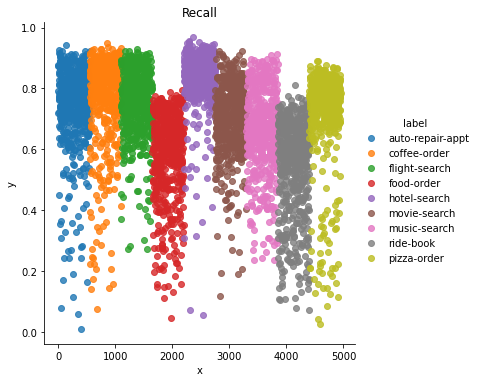

In [422]:
# graphing evaluation
recalls = pd.DataFrame(list(zip(eval_recall, eval_label)), columns=['y', 'label'])
recalls['x'] = recalls.index
print(recalls.head(5))
recall_graph = sns.lmplot(data=recalls, x='x', y='y', hue='label', 
                   fit_reg=False, legend=True, legend_out=True)
ax_recalls = plt.gca()
ax_recalls.set_title("Recall")

          y             label  x
0  0.790909  auto-repair-appt  0
1  0.720000  auto-repair-appt  1
2  0.872727  auto-repair-appt  2
3  0.876364  auto-repair-appt  3
4  0.916364  auto-repair-appt  4


[Text(0.5, 6.79999999999999, 'i-th utterance'),
 Text(17.784999999999997, 0.5, 'F1 score')]

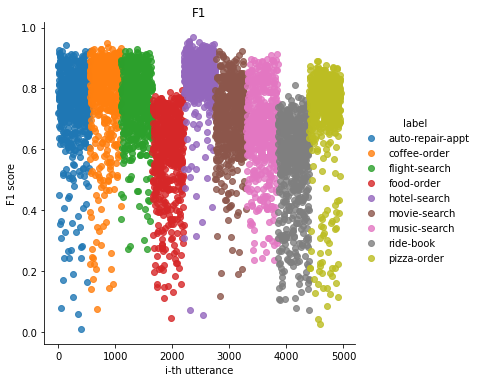

In [423]:
f1 = pd.DataFrame(list(zip(eval_f1, eval_label)), columns=['y', 'label'])
f1['x'] = f1.index
print(f1.head(5))
f1_graph = sns.lmplot(data=f1, x='x', y='y', hue='label', 
                   fit_reg=False, legend=True, legend_out=True)
ax_f1 = plt.gca()
ax_f1.set_title("F1")
ax_f1.set(xlabel = 'i-th utterance', ylabel = 'F1 score')

In [424]:
# sns.boxplot(data=f1, x='x', y='y', hue='label')

In [425]:
f1.head(5)

,y,label,x
0,0.790909,auto-repair-appt,0
1,0.720000,auto-repair-appt,1
2,0.872727,auto-repair-appt,2
3,0.876364,auto-repair-appt,3
4,0.916364,auto-repair-appt,4


In [426]:
eval_f1_means, eval_f1_stds = [], []
for label in ['pizza-order'] + clean_data_labels:
    eval_f1_means.append((label, f1[f1['label'] == label]['y'].mean()))
    eval_f1_stds.append((label, f1[f1['label'] == label]['y'].std()))
print("f1 means by label: ", eval_f1_means)
print("f1 STD by label: ", eval_f1_stds)

f1 means by label:  [('pizza-order', 0.7170214876033058), ('auto-repair-appt', 0.7408859504132231), ('coffee-order', 0.7744727272727272), ('flight-search', 0.7514611570247933), ('food-order', 0.5801289256198348), ('hotel-search', 0.8369685950413224), ('movie-search', 0.7027107438016529), ('music-search', 0.6608892561983472), ('ride-book', 0.5346611570247934)]
f1 STD by label:  [('pizza-order', 0.15701407398496658), ('auto-repair-appt', 0.14232202758251278), ('coffee-order', 0.14908212689048259), ('flight-search', 0.10809687575516395), ('food-order', 0.14523883314482958), ('hotel-search', 0.0945176220675085), ('movie-search', 0.11857223282454465), ('music-search', 0.13595249460855843), ('ride-book', 0.15520977336907563)]


          y             label  x
0  0.790909  auto-repair-appt  0
1  0.720000  auto-repair-appt  1
2  0.872727  auto-repair-appt  2
3  0.876364  auto-repair-appt  3
4  0.916364  auto-repair-appt  4


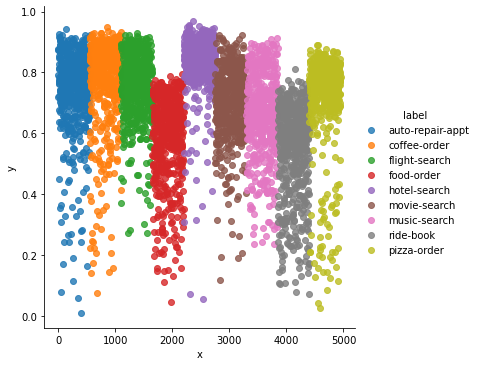

In [427]:
precision = pd.DataFrame(list(zip(eval_precision, eval_label)), columns=['y', 'label'])
precision['x'] = precision.index
print(f1.head(5))
f1_graph = sns.lmplot(data=precision, x='x', y='y', hue='label', 
                   fit_reg=False, legend=True, legend_out=True)

### Appendix: previous data cleaning attempts

In [183]:
# # train_dev_test_split = [0.6, 0.2, 0.2]
# train_corpus, dev_corpus, test_corpus = [], [], []
# for idx in corpus_label_counts.index.tolist():
#     label = idx[0]
#     all_data = dataset[dataset['label'] == label].reset_index(drop=True)
#     train_corpus.append(all_data[:int(len(all_data) * 0.6)])
#     dev_corpus.append(all_data[int(len(all_data) * 0.6) : int(len(all_data) * 0.7)])
#     test_corpus.append(all_data[int(len(all_data) * 0.7):])
# train_corpus = pd.concat(train_corpus)
# dev_corpus = pd.concat(dev_corpus)
# test_corpus = pd.concat(test_corpus)
# print("train data size: ", len(train_corpus), ", dev data size: ", len(dev_corpus), ", test data size: ", len(test_corpus))

train data size:  10228 , dev data size:  1706 , test data size:  5121


In [184]:
# print("train:\n")
# print(train_corpus['label'].value_counts())
# print("\n dev: \n")
# print(dev_corpus['label'].value_counts())
# print("\n test: \n")
# print(test_corpus['label'].value_counts())

train:

restaurant-search    1825
movie-search         1601
flight-search        1375
music-search          916
pizza-order           825
coffee-order          756
movie-ticket          727
auto-repair-appt      658
food-order            605
ride-book             598
restaurant-book       342
Name: label, dtype: int64

 dev: 

restaurant-search    304
movie-search         267
flight-search        230
music-search         152
pizza-order          138
coffee-order         126
movie-ticket         122
auto-repair-appt     110
food-order           101
ride-book             99
restaurant-book       57
Name: label, dtype: int64

 test: 

restaurant-search    913
movie-search         801
flight-search        688
music-search         459
pizza-order          413
coffee-order         378
movie-ticket         364
auto-repair-appt     330
food-order           303
ride-book            300
restaurant-book      172
Name: label, dtype: int64
